In [1]:
import pandas as pd
import numpy as np

import html2text

In [2]:
#!pip install matplotlib seaborn

In [3]:
local_dir = "/scratch/work/koutchc1/datasets/"
path = local_dir+"falconcode/falconcode_v1_table_runs.csv"
runs_df = pd.read_csv(path)
runs_df = runs_df[runs_df['score']!=-1]

In [4]:
path = local_dir+"falconcode/falconcode_v1_table_problems_updated.csv"
problems_df = pd.read_csv(path)
max_scores_df = problems_df#[['id', 'max_score', 'type']]
max_scores_df.rename(columns={'id': 'problem_id'}, inplace=True)
max_scores_df.drop_duplicates(subset=['problem_id'], keep='last', inplace=True)
max_scores_df.sort_values(by="problem_id",ascending=True)
max_scores_df

/tmp/ipykernel_11813/1404125263.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  max_scores_df.rename(columns={'id': 'problem_id'}, inplace=True)
/tmp/ipykernel_11813/1404125263.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  max_scores_df.drop_duplicates(subset=['problem_id'], keep='last', inplace=True)


,problem_id,max_score,type
4,pex3,0,project
5,pex1,100,project
6,lsn9_practice4,100,lab
7,lsn9_practice3,100,lab
8,lsn9_practice2,100,lab
...,...,...,...
656,a1_1_icbm,100,skill
657,a1_1_dorms,100,skill
658,a1_1_cadet,100,skill
659,a1_1_bases,100,skill


In [5]:
len(runs_df['problem_id'].unique())

469

In [13]:
len(problems_df['id'].unique())

422

In [14]:
# in problems_df but not in runs_df

set(problems_df['id'].unique() ) - set(runs_df['problem_id'].unique())

{'CS110_Ingenuity_Simulator_Spiral_1',
 'CS110_Ingenuity_Simulator_Spiral_2',
 'CS110_Ingenuity_Simulator_Spiral_3',
 'a1_7_pilot_quals'}

In [15]:
# in runs but not in problems

set(runs_df['problem_id'].unique()) - set(problems_df['id'].unique())

{'CAESAR',
 'Caesar_gc',
 'IPO_arrivaltime',
 'IPO_calories',
 'IPO_listrange',
 'IPO_math',
 'IPO_parking',
 'IPO_pointspread',
 'IPO_printpractice',
 'IPO_projectile',
 'Lsn7_lists',
 'Lsn8_practice1',
 'PEX1',
 'Pex1',
 'a1_5_woodshop',
 'a1_7_dog',
 'a2_4_caret',
 'a2_4_dollar',
 'a2_7_lowest_spec_def',
 'caesar_GC',
 'conditional_uod',
 'lists1_fastestcar',
 'lsn10_callme',
 'lsn10_imagesize',
 'lsn10_skill3',
 'lsn10_triangle',
 'lsn1_HelloWorld',
 'lsn21_bouncingballs',
 'lsn3_Parking',
 'lsn3_ascii',
 'lsn3_parking',
 'lsn3_printpractice',
 'lsn5_bit_representation',
 'lsn5_bits_to_bytes',
 'lsn5_bits_to_kmg',
 'lsn5_calories',
 'lsn5_math',
 'lsn5_projectile',
 'lsn5_temperature',
 'lsn6_atmosphere',
 'lsn6_classyear',
 'lsn6_largest',
 'lsn6_positive',
 'lsn7_fuel',
 'lsn7_lists',
 'lsn7_roundtrip',
 'lsn7_speeding',
 'lsn7_uod',
 'pex2',
 'pex2_gc',
 'skywriter'}

# Average student success score

In [16]:
average_scores = runs_df.groupby('problem_id')['score'].mean()
average_scores = average_scores.reset_index().sort_values(by="problem_id")
# average_scores.to_csv(local_dir+"scores.csv")
average_scores.sort_values(by="problem_id",ascending=True)
average_scores

,problem_id,score
0,Airstrike,0.000000
1,CAESAR,0.000000
2,Caesar_gc,0.000000
3,FileIO_echo,21.677588
4,FileIO_runways,15.940860
...,...,...
464,pex1,47.547568
465,pex2,0.117021
466,pex2_gc,1.146199
467,pex3,0.000000


In [17]:
score_df = pd.merge(average_scores, max_scores_df, on='problem_id')
score_df

,problem_id,score,max_score,type
0,Airstrike,0.000000,0,project
1,FileIO_echo,21.677588,100,lab
2,FileIO_runways,15.940860,100,lab
3,FileIO_survivors_by_gender,15.721590,100,lab
4,FileIO_titanicfares,18.516598,100,lab
...,...,...,...,...
413,lsn9_skill2,52.050863,100,skill
414,lsn9_skill3,78.997613,100,skill
415,lsn9_triangle,75.232198,100,lab
416,pex1,47.547568,100,project


In [11]:
keys = [problem for problem in score_df['problem_id']]
values = [[0,0] for problem in score_df['problem_id']]

success_dict = dict(zip(keys, values))
success_dict

{'Airstrike': [0, 0],
 'FileIO_echo': [0, 0],
 'FileIO_runways': [0, 0],
 'FileIO_survivors_by_gender': [0, 0],
 'FileIO_titanicfares': [0, 0],
 'FileIO_titanicsurvivor': [0, 0],
 'Graphics2_bouncingball': [0, 0],
 'Graphics2_bouncingtriangle': [0, 0],
 'Graphics3_paint': [0, 0],
 'Graphics3_soundboard': [0, 0],
 'IterLogic1_averagerun': [0, 0],
 'IterLogic1_cargocapacity': [0, 0],
 'IterLogic1_count': [0, 0],
 'IterLogic1_countby10s': [0, 0],
 'IterLogic1_dvc': [0, 0],
 'IterLogic1_squadrons': [0, 0],
 'IterLogic1_waittimes': [0, 0],
 'IterLogic2_class2017': [0, 0],
 'IterLogic2_coordinates': [0, 0],
 'IterLogic2_counting': [0, 0],
 'IterLogic2_football': [0, 0],
 'IterLogic2_printchars': [0, 0],
 'IterLogic2_timestable': [0, 0],
 'Lists1_fastestcar': [0, 0],
 'Lists1_listrange': [0, 0],
 'Lists1_pftscores': [0, 0],
 'Lists2_100m': [0, 0],
 'Lists2_credit': [0, 0],
 'Lists2_golf': [0, 0],
 'Lists2_movies': [0, 0],
 'Lists2_population': [0, 0],
 'Lists3_averagetraffic': [0, 0],
 'Lists

In [12]:
for i in range(len(runs_df)):
    row = runs_df.iloc[i]
    problem_id = row['problem_id']
    if len(score_df[score_df['problem_id']==problem_id]):
        max_score = score_df[score_df['problem_id']==problem_id]['max_score'].tolist()[0]
        student_score = float(row['score'])
        if student_score == max_score:
            success_dict[problem_id][0] += 1
        success_dict[problem_id][1] += 1
        print(i,success_dict[problem_id])

0 [1, 1]
1 [1, 1]
2 [1, 1]
3 [1, 1]
4 [2, 2]
5 [1, 1]
6 [0, 1]
7 [0, 1]
8 [0, 1]
9 [2, 2]
10 [0, 1]
11 [0, 2]
12 [0, 1]
13 [0, 2]
14 [0, 3]
15 [0, 4]
16 [0, 2]
17 [0, 3]
18 [0, 5]
19 [0, 6]
20 [0, 4]
21 [1, 1]
22 [1, 1]
23 [1, 1]
24 [1, 2]
25 [1, 3]
26 [1, 4]
27 [1, 5]
28 [1, 6]
29 [1, 7]
30 [1, 8]
31 [1, 9]
32 [1, 10]
33 [1, 11]
34 [1, 12]
35 [1, 13]
36 [1, 1]
38 [1, 1]
39 [2, 2]
40 [3, 3]
41 [0, 1]
42 [0, 2]
43 [0, 3]
44 [0, 4]
45 [0, 5]
46 [0, 6]
47 [0, 7]
48 [0, 1]
49 [0, 2]
50 [0, 3]
51 [0, 1]
52 [0, 2]
53 [0, 3]
54 [0, 4]
55 [0, 5]
56 [0, 1]
57 [0, 2]
58 [0, 1]
59 [0, 2]
60 [0, 3]
61 [0, 4]
62 [0, 5]
63 [0, 6]
64 [0, 7]
65 [0, 8]
66 [1, 3]
67 [0, 8]
68 [1, 1]
69 [1, 2]
70 [0, 9]
71 [0, 10]
72 [0, 11]
73 [0, 12]
74 [0, 13]
75 [0, 14]
76 [0, 15]
77 [0, 16]
78 [0, 17]
79 [0, 18]
80 [0, 19]
81 [0, 20]
82 [0, 21]
83 [0, 22]
84 [0, 23]
85 [0, 1]
86 [0, 2]
87 [0, 3]
88 [0, 4]
89 [0, 5]
90 [0, 6]
91 [2, 2]
92 [2, 3]
93 [2, 4]
94 [2, 5]
95 [1, 1]
96 [1, 2]
97 [1, 3]
98 [1, 1]
99 [1, 2]
10

676 [8, 39]
677 [3, 6]
678 [3, 7]
679 [3, 8]
680 [276, 276]
681 [0, 1]
682 [0, 2]
683 [2, 3]
684 [277, 277]
685 [278, 278]
686 [279, 279]
687 [280, 280]
688 [281, 281]
689 [1, 1]
690 [2, 2]
691 [3, 3]
692 [0, 1]
693 [0, 2]
694 [0, 1]
695 [0, 2]
696 [0, 1]
697 [0, 2]
698 [0, 3]
699 [0, 4]
700 [0, 5]
701 [0, 1]
702 [1, 1]
703 [0, 1]
704 [4, 4]
705 [5, 5]
706 [6, 6]
707 [7, 7]
708 [8, 8]
709 [9, 9]
710 [10, 10]
711 [11, 11]
712 [12, 12]
713 [13, 13]
714 [14, 14]
715 [1, 1]
716 [1, 2]
717 [1, 3]
718 [1, 1]
719 [1, 2]
720 [1, 3]
721 [1, 4]
722 [1, 5]
723 [1, 6]
724 [1, 7]
725 [1, 8]
726 [1, 9]
727 [1, 10]
728 [1, 11]
729 [1, 12]
730 [1, 13]
731 [1, 14]
732 [15, 15]
733 [1, 1]
734 [1, 2]
735 [1, 3]
736 [1, 4]
737 [1, 5]
738 [1, 6]
739 [1, 1]
740 [1, 2]
741 [1, 3]
742 [1, 4]
743 [1, 5]
744 [1, 6]
745 [1, 7]
746 [1, 8]
747 [1, 9]
748 [1, 10]
749 [1, 11]
750 [1, 7]
751 [1, 1]
752 [1, 2]
753 [1, 3]
754 [1, 12]
755 [1, 13]
756 [1, 14]
757 [1, 15]
758 [1, 8]
759 [1, 9]
760 [1, 10]
761 [1, 11]
762 

1777 [417, 417]
1778 [418, 418]
1779 [1, 2]
1780 [4, 7]
1781 [1, 5]
1782 [1, 6]
1783 [1, 1]
1784 [1, 1]
1785 [2, 3]
1786 [2, 4]
1787 [2, 5]
1788 [2, 6]
1789 [2, 7]
1790 [2, 8]
1791 [2, 9]
1792 [2, 10]
1793 [2, 11]
1794 [5, 8]
1795 [419, 419]
1796 [1, 7]
1797 [1, 8]
1798 [1, 9]
1799 [1, 10]
1800 [1, 11]
1801 [2, 2]
1802 [2, 2]
1803 [2, 3]
1804 [2, 4]
1805 [1, 12]
1806 [1, 13]
1807 [3, 26]
1808 [1, 14]
1809 [3, 27]
1810 [3, 28]
1811 [3, 29]
1812 [3, 30]
1813 [3, 3]
1814 [3, 4]
1815 [3, 13]
1816 [3, 14]
1817 [3, 15]
1818 [2, 5]
1819 [2, 6]
1820 [2, 7]
1821 [3, 16]
1822 [2, 8]
1823 [2, 5]
1824 [3, 6]
1825 [4, 7]
1826 [420, 420]
1827 [4, 8]
1828 [4, 9]
1829 [4, 10]
1830 [4, 11]
1831 [3, 4]
1832 [4, 5]
1833 [4, 6]
1834 [421, 421]
1835 [422, 422]
1836 [3, 31]
1837 [3, 32]
1838 [3, 33]
1839 [3, 34]
1840 [423, 423]
1841 [424, 424]
1842 [1, 3]
1843 [2, 4]
1845 [12, 12]
1846 [13, 13]
1847 [14, 14]
1848 [425, 425]
1849 [426, 426]
1850 [427, 427]
1851 [428, 428]
1852 [429, 429]
1853 [430, 430]
1854

3364 [345, 345]
3365 [346, 346]
3366 [347, 347]
3367 [348, 348]
3368 [349, 349]
3369 [350, 350]
3370 [351, 351]
3371 [352, 352]
3372 [353, 353]
3373 [354, 354]
3374 [355, 355]
3375 [356, 356]
3376 [357, 357]
3377 [358, 358]
3378 [359, 359]
3379 [360, 360]
3380 [361, 361]
3381 [362, 362]
3382 [363, 363]
3383 [364, 364]
3384 [365, 365]
3385 [366, 366]
3386 [367, 367]
3387 [368, 368]
3388 [369, 369]
3389 [370, 370]
3390 [371, 371]
3391 [372, 372]
3392 [373, 373]
3393 [374, 374]
3394 [375, 375]
3395 [376, 376]
3396 [377, 377]
3397 [378, 378]
3398 [379, 379]
3399 [380, 380]
3400 [381, 381]
3401 [382, 382]
3402 [383, 383]
3403 [384, 384]
3404 [385, 385]
3405 [386, 386]
3406 [387, 387]
3407 [388, 388]
3408 [389, 389]
3409 [390, 390]
3410 [391, 391]
3411 [392, 392]
3412 [393, 393]
3413 [394, 394]
3414 [395, 395]
3415 [396, 396]
3416 [397, 397]
3417 [398, 398]
3418 [399, 399]
3419 [400, 400]
3420 [401, 401]
3421 [402, 402]
3422 [403, 403]
3423 [404, 404]
3424 [405, 405]
3425 [406, 406]
3426 [40

4418 [16, 25]
4419 [16, 31]
4420 [30, 68]
4421 [6, 28]
4422 [17, 36]
4423 [16, 64]
4424 [9, 10]
4425 [13, 27]
4426 [9, 21]
4427 [15, 25]
4428 [17, 37]
4429 [16, 49]
4430 [10, 69]
4431 [12, 17]
4432 [14, 40]
4433 [16, 26]
4434 [8, 23]
4435 [16, 26]
4436 [13, 28]
4437 [8, 21]
4438 [9, 11]
4439 [16, 27]
4440 [5, 42]
4441 [16, 65]
4442 [17, 38]
4443 [16, 27]
4444 [8, 34]
4445 [17, 32]
4446 [17, 50]
4447 [16, 26]
4448 [8, 22]
4449 [11, 18]
4450 [10, 70]
4451 [16, 28]
4452 [14, 29]
4453 [17, 51]
4454 [18, 33]
4455 [13, 18]
4456 [16, 28]
4457 [8, 24]
4458 [6, 30]
4459 [6, 29]
4460 [10, 64]
4461 [18, 34]
4462 [6, 21]
4463 [12, 16]
4464 [17, 29]
4465 [17, 29]
4466 [18, 39]
4467 [19, 40]
4468 [13, 17]
4469 [17, 52]
4470 [10, 22]
4471 [17, 30]
4472 [7, 22]
4473 [10, 12]
4474 [18, 31]
4475 [15, 30]
4476 [18, 30]
4477 [11, 13]
4478 [19, 41]
4479 [8, 35]
4480 [18, 32]
4481 [17, 27]
4482 [16, 31]
4483 [6, 31]
4484 [11, 14]
4485 [7, 23]
4486 [10, 71]
4487 [7, 24]
4488 [16, 32]
4489 [18, 28]
4490 [9, 1

5272 [33, 94]
5273 [24, 43]
5274 [14, 72]
5275 [12, 104]
5276 [14, 73]
5277 [15, 125]
5278 [11, 32]
5279 [17, 155]
5280 [15, 74]
5281 [33, 95]
5282 [12, 44]
5283 [16, 126]
5284 [33, 96]
5285 [10, 38]
5286 [10, 39]
5287 [13, 63]
5288 [17, 47]
5289 [20, 51]
5290 [14, 77]
5291 [15, 75]
5292 [11, 46]
5293 [13, 64]
5294 [17, 156]
5295 [17, 48]
5296 [21, 37]
5297 [15, 76]
5298 [16, 127]
5299 [11, 47]
5300 [10, 40]
5301 [10, 41]
5302 [33, 97]
5303 [13, 45]
5304 [18, 157]
5305 [11, 52]
5306 [11, 48]
5307 [33, 98]
5308 [15, 77]
5309 [11, 49]
5310 [22, 40]
5311 [11, 53]
5312 [18, 158]
5313 [33, 99]
5314 [10, 42]
5315 [17, 49]
5316 [15, 78]
5317 [12, 105]
5318 [16, 139]
5319 [10, 43]
5320 [13, 46]
5321 [16, 128]
5322 [14, 65]
5323 [11, 54]
5324 [11, 55]
5325 [11, 50]
5326 [21, 38]
5327 [15, 79]
5328 [13, 47]
5329 [11, 44]
5330 [17, 129]
5331 [18, 22]
5332 [11, 56]
5333 [16, 140]
5334 [33, 100]
5335 [18, 159]
5336 [25, 44]
5337 [11, 45]
5338 [11, 33]
5339 [33, 101]
5340 [540, 540]
5341 [17, 130]
5

6161 [17, 51]
6162 [19, 189]
6163 [11, 66]
6164 [16, 158]
6165 [24, 79]
6166 [15, 139]
6167 [24, 109]
6168 [24, 27]
6169 [22, 148]
6170 [18, 52]
6171 [27, 84]
6172 [17, 136]
6173 [25, 191]
6174 [11, 67]
6175 [17, 137]
6176 [19, 103]
6177 [28, 34]
6178 [20, 190]
6180 [17, 138]
6181 [20, 191]
6182 [29, 35]
6183 [25, 192]
6184 [17, 74]
6185 [20, 192]
6186 [23, 149]
6187 [19, 104]
6188 [16, 159]
6189 [17, 75]
6190 [20, 193]
6191 [0, 9]
6192 [24, 113]
6193 [11, 68]
6194 [24, 88]
6195 [35, 100]
6196 [29, 36]
6197 [23, 150]
6198 [19, 105]
6199 [5, 55]
6200 [25, 28]
6201 [29, 51]
6202 [20, 194]
6203 [25, 193]
6204 [28, 85]
6205 [24, 80]
6206 [29, 37]
6207 [23, 151]
6208 [38, 52]
6209 [17, 76]
6210 [549, 549]
6211 [25, 81]
6212 [25, 82]
6213 [16, 140]
6214 [29, 38]
6215 [17, 139]
6216 [25, 194]
6217 [20, 195]
6218 [550, 550]
6219 [0, 10]
6220 [29, 39]
6221 [19, 106]
6222 [17, 77]
6223 [25, 83]
6224 [30, 54]
6225 [17, 140]
6226 [20, 196]
6227 [26, 101]
6228 [17, 160]
6229 [30, 52]
6230 [31, 55]


7066 [24, 88]
7067 [28, 67]
7068 [21, 117]
7069 [21, 118]
7070 [21, 119]
7071 [21, 120]
7072 [562, 562]
7073 [563, 563]
7074 [27, 105]
7075 [21, 121]
7076 [5, 6]
7077 [21, 122]
7078 [22, 123]
7079 [4, 29]
7080 [17, 184]
7081 [7, 27]
7082 [27, 106]
7083 [7, 67]
7084 [22, 124]
7085 [7, 24]
7086 [17, 185]
7087 [22, 125]
7088 [27, 107]
7089 [0, 11]
7090 [22, 126]
7091 [27, 108]
7092 [564, 564]
7093 [22, 127]
7094 [28, 109]
7095 [22, 128]
7096 [0, 1]
7097 [45, 82]
7098 [18, 186]
7099 [9, 22]
7100 [11, 48]
7101 [29, 110]
7102 [18, 187]
7103 [29, 111]
7104 [7, 12]
7105 [18, 188]
7106 [6, 29]
7107 [565, 565]
7108 [18, 189]
7109 [29, 112]
7110 [29, 113]
7111 [0, 12]
7112 [22, 129]
7113 [0, 13]
7114 [29, 114]
7115 [566, 566]
7116 [19, 190]
7117 [29, 115]
7118 [19, 191]
7119 [29, 116]
7120 [0, 14]
7121 [19, 192]
7122 [22, 130]
7123 [19, 193]
7124 [29, 117]
7125 [0, 15]
7126 [19, 194]
7127 [29, 118]
7128 [29, 119]
7129 [22, 131]
7130 [29, 120]
7131 [29, 121]
7132 [22, 132]
7133 [29, 122]
7134 [22,

8022 [26, 234]
8023 [26, 235]
8024 [50, 156]
8025 [33, 98]
8026 [25, 190]
8027 [50, 157]
8028 [36, 135]
8029 [28, 100]
8030 [27, 101]
8031 [34, 143]
8032 [59, 87]
8033 [25, 191]
8034 [50, 158]
8035 [34, 146]
8036 [34, 147]
8037 [32, 195]
8038 [35, 134]
8039 [51, 159]
8040 [28, 84]
8041 [25, 192]
8042 [27, 102]
8043 [33, 99]
8044 [51, 85]
8045 [32, 300]
8046 [24, 118]
8047 [30, 40]
8048 [27, 103]
8049 [24, 119]
8050 [26, 236]
8051 [28, 85]
8052 [29, 86]
8053 [35, 148]
8054 [30, 41]
8055 [48, 53]
8056 [53, 72]
8057 [24, 120]
8058 [34, 159]
8059 [36, 149]
8060 [26, 237]
8061 [25, 193]
8062 [29, 87]
8063 [28, 101]
8064 [27, 104]
8065 [33, 196]
8066 [28, 102]
8067 [31, 42]
8068 [32, 43]
8069 [51, 160]
8070 [43, 70]
8071 [29, 88]
8072 [35, 144]
8073 [28, 105]
8074 [32, 44]
8075 [42, 60]
8076 [30, 97]
8077 [34, 100]
8078 [24, 121]
8079 [34, 160]
8080 [36, 150]
8081 [25, 194]
8082 [26, 169]
8083 [41, 132]
8084 [34, 101]
8085 [42, 61]
8086 [28, 106]
8087 [26, 170]
8088 [28, 103]
8089 [42, 63]
8

8789 [41, 59]
8790 [39, 325]
8791 [35, 313]
8792 [27, 270]
8793 [35, 314]
8794 [27, 271]
8795 [27, 272]
8796 [33, 282]
8797 [32, 246]
8798 [27, 273]
8799 [35, 88]
8800 [53, 189]
8801 [27, 274]
8802 [35, 120]
8803 [33, 283]
8804 [40, 109]
8805 [39, 326]
8806 [40, 161]
8807 [36, 315]
8808 [33, 284]
8809 [27, 275]
8810 [32, 247]
8811 [32, 98]
8812 [28, 276]
8813 [32, 248]
8814 [28, 277]
8815 [28, 278]
8816 [36, 316]
8817 [32, 99]
8818 [42, 60]
8819 [39, 327]
8820 [33, 285]
8821 [30, 124]
8822 [39, 328]
8823 [39, 329]
8824 [28, 279]
8825 [33, 286]
8826 [54, 136]
8827 [28, 280]
8828 [47, 85]
8829 [36, 216]
8830 [28, 281]
8831 [36, 317]
8832 [42, 73]
8833 [28, 282]
8834 [36, 318]
8835 [30, 125]
8836 [36, 121]
8837 [25, 133]
8838 [33, 287]
8839 [39, 330]
8840 [40, 110]
8841 [30, 126]
8842 [36, 319]
8843 [55, 62]
8844 [28, 283]
8845 [28, 284]
8846 [28, 285]
8847 [36, 217]
8848 [33, 288]
8849 [28, 286]
8850 [33, 289]
8851 [47, 86]
8852 [36, 320]
8853 [33, 100]
8854 [36, 89]
8855 [28, 287]
8856 

9572 [44, 190]
9573 [44, 191]
9574 [39, 228]
9575 [51, 176]
9576 [51, 177]
9577 [40, 229]
9578 [44, 192]
9579 [55, 101]
9580 [42, 137]
9581 [11, 45]
9582 [81, 115]
9583 [42, 138]
9584 [44, 193]
9585 [51, 178]
9586 [44, 194]
9587 [44, 195]
9588 [40, 230]
9589 [51, 179]
9590 [51, 180]
9591 [33, 152]
9592 [42, 139]
9593 [43, 140]
9594 [40, 231]
9595 [44, 195]
9596 [43, 141]
9597 [33, 153]
9598 [31, 245]
9599 [31, 246]
9600 [31, 247]
9601 [31, 248]
9602 [27, 238]
9603 [28, 239]
9604 [29, 240]
9605 [31, 249]
9606 [31, 250]
9607 [38, 168]
9608 [31, 251]
9609 [32, 252]
9610 [30, 241]
9611 [38, 169]
9612 [32, 253]
9613 [38, 170]
9614 [30, 242]
9615 [30, 243]
9616 [38, 171]
9617 [30, 244]
9618 [38, 172]
9619 [38, 173]
9620 [30, 245]
9621 [38, 174]
9622 [30, 246]
9623 [37, 329]
9624 [38, 175]
9625 [37, 162]
9626 [30, 247]
9627 [36, 110]
9628 [32, 254]
9629 [51, 76]
9630 [38, 176]
9631 [31, 248]
9632 [60, 148]
9633 [59, 92]
9634 [31, 249]
9635 [38, 177]
9636 [44, 142]
9637 [38, 178]
9638 [42, 351

10542 [66, 110]
10543 [64, 136]
10544 [49, 170]
10545 [66, 157]
10546 [61, 96]
10547 [69, 104]
10548 [64, 137]
10549 [44, 70]
10550 [44, 412]
10551 [43, 210]
10552 [71, 118]
10553 [70, 99]
10554 [51, 146]
10555 [0, 11]
10556 [46, 146]
10557 [47, 67]
10558 [61, 97]
10559 [67, 111]
10560 [72, 80]
10561 [64, 138]
10562 [61, 91]
10563 [66, 158]
10564 [65, 139]
10565 [51, 147]
10566 [62, 92]
10567 [54, 90]
10568 [67, 112]
10569 [55, 91]
10570 [71, 119]
10571 [53, 95]
10572 [66, 159]
10573 [44, 71]
10574 [52, 214]
10575 [71, 100]
10576 [47, 147]
10577 [55, 92]
10578 [44, 413]
10579 [45, 72]
10580 [68, 113]
10581 [78, 100]
10582 [65, 140]
10583 [67, 160]
10584 [70, 105]
10585 [52, 148]
10586 [71, 106]
10587 [69, 114]
10588 [67, 161]
10589 [52, 215]
10590 [55, 93]
10591 [67, 162]
10592 [62, 93]
10593 [72, 101]
10594 [79, 101]
10595 [72, 120]
10596 [47, 240]
10597 [48, 148]
10598 [70, 115]
10599 [42, 137]
10600 [62, 94]
10601 [40, 176]
10602 [79, 102]
10603 [63, 95]
10604 [56, 94]
10605 [73, 10

11726 [61, 313]
11727 [5, 22]
11728 [61, 314]
11729 [51, 168]
11730 [68, 144]
11731 [70, 107]
11732 [78, 185]
11733 [5, 43]
11734 [82, 114]
11735 [59, 191]
11736 [57, 225]
11737 [47, 75]
11738 [78, 87]
11739 [53, 156]
11740 [54, 270]
11741 [20, 88]
11742 [51, 191]
11743 [79, 88]
11744 [54, 271]
11745 [53, 181]
11746 [48, 202]
11747 [54, 157]
11748 [59, 192]
11749 [62, 315]
11750 [80, 89]
11751 [100, 137]
11752 [7, 65]
11753 [53, 184]
11754 [51, 192]
11755 [60, 193]
11756 [54, 158]
11757 [49, 203]
11758 [50, 205]
11759 [54, 272]
11760 [53, 185]
11761 [71, 108]
11762 [53, 83]
11763 [54, 159]
11764 [79, 186]
11765 [88, 111]
11766 [60, 236]
11767 [5, 44]
11768 [72, 109]
11769 [42, 319]
11770 [63, 90]
11771 [79, 187]
11772 [101, 138]
11773 [81, 90]
11774 [64, 91]
11775 [78, 119]
11776 [83, 115]
11777 [5, 45]
11778 [53, 143]
11779 [81, 91]
11780 [62, 316]
11781 [53, 182]
11782 [60, 194]
11783 [60, 237]
11784 [76, 127]
11785 [2, 20]
11786 [5, 46]
11787 [101, 139]
11788 [69, 145]
11789 [59, 20

12354 [59, 258]
12355 [59, 259]
12356 [55, 378]
12357 [59, 260]
12358 [60, 261]
12359 [61, 393]
12360 [62, 394]
12361 [62, 395]
12362 [62, 396]
12363 [62, 397]
12364 [62, 398]
12365 [60, 262]
12366 [60, 263]
12367 [62, 399]
12368 [56, 379]
12369 [1, 1]
12370 [60, 264]
12371 [2, 2]
12372 [60, 265]
12373 [60, 266]
12374 [60, 267]
12375 [62, 400]
12376 [62, 401]
12377 [62, 402]
12378 [2, 3]
12379 [62, 403]
12380 [62, 404]
12381 [2, 4]
12382 [60, 268]
12383 [57, 380]
12384 [61, 269]
12385 [2, 5]
12386 [2, 6]
12387 [2, 7]
12388 [57, 381]
12389 [57, 382]
12390 [62, 405]
12391 [61, 270]
12392 [2, 8]
12393 [2, 9]
12394 [62, 406]
12395 [62, 271]
12396 [62, 407]
12397 [62, 408]
12398 [70, 386]
12399 [62, 409]
12400 [10, 64]
12401 [62, 410]
12402 [57, 383]
12403 [71, 387]
12404 [63, 411]
12405 [71, 388]
12406 [62, 272]
12407 [57, 384]
12408 [10, 65]
12409 [10, 66]
12410 [63, 273]
12411 [57, 385]
12412 [10, 67]
12413 [63, 274]
12414 [63, 275]
12415 [71, 389]
12416 [10, 68]
12417 [628, 628]
12418 [

13512 [97, 661]
13513 [86, 635]
13514 [97, 662]
13515 [97, 663]
13516 [98, 414]
13517 [97, 664]
13518 [99, 415]
13519 [97, 665]
13520 [98, 666]
13521 [98, 667]
13522 [86, 636]
13523 [98, 668]
13524 [87, 637]
13525 [117, 665]
13526 [98, 669]
13527 [99, 416]
13528 [98, 670]
13529 [98, 671]
13530 [99, 417]
13531 [657, 657]
13532 [98, 672]
13533 [8, 74]
13534 [658, 658]
13535 [100, 418]
13536 [87, 638]
13537 [117, 666]
13538 [87, 639]
13539 [100, 419]
13540 [98, 673]
13541 [98, 674]
13542 [98, 675]
13543 [87, 640]
13544 [117, 667]
13545 [100, 420]
13546 [98, 676]
13547 [99, 677]
13548 [117, 668]
13549 [87, 641]
13550 [99, 678]
13551 [99, 679]
13552 [100, 421]
13553 [87, 642]
13554 [14, 37]
13555 [99, 680]
13556 [87, 643]
13557 [99, 681]
13558 [100, 422]
13559 [117, 669]
13560 [8, 75]
13561 [117, 670]
13562 [100, 423]
13563 [659, 659]
13564 [99, 682]
13565 [87, 644]
13566 [8, 76]
13567 [117, 671]
13568 [117, 672]
13569 [99, 683]
13570 [100, 424]
13571 [99, 684]
13572 [100, 685]
13573 [8, 77

14714 [140, 1019]
14715 [141, 1020]
14716 [132, 956]
14717 [132, 957]
14718 [171, 920]
14719 [141, 1021]
14720 [132, 958]
14721 [132, 959]
14722 [132, 960]
14723 [171, 921]
14724 [132, 961]
14725 [132, 962]
14726 [132, 963]
14727 [142, 1022]
14728 [132, 964]
14729 [142, 1023]
14730 [132, 965]
14731 [171, 922]
14732 [144, 573]
14733 [132, 966]
14734 [142, 1024]
14735 [171, 923]
14736 [142, 1025]
14737 [132, 967]
14738 [171, 924]
14739 [132, 968]
14740 [171, 925]
14741 [132, 969]
14742 [132, 970]
14743 [142, 1026]
14744 [145, 574]
14745 [142, 1027]
14746 [142, 1028]
14747 [171, 926]
14748 [142, 1029]
14749 [6, 33]
14750 [132, 971]
14751 [171, 927]
14752 [142, 1030]
14753 [132, 972]
14754 [132, 973]
14755 [142, 1031]
14756 [142, 1032]
14757 [145, 575]
14758 [145, 576]
14759 [142, 1033]
14760 [133, 974]
14761 [142, 1034]
14762 [133, 975]
14763 [142, 1035]
14764 [142, 1036]
14765 [142, 1037]
14766 [143, 1038]
14767 [143, 1039]
14768 [143, 1040]
14769 [145, 577]
14770 [711, 711]
14771 [171, 

15698 [199, 1084]
15699 [161, 1263]
15700 [180, 692]
15701 [200, 1085]
15702 [169, 1281]
15703 [161, 1264]
15704 [162, 1265]
15705 [200, 1086]
15706 [169, 1282]
15707 [200, 1087]
15708 [169, 1283]
15709 [169, 1284]
15710 [162, 1266]
15711 [162, 1267]
15712 [14, 34]
15713 [180, 693]
15714 [162, 1268]
15715 [169, 1285]
15716 [169, 1286]
15717 [169, 1287]
15718 [169, 1288]
15719 [200, 1088]
15720 [162, 1269]
15721 [200, 1089]
15722 [736, 736]
15723 [201, 1090]
15724 [169, 1289]
15725 [201, 1091]
15726 [201, 1092]
15727 [162, 1270]
15728 [201, 1093]
15729 [737, 737]
15730 [180, 694]
15731 [162, 1271]
15732 [201, 1094]
15733 [201, 1095]
15734 [201, 1096]
15735 [201, 1097]
15736 [12, 77]
15737 [181, 695]
15738 [201, 1098]
15739 [201, 1099]
15740 [201, 1100]
15741 [170, 1290]
15742 [738, 738]
15743 [201, 1101]
15744 [181, 696]
15745 [201, 1102]
15746 [201, 1103]
15747 [202, 1104]
15748 [202, 1105]
15749 [170, 1291]
15750 [163, 1272]
15751 [202, 1106]
15752 [171, 1292]
15753 [171, 1293]
15754 

17106 [221, 1695]
17107 [771, 771]
17108 [221, 1696]
17109 [62, 260]
17110 [221, 1697]
17111 [71, 312]
17112 [261, 1349]
17113 [221, 1698]
17114 [96, 120]
17115 [221, 1699]
17116 [243, 920]
17117 [772, 772]
17118 [96, 121]
17119 [261, 1350]
17120 [221, 1700]
17121 [243, 921]
17122 [244, 922]
17123 [55, 415]
17124 [244, 923]
17125 [262, 1351]
17126 [71, 313]
17127 [262, 1352]
17128 [244, 924]
17129 [262, 1353]
17130 [55, 211]
17131 [244, 925]
17132 [262, 1354]
17133 [214, 1607]
17134 [55, 416]
17135 [215, 1608]
17136 [216, 1609]
17137 [263, 1355]
17138 [55, 417]
17139 [71, 314]
17140 [216, 1610]
17141 [222, 1701]
17142 [61, 198]
17143 [222, 1702]
17144 [216, 1611]
17145 [55, 418]
17146 [72, 315]
17147 [90, 123]
17148 [773, 773]
17149 [774, 774]
17150 [72, 316]
17151 [80, 132]
17152 [37, 167]
17153 [244, 926]
17154 [216, 1612]
17155 [54, 187]
17156 [216, 1613]
17157 [263, 1356]
17158 [56, 86]
17159 [50, 192]
17160 [55, 189]
17161 [40, 390]
17162 [80, 120]
17163 [216, 1614]
17164 [53, 233

18107 [62, 224]
18108 [72, 168]
18109 [85, 198]
18110 [64, 115]
18111 [63, 215]
18112 [63, 216]
18113 [61, 255]
18114 [63, 225]
18115 [57, 201]
18116 [44, 211]
18117 [92, 111]
18118 [88, 159]
18119 [84, 349]
18120 [61, 256]
18121 [226, 1756]
18122 [226, 1757]
18123 [58, 248]
18124 [84, 130]
18125 [88, 160]
18126 [88, 161]
18127 [63, 217]
18128 [64, 218]
18129 [63, 216]
18130 [62, 296]
18131 [64, 219]
18132 [93, 112]
18133 [58, 249]
18134 [93, 113]
18135 [248, 948]
18136 [72, 169]
18137 [61, 158]
18138 [84, 350]
18139 [73, 122]
18140 [57, 202]
18141 [226, 1758]
18142 [64, 220]
18143 [57, 197]
18144 [57, 203]
18145 [64, 221]
18146 [84, 351]
18147 [75, 109]
18148 [63, 217]
18149 [64, 222]
18150 [64, 472]
18151 [226, 1759]
18152 [64, 223]
18153 [72, 170]
18154 [226, 1760]
18155 [113, 151]
18156 [57, 198]
18157 [93, 114]
18158 [64, 224]
18159 [58, 250]
18160 [86, 137]
18161 [64, 225]
18162 [52, 173]
18163 [64, 226]
18164 [64, 218]
18165 [58, 204]
18166 [87, 130]
18167 [114, 152]
18168 [73, 

18980 [50, 240]
18981 [70, 532]
18982 [68, 322]
18983 [59, 550]
18984 [62, 243]
18985 [47, 479]
18986 [59, 551]
18987 [85, 363]
18988 [53, 412]
18989 [261, 999]
18990 [226, 1669]
18991 [70, 533]
18992 [261, 1000]
18993 [66, 241]
18994 [50, 241]
18995 [227, 1670]
18996 [59, 552]
18997 [59, 553]
18998 [227, 1671]
18999 [62, 244]
19000 [48, 480]
19001 [50, 242]
19002 [66, 242]
19003 [53, 413]
19004 [227, 1672]
19005 [61, 212]
19006 [227, 1673]
19007 [68, 230]
19008 [59, 554]
19009 [53, 414]
19010 [67, 243]
19011 [59, 555]
19012 [59, 476]
19013 [50, 243]
19014 [62, 245]
19015 [98, 132]
19016 [54, 415]
19017 [59, 556]
19018 [781, 781]
19019 [227, 1674]
19020 [69, 231]
19021 [67, 244]
19022 [49, 481]
19023 [62, 246]
19024 [54, 416]
19025 [59, 557]
19026 [57, 86]
19027 [53, 236]
19028 [228, 1675]
19029 [59, 558]
19030 [69, 232]
19031 [62, 247]
19032 [50, 244]
19033 [59, 477]
19034 [68, 269]
19035 [57, 87]
19036 [50, 482]
19037 [229, 1676]
19038 [61, 213]
19039 [54, 417]
19040 [59, 559]
19041 

20251 [30, 143]
20252 [805, 805]
20253 [285, 1086]
20254 [30, 144]
20255 [249, 1805]
20256 [249, 1806]
20257 [309, 1551]
20258 [258, 2063]
20259 [258, 2064]
20260 [249, 1807]
20261 [249, 1808]
20262 [249, 1809]
20263 [9, 27]
20264 [258, 2065]
20265 [249, 1810]
20266 [258, 2066]
20267 [310, 1552]
20268 [311, 1553]
20269 [258, 2067]
20270 [311, 1554]
20271 [249, 1811]
20272 [249, 1812]
20273 [286, 1087]
20274 [249, 1813]
20275 [806, 806]
20276 [311, 1555]
20277 [258, 2068]
20278 [311, 1556]
20279 [311, 1557]
20280 [258, 2069]
20281 [311, 1558]
20282 [312, 1559]
20283 [250, 1814]
20284 [3, 4]
20285 [8, 44]
20286 [250, 1815]
20287 [8, 45]
20288 [259, 2070]
20289 [250, 1816]
20290 [259, 2071]
20291 [312, 1560]
20292 [313, 1561]
20293 [259, 2072]
20294 [250, 1817]
20295 [807, 807]
20296 [259, 2073]
20297 [313, 1562]
20298 [313, 1563]
20299 [259, 2074]
20300 [808, 808]
20301 [4, 5]
20302 [313, 1564]
20303 [259, 2075]
20304 [251, 1818]
20305 [8, 46]
20306 [251, 1819]
20307 [313, 1565]
20308 [2

22179 [8, 10]
22190 [1098, 1136]
22191 [11, 23]
22193 [12, 24]
22219 [8, 11]
22220 [9, 12]
22226 [12, 25]
22227 [12, 26]
22263 [10, 13]
22266 [11, 14]
22287 [12, 27]
22316 [13, 28]
22320 [12, 15]
22431 [7, 7]
22465 [1099, 1137]
22466 [1099, 1138]
22467 [1100, 1139]
22472 [13, 16]
22474 [13, 29]
22475 [13, 30]
22476 [13, 31]
22477 [14, 32]
22483 [3, 8]
22484 [3, 9]
22486 [4, 10]
22496 [3, 3]
22499 [8, 8]
22503 [14, 17]
22507 [15, 33]
22509 [2, 9]
22514 [2, 10]
22516 [2, 11]
22517 [2, 12]
22520 [3, 13]
22527 [1101, 1140]
22528 [1102, 1141]
22529 [14, 18]
22531 [4, 8]
22534 [1103, 1142]
22535 [4, 9]
22537 [14, 19]
22538 [1103, 1143]
22539 [15, 20]
22540 [4, 10]
22545 [4, 11]
22546 [1103, 1144]
22548 [1104, 1145]
22550 [4, 12]
22552 [1104, 1146]
22554 [4, 13]
22555 [5, 14]
22556 [1105, 1147]
22562 [1105, 1148]
22567 [3, 4]
22568 [3, 5]
22569 [3, 6]
22571 [3, 7]
22572 [3, 8]
22573 [3, 9]
22574 [3, 10]
22575 [3, 11]
22576 [3, 12]
22605 [15, 34]
22618 [15, 21]
22624 [16, 22]
22639 [16, 35]
22

25885 [95, 148]
25886 [105, 427]
25887 [105, 428]
25888 [105, 429]
25895 [106, 430]
25910 [6, 21]
25911 [7, 22]
25912 [15, 29]
25913 [16, 30]
25914 [17, 31]
25915 [8, 23]
25936 [95, 149]
25940 [106, 431]
25946 [106, 432]
25947 [106, 433]
25948 [106, 434]
25951 [106, 435]
25952 [107, 436]
25954 [108, 437]
25964 [109, 438]
25965 [110, 439]
25966 [111, 440]
25972 [1130, 1187]
25996 [1130, 1188]
25999 [1131, 1189]
26000 [1131, 1190]
26001 [1131, 1191]
26002 [1131, 1192]
26003 [1131, 1193]
26014 [1132, 1194]
26018 [1133, 1195]
26023 [95, 150]
26024 [1134, 1196]
26025 [111, 441]
26026 [112, 442]
26027 [113, 443]
26028 [114, 444]
26029 [115, 445]
26032 [95, 151]
26033 [116, 446]
26034 [1135, 1197]
26036 [1136, 1198]
26037 [96, 152]
26038 [117, 447]
26046 [118, 448]
26047 [118, 449]
26048 [97, 153]
26049 [119, 450]
26050 [120, 451]
26056 [120, 452]
26059 [120, 453]
26060 [121, 454]
26125 [98, 154]
26127 [121, 455]
26128 [121, 456]
26129 [27, 99]
26130 [121, 457]
26131 [27, 100]
26132 [28, 101]

28251 [163, 714]
28252 [163, 715]
28255 [163, 716]
28258 [163, 717]
28259 [163, 718]
28260 [163, 719]
28263 [163, 720]
28264 [163, 721]
28271 [163, 722]
28272 [163, 723]
28273 [163, 724]
28274 [163, 725]
28277 [163, 726]
28280 [164, 727]
28281 [164, 728]
28285 [164, 729]
28286 [165, 730]
28287 [165, 731]
28295 [165, 732]
28297 [165, 733]
28303 [38, 135]
28305 [38, 136]
28308 [38, 137]
28311 [39, 138]
28313 [151, 244]
28323 [165, 734]
28326 [165, 735]
28327 [40, 139]
28329 [165, 736]
28330 [165, 737]
28334 [37, 91]
28335 [165, 738]
28337 [166, 739]
28338 [166, 740]
28339 [166, 741]
28341 [166, 742]
28344 [167, 743]
28346 [168, 744]
28348 [169, 745]
28352 [169, 746]
28353 [169, 747]
28356 [170, 748]
28360 [170, 749]
28367 [170, 750]
28373 [151, 245]
28375 [170, 751]
28377 [151, 246]
28378 [170, 752]
28379 [151, 247]
28380 [151, 248]
28381 [152, 249]
28382 [152, 250]
28383 [152, 251]
28384 [170, 753]
28385 [153, 252]
28386 [170, 754]
28387 [170, 755]
28388 [170, 756]
28390 [171, 757]
2839

29268 [201, 1040]
29269 [201, 1041]
29271 [32, 78]
29273 [201, 1042]
29278 [32, 79]
29279 [201, 1043]
29282 [33, 80]
29283 [202, 1044]
29284 [203, 1045]
29285 [204, 1046]
29286 [204, 1047]
29289 [193, 344]
29290 [204, 1048]
29292 [204, 1049]
29295 [205, 1050]
29299 [206, 1051]
29304 [193, 345]
29309 [194, 346]
29310 [206, 1052]
29311 [43, 100]
29314 [194, 347]
29315 [206, 1053]
29321 [206, 1054]
29328 [206, 1055]
29329 [195, 348]
29330 [1160, 1244]
29333 [206, 1056]
29334 [206, 1057]
29335 [206, 1058]
29336 [206, 1059]
29338 [1161, 1245]
29340 [206, 1060]
29341 [206, 1061]
29343 [206, 1062]
29344 [28, 168]
29345 [196, 349]
29348 [28, 169]
29349 [206, 1063]
29350 [206, 1064]
29351 [206, 1065]
29352 [28, 170]
29354 [206, 1066]
29355 [29, 171]
29356 [206, 1067]
29358 [206, 1068]
29359 [207, 1069]
29361 [207, 1070]
29363 [207, 1071]
29365 [207, 1072]
29366 [207, 1073]
29368 [207, 1074]
29369 [207, 1075]
29370 [197, 350]
29371 [47, 158]
29373 [207, 1076]
29377 [208, 1077]
29379 [208, 1078]


30404 [273, 1403]
30406 [1166, 1250]
30407 [249, 471]
30408 [274, 1404]
30412 [31, 201]
30413 [274, 1405]
30421 [274, 1406]
30429 [250, 472]
30433 [274, 1407]
30435 [274, 1408]
30437 [274, 1409]
30443 [275, 1410]
30444 [275, 1411]
30447 [275, 1412]
30450 [276, 1413]
30451 [276, 1414]
30453 [276, 1415]
30454 [276, 1416]
30455 [276, 1417]
30457 [276, 1418]
30458 [276, 1419]
30459 [276, 1420]
30460 [277, 1421]
30461 [277, 1422]
30466 [277, 1423]
30467 [278, 1424]
30468 [251, 473]
30469 [278, 1425]
30479 [279, 1426]
30480 [252, 474]
30481 [280, 1427]
30483 [281, 1428]
30486 [282, 1429]
30488 [282, 1430]
30490 [282, 1431]
30492 [31, 202]
30495 [282, 1432]
30498 [31, 203]
30501 [283, 1433]
30502 [283, 1434]
30503 [283, 1435]
30505 [284, 1436]
30507 [285, 1437]
30509 [52, 184]
30510 [31, 204]
30511 [253, 475]
30513 [285, 1438]
30514 [31, 205]
30515 [285, 1439]
30517 [286, 1440]
30520 [31, 206]
30522 [286, 1441]
30524 [31, 207]
30525 [286, 1442]
30529 [286, 1443]
30530 [286, 1444]
30532 [286, 

31735 [56, 139]
31737 [42, 98]
31738 [56, 140]
31740 [42, 99]
31742 [67, 246]
31743 [56, 141]
31745 [43, 100]
31746 [332, 615]
31747 [44, 101]
31749 [366, 2019]
31751 [67, 247]
31753 [366, 2020]
31754 [68, 248]
31755 [47, 76]
31756 [57, 142]
31758 [332, 616]
31760 [333, 617]
31761 [58, 143]
31762 [58, 144]
31763 [68, 249]
31766 [366, 2021]
31768 [58, 145]
31781 [334, 618]
31784 [335, 619]
31785 [68, 250]
31786 [69, 251]
31787 [16, 42]
31788 [366, 2022]
31790 [25, 45]
31791 [367, 2023]
31793 [59, 146]
31794 [367, 2024]
31795 [367, 2025]
31796 [367, 2026]
31797 [367, 2027]
31798 [69, 252]
31801 [69, 253]
31802 [367, 2028]
31805 [70, 254]
31806 [368, 2029]
31818 [368, 2030]
31819 [70, 255]
31820 [71, 256]
31821 [368, 2031]
31823 [336, 620]
31824 [1168, 1253]
31825 [369, 2032]
31826 [369, 2033]
31828 [337, 621]
31829 [369, 2034]
31830 [1168, 1254]
31833 [338, 622]
31834 [370, 2035]
31835 [371, 2036]
31836 [339, 623]
31839 [340, 624]
31840 [71, 257]
31842 [71, 258]
31843 [71, 259]
31844 [34

33955 [204, 686]
33957 [402, 721]
33961 [402, 722]
33962 [204, 687]
33964 [204, 688]
33968 [402, 723]
33970 [402, 724]
33977 [402, 725]
33982 [402, 726]
33983 [402, 727]
33985 [402, 728]
33986 [403, 729]
33987 [63, 361]
33988 [63, 362]
33989 [404, 730]
33991 [63, 363]
33993 [405, 731]
33994 [436, 2413]
33995 [436, 2414]
33996 [205, 689]
33997 [436, 2415]
33998 [436, 2416]
34000 [436, 2417]
34001 [63, 364]
34002 [437, 2418]
34003 [437, 2419]
34004 [63, 365]
34005 [406, 732]
34006 [64, 366]
34007 [437, 2420]
34008 [407, 733]
34010 [219, 376]
34011 [437, 2421]
34012 [437, 2422]
34013 [96, 173]
34014 [220, 377]
34015 [205, 690]
34016 [437, 2423]
34017 [205, 691]
34018 [205, 692]
34019 [408, 734]
34020 [437, 2424]
34022 [437, 2425]
34023 [205, 693]
34024 [438, 2426]
34025 [438, 2427]
34026 [439, 2428]
34027 [440, 2429]
34028 [441, 2430]
34029 [205, 694]
34030 [442, 2431]
34033 [78, 203]
34034 [79, 204]
34036 [443, 2432]
34037 [97, 174]
34039 [221, 378]
34044 [444, 2433]
34050 [205, 695]
340

35476 [462, 831]
35477 [244, 444]
35479 [496, 2664]
35481 [74, 467]
35482 [227, 792]
35487 [117, 207]
35488 [57, 98]
35489 [245, 445]
35490 [74, 468]
35491 [496, 2665]
35492 [463, 832]
35494 [496, 2666]
35499 [74, 469]
35501 [463, 833]
35502 [497, 2667]
35503 [497, 2668]
35505 [227, 793]
35506 [463, 834]
35507 [58, 99]
35508 [464, 835]
35509 [75, 470]
35510 [497, 2669]
35512 [90, 247]
35514 [464, 836]
35516 [498, 2670]
35518 [498, 2671]
35521 [464, 837]
35522 [464, 838]
35524 [44, 118]
35528 [498, 2672]
35530 [75, 471]
35533 [464, 839]
35535 [44, 119]
35536 [44, 120]
35537 [498, 2673]
35539 [499, 2674]
35540 [499, 2675]
35542 [44, 121]
35543 [499, 2676]
35545 [118, 208]
35546 [91, 248]
35549 [499, 2677]
35550 [499, 2678]
35554 [499, 2679]
35555 [500, 2680]
35556 [501, 2681]
35557 [501, 2682]
35558 [44, 122]
35559 [75, 472]
35561 [44, 123]
35564 [75, 473]
35565 [501, 2683]
35568 [501, 2684]
35572 [227, 794]
35574 [465, 840]
35575 [501, 2685]
35578 [44, 124]
35583 [227, 795]
35585 [75, 4

37111 [602, 3118]
37112 [603, 3119]
37114 [266, 483]
37115 [558, 999]
37116 [255, 867]
37117 [559, 1000]
37118 [604, 3120]
37120 [84, 546]
37125 [604, 3121]
37130 [604, 3122]
37131 [84, 547]
37133 [605, 3123]
37135 [606, 3124]
37138 [84, 548]
37140 [607, 3125]
37141 [255, 868]
37143 [84, 549]
37144 [560, 1001]
37146 [255, 869]
37147 [267, 484]
37148 [561, 1002]
37149 [562, 1003]
37150 [607, 3126]
37151 [84, 550]
37152 [608, 3127]
37153 [84, 551]
37154 [608, 3128]
37155 [255, 870]
37156 [608, 3129]
37157 [256, 871]
37158 [84, 552]
37160 [562, 1004]
37161 [563, 1005]
37163 [608, 3130]
37165 [608, 3131]
37167 [608, 3132]
37168 [609, 3133]
37170 [564, 1006]
37171 [610, 3134]
37172 [565, 1007]
37173 [610, 3135]
37174 [610, 3136]
37175 [610, 3137]
37177 [611, 3138]
37179 [1174, 1260]
37182 [611, 3139]
37183 [611, 3140]
37186 [611, 3141]
37187 [256, 872]
37188 [611, 3142]
37189 [611, 3143]
37190 [611, 3144]
37191 [611, 3145]
37192 [611, 3146]
37194 [611, 3147]
37196 [611, 3148]
37197 [256, 87

38460 [71, 181]
38463 [302, 1015]
38464 [302, 1016]
38467 [301, 539]
38469 [302, 1017]
38470 [71, 182]
38472 [111, 310]
38474 [302, 540]
38478 [303, 1018]
38480 [71, 183]
38484 [304, 1019]
38485 [72, 184]
38487 [302, 541]
38488 [302, 542]
38489 [152, 294]
38490 [303, 543]
38493 [153, 295]
38495 [82, 154]
38496 [303, 544]
38497 [154, 296]
38499 [304, 545]
38500 [83, 155]
38503 [305, 1020]
38504 [305, 546]
38507 [306, 547]
38508 [305, 1021]
38510 [154, 297]
38511 [306, 548]
38514 [305, 1022]
38515 [305, 1023]
38518 [89, 606]
38519 [306, 1024]
38520 [112, 311]
38522 [112, 312]
38524 [113, 313]
38525 [307, 1025]
38526 [1178, 1265]
38527 [307, 1026]
38528 [308, 1027]
38529 [113, 314]
38530 [308, 1028]
38531 [309, 1029]
38532 [310, 1030]
38533 [307, 549]
38534 [113, 315]
38535 [114, 316]
38536 [89, 607]
38537 [89, 608]
38538 [115, 317]
38540 [155, 298]
38541 [116, 318]
38542 [117, 319]
38543 [89, 609]
38544 [89, 610]
38545 [310, 1031]
38546 [308, 550]
38547 [89, 611]
38548 [309, 551]
38549 [

39525 [400, 1220]
39528 [111, 759]
39530 [400, 1221]
39531 [99, 249]
39532 [400, 1222]
39533 [111, 760]
39534 [99, 250]
39535 [111, 761]
39536 [111, 762]
39537 [111, 763]
39538 [401, 1223]
39539 [401, 1224]
39540 [401, 1225]
39541 [100, 251]
39542 [111, 764]
39543 [134, 372]
39544 [401, 1226]
39546 [111, 765]
39547 [107, 207]
39548 [402, 1227]
39549 [111, 766]
39550 [402, 1228]
39551 [402, 1229]
39553 [111, 767]
39556 [111, 768]
39557 [403, 1230]
39558 [377, 683]
39559 [403, 1231]
39561 [403, 1232]
39562 [629, 1119]
39563 [111, 769]
39567 [378, 684]
39568 [111, 770]
39569 [708, 3619]
39570 [111, 771]
39571 [134, 373]
39572 [403, 1233]
39573 [101, 252]
39574 [404, 1234]
39575 [379, 685]
39578 [112, 772]
39579 [112, 773]
39580 [107, 208]
39581 [379, 686]
39582 [404, 1235]
39583 [102, 253]
39584 [404, 1236]
39585 [405, 1237]
39586 [112, 774]
39587 [108, 209]
39588 [380, 687]
39590 [381, 688]
39591 [112, 775]
39592 [109, 210]
39593 [113, 776]
39594 [113, 777]
39595 [113, 778]
39596 [185, 3

40216 [434, 1339]
40217 [122, 861]
40218 [116, 312]
40219 [123, 237]
40220 [411, 780]
40221 [116, 313]
40223 [122, 862]
40226 [717, 3648]
40227 [412, 781]
40228 [434, 1340]
40229 [117, 314]
40230 [149, 429]
40231 [122, 863]
40233 [117, 315]
40236 [435, 1341]
40237 [436, 1342]
40238 [436, 1343]
40239 [117, 316]
40240 [117, 317]
40241 [436, 1344]
40242 [150, 430]
40243 [118, 318]
40244 [205, 376]
40245 [119, 319]
40246 [717, 3649]
40248 [119, 320]
40250 [436, 1345]
40251 [150, 431]
40252 [717, 3650]
40253 [119, 321]
40254 [119, 322]
40255 [437, 1346]
40256 [122, 864]
40257 [718, 3651]
40258 [206, 377]
40260 [719, 3652]
40261 [119, 323]
40262 [122, 865]
40263 [437, 1347]
40265 [124, 238]
40266 [413, 782]
40267 [125, 239]
40268 [122, 866]
40269 [206, 378]
40270 [122, 867]
40271 [122, 868]
40272 [119, 324]
40273 [120, 325]
40275 [437, 1348]
40276 [122, 869]
40277 [151, 432]
40278 [123, 870]
40279 [438, 1349]
40280 [123, 871]
40282 [124, 872]
40283 [439, 1350]
40284 [414, 783]
40285 [120, 32

40903 [462, 1440]
40904 [241, 441]
40905 [241, 442]
40906 [165, 481]
40907 [139, 378]
40908 [241, 443]
40909 [241, 444]
40910 [165, 482]
40912 [441, 843]
40913 [241, 445]
40914 [241, 446]
40915 [241, 447]
40916 [165, 483]
40917 [241, 448]
40918 [241, 449]
40919 [139, 379]
40920 [165, 484]
40921 [4, 14]
40922 [242, 450]
40923 [242, 451]
40926 [165, 485]
40927 [5, 15]
40929 [242, 452]
40930 [242, 453]
40931 [242, 454]
40932 [140, 380]
40934 [243, 455]
40935 [165, 486]
40936 [463, 1441]
40937 [148, 314]
40939 [165, 487]
40940 [165, 488]
40941 [148, 315]
40942 [244, 456]
40943 [245, 457]
40944 [442, 844]
40945 [148, 316]
40946 [725, 3659]
40947 [246, 458]
40948 [247, 459]
40949 [248, 460]
40950 [141, 381]
40951 [142, 382]
40952 [249, 461]
40954 [726, 3660]
40955 [165, 489]
40956 [149, 317]
40958 [249, 462]
40959 [249, 463]
40961 [165, 490]
40962 [250, 464]
40964 [251, 465]
40965 [252, 466]
40967 [150, 318]
40968 [140, 966]
40969 [253, 467]
40972 [254, 468]
40973 [165, 491]
40974 [255, 469]

42278 [505, 945]
42279 [743, 3712]
42280 [177, 458]
42281 [191, 422]
42282 [506, 946]
42283 [204, 602]
42284 [191, 423]
42285 [526, 1658]
42286 [171, 1208]
42287 [171, 1209]
42288 [204, 603]
42289 [171, 1210]
42290 [526, 1659]
42291 [526, 1660]
42292 [205, 604]
42293 [171, 1211]
42294 [744, 3713]
42295 [526, 1661]
42296 [178, 459]
42297 [171, 1212]
42298 [527, 1662]
42299 [528, 1663]
42300 [171, 1213]
42301 [172, 1214]
42302 [529, 1664]
42303 [172, 1215]
42304 [530, 1665]
42305 [172, 1216]
42306 [172, 1217]
42307 [506, 947]
42309 [507, 948]
42310 [508, 949]
42311 [172, 1218]
42312 [173, 1219]
42314 [179, 460]
42315 [508, 950]
42316 [509, 951]
42317 [510, 952]
42319 [206, 605]
42320 [173, 1220]
42321 [511, 953]
42322 [310, 568]
42323 [311, 569]
42324 [511, 954]
42326 [312, 570]
42328 [312, 571]
42329 [173, 1221]
42330 [313, 572]
42333 [173, 1222]
42334 [313, 573]
42336 [173, 1223]
42337 [512, 955]
42338 [314, 574]
42339 [206, 606]
42340 [206, 607]
42341 [174, 1224]
42342 [174, 1225]
423

43187 [204, 1379]
43188 [223, 590]
43189 [204, 1380]
43190 [204, 1381]
43191 [235, 519]
43192 [574, 1853]
43193 [235, 520]
43194 [223, 591]
43195 [555, 1022]
43197 [223, 592]
43198 [223, 593]
43199 [235, 521]
43200 [235, 522]
43201 [223, 594]
43202 [235, 523]
43203 [224, 595]
43204 [224, 596]
43205 [235, 524]
43206 [574, 1854]
43207 [204, 1382]
43208 [204, 1383]
43209 [235, 525]
43210 [235, 526]
43211 [334, 611]
43212 [204, 1384]
43214 [224, 597]
43215 [204, 1385]
43217 [235, 527]
43218 [204, 1386]
43219 [225, 598]
43220 [225, 599]
43221 [204, 1387]
43222 [574, 1855]
43223 [226, 600]
43224 [204, 1388]
43225 [226, 601]
43226 [575, 1856]
43227 [205, 1389]
43228 [334, 612]
43229 [575, 1857]
43230 [205, 1390]
43231 [235, 528]
43232 [226, 602]
43233 [205, 1391]
43234 [575, 1858]
43235 [334, 613]
43236 [575, 1859]
43237 [205, 1392]
43238 [236, 529]
43239 [236, 530]
43240 [205, 1393]
43241 [226, 603]
43242 [575, 1860]
43243 [335, 614]
43244 [655, 1154]
43245 [336, 615]
43246 [237, 531]
43247 

43961 [279, 777]
43962 [294, 659]
43963 [280, 778]
43964 [582, 1072]
43965 [602, 1969]
43966 [602, 1970]
43967 [280, 779]
43968 [602, 1971]
43969 [602, 1972]
43970 [603, 1973]
43971 [603, 1974]
43972 [603, 1975]
43973 [280, 780]
43974 [603, 1976]
43975 [281, 781]
43976 [281, 782]
43977 [603, 1977]
43978 [281, 783]
43979 [583, 1073]
43980 [294, 660]
43981 [281, 784]
43982 [281, 785]
43983 [294, 661]
43984 [603, 1978]
43985 [603, 1979]
43986 [294, 662]
43987 [604, 1980]
43988 [281, 786]
43989 [294, 663]
43990 [294, 664]
43991 [583, 1074]
43992 [282, 787]
43993 [295, 665]
43994 [605, 1981]
43995 [583, 1075]
43996 [296, 666]
43997 [296, 667]
43998 [282, 788]
43999 [297, 668]
44000 [297, 669]
44001 [584, 1076]
44002 [298, 670]
44003 [282, 789]
44004 [298, 671]
44005 [282, 790]
44006 [282, 791]
44007 [282, 792]
44008 [298, 672]
44009 [282, 793]
44010 [299, 673]
44011 [605, 1982]
44012 [299, 674]
44013 [282, 794]
44014 [300, 675]
44015 [282, 795]
44016 [282, 796]
44017 [300, 676]
44018 [283, 

45092 [358, 804]
45095 [645, 2086]
45099 [646, 2087]
45104 [222, 1504]
45105 [646, 2088]
45107 [222, 1505]
45109 [222, 1506]
45112 [222, 1507]
45114 [222, 1508]
45118 [646, 2089]
45121 [223, 1509]
45124 [646, 2090]
45125 [647, 2091]
45135 [647, 2092]
45136 [224, 1510]
45144 [616, 1139]
45146 [616, 1140]
45147 [647, 2093]
45148 [648, 2094]
45149 [617, 1141]
45157 [339, 1001]
45177 [257, 729]
45182 [339, 1002]
45184 [617, 1142]
45186 [339, 1003]
45189 [618, 1143]
45190 [360, 656]
45199 [361, 657]
45200 [340, 1004]
45204 [361, 658]
45206 [9, 21]
45210 [257, 730]
45213 [9, 22]
45215 [9, 23]
45217 [649, 2095]
45222 [9, 24]
45229 [10, 25]
45254 [358, 805]
45260 [618, 1144]
45263 [7, 10]
45266 [618, 1145]
45267 [8, 11]
45271 [224, 1511]
45274 [224, 1512]
45277 [618, 1146]
45283 [224, 1513]
45287 [361, 659]
45290 [224, 1514]
45295 [341, 1005]
45297 [225, 1515]
45299 [361, 660]
45300 [618, 1147]
45302 [361, 661]
45303 [359, 806]
45304 [225, 1516]
45307 [360, 807]
45309 [226, 1517]
45316 [361, 6

47362 [31, 56]
47366 [678, 2188]
47368 [269, 776]
47371 [679, 2189]
47376 [382, 1116]
47379 [383, 1117]
47380 [26, 43]
47381 [395, 881]
47382 [32, 57]
47383 [395, 882]
47384 [396, 883]
47388 [269, 777]
47389 [383, 1118]
47390 [32, 58]
47392 [396, 884]
47394 [679, 2190]
47395 [269, 778]
47399 [379, 688]
47400 [27, 44]
47403 [679, 2191]
47406 [679, 2192]
47408 [32, 59]
47411 [396, 885]
47412 [33, 60]
47413 [680, 2193]
47414 [384, 1119]
47417 [34, 61]
47419 [396, 886]
47420 [269, 779]
47425 [269, 780]
47430 [396, 887]
47432 [269, 781]
47436 [397, 888]
47443 [385, 1120]
47444 [28, 45]
47447 [397, 889]
47451 [269, 782]
47453 [269, 783]
47454 [638, 1213]
47455 [639, 1214]
47456 [640, 1215]
47463 [641, 1216]
47464 [269, 784]
47466 [270, 785]
47480 [34, 62]
47482 [380, 689]
47485 [35, 63]
47490 [680, 2194]
47495 [398, 890]
47506 [245, 1622]
47510 [641, 1217]
47519 [36, 64]
47523 [245, 1623]
47524 [29, 46]
47526 [245, 1624]
47531 [642, 1218]
47532 [386, 1121]
47534 [245, 1625]
47536 [29, 47]
47

49255 [702, 2288]
49260 [254, 1697]
49261 [702, 2289]
49262 [255, 1698]
49271 [431, 1269]
49273 [703, 2290]
49277 [704, 2291]
49278 [669, 1268]
49281 [442, 986]
49283 [431, 1270]
49296 [431, 1271]
49297 [442, 987]
49298 [431, 1272]
49300 [442, 988]
49301 [704, 2292]
49302 [431, 1273]
49305 [442, 989]
49311 [443, 990]
49313 [431, 1274]
49316 [704, 2293]
49317 [704, 2294]
49319 [704, 2295]
49321 [704, 2296]
49325 [704, 2297]
49326 [443, 991]
49327 [704, 2298]
49328 [704, 2299]
49329 [55, 90]
49330 [704, 2300]
49331 [393, 715]
49332 [669, 1269]
49335 [432, 1275]
49336 [669, 1270]
49338 [704, 2301]
49340 [669, 1271]
49342 [704, 2302]
49343 [56, 91]
49344 [432, 1276]
49345 [669, 1272]
49347 [704, 2303]
49348 [432, 1277]
49350 [443, 992]
49351 [432, 1278]
49353 [670, 1273]
49354 [704, 2304]
49357 [704, 2305]
49358 [433, 1279]
49359 [704, 2306]
49360 [443, 993]
49362 [433, 1280]
49363 [444, 994]
49365 [434, 1281]
49366 [444, 995]
49367 [671, 1274]
49368 [434, 1282]
49369 [671, 1275]
49371 [44

51259 [551, 1288]
51260 [551, 1289]
51261 [544, 1588]
51262 [305, 940]
51265 [780, 2645]
51266 [551, 1290]
51267 [780, 2646]
51269 [552, 1291]
51270 [553, 1292]
51271 [554, 1293]
51272 [554, 1294]
51274 [555, 1295]
51276 [545, 1589]
51277 [781, 2647]
51278 [306, 941]
51280 [781, 2648]
51281 [546, 1590]
51282 [555, 1296]
51284 [547, 1591]
51285 [556, 1297]
51286 [741, 1448]
51287 [782, 2649]
51288 [557, 1298]
51289 [557, 1299]
51292 [558, 1300]
51293 [558, 1301]
51294 [547, 1592]
51295 [548, 1593]
51300 [306, 942]
51301 [549, 1594]
51302 [549, 1595]
51303 [306, 943]
51305 [558, 1302]
51307 [549, 1596]
51309 [550, 1597]
51310 [550, 1598]
51311 [551, 1599]
51312 [558, 1303]
51313 [741, 1449]
51314 [307, 944]
51315 [558, 1304]
51318 [552, 1600]
51319 [558, 1305]
51320 [553, 1601]
51322 [742, 1450]
51323 [559, 1306]
51324 [554, 1602]
51325 [560, 1307]
51327 [561, 1308]
51328 [562, 1309]
51329 [562, 1310]
51330 [563, 1311]
51331 [563, 1312]
51332 [564, 1313]
51333 [564, 1314]
51334 [555, 160

52637 [13, 31]
52646 [13, 45]
52650 [71, 132]
52803 [80, 132]
52833 [71, 133]
52840 [72, 134]
52948 [432, 795]
52959 [432, 796]
52965 [432, 797]
52975 [432, 798]
52983 [14, 32]
52984 [433, 799]
52985 [598, 1743]
52990 [605, 1431]
53007 [14, 46]
53012 [598, 1744]
53033 [757, 1495]
53038 [599, 1745]
53041 [758, 1496]
53048 [81, 133]
53073 [72, 135]
53087 [73, 136]
53119 [797, 2688]
53136 [797, 2689]
53158 [797, 2690]
53173 [797, 2691]
53177 [797, 2692]
53178 [759, 1497]
53184 [797, 2693]
53188 [797, 2694]
53207 [797, 2695]
53231 [797, 2696]
53235 [797, 2697]
53236 [797, 2698]
53239 [600, 1746]
53240 [797, 2699]
53241 [605, 1432]
53244 [797, 2700]
53246 [605, 1433]
53248 [798, 2701]
53253 [605, 1434]
53254 [606, 1435]
53263 [760, 1498]
53284 [600, 1747]
53288 [601, 1748]
53304 [607, 1436]
53312 [602, 1749]
53317 [761, 1499]
53320 [82, 134]
53327 [607, 1437]
53330 [74, 137]
53331 [83, 135]
53333 [799, 2702]
53336 [84, 136]
53337 [762, 1500]
53339 [608, 1438]
53343 [74, 138]
53344 [75, 139]

56038 [7, 26]
56040 [440, 819]
56041 [7, 27]
56043 [440, 820]
56044 [7, 28]
56045 [7, 29]
56047 [441, 821]
56051 [7, 30]
56057 [7, 31]
56060 [325, 997]
56061 [7, 32]
56064 [7, 33]
56068 [325, 998]
56073 [325, 999]
56076 [7, 34]
56077 [7, 35]
56079 [7, 36]
56084 [325, 1000]
56085 [7, 37]
56086 [7, 38]
56090 [8, 39]
56091 [325, 1001]
56104 [325, 1002]
56107 [116, 191]
56109 [326, 1003]
56122 [623, 1827]
56124 [631, 1507]
56126 [7, 18]
56136 [7, 19]
56137 [442, 822]
56139 [288, 1865]
56141 [7, 20]
56147 [288, 1866]
56149 [7, 21]
56154 [7, 22]
56155 [288, 1867]
56158 [288, 1868]
56161 [288, 1869]
56162 [288, 1870]
56167 [7, 23]
56170 [288, 1871]
56171 [7, 24]
56173 [288, 1872]
56177 [17, 35]
56178 [288, 1873]
56180 [326, 1004]
56184 [288, 1874]
56185 [326, 1005]
56186 [288, 1875]
56187 [288, 1876]
56189 [327, 1006]
56190 [288, 1877]
56191 [117, 192]
56193 [118, 193]
56194 [288, 1878]
56195 [288, 1879]
56196 [288, 1880]
56197 [288, 1881]
56198 [105, 198]
56200 [809, 2732]
56201 [106, 199]
5

58074 [815, 2747]
58079 [628, 1833]
58080 [628, 1834]
58082 [629, 1835]
58083 [636, 1518]
58084 [636, 1519]
58085 [637, 1520]
58097 [159, 256]
58102 [160, 257]
58110 [153, 292]
58115 [154, 293]
58143 [154, 294]
58145 [154, 295]
58147 [154, 296]
58153 [154, 297]
58154 [294, 1971]
58156 [154, 298]
58160 [154, 299]
58165 [154, 300]
58166 [154, 301]
58174 [294, 1972]
58175 [154, 302]
58177 [154, 303]
58186 [161, 258]
58193 [294, 1973]
58195 [155, 304]
58197 [294, 1974]
58200 [162, 259]
58203 [294, 1975]
58205 [294, 1976]
58206 [155, 305]
58207 [294, 1977]
58209 [294, 1978]
58214 [155, 306]
58215 [294, 1979]
58219 [155, 307]
58220 [155, 308]
58223 [155, 309]
58226 [155, 310]
58228 [155, 311]
58230 [155, 312]
58233 [156, 313]
58236 [157, 314]
58241 [157, 315]
58244 [157, 316]
58249 [157, 317]
58252 [157, 318]
58261 [157, 319]
58263 [162, 260]
58264 [637, 1521]
58266 [163, 261]
58268 [637, 1522]
58269 [157, 320]
58272 [637, 1523]
58276 [157, 321]
58277 [158, 322]
58281 [159, 323]
58300 [629, 

61167 [643, 1544]
61173 [258, 422]
61183 [785, 1543]
61198 [785, 1544]
61200 [253, 529]
61202 [253, 530]
61204 [786, 1545]
61205 [259, 423]
61209 [254, 531]
61212 [260, 424]
61213 [254, 532]
61217 [261, 425]
61219 [254, 533]
61220 [261, 426]
61222 [819, 2762]
61223 [254, 534]
61224 [254, 535]
61226 [820, 2763]
61227 [254, 536]
61228 [262, 427]
61229 [254, 537]
61234 [263, 428]
61235 [264, 429]
61239 [265, 430]
61243 [254, 538]
61244 [254, 539]
61247 [265, 431]
61249 [255, 540]
61255 [256, 541]
61257 [265, 432]
61259 [257, 542]
61260 [258, 543]
61261 [266, 433]
61262 [258, 544]
61263 [259, 545]
61264 [267, 434]
61265 [787, 1546]
61276 [260, 546]
61277 [636, 1854]
61279 [260, 547]
61284 [644, 1545]
61287 [260, 548]
61304 [261, 549]
61307 [267, 435]
61312 [268, 436]
61314 [261, 550]
61316 [269, 437]
61319 [261, 551]
61324 [270, 438]
61327 [262, 552]
61328 [263, 553]
61330 [263, 554]
61336 [271, 439]
61340 [264, 555]
61346 [265, 556]
61349 [265, 557]
61350 [272, 440]
61354 [454, 851]
61356

63658 [359, 738]
63666 [360, 739]
63691 [370, 618]
63693 [371, 619]
63703 [360, 740]
63704 [360, 741]
63709 [360, 742]
63717 [361, 743]
63756 [792, 1551]
63765 [45, 115]
63773 [43, 107]
63810 [371, 620]
63816 [362, 744]
63819 [371, 621]
63824 [372, 622]
63826 [373, 623]
63834 [362, 745]
63835 [362, 746]
63840 [362, 747]
63843 [362, 748]
63846 [362, 749]
63850 [363, 750]
63860 [374, 624]
63861 [364, 751]
63864 [364, 752]
63866 [375, 625]
63873 [364, 753]
63878 [365, 754]
63889 [376, 626]
63909 [365, 755]
63910 [365, 756]
63911 [377, 627]
63913 [366, 757]
63915 [378, 628]
63917 [366, 758]
63918 [367, 759]
63926 [367, 760]
63928 [367, 761]
63929 [300, 2038]
63931 [300, 2039]
63933 [300, 2040]
63936 [367, 762]
63937 [378, 629]
63938 [379, 630]
63939 [380, 631]
63940 [367, 763]
63941 [367, 764]
63942 [381, 632]
63943 [367, 765]
63944 [368, 766]
63946 [369, 767]
63947 [382, 633]
63948 [369, 768]
63950 [370, 769]
63951 [383, 634]
63953 [384, 635]
63954 [370, 770]
63955 [370, 771]
63957 [300, 

66115 [63, 145]
66133 [60, 147]
66138 [64, 146]
66162 [442, 956]
66163 [442, 957]
66165 [65, 147]
66166 [443, 958]
66170 [61, 148]
66174 [65, 148]
66186 [66, 149]
66192 [67, 150]
66194 [67, 151]
66199 [62, 149]
66201 [700, 1222]
66202 [63, 150]
66205 [797, 3849]
66207 [67, 152]
66208 [67, 153]
66210 [64, 151]
66213 [67, 154]
66215 [68, 155]
66222 [64, 152]
66226 [64, 153]
66254 [64, 154]
66260 [65, 155]
66261 [66, 156]
66267 [451, 750]
66280 [443, 959]
66281 [69, 156]
66285 [647, 1886]
66286 [443, 960]
66287 [443, 961]
66293 [443, 962]
66295 [443, 963]
66298 [70, 157]
66303 [71, 158]
66305 [67, 157]
66310 [68, 158]
66315 [443, 964]
66316 [443, 965]
66322 [443, 966]
66325 [452, 751]
66331 [443, 967]
66335 [443, 968]
66338 [444, 969]
66339 [444, 970]
66343 [445, 971]
66348 [72, 159]
66357 [68, 159]
66361 [69, 160]
66362 [445, 972]
66364 [446, 973]
66382 [69, 161]
66384 [452, 752]
66388 [70, 162]
66391 [453, 753]
66399 [454, 754]
66431 [446, 974]
66434 [447, 975]
66449 [22, 95]
66477 [455

68850 [511, 1116]
68855 [118, 277]
68856 [520, 897]
68859 [521, 898]
68861 [511, 1117]
68871 [511, 1118]
68873 [121, 282]
68877 [512, 1119]
68879 [26, 101]
68883 [512, 1120]
68887 [513, 1121]
68888 [513, 1122]
68889 [26, 102]
68898 [513, 1123]
68900 [26, 103]
68902 [513, 1124]
68903 [513, 1125]
68905 [522, 899]
68908 [514, 1126]
68911 [26, 104]
68918 [514, 1127]
68927 [515, 1128]
68938 [515, 1129]
68943 [27, 105]
68945 [121, 283]
68953 [121, 284]
68954 [515, 1130]
68956 [522, 900]
68965 [121, 285]
68969 [515, 1131]
68974 [523, 901]
68976 [524, 902]
68977 [121, 286]
68980 [515, 1132]
68987 [515, 1133]
68995 [516, 1134]
68996 [122, 287]
69005 [119, 278]
69008 [525, 903]
69016 [526, 904]
69021 [516, 1135]
69024 [516, 1136]
69032 [517, 1137]
69038 [527, 905]
69041 [518, 1138]
69053 [518, 1139]
69056 [518, 1140]
69063 [518, 1141]
69064 [518, 1142]
69065 [122, 288]
69066 [519, 1143]
69067 [519, 1144]
69073 [122, 289]
69079 [519, 1145]
69081 [519, 1146]
69084 [519, 1147]
69089 [519, 1148]
690

70827 [605, 1039]
70829 [145, 360]
70830 [592, 1315]
70832 [592, 1316]
70833 [146, 361]
70834 [606, 1040]
70836 [592, 1317]
70837 [606, 1041]
70838 [593, 1318]
70842 [594, 1319]
70844 [606, 1042]
70848 [595, 1320]
70850 [595, 1321]
70851 [607, 1043]
70856 [595, 1322]
70858 [595, 1323]
70861 [596, 1324]
70865 [608, 1044]
70880 [597, 1325]
70881 [597, 1326]
70884 [597, 1327]
70887 [598, 1328]
70894 [144, 335]
70900 [598, 1329]
70902 [144, 336]
70906 [598, 1330]
70920 [145, 337]
70921 [146, 338]
70923 [147, 339]
70927 [147, 362]
70930 [609, 1045]
70941 [610, 1046]
70945 [611, 1047]
70948 [611, 1048]
70950 [612, 1049]
70951 [613, 1050]
70952 [598, 1331]
70954 [598, 1332]
70955 [598, 1333]
70959 [598, 1334]
70960 [599, 1335]
70963 [599, 1336]
70966 [599, 1337]
70968 [600, 1338]
70970 [614, 1051]
70971 [601, 1339]
70973 [601, 1340]
70974 [614, 1052]
70975 [602, 1341]
70977 [615, 1053]
70978 [615, 1054]
70980 [603, 1342]
70981 [603, 1343]
70982 [603, 1344]
70983 [604, 1345]
70985 [605, 1346]


74572 [258, 613]
74573 [36, 68]
74574 [254, 588]
74577 [37, 69]
74584 [254, 589]
74585 [258, 614]
74586 [254, 590]
74589 [254, 591]
74600 [258, 615]
74610 [259, 616]
74623 [255, 592]
74626 [260, 617]
74628 [261, 618]
74637 [255, 593]
74638 [40, 146]
74641 [256, 594]
74647 [262, 619]
74654 [256, 595]
74655 [7, 13]
74660 [262, 620]
74663 [256, 596]
74665 [257, 597]
74666 [262, 621]
74668 [258, 598]
74670 [262, 622]
74675 [262, 623]
74688 [259, 599]
74694 [262, 624]
74700 [262, 625]
74709 [262, 626]
74724 [262, 627]
74730 [262, 628]
74736 [262, 629]
74739 [263, 630]
74745 [263, 631]
74758 [260, 600]
74760 [260, 601]
74764 [260, 602]
74766 [260, 603]
74778 [260, 604]
74781 [826, 2776]
74783 [260, 605]
74784 [827, 2777]
74791 [260, 606]
74792 [346, 1072]
74795 [460, 862]
74796 [461, 863]
74813 [263, 632]
74814 [263, 633]
74817 [263, 634]
74818 [263, 635]
74819 [264, 636]
74823 [261, 607]
74825 [264, 637]
74826 [264, 638]
74827 [264, 639]
74830 [264, 640]
74832 [264, 641]
74833 [264, 642]
74

76167 [342, 831]
76168 [350, 846]
76169 [351, 847]
76170 [351, 848]
76173 [342, 832]
76174 [342, 833]
76178 [351, 849]
76179 [343, 834]
76180 [351, 850]
76183 [344, 835]
76184 [351, 851]
76185 [345, 836]
76187 [346, 837]
76189 [351, 852]
76196 [351, 853]
76198 [351, 854]
76205 [351, 855]
76210 [351, 856]
76216 [351, 857]
76217 [351, 858]
76223 [346, 838]
76225 [352, 859]
76229 [353, 860]
76230 [354, 861]
76240 [347, 839]
76242 [347, 840]
76246 [347, 841]
76247 [347, 842]
76253 [347, 843]
76261 [347, 844]
76262 [348, 845]
76266 [354, 862]
76270 [348, 846]
76274 [355, 863]
76277 [659, 1116]
76282 [355, 864]
76284 [355, 865]
76286 [356, 866]
76288 [348, 847]
76290 [357, 867]
76292 [357, 868]
76297 [357, 869]
76299 [349, 848]
76300 [349, 849]
76301 [358, 870]
76303 [358, 871]
76305 [358, 872]
76306 [349, 850]
76308 [349, 851]
76309 [349, 852]
76311 [349, 853]
76312 [358, 873]
76313 [350, 854]
76315 [350, 855]
76318 [350, 856]
76321 [351, 857]
76322 [352, 858]
76323 [358, 874]
76324 [353, 8

78531 [443, 1103]
78533 [443, 1104]
78537 [444, 1105]
78539 [444, 1106]
78546 [445, 1107]
78557 [448, 1099]
78559 [446, 1108]
78560 [449, 1100]
78578 [12, 36]
78595 [12, 37]
78598 [55, 125]
78607 [13, 38]
78618 [449, 1101]
78622 [13, 39]
78637 [463, 865]
78639 [797, 1567]
78642 [348, 1075]
78643 [449, 1102]
78651 [446, 1109]
78661 [446, 1110]
78674 [0, 1]
78676 [446, 1111]
78678 [66, 212]
78679 [0, 1]
78684 [0, 1]
78690 [0, 1]
78693 [446, 1112]
78698 [66, 213]
78701 [0, 1]
78703 [446, 1113]
78716 [447, 1114]
78718 [59, 68]
78725 [67, 214]
78732 [60, 69]
78735 [68, 185]
78741 [56, 126]
78749 [60, 70]
78765 [61, 71]
78771 [450, 1103]
78778 [448, 1115]
78821 [451, 1104]
78835 [68, 186]
78875 [1189, 1283]
78881 [56, 127]
78886 [57, 128]
78894 [68, 187]
78897 [449, 1116]
78898 [69, 188]
78918 [62, 72]
78921 [449, 1117]
78922 [664, 1123]
78923 [452, 1105]
78925 [656, 1479]
78926 [449, 1118]
78929 [449, 1119]
78932 [450, 1120]
78933 [452, 1106]
78935 [450, 1121]
78937 [452, 1107]
78939 [62, 7

80489 [85, 110]
80490 [88, 269]
80492 [72, 164]
80494 [86, 266]
80507 [496, 1235]
80509 [497, 1236]
80515 [494, 1210]
80521 [86, 111]
80523 [89, 270]
80524 [73, 165]
80525 [87, 267]
80526 [86, 112]
80529 [87, 113]
80537 [90, 271]
80541 [87, 114]
80545 [87, 268]
80550 [87, 269]
80551 [74, 166]
80553 [87, 270]
80554 [88, 271]
80555 [31, 77]
80560 [87, 115]
80562 [25, 44]
80567 [88, 116]
80568 [498, 1237]
80571 [499, 1238]
80576 [89, 117]
80577 [88, 272]
80578 [499, 1239]
80580 [495, 1211]
80581 [89, 273]
80583 [90, 274]
80584 [91, 275]
80587 [500, 1240]
80588 [91, 272]
80589 [496, 1212]
80591 [497, 1213]
80595 [498, 1214]
80596 [92, 273]
80598 [501, 1241]
80611 [502, 1242]
80613 [498, 1215]
80616 [74, 167]
80617 [93, 274]
80619 [499, 1216]
80625 [75, 168]
80631 [90, 118]
80640 [76, 169]
80646 [500, 1217]
80651 [93, 275]
80654 [76, 170]
80655 [93, 276]
80657 [93, 277]
80662 [76, 171]
80664 [76, 172]
80669 [77, 173]
80674 [14, 42]
80681 [13, 40]
80683 [91, 276]
80686 [14, 41]
80688 [93, 27

82507 [589, 1369]
82509 [589, 1370]
82517 [589, 1371]
82522 [592, 1426]
82524 [592, 1427]
82525 [657, 1910]
82527 [589, 1372]
82529 [593, 1428]
82531 [594, 1429]
82537 [589, 1373]
82542 [590, 1374]
82544 [594, 1430]
82546 [595, 1431]
82554 [595, 1432]
82555 [595, 1433]
82556 [591, 1375]
82557 [591, 1376]
82558 [591, 1377]
82562 [595, 1434]
82563 [591, 1378]
82568 [596, 1435]
82569 [591, 1379]
82573 [596, 1436]
82576 [592, 1380]
82577 [592, 1381]
82580 [596, 1437]
82581 [593, 1382]
82583 [594, 1383]
82588 [595, 1384]
82589 [597, 1438]
82591 [597, 1439]
82594 [595, 1385]
82597 [595, 1386]
82600 [595, 1387]
82601 [598, 1440]
82605 [599, 1441]
82606 [595, 1388]
82607 [595, 1389]
82608 [102, 352]
82610 [595, 1390]
82612 [103, 353]
82615 [595, 1391]
82617 [595, 1392]
82622 [595, 1393]
82629 [596, 1394]
82630 [12, 55]
82633 [599, 1442]
82636 [600, 1443]
82637 [12, 56]
82638 [13, 57]
82640 [597, 1395]
82643 [33, 86]
82645 [597, 1396]
82646 [600, 1444]
82648 [597, 1397]
82652 [598, 1398]
82653 

83869 [113, 386]
83890 [7, 26]
83897 [7, 27]
83915 [8, 28]
83922 [16, 64]
83949 [663, 1558]
83956 [664, 1559]
83990 [113, 387]
84000 [107, 145]
84023 [114, 360]
84028 [115, 361]
84033 [113, 388]
84039 [664, 1581]
84076 [665, 1560]
84089 [113, 389]
84095 [99, 269]
84099 [100, 270]
84102 [113, 390]
84115 [113, 391]
84116 [113, 392]
84125 [115, 362]
84132 [108, 146]
84133 [116, 363]
84143 [117, 364]
84155 [100, 271]
84157 [101, 272]
84163 [108, 147]
84165 [109, 148]
84168 [110, 149]
84169 [16, 52]
84170 [110, 150]
84171 [117, 365]
84172 [17, 53]
84175 [110, 151]
84176 [117, 366]
84177 [113, 393]
84178 [101, 273]
84181 [17, 51]
84182 [111, 152]
84183 [18, 54]
84184 [102, 274]
84187 [117, 367]
84191 [113, 394]
84194 [117, 368]
84195 [117, 369]
84198 [117, 370]
84201 [118, 371]
84202 [118, 372]
84205 [665, 1582]
84207 [118, 373]
84208 [113, 395]
84212 [666, 1561]
84213 [118, 374]
84214 [119, 375]
84217 [102, 275]
84220 [113, 396]
84222 [102, 276]
84224 [19, 36]
84226 [102, 277]
84228 [103, 2

88263 [175, 643]
88267 [175, 644]
88268 [175, 645]
88269 [172, 616]
88270 [172, 617]
88271 [175, 646]
88272 [172, 618]
88273 [172, 619]
88274 [175, 647]
88275 [172, 620]
88277 [162, 495]
88278 [172, 621]
88281 [175, 648]
88283 [175, 649]
88284 [172, 622]
88286 [172, 623]
88287 [175, 650]
88289 [162, 496]
88291 [162, 497]
88298 [176, 651]
88306 [172, 624]
88315 [173, 625]
88320 [183, 281]
88321 [184, 282]
88322 [173, 626]
88323 [162, 498]
88324 [162, 499]
88325 [163, 500]
88326 [163, 501]
88328 [163, 502]
88333 [164, 503]
88334 [164, 504]
88338 [176, 652]
88340 [177, 653]
88341 [173, 627]
88343 [164, 505]
88346 [174, 628]
88348 [177, 654]
88349 [164, 506]
88350 [164, 507]
88353 [165, 508]
88354 [174, 629]
88357 [177, 655]
88358 [174, 630]
88360 [177, 656]
88362 [174, 631]
88365 [174, 632]
88367 [174, 633]
88368 [166, 509]
88370 [175, 634]
88373 [176, 635]
88375 [176, 636]
88377 [167, 510]
88378 [178, 657]
88379 [178, 658]
88383 [178, 659]
88385 [176, 637]
88389 [178, 660]
88392 [176, 63

90286 [227, 752]
90287 [357, 1110]
90288 [228, 753]
90289 [246, 955]
90291 [247, 956]
90292 [228, 754]
90293 [247, 875]
90294 [258, 397]
90296 [228, 755]
90298 [248, 876]
90301 [259, 398]
90302 [248, 877]
90303 [357, 1111]
90304 [228, 756]
90305 [249, 878]
90306 [229, 757]
90307 [250, 879]
90309 [250, 880]
90310 [229, 758]
90311 [358, 1112]
90312 [308, 2066]
90313 [230, 759]
90314 [248, 957]
90315 [308, 2067]
90316 [308, 2068]
90318 [250, 881]
90319 [308, 2069]
90320 [248, 958]
90321 [231, 760]
90322 [308, 2070]
90323 [250, 882]
90324 [250, 883]
90325 [250, 884]
90326 [251, 885]
90327 [251, 886]
90328 [252, 887]
90329 [252, 888]
90330 [252, 889]
90332 [308, 2071]
90333 [308, 2072]
90339 [259, 399]
90340 [252, 890]
90343 [248, 959]
90344 [253, 891]
90345 [308, 2073]
90347 [248, 960]
90349 [259, 400]
90350 [359, 1113]
90352 [253, 892]
90353 [308, 2074]
90354 [253, 893]
90356 [260, 401]
90357 [261, 402]
90358 [249, 961]
90359 [309, 2075]
90362 [254, 894]
90365 [254, 895]
90366 [254, 896]


92944 [19, 92]
92945 [19, 93]
92948 [396, 620]
92951 [363, 1371]
92954 [364, 1372]
92970 [375, 1574]
92971 [355, 1136]
92972 [356, 1137]
92973 [364, 1373]
92974 [356, 1138]
92975 [364, 1374]
92976 [364, 1375]
92977 [357, 1139]
92978 [365, 1376]
92980 [366, 1377]
92982 [58, 146]
92983 [59, 147]
92984 [366, 1378]
92985 [375, 1575]
92986 [54, 90]
92987 [366, 1379]
92992 [366, 1380]
92993 [23, 76]
92994 [23, 77]
92995 [367, 1381]
92996 [397, 621]
92998 [367, 1382]
92999 [23, 78]
93000 [23, 79]
93001 [23, 80]
93002 [23, 81]
93003 [23, 82]
93005 [375, 1576]
93007 [398, 622]
93008 [375, 1577]
93011 [375, 1578]
93012 [375, 1579]
93013 [367, 1383]
93015 [375, 1580]
93016 [367, 1384]
93017 [368, 1385]
93018 [375, 1581]
93020 [357, 1140]
93022 [357, 1141]
93023 [376, 1582]
93025 [59, 148]
93027 [59, 149]
93028 [59, 150]
93029 [59, 151]
93030 [59, 152]
93031 [59, 153]
93033 [60, 154]
93036 [54, 91]
93038 [54, 92]
93039 [54, 93]
93042 [55, 94]
93043 [368, 1386]
93046 [368, 1387]
93049 [368, 1388]
9

93806 [396, 1655]
93807 [396, 1656]
93808 [417, 648]
93810 [396, 1657]
93812 [396, 1658]
93813 [417, 649]
93814 [418, 650]
93815 [418, 651]
93816 [396, 1659]
93818 [418, 652]
93819 [396, 1660]
93820 [418, 653]
93823 [419, 654]
93824 [383, 1211]
93825 [67, 174]
93826 [383, 1212]
93828 [383, 1213]
93829 [63, 106]
93830 [383, 1214]
93831 [384, 1215]
93837 [413, 1588]
93841 [413, 1589]
93843 [413, 1590]
93844 [413, 1591]
93846 [414, 1592]
93849 [396, 1661]
93850 [396, 1662]
93851 [396, 1663]
93852 [397, 1664]
93859 [414, 1593]
93860 [419, 655]
93861 [414, 1594]
93862 [414, 1595]
93863 [419, 656]
93865 [419, 657]
93866 [419, 658]
93867 [420, 659]
93868 [397, 1665]
93870 [397, 1666]
93873 [398, 1667]
93875 [25, 91]
93877 [26, 92]
93878 [385, 1216]
93882 [24, 84]
93884 [25, 85]
93885 [414, 1596]
93886 [414, 1597]
93889 [414, 1598]
93893 [415, 1599]
93895 [23, 64]
93896 [23, 65]
93897 [23, 66]
93898 [23, 67]
93899 [23, 68]
93902 [420, 660]
93905 [420, 661]
93906 [421, 662]
93907 [20, 27]
93909

95425 [1, 2]
95444 [462, 725]
95445 [467, 1846]
95449 [467, 1847]
95453 [438, 1789]
95461 [467, 1848]
95466 [467, 1849]
95470 [468, 1850]
95471 [468, 1851]
95477 [425, 1361]
95489 [468, 1852]
95511 [469, 1853]
95536 [470, 1854]
95541 [0, 1]
95552 [1, 2]
95568 [676, 1601]
95579 [463, 726]
95580 [439, 1790]
95583 [688, 1599]
95589 [688, 1600]
95591 [0, 1]
95595 [0, 2]
95597 [688, 1601]
95600 [1, 3]
95602 [688, 1602]
95603 [688, 1603]
95605 [688, 1604]
95608 [688, 1605]
95609 [688, 1606]
95611 [688, 1607]
95613 [688, 1608]
95616 [688, 1609]
95623 [688, 1610]
95627 [689, 1611]
95647 [1, 1]
95652 [464, 727]
95655 [440, 1791]
95657 [470, 1855]
95661 [426, 1362]
95663 [465, 728]
95667 [470, 1856]
95668 [466, 729]
95669 [470, 1857]
95670 [470, 1858]
95672 [470, 1859]
95674 [0, 1]
95677 [471, 1860]
95678 [471, 1861]
95679 [471, 1862]
95680 [1, 2]
95681 [472, 1863]
95684 [472, 1864]
95685 [472, 1865]
95686 [472, 1866]
95690 [473, 1867]
95691 [474, 1868]
95692 [475, 1869]
95720 [1, 1]
95722 [426,

96917 [503, 2038]
96918 [503, 2039]
96919 [501, 801]
96920 [503, 2040]
96921 [467, 1952]
96922 [467, 1953]
96923 [455, 1456]
96925 [467, 1954]
96926 [455, 1457]
96927 [504, 2041]
96929 [502, 802]
96930 [504, 2042]
96931 [468, 1955]
96932 [469, 1956]
96933 [469, 1957]
96934 [455, 1458]
96935 [504, 2043]
96936 [503, 803]
96937 [455, 1459]
96939 [456, 1460]
96940 [456, 1461]
96941 [505, 2044]
96942 [505, 2045]
96943 [504, 804]
96944 [456, 1462]
96945 [505, 2046]
96946 [470, 1958]
96947 [470, 1959]
96948 [456, 1463]
96950 [505, 2047]
96952 [457, 1464]
96953 [458, 1465]
96954 [458, 1466]
96955 [470, 1960]
96956 [470, 1961]
96957 [471, 1962]
96958 [505, 2048]
96959 [505, 2049]
96960 [459, 1467]
96961 [506, 2050]
96963 [21, 35]
96964 [506, 2051]
96966 [506, 2052]
96967 [506, 2053]
96968 [505, 805]
96969 [26, 97]
96970 [471, 1963]
96971 [459, 1468]
96973 [13, 64]
96974 [459, 1469]
96975 [471, 1964]
96976 [506, 2054]
96978 [26, 98]
96979 [460, 1470]
96980 [506, 2055]
96981 [506, 2056]
96982 [46

97827 [561, 2245]
97828 [523, 2176]
97829 [559, 888]
97830 [508, 1602]
97831 [524, 2177]
97832 [525, 2178]
97833 [508, 1603]
97834 [559, 889]
97835 [561, 2246]
97837 [559, 890]
97839 [559, 891]
97840 [508, 1604]
97841 [526, 2179]
97842 [508, 1605]
97843 [526, 2180]
97844 [527, 2181]
97845 [562, 2247]
97847 [559, 892]
97848 [508, 1606]
97849 [527, 2182]
97850 [389, 1219]
97851 [562, 2248]
97852 [509, 1607]
97855 [527, 2183]
97856 [560, 893]
97857 [527, 2184]
97859 [527, 2185]
97860 [527, 2186]
97863 [562, 2249]
97864 [389, 1220]
97865 [509, 1608]
97868 [527, 2187]
97869 [510, 1609]
97870 [527, 2188]
97871 [562, 2250]
97872 [528, 2189]
97873 [562, 2251]
97874 [389, 1221]
97876 [562, 2252]
97877 [562, 2253]
97878 [562, 2254]
97880 [389, 1222]
97881 [562, 2255]
97882 [529, 2190]
97884 [562, 2256]
97885 [563, 2257]
97886 [511, 1610]
97887 [563, 2258]
97888 [512, 1611]
97890 [389, 1223]
97891 [563, 2259]
97892 [530, 2191]
97893 [563, 2260]
97894 [563, 2261]
97895 [389, 1224]
97896 [563, 2262

98655 [545, 1732]
98658 [564, 2315]
98659 [545, 1733]
98660 [606, 2413]
98662 [564, 2316]
98663 [606, 2414]
98664 [607, 2415]
98665 [565, 2317]
98666 [545, 1734]
98667 [545, 1735]
98679 [607, 2416]
98682 [607, 2417]
98684 [75, 128]
98690 [591, 955]
98691 [565, 2318]
98693 [591, 956]
98694 [565, 2319]
98695 [592, 957]
98697 [566, 2320]
98700 [592, 958]
98703 [593, 959]
98705 [545, 1736]
98707 [545, 1737]
98709 [545, 1738]
98710 [545, 1739]
98711 [566, 2321]
98712 [23, 38]
98713 [24, 39]
98716 [594, 960]
98719 [23, 103]
98720 [545, 1740]
98722 [545, 1741]
98723 [545, 1742]
98725 [566, 2322]
98726 [566, 2323]
98729 [545, 1743]
98730 [566, 2324]
98731 [545, 1744]
98733 [567, 2325]
98734 [568, 2326]
98736 [568, 2327]
98738 [568, 2328]
98741 [568, 2329]
98743 [569, 2330]
98745 [545, 1745]
98747 [546, 1746]
98751 [607, 2418]
98753 [547, 1747]
98754 [570, 2331]
98758 [571, 2332]
98759 [595, 961]
98760 [548, 1748]
98761 [549, 1749]
98765 [550, 1750]
98766 [550, 1751]
98768 [607, 2419]
98770 [60

100201 [674, 2714]
100202 [676, 1113]
100204 [645, 2580]
100205 [676, 1114]
100206 [645, 2581]
100207 [616, 1944]
100208 [645, 2582]
100209 [646, 2583]
100210 [674, 2715]
100211 [674, 2716]
100212 [674, 2717]
100213 [646, 2584]
100214 [677, 1115]
100215 [674, 2718]
100216 [616, 1945]
100217 [674, 2719]
100218 [674, 2720]
100219 [616, 1946]
100220 [674, 2721]
100221 [677, 1116]
100222 [616, 1947]
100224 [518, 952]
100225 [678, 1117]
100226 [616, 1948]
100229 [647, 2585]
100230 [616, 1949]
100231 [674, 2722]
100232 [675, 2723]
100233 [616, 1950]
100234 [648, 2586]
100235 [648, 2587]
100236 [675, 2724]
100237 [675, 2725]
100239 [616, 1951]
100240 [675, 2726]
100241 [649, 2588]
100242 [676, 2727]
100243 [616, 1952]
100244 [518, 953]
100245 [676, 2728]
100247 [616, 1953]
100248 [519, 954]
100249 [616, 1954]
100250 [616, 1955]
100251 [617, 1956]
100252 [617, 1957]
100253 [676, 2729]
100254 [649, 2589]
100255 [676, 2730]
100256 [617, 1958]
100257 [396, 1245]
100259 [676, 2731]
100260 [676, 27

100911 [522, 963]
100913 [398, 1259]
100914 [705, 2875]
100915 [25, 108]
100916 [705, 2876]
100917 [705, 2877]
100918 [398, 1260]
100920 [26, 109]
100921 [27, 110]
100922 [398, 1261]
100924 [398, 1262]
100925 [705, 2878]
100927 [399, 1263]
100928 [684, 1130]
100930 [523, 964]
100931 [684, 1131]
100934 [705, 2879]
100935 [15, 80]
100936 [16, 81]
100937 [17, 82]
100938 [685, 1132]
100939 [705, 2880]
100941 [661, 2640]
100942 [661, 2641]
100943 [661, 2642]
100944 [661, 2643]
100945 [662, 2644]
100947 [705, 2881]
100948 [705, 2882]
100949 [662, 2645]
100951 [662, 2646]
100952 [706, 2883]
100953 [662, 2647]
100955 [662, 2648]
100956 [33, 122]
100959 [662, 2649]
100960 [662, 2650]
100961 [662, 2651]
100962 [707, 2884]
100963 [708, 2885]
100964 [663, 2652]
100965 [664, 2653]
100966 [33, 123]
100967 [709, 2886]
100968 [709, 2887]
100969 [664, 2654]
100970 [33, 124]
100971 [664, 2655]
100972 [664, 2656]
100973 [710, 2888]
100974 [686, 1133]
100975 [34, 125]
100980 [665, 2657]
100982 [666, 2658]

102915 [5, 10]
102916 [9, 12]
102917 [4, 22]
102918 [9, 15]
102919 [6, 11]
102920 [6, 12]
102921 [4, 23]
102922 [8, 30]
102923 [10, 48]
102924 [4, 20]
102925 [359, 2345]
102926 [2, 3]
102927 [6, 11]
102928 [715, 2857]
102929 [2, 4]
102930 [5, 21]
102931 [8, 11]
102932 [10, 13]
102933 [6, 22]
102934 [3, 4]
102935 [9, 9]
102936 [10, 16]
102937 [10, 49]
102938 [9, 32]
102939 [6, 23]
102940 [3, 6]
102941 [4, 5]
102942 [700, 2268]
102943 [6, 24]
102944 [6, 13]
102945 [95, 240]
102946 [2, 3]
102947 [6, 25]
102948 [7, 14]
102949 [4, 24]
102950 [6, 10]
102951 [6, 26]
102952 [741, 1219]
102953 [8, 31]
102954 [11, 14]
102956 [3, 7]
102957 [10, 50]
102958 [10, 36]
102959 [715, 2858]
102960 [12, 15]
102961 [701, 2269]
102962 [3, 4]
102963 [37, 126]
102964 [4, 25]
102965 [5, 26]
102966 [7, 15]
102967 [715, 2859]
102968 [6, 27]
102969 [3, 5]
102971 [10, 17]
102972 [6, 28]
102973 [7, 16]
102974 [3, 5]
102975 [715, 2860]
102976 [3, 6]
102977 [7, 29]
102978 [3, 5]
102979 [5, 27]
102980 [10, 10]
102981 

104291 [15, 92]
104292 [21, 53]
104293 [29, 101]
104294 [789, 3236]
104295 [26, 107]
104296 [13, 29]
104297 [24, 56]
104298 [19, 48]
104299 [29, 102]
104300 [24, 57]
104301 [16, 55]
104302 [15, 93]
104303 [17, 56]
104304 [17, 56]
104305 [23, 79]
104306 [11, 45]
104307 [28, 76]
104308 [11, 46]
104310 [16, 94]
104311 [24, 58]
104312 [848, 2837]
104313 [19, 49]
104314 [21, 54]
104315 [18, 57]
104316 [789, 3237]
104317 [16, 95]
104318 [26, 108]
104319 [14, 30]
104320 [5, 42]
104321 [14, 31]
104322 [11, 47]
104324 [14, 32]
104325 [849, 2838]
104327 [5, 43]
104328 [26, 109]
104329 [11, 48]
104330 [24, 59]
104331 [19, 50]
104333 [10, 41]
104334 [26, 110]
104335 [14, 33]
104336 [25, 60]
104337 [20, 51]
104338 [21, 55]
104339 [23, 80]
104340 [29, 103]
104341 [18, 58]
104342 [5, 44]
104343 [11, 49]
104344 [25, 61]
104345 [26, 111]
104346 [18, 63]
104347 [16, 96]
104348 [11, 42]
104349 [26, 62]
104350 [18, 64]
104351 [22, 58]
104352 [28, 71]
104353 [22, 56]
104354 [22, 57]
104355 [18, 59]
104356 

106761 [751, 1235]
106763 [733, 2914]
106764 [19, 93]
106765 [751, 1236]
106767 [751, 1237]
106768 [734, 2915]
106770 [98, 263]
106771 [751, 1238]
106772 [752, 1239]
106773 [98, 264]
106774 [98, 265]
106775 [753, 1240]
106778 [98, 266]
106781 [711, 2295]
106783 [712, 2296]
106787 [98, 267]
106788 [98, 268]
106789 [713, 2297]
106790 [99, 269]
106791 [734, 2916]
106793 [99, 270]
106795 [96, 166]
106797 [734, 2917]
106798 [543, 989]
106799 [99, 271]
106801 [96, 167]
106802 [799, 3292]
106803 [544, 990]
106804 [734, 2918]
106806 [100, 272]
106807 [799, 3293]
106809 [734, 2919]
106810 [97, 168]
106812 [97, 169]
106813 [101, 273]
106814 [97, 170]
106815 [734, 2920]
106816 [799, 3294]
106818 [97, 171]
106819 [734, 2921]
106820 [734, 2922]
106821 [97, 172]
106822 [98, 173]
106823 [98, 174]
106825 [799, 3295]
106827 [734, 2923]
106828 [734, 2924]
106831 [98, 175]
106832 [799, 3296]
106833 [734, 2925]
106836 [799, 3297]
106838 [98, 176]
106839 [734, 2926]
106840 [734, 2927]
106842 [98, 177]
1068

109547 [367, 2397]
109548 [367, 2398]
109552 [125, 220]
109555 [125, 221]
109556 [831, 3479]
109558 [126, 222]
109559 [737, 2394]
109561 [737, 2395]
109565 [367, 2399]
109567 [737, 2396]
109568 [831, 3480]
109569 [127, 223]
109570 [832, 3481]
109571 [738, 2397]
109573 [832, 3482]
109576 [832, 3483]
109579 [832, 3484]
109581 [832, 3485]
109582 [832, 3486]
109583 [832, 3487]
109585 [832, 3488]
109586 [132, 328]
109588 [832, 3489]
109589 [832, 3490]
109591 [832, 3491]
109592 [128, 224]
109593 [739, 2398]
109595 [833, 3492]
109597 [367, 2400]
109598 [834, 3493]
109599 [752, 3016]
109601 [753, 3017]
109605 [834, 3494]
109606 [835, 3495]
109607 [835, 3496]
109608 [367, 2401]
109609 [835, 3497]
109610 [836, 3498]
109611 [753, 3018]
109612 [836, 3499]
109613 [367, 2402]
109614 [836, 3500]
109615 [753, 3019]
109616 [777, 1282]
109617 [753, 3020]
109618 [367, 2403]
109619 [778, 1283]
109620 [836, 3501]
109621 [836, 3502]
109622 [367, 2404]
109623 [836, 3503]
109624 [754, 3021]
109627 [778, 1284]

110973 [71, 223]
110974 [79, 298]
110976 [84, 280]
110977 [55, 104]
110978 [60, 142]
110979 [67, 246]
110980 [71, 224]
110981 [67, 165]
110982 [148, 379]
110983 [60, 69]
110984 [48, 183]
110985 [88, 413]
110986 [71, 225]
110987 [95, 358]
110988 [85, 281]
110989 [80, 299]
110990 [88, 414]
110991 [72, 226]
110992 [72, 227]
110993 [88, 415]
110994 [85, 282]
110995 [64, 157]
110996 [69, 259]
110997 [51, 192]
110999 [65, 158]
111000 [72, 228]
111001 [49, 184]
111002 [72, 229]
111003 [86, 283]
111004 [87, 284]
111005 [88, 416]
111006 [49, 185]
111007 [66, 159]
111008 [60, 143]
111009 [69, 260]
111010 [68, 247]
111011 [72, 230]
111012 [80, 175]
111013 [95, 359]
111014 [68, 248]
111015 [69, 261]
111016 [73, 231]
111017 [45, 186]
111018 [49, 186]
111019 [74, 232]
111020 [74, 233]
111021 [49, 187]
111022 [61, 144]
111023 [61, 145]
111025 [39, 148]
111026 [74, 234]
111027 [145, 257]
111028 [45, 187]
111030 [74, 235]
111031 [50, 188]
111033 [70, 79]
111034 [52, 193]
111035 [88, 417]
111036 [61, 14

111556 [67, 122]
111557 [73, 180]
111558 [148, 388]
111559 [73, 181]
111560 [73, 82]
111561 [74, 182]
111562 [74, 83]
111563 [89, 188]
111564 [81, 110]
111565 [82, 111]
111566 [79, 181]
111567 [91, 203]
111568 [75, 84]
111569 [76, 85]
111570 [79, 182]
111571 [92, 276]
111572 [67, 123]
111573 [87, 111]
111574 [79, 183]
111575 [92, 277]
111576 [74, 183]
111577 [83, 112]
111578 [103, 385]
111579 [75, 184]
111580 [88, 112]
111581 [80, 184]
111582 [67, 124]
111583 [91, 204]
111584 [84, 113]
111585 [82, 103]
111586 [76, 112]
111587 [93, 278]
111588 [80, 185]
111589 [85, 114]
111590 [91, 205]
111591 [94, 279]
111592 [103, 386]
111593 [87, 311]
111594 [81, 186]
111595 [92, 206]
111596 [85, 115]
111597 [89, 113]
111598 [92, 207]
111599 [89, 114]
111600 [76, 185]
111601 [92, 432]
111602 [92, 208]
111603 [93, 209]
111604 [95, 280]
111605 [67, 125]
111606 [82, 187]
111607 [90, 115]
111608 [94, 210]
111609 [86, 116]
111610 [33, 126]
111611 [77, 86]
111612 [82, 188]
111613 [148, 389]
111614 [78, 138

112494 [84, 165]
112495 [106, 228]
112496 [73, 115]
112497 [84, 94]
112498 [95, 325]
112499 [80, 117]
112500 [80, 199]
112501 [92, 336]
112502 [95, 326]
112503 [80, 200]
112504 [70, 85]
112507 [107, 229]
112508 [106, 140]
112509 [81, 118]
112510 [95, 327]
112511 [95, 328]
112512 [108, 465]
112513 [85, 95]
112514 [107, 230]
112515 [81, 201]
112516 [84, 166]
112517 [103, 239]
112518 [95, 281]
112519 [81, 202]
112520 [95, 282]
112521 [73, 116]
112522 [108, 231]
112524 [86, 96]
112526 [108, 318]
112527 [95, 329]
112528 [81, 203]
112529 [84, 167]
112530 [87, 97]
112531 [103, 240]
112532 [88, 98]
112534 [87, 108]
112535 [81, 204]
112536 [88, 99]
112537 [82, 205]
112538 [110, 343]
112539 [74, 117]
112540 [82, 119]
112541 [109, 232]
112542 [96, 330]
112543 [107, 141]
112544 [71, 86]
112545 [88, 157]
112546 [89, 100]
112547 [96, 331]
112548 [104, 241]
112549 [108, 319]
112550 [90, 101]
112552 [84, 168]
112553 [82, 206]
112554 [84, 169]
112555 [96, 332]
112556 [91, 102]
112557 [91, 103]
112558 [

113851 [101, 146]
113852 [102, 263]
113853 [102, 147]
113854 [123, 161]
113856 [76, 278]
113857 [76, 281]
113858 [85, 215]
113859 [109, 220]
113860 [87, 102]
113861 [139, 588]
113863 [85, 216]
113864 [129, 513]
113865 [76, 279]
113866 [86, 293]
113867 [77, 280]
113868 [78, 281]
113869 [129, 514]
113871 [85, 217]
113872 [117, 390]
113873 [85, 218]
113874 [85, 219]
113875 [56, 227]
113876 [117, 391]
113877 [79, 282]
113878 [85, 220]
113879 [124, 162]
113880 [124, 163]
113882 [113, 347]
113883 [889, 3786]
113884 [87, 294]
113885 [124, 164]
113886 [86, 221]
113890 [129, 515]
113891 [114, 348]
113892 [78, 306]
113893 [114, 349]
113894 [87, 222]
113895 [87, 223]
113896 [115, 350]
113897 [124, 165]
113900 [117, 392]
113901 [125, 166]
113902 [56, 228]
113904 [116, 351]
113905 [125, 422]
113906 [87, 224]
113907 [87, 295]
113908 [117, 352]
113909 [79, 307]
113910 [88, 225]
113911 [79, 283]
113912 [56, 229]
113913 [117, 353]
113914 [88, 226]
113915 [96, 190]
113916 [79, 284]
113918 [79, 308]
1139

114650 [127, 258]
114651 [135, 307]
114652 [114, 392]
114653 [119, 246]
114654 [107, 268]
114655 [119, 247]
114656 [107, 154]
114657 [108, 155]
114658 [96, 405]
114659 [126, 376]
114660 [122, 165]
114661 [92, 107]
114662 [127, 259]
114663 [135, 308]
114664 [123, 362]
114665 [107, 269]
114666 [119, 248]
114667 [104, 135]
114668 [160, 291]
114669 [136, 309]
114670 [114, 393]
114671 [126, 377]
114672 [127, 431]
114673 [114, 394]
114674 [120, 249]
114675 [109, 156]
114676 [114, 132]
114677 [133, 175]
114678 [104, 136]
114679 [137, 310]
114680 [114, 395]
114681 [110, 157]
114682 [105, 137]
114683 [114, 396]
114684 [120, 404]
114685 [126, 378]
114686 [119, 418]
114687 [160, 292]
114688 [120, 419]
114689 [106, 138]
114690 [107, 270]
114691 [123, 166]
114692 [114, 397]
114693 [107, 139]
114694 [167, 438]
114695 [167, 439]
114696 [114, 398]
114697 [107, 271]
114698 [126, 379]
114699 [128, 432]
114700 [121, 420]
114701 [126, 380]
114702 [114, 399]
114703 [133, 527]
114704 [121, 250]
114705 [107,

115375 [110, 352]
115376 [148, 566]
115377 [148, 567]
115378 [102, 430]
115379 [110, 199]
115380 [167, 331]
115381 [102, 431]
115382 [76, 312]
115383 [126, 257]
115384 [177, 460]
115385 [148, 568]
115386 [68, 303]
115387 [94, 332]
115388 [69, 304]
115390 [110, 200]
115391 [148, 569]
115392 [177, 461]
115393 [814, 3889]
115394 [108, 216]
115395 [76, 313]
115396 [116, 166]
115397 [815, 3890]
115398 [102, 432]
115399 [112, 279]
115400 [132, 421]
115401 [132, 422]
115402 [816, 3891]
115403 [167, 332]
115404 [97, 151]
115405 [102, 433]
115407 [95, 333]
115408 [90, 332]
115409 [167, 333]
115410 [148, 570]
115411 [126, 423]
115412 [110, 201]
115413 [132, 423]
115414 [132, 424]
115415 [167, 334]
115416 [126, 424]
115417 [110, 202]
115418 [167, 335]
115419 [167, 336]
115420 [148, 571]
115421 [167, 337]
115422 [116, 167]
115423 [177, 462]
115424 [126, 425]
115425 [91, 333]
115426 [167, 338]
115427 [91, 334]
115428 [126, 426]
115429 [102, 434]
115430 [92, 335]
115431 [110, 203]
115432 [116, 168]


116189 [157, 344]
116190 [105, 462]
116191 [181, 471]
116192 [152, 198]
116193 [144, 449]
116194 [135, 390]
116195 [127, 320]
116196 [77, 336]
116197 [113, 375]
116198 [163, 631]
116199 [102, 356]
116200 [127, 321]
116201 [102, 357]
116202 [147, 481]
116203 [77, 337]
116204 [127, 322]
116205 [148, 482]
116206 [181, 472]
116207 [128, 323]
116208 [129, 324]
116209 [129, 325]
116210 [102, 358]
116211 [144, 450]
116212 [149, 483]
116213 [129, 326]
116214 [163, 632]
116215 [149, 484]
116216 [119, 225]
116217 [129, 327]
116218 [156, 517]
116219 [126, 305]
116220 [102, 359]
116221 [105, 463]
116222 [145, 451]
116223 [129, 328]
116224 [137, 280]
116225 [106, 464]
116226 [129, 329]
116227 [182, 473]
116228 [138, 159]
116229 [163, 633]
116230 [150, 485]
116231 [77, 338]
116232 [147, 488]
116233 [98, 343]
116234 [129, 330]
116235 [107, 465]
116236 [151, 486]
116237 [151, 487]
116238 [102, 360]
116239 [107, 466]
116240 [78, 339]
116241 [183, 474]
116242 [78, 340]
116243 [152, 488]
116244 [129, 331

117145 [82, 352]
117146 [82, 353]
117147 [164, 519]
117148 [121, 415]
117149 [156, 521]
117150 [121, 416]
117151 [91, 361]
117152 [177, 692]
117153 [118, 520]
117154 [118, 521]
117155 [142, 365]
117156 [152, 178]
117157 [118, 522]
117158 [118, 523]
117159 [142, 366]
117160 [91, 362]
117161 [118, 524]
117162 [165, 520]
117163 [113, 184]
117164 [118, 525]
117165 [111, 388]
117166 [83, 354]
117167 [159, 490]
117168 [156, 522]
117169 [83, 355]
117170 [102, 362]
117171 [118, 526]
117172 [140, 185]
117173 [110, 395]
117175 [157, 523]
117176 [102, 363]
117177 [123, 330]
117178 [122, 417]
117179 [157, 524]
117180 [122, 418]
117182 [92, 363]
117183 [118, 527]
117185 [191, 491]
117186 [111, 396]
117187 [102, 364]
117188 [118, 528]
117189 [119, 529]
117190 [119, 530]
117191 [119, 531]
117192 [122, 419]
117193 [128, 245]
117194 [92, 364]
117195 [123, 331]
117197 [119, 532]
117198 [119, 533]
117199 [119, 534]
117200 [102, 365]
117202 [114, 185]
117203 [123, 420]
117204 [93, 365]
117205 [128, 246]
1

118992 [322, 793]
118995 [2, 20]
118996 [322, 794]
118997 [322, 795]
118999 [322, 796]
119000 [37, 150]
119003 [322, 797]
119007 [322, 798]
119009 [322, 799]
119011 [322, 800]
119015 [37, 151]
119016 [37, 152]
119017 [37, 153]
119018 [322, 801]
119019 [322, 802]
119020 [37, 154]
119022 [336, 872]
119023 [323, 803]
119025 [37, 155]
119026 [337, 873]
119027 [323, 804]
119028 [323, 805]
119029 [37, 156]
119032 [324, 806]
119033 [338, 874]
119034 [339, 875]
119037 [46, 119]
119042 [37, 157]
119043 [37, 158]
119044 [37, 159]
119047 [325, 807]
119050 [325, 808]
119052 [325, 809]
119053 [340, 876]
119055 [38, 94]
119059 [38, 95]
119060 [326, 810]
119062 [38, 96]
119063 [340, 877]
119064 [326, 811]
119067 [39, 97]
119068 [38, 160]
119069 [326, 812]
119071 [326, 813]
119073 [340, 878]
119074 [39, 98]
119076 [326, 814]
119078 [53, 195]
119080 [39, 99]
119083 [326, 815]
119085 [340, 879]
119088 [340, 880]
119091 [326, 816]
119092 [340, 881]
119095 [340, 882]
119096 [340, 883]
119097 [340, 884]
11

121174 [74, 234]
121176 [42, 220]
121177 [134, 199]
121179 [135, 200]
121180 [352, 912]
121181 [50, 120]
121183 [42, 221]
121188 [352, 913]
121189 [352, 914]
121191 [75, 235]
121195 [183, 594]
121197 [9, 36]
121198 [352, 915]
121200 [353, 916]
121201 [147, 383]
121202 [43, 222]
121204 [183, 595]
121208 [67, 241]
121209 [43, 223]
121210 [183, 596]
121214 [183, 597]
121220 [3, 28]
121221 [3, 29]
121225 [4, 30]
121227 [183, 598]
121230 [183, 599]
121231 [43, 224]
121235 [183, 600]
121238 [43, 225]
121239 [183, 601]
121242 [148, 384]
121243 [43, 226]
121248 [183, 602]
121249 [3, 26]
121254 [4, 27]
121255 [43, 227]
121257 [26, 162]
121259 [74, 74]
121261 [75, 236]
121264 [76, 237]
121271 [374, 986]
121290 [68, 242]
121291 [134, 253]
121293 [135, 254]
121297 [147, 351]
121298 [142, 185]
121299 [75, 75]
121300 [181, 680]
121302 [149, 385]
121308 [76, 76]
121311 [354, 917]
121312 [374, 987]
121315 [77, 77]
121317 [96, 378]
121319 [78, 78]
121320 [96, 379]
121324 [0, 4]
121326 [374, 988]
121328

122953 [100, 547]
122954 [100, 548]
122955 [100, 549]
122960 [100, 550]
122962 [50, 250]
122966 [50, 251]
122967 [408, 1073]
122968 [100, 551]
122969 [408, 1074]
122970 [101, 552]
122971 [408, 1075]
122972 [50, 252]
122973 [408, 1076]
122974 [408, 1077]
122975 [409, 1078]
122976 [410, 1079]
122977 [411, 1080]
122978 [94, 341]
122979 [387, 985]
122980 [388, 986]
122983 [388, 987]
122984 [411, 1081]
122985 [388, 988]
122987 [411, 1082]
122988 [388, 989]
122989 [63, 163]
122991 [412, 1083]
122992 [389, 990]
122994 [413, 1084]
122996 [101, 553]
122998 [55, 133]
122999 [101, 554]
123000 [390, 991]
123002 [55, 134]
123003 [101, 555]
123005 [56, 135]
123006 [101, 556]
123009 [101, 557]
123011 [101, 558]
123013 [50, 253]
123014 [50, 254]
123015 [50, 255]
123016 [51, 256]
123017 [101, 559]
123018 [102, 560]
123019 [413, 1085]
123020 [414, 1086]
123022 [123, 123]
123025 [391, 992]
123027 [30, 176]
123028 [30, 177]
123032 [94, 342]
123033 [95, 343]
123035 [30, 178]
123037 [30, 179]
123038 [102, 5

124412 [541, 1408]
124413 [541, 1409]
124414 [519, 1306]
124415 [542, 1410]
124416 [543, 1411]
124417 [519, 1307]
124418 [519, 1308]
124419 [519, 1309]
124420 [543, 1412]
124423 [519, 1310]
124425 [543, 1413]
124426 [520, 1311]
124428 [521, 1312]
124430 [544, 1414]
124431 [522, 1313]
124432 [522, 1314]
124433 [544, 1415]
124435 [545, 1416]
124436 [546, 1417]
124438 [523, 1315]
124443 [524, 1316]
124444 [525, 1317]
124445 [526, 1318]
124447 [546, 1418]
124451 [546, 1419]
124453 [546, 1420]
124454 [547, 1421]
124456 [548, 1422]
124457 [549, 1423]
124458 [526, 1319]
124459 [526, 1320]
124460 [526, 1321]
124461 [550, 1424]
124462 [526, 1322]
124463 [526, 1323]
124464 [527, 1324]
124465 [527, 1325]
124466 [528, 1326]
124467 [528, 1327]
124468 [529, 1328]
124469 [530, 1329]
124470 [550, 1425]
124471 [530, 1330]
124473 [551, 1426]
124474 [551, 1427]
124475 [551, 1428]
124476 [530, 1331]
124477 [531, 1332]
124478 [551, 1429]
124481 [551, 1430]
124482 [532, 1333]
124484 [551, 1431]
124485 [533,

125512 [71, 180]
125514 [71, 181]
125515 [203, 203]
125516 [71, 182]
125522 [204, 204]
125524 [71, 183]
125525 [71, 184]
125526 [205, 205]
125527 [206, 206]
125530 [207, 207]
125532 [71, 185]
125533 [71, 186]
125534 [71, 187]
125535 [208, 208]
125537 [125, 626]
125538 [209, 209]
125541 [210, 210]
125542 [112, 386]
125544 [125, 627]
125545 [126, 628]
125546 [71, 188]
125547 [593, 1533]
125548 [112, 387]
125550 [71, 189]
125551 [126, 629]
125554 [71, 190]
125555 [126, 630]
125558 [71, 191]
125559 [211, 211]
125560 [112, 388]
125562 [113, 389]
125564 [126, 631]
125565 [126, 632]
125566 [71, 192]
125568 [113, 390]
125570 [126, 633]
125571 [71, 193]
125573 [113, 391]
125575 [113, 392]
125577 [71, 194]
125578 [593, 1534]
125581 [71, 195]
125582 [126, 634]
125584 [71, 196]
125585 [593, 1535]
125586 [71, 197]
125589 [126, 635]
125590 [126, 636]
125591 [113, 393]
125592 [72, 198]
125595 [127, 637]
125596 [113, 394]
125597 [113, 395]
125603 [593, 1536]
125604 [594, 1537]
125606 [212, 212]
125612

127389 [147, 532]
127399 [270, 270]
127412 [162, 766]
127414 [162, 767]
127417 [162, 768]
127418 [162, 769]
127419 [162, 770]
127423 [163, 771]
127424 [164, 772]
127426 [147, 533]
127429 [147, 534]
127430 [147, 535]
127431 [147, 536]
127433 [165, 773]
127437 [147, 537]
127438 [147, 538]
127440 [147, 539]
127445 [147, 540]
127448 [147, 541]
127462 [165, 774]
127463 [165, 775]
127464 [165, 776]
127466 [165, 777]
127468 [165, 778]
127469 [165, 779]
127470 [165, 780]
127471 [165, 781]
127472 [165, 782]
127473 [165, 783]
127474 [165, 784]
127475 [165, 785]
127477 [165, 786]
127478 [165, 787]
127479 [165, 788]
127491 [147, 542]
127492 [147, 543]
127495 [147, 544]
127500 [165, 789]
127501 [165, 790]
127502 [165, 791]
127503 [165, 792]
127504 [166, 793]
127505 [148, 545]
127507 [148, 546]
127508 [148, 547]
127509 [148, 548]
127510 [148, 549]
127511 [148, 550]
127512 [148, 551]
127513 [166, 794]
127514 [166, 795]
127515 [167, 796]
127516 [168, 797]
127517 [148, 552]
127518 [148, 553]
127519 [14

128250 [294, 294]
128252 [295, 295]
128258 [4, 24]
128259 [4, 25]
128260 [818, 1341]
128261 [208, 925]
128262 [4, 26]
128263 [208, 926]
128266 [818, 1342]
128267 [4, 27]
128270 [818, 1343]
128272 [818, 1344]
128273 [209, 927]
128274 [4, 28]
128281 [4, 29]
128282 [4, 30]
128285 [4, 31]
128287 [181, 655]
128288 [819, 1345]
128289 [77, 469]
128291 [819, 1346]
128292 [77, 470]
128293 [181, 656]
128294 [820, 1347]
128295 [182, 657]
128296 [77, 471]
128298 [4, 32]
128299 [78, 472]
128301 [209, 928]
128302 [209, 929]
128303 [4, 33]
128305 [210, 930]
128308 [210, 931]
128310 [211, 932]
128311 [182, 658]
128314 [182, 659]
128316 [5, 32]
128317 [182, 660]
128319 [212, 933]
128321 [182, 661]
128322 [296, 296]
128323 [182, 662]
128324 [5, 33]
128325 [182, 663]
128326 [182, 664]
128327 [182, 665]
128328 [182, 666]
128329 [182, 667]
128331 [297, 297]
128332 [182, 668]
128334 [182, 669]
128335 [182, 670]
128337 [182, 671]
128339 [182, 672]
128341 [298, 298]
128342 [182, 673]
128343 [182, 674]
128344 

129183 [224, 868]
129184 [323, 323]
129187 [256, 1110]
129189 [224, 869]
129190 [256, 1111]
129192 [224, 870]
129195 [256, 1112]
129196 [224, 871]
129197 [256, 1113]
129199 [5, 38]
129200 [256, 1114]
129202 [224, 872]
129205 [324, 324]
129206 [256, 1115]
129207 [224, 873]
129208 [224, 874]
129210 [80, 490]
129213 [224, 875]
129215 [325, 325]
129216 [256, 1116]
129217 [80, 491]
129218 [5, 39]
129219 [256, 1117]
129221 [5, 40]
129222 [224, 876]
129223 [225, 877]
129224 [225, 878]
129226 [225, 879]
129227 [257, 1118]
129228 [258, 1119]
129229 [5, 41]
129230 [225, 880]
129231 [258, 1120]
129232 [258, 1121]
129233 [225, 881]
129234 [225, 882]
129235 [258, 1122]
129236 [258, 1123]
129237 [225, 883]
129238 [258, 1124]
129239 [326, 326]
129240 [258, 1125]
129241 [259, 1126]
129242 [80, 492]
129243 [226, 884]
129244 [227, 885]
129245 [5, 42]
129247 [259, 1127]
129248 [259, 1128]
129249 [259, 1129]
129250 [227, 886]
129251 [81, 493]
129253 [259, 1130]
129254 [82, 494]
129255 [227, 887]
129256 [8

131575 [99, 602]
131576 [99, 603]
131577 [375, 1634]
131578 [129, 352]
131579 [99, 604]
131580 [138, 383]
131583 [138, 384]
131584 [25, 109]
131585 [99, 605]
131586 [363, 363]
131587 [26, 110]
131588 [99, 606]
131589 [330, 1324]
131590 [99, 607]
131591 [32, 95]
131592 [139, 385]
131594 [139, 386]
131595 [129, 353]
131596 [100, 608]
131597 [140, 387]
131598 [100, 609]
131599 [52, 393]
131600 [33, 96]
131602 [101, 610]
131603 [140, 388]
131604 [130, 354]
131605 [140, 389]
131606 [101, 611]
131607 [141, 390]
131608 [101, 612]
131610 [101, 613]
131612 [141, 391]
131613 [26, 111]
131614 [101, 614]
131615 [101, 615]
131616 [141, 392]
131617 [8, 54]
131618 [130, 355]
131620 [26, 112]
131621 [101, 616]
131622 [101, 617]
131624 [130, 356]
131625 [101, 618]
131626 [101, 619]
131627 [131, 357]
131628 [52, 394]
131630 [101, 620]
131632 [52, 395]
131633 [141, 393]
131634 [101, 621]
131635 [101, 622]
131636 [101, 623]
131637 [142, 394]
131638 [26, 113]
131639 [101, 624]
131640 [26, 114]
131641 [143,

134437 [465, 465]
134438 [277, 705]
134440 [277, 706]
134441 [57, 278]
134442 [277, 707]
134443 [213, 1229]
134444 [278, 708]
134445 [256, 712]
134446 [257, 713]
134447 [257, 714]
134448 [373, 1424]
134449 [257, 715]
134450 [213, 1230]
134451 [21, 116]
134452 [57, 279]
134453 [423, 1798]
134454 [257, 716]
134455 [278, 709]
134456 [257, 717]
134457 [373, 1425]
134458 [214, 1231]
134459 [214, 1232]
134460 [214, 1233]
134461 [373, 1426]
134462 [258, 718]
134463 [214, 1234]
134464 [373, 1427]
134465 [374, 1428]
134466 [278, 710]
134467 [278, 711]
134468 [58, 280]
134469 [279, 712]
134470 [279, 713]
134471 [374, 1429]
134472 [214, 1235]
134473 [259, 719]
134474 [215, 1236]
134475 [260, 720]
134476 [215, 1237]
134477 [260, 721]
134478 [280, 714]
134480 [281, 715]
134481 [215, 1238]
134482 [260, 722]
134483 [375, 1430]
134484 [282, 716]
134485 [215, 1239]
134486 [261, 723]
134488 [215, 1240]
134490 [216, 1241]
134492 [217, 1242]
134494 [217, 1243]
134495 [261, 724]
134497 [261, 725]
134499 [2

135082 [66, 305]
135083 [479, 479]
135084 [230, 1343]
135086 [24, 130]
135087 [66, 306]
135088 [384, 1471]
135089 [230, 1344]
135090 [230, 1345]
135091 [24, 131]
135093 [385, 1472]
135094 [230, 1346]
135095 [66, 307]
135096 [24, 132]
135097 [66, 308]
135099 [24, 133]
135100 [230, 1347]
135101 [230, 1348]
135102 [230, 1349]
135103 [25, 134]
135104 [480, 480]
135106 [231, 1350]
135108 [20, 118]
135109 [21, 119]
135111 [30, 157]
135112 [283, 828]
135113 [231, 1351]
135114 [385, 1473]
135116 [30, 158]
135117 [31, 159]
135120 [309, 772]
135121 [78, 173]
135122 [385, 1474]
135124 [78, 174]
135125 [79, 175]
135126 [89, 633]
135128 [231, 1352]
135129 [80, 176]
135131 [89, 634]
135133 [66, 309]
135134 [81, 177]
135135 [66, 310]
135136 [89, 635]
135137 [21, 120]
135138 [283, 829]
135139 [89, 636]
135140 [232, 1353]
135141 [66, 311]
135142 [66, 312]
135143 [232, 1354]
135144 [89, 637]
135145 [233, 1355]
135146 [481, 481]
135147 [89, 638]
135149 [67, 313]
135151 [67, 314]
135153 [89, 639]
135154 [

136689 [512, 512]
136690 [420, 1584]
136692 [266, 1618]
136693 [266, 1619]
136694 [329, 946]
136695 [329, 947]
136696 [97, 205]
136697 [266, 1620]
136698 [420, 1585]
136699 [266, 1621]
136700 [420, 1586]
136701 [266, 1622]
136704 [479, 2008]
136706 [329, 948]
136708 [479, 2009]
136710 [479, 2010]
136712 [513, 513]
136714 [514, 514]
136716 [329, 949]
136717 [266, 1623]
136718 [479, 2011]
136719 [515, 515]
136721 [479, 2012]
136723 [479, 2013]
136726 [329, 950]
136727 [479, 2014]
136729 [479, 2015]
136730 [329, 951]
136731 [479, 2016]
136733 [479, 2017]
136734 [329, 952]
136735 [266, 1624]
136738 [479, 2018]
136739 [329, 953]
136740 [330, 954]
136741 [480, 2019]
136743 [480, 2020]
136746 [103, 789]
136748 [331, 955]
136749 [266, 1625]
136750 [103, 790]
136751 [354, 886]
136752 [420, 1587]
136753 [266, 1626]
136754 [103, 791]
136755 [480, 2021]
136758 [480, 2022]
136761 [481, 2023]
136762 [103, 792]
136763 [354, 887]
136764 [421, 1588]
136765 [266, 1627]
136766 [354, 888]
136767 [482, 202

137469 [439, 1632]
137470 [283, 1734]
137479 [439, 1633]
137483 [500, 2134]
137485 [439, 1634]
137490 [283, 1735]
137492 [500, 2135]
137493 [283, 1736]
137494 [85, 416]
137496 [440, 1635]
137498 [284, 1737]
137501 [440, 1636]
137507 [500, 2136]
137508 [107, 818]
137509 [85, 417]
137510 [440, 1637]
137512 [500, 2137]
137514 [340, 991]
137516 [500, 2138]
137517 [524, 524]
137518 [85, 418]
137519 [107, 819]
137521 [525, 525]
137524 [340, 992]
137528 [501, 2139]
137530 [340, 993]
137533 [501, 2140]
137535 [441, 1638]
137536 [85, 419]
137537 [501, 2141]
137538 [441, 1639]
137540 [501, 2142]
137541 [442, 1640]
137542 [85, 420]
137543 [340, 994]
137544 [501, 2143]
137545 [340, 995]
137546 [341, 996]
137547 [85, 421]
137548 [501, 2144]
137549 [501, 2145]
137550 [107, 820]
137552 [442, 1641]
137553 [501, 2146]
137557 [502, 2147]
137561 [503, 2148]
137562 [442, 1642]
137564 [443, 1643]
137566 [526, 526]
137568 [107, 821]
137569 [443, 1644]
137570 [443, 1645]
137572 [444, 1646]
137575 [284, 1738]

138844 [311, 1822]
138846 [558, 2356]
138849 [350, 1023]
138851 [311, 1823]
138852 [99, 507]
138853 [499, 1833]
138855 [558, 2357]
138856 [499, 1834]
138858 [99, 508]
138859 [119, 244]
138860 [499, 1835]
138861 [499, 1836]
138862 [559, 2358]
138863 [100, 509]
138864 [559, 2359]
138866 [592, 1465]
138868 [100, 510]
138870 [499, 1837]
138872 [592, 1466]
138873 [560, 2360]
138874 [500, 1838]
138875 [350, 1024]
138876 [501, 1839]
138877 [100, 511]
138879 [561, 2361]
138880 [100, 512]
138881 [311, 1824]
138882 [501, 1840]
138885 [119, 889]
138886 [120, 890]
138888 [501, 1841]
138890 [562, 2362]
138892 [101, 513]
138893 [311, 1825]
138895 [502, 1842]
138896 [311, 1826]
138898 [311, 1827]
138902 [311, 1828]
138903 [311, 1829]
138904 [311, 1830]
138906 [503, 1843]
138907 [503, 1844]
138908 [350, 1025]
138909 [503, 1845]
138910 [504, 1846]
138912 [505, 1847]
138913 [505, 1848]
138915 [505, 1849]
138916 [120, 891]
138917 [505, 1850]
138918 [101, 514]
138919 [505, 1851]
138920 [101, 515]
138922 [

140655 [144, 980]
140656 [144, 981]
140657 [144, 982]
140658 [144, 983]
140659 [114, 575]
140660 [355, 2009]
140661 [145, 984]
140662 [564, 564]
140663 [114, 576]
140664 [114, 577]
140665 [115, 578]
140666 [116, 579]
140667 [383, 1159]
140668 [384, 1160]
140669 [565, 565]
140670 [355, 2010]
140671 [355, 2011]
140672 [355, 2012]
140673 [355, 2013]
140674 [566, 566]
140675 [639, 2596]
140676 [586, 2081]
140677 [384, 1161]
140678 [145, 985]
140679 [408, 1053]
140680 [639, 2597]
140681 [356, 2014]
140682 [385, 1162]
140683 [639, 2598]
140684 [639, 2599]
140685 [132, 266]
140686 [639, 2600]
140687 [116, 580]
140688 [132, 267]
140689 [639, 2601]
140690 [640, 2602]
140691 [641, 2603]
140692 [567, 567]
140693 [409, 1054]
140694 [385, 1163]
140695 [117, 581]
140696 [132, 268]
140697 [356, 2015]
140698 [385, 1164]
140699 [118, 582]
140700 [145, 986]
140701 [386, 1165]
140702 [586, 2082]
140703 [386, 1166]
140704 [386, 1167]
140705 [387, 1168]
140706 [410, 1055]
140707 [357, 2016]
140708 [357, 20

143506 [180, 367]
143507 [538, 1436]
143508 [538, 1437]
143509 [181, 368]
143510 [483, 2661]
143511 [539, 1438]
143512 [200, 1320]
143513 [46, 262]
143514 [46, 263]
143515 [483, 2662]
143516 [165, 735]
143517 [59, 287]
143518 [46, 264]
143519 [46, 265]
143520 [47, 266]
143521 [47, 267]
143522 [483, 2663]
143523 [47, 268]
143524 [47, 269]
143525 [516, 1714]
143526 [6, 16]
143527 [59, 288]
143528 [517, 1715]
143529 [7, 17]
143530 [59, 289]
143531 [483, 2664]
143532 [47, 270]
143533 [483, 2665]
143534 [483, 2666]
143535 [47, 271]
143536 [483, 2667]
143537 [483, 2668]
143538 [59, 290]
143539 [483, 2669]
143540 [59, 291]
143541 [517, 1716]
143542 [47, 272]
143543 [14, 22]
143544 [14, 23]
143545 [517, 1717]
143546 [14, 24]
143547 [62, 307]
143548 [15, 25]
143549 [483, 2670]
143550 [518, 1718]
143551 [518, 1719]
143552 [47, 273]
143553 [518, 1720]
143554 [539, 1439]
143555 [518, 1721]
143556 [518, 1722]
143557 [483, 2671]
143558 [47, 274]
143559 [539, 1440]
143560 [483, 2672]
143561 [518, 172

144894 [188, 881]
144895 [587, 3080]
144896 [53, 312]
144897 [588, 3081]
144898 [189, 882]
144899 [596, 1586]
144900 [575, 1916]
144901 [189, 883]
144902 [588, 3082]
144903 [190, 884]
144904 [588, 3083]
144905 [226, 1485]
144906 [588, 3084]
144907 [208, 430]
144908 [190, 885]
144909 [190, 886]
144910 [53, 313]
144911 [190, 887]
144912 [191, 888]
144913 [209, 431]
144914 [53, 314]
144915 [227, 1486]
144916 [53, 315]
144917 [53, 316]
144918 [210, 432]
144919 [588, 3085]
144920 [53, 317]
144921 [191, 889]
144922 [53, 318]
144923 [191, 890]
144924 [66, 337]
144925 [588, 3086]
144926 [192, 891]
144927 [69, 333]
144928 [589, 3087]
144929 [69, 334]
144930 [53, 319]
144931 [69, 335]
144932 [53, 320]
144933 [589, 3088]
144934 [589, 3089]
144935 [192, 892]
144936 [211, 433]
144937 [227, 1487]
144938 [192, 893]
144939 [53, 321]
144940 [589, 3090]
144941 [192, 894]
144942 [192, 895]
144943 [212, 434]
144944 [193, 896]
144945 [589, 3091]
144946 [227, 1488]
144947 [194, 897]
144948 [213, 435]
144949

145960 [245, 1082]
145961 [246, 1083]
145962 [82, 417]
145963 [61, 383]
145964 [61, 384]
145965 [619, 3257]
145966 [619, 3258]
145967 [629, 1697]
145968 [602, 1998]
145969 [619, 3259]
145970 [83, 406]
145971 [630, 1698]
145972 [619, 3260]
145973 [261, 515]
145974 [83, 407]
145975 [262, 516]
145976 [262, 517]
145977 [84, 408]
145978 [246, 1084]
145979 [619, 3261]
145980 [246, 1085]
145981 [263, 518]
145982 [619, 3262]
145983 [246, 1086]
145984 [630, 1699]
145985 [247, 1087]
145986 [247, 1088]
145987 [724, 724]
145988 [619, 3263]
145989 [619, 3264]
145990 [620, 3265]
145991 [247, 1089]
145992 [725, 725]
145993 [620, 3266]
145994 [247, 1090]
145995 [726, 726]
145996 [248, 1091]
145997 [631, 1700]
145998 [727, 727]
145999 [728, 728]
146000 [263, 519]
146001 [631, 1701]
146002 [631, 1702]
146003 [264, 520]
146004 [620, 3267]
146005 [632, 1703]
146006 [248, 1092]
146007 [249, 1093]
146008 [602, 1999]
146009 [602, 2000]
146010 [603, 2001]
146011 [729, 729]
146012 [7, 23]
146013 [603, 2002]
14

147268 [647, 2166]
147269 [347, 1431]
147270 [647, 2167]
147271 [647, 2168]
147272 [369, 698]
147273 [348, 1432]
147274 [370, 699]
147275 [647, 2169]
147276 [370, 700]
147277 [647, 2170]
147278 [370, 701]
147279 [371, 702]
147280 [647, 2171]
147281 [647, 2172]
147282 [372, 703]
147283 [647, 2173]
147284 [647, 2174]
147285 [647, 2175]
147286 [348, 1433]
147287 [349, 1434]
147288 [373, 704]
147289 [796, 3162]
147290 [647, 2176]
147291 [69, 445]
147292 [681, 1794]
147293 [681, 1795]
147294 [69, 446]
147295 [681, 1796]
147296 [681, 1797]
147297 [69, 447]
147298 [647, 2177]
147299 [647, 2178]
147300 [373, 705]
147301 [373, 706]
147302 [677, 3531]
147303 [647, 2179]
147304 [374, 707]
147305 [69, 448]
147306 [350, 1435]
147307 [681, 1798]
147308 [69, 449]
147309 [681, 1799]
147310 [69, 450]
147311 [69, 451]
147312 [678, 3532]
147313 [69, 452]
147314 [647, 2180]
147315 [69, 453]
147316 [681, 1800]
147317 [69, 454]
147318 [375, 708]
147319 [350, 1436]
147320 [69, 455]
147321 [69, 456]
147322 [3

147800 [78, 510]
147801 [106, 524]
147802 [105, 586]
147803 [106, 525]
147804 [78, 511]
147805 [106, 526]
147806 [79, 512]
147807 [105, 587]
147808 [80, 513]
147809 [106, 527]
147810 [106, 528]
147811 [31, 108]
147812 [80, 514]
147813 [105, 588]
147814 [106, 529]
147815 [80, 515]
147816 [106, 530]
147817 [105, 589]
147818 [107, 531]
147819 [107, 532]
147820 [80, 516]
147821 [105, 590]
147822 [105, 591]
147823 [31, 109]
147824 [108, 533]
147825 [80, 517]
147826 [108, 534]
147827 [109, 535]
147828 [106, 592]
147829 [106, 593]
147830 [106, 594]
147831 [80, 518]
147832 [80, 519]
147833 [80, 520]
147834 [106, 595]
147835 [31, 110]
147836 [32, 111]
147837 [106, 596]
147838 [80, 521]
147839 [106, 597]
147840 [106, 598]
147841 [106, 599]
147842 [109, 536]
147843 [80, 522]
147844 [109, 537]
147845 [106, 600]
147846 [106, 601]
147847 [106, 602]
147848 [34, 43]
147849 [106, 603]
147850 [106, 604]
147851 [109, 538]
147852 [106, 605]
147853 [109, 539]
147854 [30, 87]
147855 [106, 606]
147856 [106, 

148342 [121, 627]
148343 [121, 628]
148344 [378, 1547]
148345 [121, 629]
148346 [121, 630]
148347 [378, 1548]
148348 [121, 631]
148349 [121, 632]
148350 [378, 1549]
148351 [121, 633]
148352 [123, 741]
148353 [121, 634]
148354 [123, 742]
148355 [121, 635]
148356 [378, 1550]
148357 [89, 576]
148358 [122, 636]
148359 [122, 637]
148360 [123, 743]
148361 [122, 638]
148362 [89, 577]
148363 [122, 639]
148364 [123, 744]
148365 [123, 745]
148366 [123, 746]
148367 [89, 578]
148368 [123, 747]
148369 [122, 640]
148370 [90, 579]
148371 [123, 641]
148372 [123, 642]
148373 [91, 580]
148374 [124, 748]
148375 [123, 643]
148376 [124, 749]
148377 [124, 644]
148378 [11, 47]
148379 [125, 645]
148380 [124, 750]
148381 [92, 581]
148382 [125, 646]
148383 [124, 751]
148384 [124, 752]
148385 [125, 647]
148386 [125, 648]
148387 [124, 753]
148388 [125, 649]
148389 [124, 754]
148390 [124, 755]
148391 [124, 756]
148392 [125, 757]
148393 [125, 650]
148394 [693, 1838]
148395 [125, 758]
148396 [125, 759]
148397 [126, 

148873 [138, 910]
148874 [94, 638]
148875 [138, 911]
148876 [138, 912]
148877 [40, 49]
148878 [139, 749]
148879 [139, 750]
148880 [138, 913]
148881 [94, 639]
148882 [139, 751]
148883 [138, 914]
148884 [138, 915]
148885 [138, 916]
148886 [138, 917]
148887 [94, 640]
148888 [94, 641]
148889 [11, 69]
148890 [138, 918]
148891 [139, 752]
148892 [139, 753]
148893 [94, 642]
148894 [94, 643]
148895 [94, 644]
148896 [138, 919]
148897 [139, 920]
148898 [139, 921]
148899 [140, 922]
148900 [140, 754]
148901 [36, 119]
148902 [140, 923]
148903 [140, 924]
148904 [11, 70]
148905 [140, 925]
148906 [140, 926]
148907 [11, 71]
148908 [140, 755]
148909 [140, 927]
148910 [28, 132]
148911 [140, 928]
148912 [140, 929]
148913 [141, 930]
148914 [792, 792]
148915 [141, 931]
148916 [94, 645]
148917 [7, 31]
148918 [141, 932]
148919 [140, 756]
148920 [12, 72]
148921 [793, 793]
148922 [140, 757]
148923 [140, 758]
148924 [141, 933]
148925 [141, 934]
148926 [141, 935]
148927 [141, 936]
148928 [141, 937]
148929 [141, 93

149856 [142, 899]
149857 [167, 1178]
149858 [143, 900]
149859 [144, 901]
149860 [167, 1179]
149861 [667, 2246]
149862 [202, 953]
149863 [145, 902]
149864 [145, 903]
149865 [202, 954]
149866 [167, 1180]
149867 [145, 904]
149868 [146, 905]
149869 [167, 1181]
149870 [168, 1182]
149871 [168, 1183]
149872 [146, 906]
149873 [146, 907]
149874 [169, 1184]
149875 [40, 111]
149876 [203, 955]
149877 [268, 1819]
149878 [667, 2247]
149879 [203, 956]
149880 [146, 908]
149881 [169, 1185]
149882 [203, 957]
149883 [169, 1186]
149884 [146, 909]
149885 [170, 1187]
149886 [170, 1188]
149887 [170, 1189]
149888 [170, 1190]
149889 [406, 763]
149890 [203, 958]
149891 [147, 910]
149892 [147, 911]
149893 [147, 912]
149894 [170, 1191]
149895 [203, 959]
149896 [406, 764]
149897 [170, 1192]
149898 [171, 1193]
149899 [203, 960]
149900 [172, 1194]
149901 [148, 913]
149902 [204, 961]
149903 [172, 1195]
149905 [407, 765]
149906 [204, 962]
149907 [173, 1196]
149908 [205, 963]
149909 [173, 1197]
149910 [173, 1198]
14991

151360 [409, 1673]
151361 [224, 1538]
151362 [224, 1539]
151363 [247, 1176]
151364 [224, 1540]
151365 [716, 3696]
151366 [687, 2321]
151367 [409, 1674]
151368 [180, 1096]
151369 [410, 1675]
151370 [716, 3697]
151371 [224, 1541]
151372 [411, 1676]
151373 [224, 1542]
151374 [224, 1543]
151375 [411, 1677]
151376 [225, 1544]
151377 [716, 3698]
151378 [412, 1678]
151379 [443, 835]
151380 [413, 1679]
151381 [225, 1545]
151382 [42, 135]
151383 [42, 136]
151384 [226, 1546]
151385 [247, 1177]
151386 [227, 1547]
151387 [716, 3699]
151388 [247, 1178]
151389 [688, 2322]
151390 [227, 1548]
151391 [247, 1179]
151392 [444, 836]
151393 [722, 1909]
151394 [228, 1549]
151395 [43, 137]
151396 [228, 1550]
151397 [248, 1180]
151398 [228, 1551]
151399 [228, 1552]
151400 [228, 1553]
151401 [228, 1554]
151402 [722, 1910]
151403 [228, 1555]
151404 [413, 1680]
151405 [228, 1556]
151406 [181, 1097]
151407 [135, 255]
151408 [228, 1557]
151409 [228, 1558]
151410 [228, 1559]
151411 [229, 1560]
151412 [249, 1181]
15

152152 [693, 2337]
152153 [286, 1881]
152154 [260, 1770]
152155 [277, 1280]
152156 [727, 3750]
152157 [728, 1923]
152158 [729, 1924]
152159 [260, 1771]
152160 [204, 1237]
152161 [260, 1772]
152162 [260, 1773]
152163 [260, 1774]
152164 [693, 2338]
152165 [728, 3751]
152166 [260, 1775]
152167 [693, 2339]
152168 [260, 1776]
152169 [729, 3752]
152170 [693, 2340]
152171 [693, 2341]
152172 [693, 2342]
152173 [693, 2343]
152174 [693, 2344]
152175 [260, 1777]
152176 [260, 1778]
152177 [204, 1238]
152178 [694, 2345]
152179 [204, 1239]
152180 [261, 1779]
152181 [277, 1281]
152182 [204, 1240]
152183 [261, 1780]
152184 [204, 1241]
152185 [730, 1925]
152186 [38, 193]
152187 [277, 1282]
152188 [51, 149]
152189 [454, 856]
152190 [67, 82]
152191 [204, 1242]
152192 [454, 857]
152193 [62, 172]
152194 [455, 858]
152195 [204, 1243]
152196 [204, 1244]
152197 [286, 1882]
152198 [286, 1883]
152199 [63, 173]
152200 [277, 1283]
152201 [424, 1707]
152202 [13, 88]
152203 [424, 1708]
152204 [51, 150]
152205 [204,

152714 [271, 1831]
152715 [741, 3790]
152716 [284, 1333]
152717 [271, 1832]
152718 [271, 1833]
152719 [742, 3791]
152720 [271, 1834]
152721 [271, 1835]
152722 [284, 1334]
152723 [271, 1836]
152725 [271, 1837]
152726 [211, 1337]
152728 [271, 1838]
152729 [284, 1335]
152730 [736, 1939]
152731 [271, 1839]
152732 [742, 3792]
152733 [271, 1840]
152734 [211, 1338]
152735 [447, 1781]
152736 [742, 3793]
152737 [742, 3794]
152738 [447, 1782]
152739 [271, 1841]
152740 [284, 1336]
152741 [271, 1842]
152742 [742, 3795]
152743 [272, 1843]
152744 [212, 1339]
152745 [284, 1337]
152746 [272, 1844]
152747 [742, 3796]
152748 [213, 1340]
152749 [862, 862]
152750 [272, 1845]
152751 [284, 1338]
152752 [272, 1846]
152753 [447, 1783]
152754 [272, 1847]
152755 [448, 1784]
152756 [284, 1339]
152757 [284, 1340]
152758 [742, 3797]
152759 [284, 1341]
152760 [477, 895]
152761 [272, 1848]
152762 [284, 1342]
152763 [742, 3798]
152764 [743, 3799]
152765 [284, 1343]
152766 [272, 1849]
152767 [477, 896]
152768 [272, 18

153185 [469, 1840]
153186 [281, 1949]
153187 [290, 1362]
153188 [282, 1950]
153189 [469, 1841]
153190 [290, 1363]
153191 [503, 942]
153192 [707, 2371]
153193 [741, 1951]
153194 [707, 2372]
153195 [504, 943]
153196 [469, 1842]
153197 [742, 1952]
153198 [290, 1364]
153199 [743, 1953]
153200 [469, 1843]
153201 [505, 944]
153202 [708, 2373]
153203 [744, 1954]
153204 [505, 945]
153205 [469, 1844]
153206 [506, 946]
153207 [748, 3820]
153208 [744, 1955]
153209 [470, 1845]
153210 [470, 1846]
153211 [708, 2374]
153212 [470, 1847]
153213 [471, 1848]
153214 [471, 1849]
153215 [708, 2375]
153216 [77, 93]
153217 [471, 1850]
153218 [289, 1922]
153219 [290, 1923]
153220 [472, 1851]
153221 [507, 947]
153222 [709, 2376]
153223 [290, 1365]
153224 [507, 948]
153225 [290, 1366]
153226 [744, 1956]
153227 [709, 2377]
153228 [507, 949]
153229 [290, 1367]
153230 [472, 1852]
153231 [290, 1368]
153232 [290, 1924]
153233 [290, 1369]
153234 [472, 1853]
153235 [290, 1370]
153236 [472, 1854]
153237 [71, 205]
153238

154562 [305, 2001]
154563 [593, 1111]
154564 [565, 2228]
154565 [565, 2229]
154566 [305, 2002]
154567 [305, 2003]
154568 [305, 2004]
154569 [306, 2005]
154570 [565, 2230]
154571 [565, 2231]
154572 [565, 2232]
154573 [565, 2233]
154574 [786, 2062]
154575 [786, 2063]
154576 [753, 2520]
154577 [753, 2521]
154578 [753, 2522]
154579 [787, 2064]
154580 [754, 2523]
154581 [787, 2065]
154582 [787, 2066]
154583 [787, 2067]
154584 [787, 2068]
154585 [804, 3996]
154586 [787, 2069]
154587 [804, 3997]
154588 [804, 3998]
154589 [787, 2070]
154590 [805, 3999]
154591 [787, 2071]
154592 [754, 2524]
154593 [755, 2525]
154594 [788, 2072]
154595 [806, 4000]
154596 [788, 2073]
154597 [788, 2074]
154598 [593, 1112]
154599 [594, 1113]
154600 [788, 2075]
154601 [595, 1114]
154602 [595, 1115]
154603 [788, 2076]
154604 [81, 99]
154605 [596, 1116]
154606 [77, 226]
154607 [565, 2234]
154608 [77, 227]
154609 [565, 2235]
154610 [756, 2526]
154611 [56, 158]
154612 [565, 2236]
154613 [565, 2237]
154614 [565, 2238]
15

155162 [83, 253]
155163 [45, 256]
155164 [327, 1588]
155165 [83, 254]
155166 [45, 257]
155167 [83, 255]
155168 [307, 2137]
155169 [307, 2138]
155170 [83, 256]
155171 [328, 1589]
155172 [307, 2139]
155173 [307, 2140]
155174 [807, 4005]
155175 [83, 257]
155176 [16, 99]
155177 [248, 1568]
155178 [307, 2141]
155179 [307, 2142]
155180 [328, 1590]
155181 [14, 60]
155182 [307, 2143]
155183 [308, 2144]
155184 [14, 61]
155185 [308, 2145]
155186 [309, 2146]
155187 [329, 1591]
155188 [248, 1569]
155189 [309, 2147]
155190 [309, 2148]
155191 [17, 100]
155192 [309, 2149]
155193 [329, 1592]
155194 [15, 62]
155195 [309, 2150]
155196 [248, 1570]
155197 [309, 2151]
155198 [807, 4006]
155199 [309, 2152]
155200 [248, 1571]
155201 [249, 1572]
155202 [808, 4007]
155203 [309, 2153]
155204 [809, 4008]
155205 [45, 258]
155206 [810, 4009]
155207 [811, 4010]
155208 [811, 4011]
155209 [898, 898]
155210 [15, 63]
155211 [83, 258]
155212 [45, 259]
155213 [16, 64]
155214 [310, 2154]
155215 [83, 259]
155216 [311, 2155

156476 [17, 44]
156477 [334, 1879]
156478 [17, 45]
156479 [17, 46]
156480 [360, 2489]
156481 [360, 2490]
156482 [334, 1880]
156483 [360, 2491]
156484 [361, 2492]
156485 [399, 1928]
156486 [400, 1929]
156487 [334, 1881]
156489 [615, 1587]
156490 [616, 1588]
156491 [334, 1882]
156492 [334, 1883]
156493 [334, 1884]
156494 [334, 1885]
156495 [334, 1886]
156496 [334, 1887]
156497 [334, 1888]
156498 [334, 1889]
156499 [596, 1472]
156500 [334, 1890]
156501 [334, 1891]
156502 [334, 1892]
156504 [334, 1893]
156505 [334, 1894]
156506 [334, 1895]
156507 [361, 2493]
156508 [362, 2494]
156510 [19, 108]
156511 [362, 2495]
156512 [19, 109]
156513 [94, 300]
156514 [98, 118]
156515 [334, 1896]
156516 [19, 110]
156517 [94, 301]
156518 [579, 2289]
156519 [335, 1897]
156520 [20, 111]
156521 [18, 47]
156522 [923, 923]
156523 [94, 302]
156525 [94, 303]
156526 [335, 1898]
156527 [401, 1930]
156528 [924, 924]
156529 [363, 2496]
156530 [50, 313]
156531 [401, 1931]
156532 [19, 69]
156533 [401, 1932]
156534 [335

158454 [437, 2891]
158455 [475, 2422]
158456 [475, 2423]
158457 [407, 2377]
158458 [475, 2424]
158459 [407, 2378]
158460 [1006, 1006]
158461 [1007, 1007]
158462 [475, 2425]
158463 [407, 2379]
158464 [407, 2380]
158465 [1008, 1008]
158466 [475, 2426]
158467 [475, 2427]
158468 [407, 2381]
158469 [407, 2382]
158470 [140, 167]
158471 [134, 376]
158472 [135, 377]
158473 [141, 168]
158474 [135, 378]
158475 [136, 379]
158476 [475, 2428]
158477 [475, 2429]
158478 [475, 2430]
158479 [475, 2431]
158480 [476, 2432]
158481 [408, 2383]
158482 [1009, 1009]
158483 [408, 2384]
158484 [1010, 1010]
158485 [408, 2385]
158486 [476, 2433]
158487 [476, 2434]
158488 [408, 2386]
158489 [1011, 1011]
158490 [408, 2387]
158491 [476, 2435]
158492 [1012, 1012]
158493 [408, 2388]
158494 [408, 2389]
158495 [476, 2436]
158496 [476, 2437]
158497 [408, 2390]
158498 [408, 2391]
158499 [408, 2392]
158500 [476, 2438]
158501 [476, 2439]
158502 [408, 2393]
158503 [408, 2394]
158504 [408, 2395]
158505 [476, 2440]
158506 [476

158976 [155, 418]
158977 [68, 259]
158978 [159, 187]
158979 [447, 2981]
158980 [17, 89]
158981 [484, 2503]
158982 [17, 90]
158983 [312, 2051]
158984 [484, 2504]
158985 [1050, 1050]
158986 [68, 260]
158987 [447, 2982]
158988 [17, 91]
158989 [447, 2983]
158990 [69, 261]
158991 [69, 262]
158992 [70, 263]
158993 [17, 92]
158994 [447, 2984]
158995 [71, 264]
158996 [72, 265]
158997 [447, 2985]
158998 [160, 188]
158999 [447, 2986]
159000 [17, 93]
159001 [17, 94]
159002 [484, 2505]
159003 [447, 2987]
159004 [155, 419]
159005 [424, 2459]
159006 [155, 420]
159007 [1051, 1051]
159008 [447, 2988]
159009 [447, 2989]
159010 [17, 95]
159011 [155, 421]
159012 [17, 96]
159013 [312, 2052]
159014 [155, 422]
159015 [156, 423]
159016 [29, 155]
159017 [161, 189]
159018 [157, 424]
159019 [484, 2506]
159020 [424, 2460]
159021 [484, 2507]
159022 [447, 2990]
159023 [484, 2508]
159024 [29, 156]
159025 [448, 2991]
159026 [29, 157]
159027 [485, 2509]
159028 [485, 2510]
159029 [448, 2992]
159030 [425, 2461]
159031 

159760 [445, 2610]
159761 [445, 2611]
159762 [445, 2612]
159763 [445, 2613]
159764 [445, 2614]
159765 [1107, 1107]
159766 [510, 2623]
159767 [445, 2615]
159768 [473, 3129]
159769 [445, 2616]
159770 [1108, 1108]
159771 [510, 2624]
159772 [445, 2617]
159773 [473, 3130]
159774 [510, 2625]
159775 [445, 2618]
159776 [473, 3131]
159777 [473, 3132]
159778 [445, 2619]
159779 [1109, 1109]
159780 [445, 2620]
159781 [1110, 1110]
159782 [511, 2626]
159783 [1111, 1111]
159784 [445, 2621]
159785 [473, 3133]
159786 [445, 2622]
159787 [511, 2627]
159788 [511, 2628]
159789 [182, 214]
159790 [511, 2629]
159791 [511, 2630]
159792 [511, 2631]
159793 [511, 2632]
159794 [473, 3134]
159795 [1112, 1112]
159796 [445, 2623]
159797 [473, 3135]
159798 [473, 3136]
159799 [1113, 1113]
159800 [445, 2624]
159801 [511, 2633]
159802 [511, 2634]
159803 [445, 2625]
159804 [511, 2635]
159805 [511, 2636]
159806 [511, 2637]
159807 [445, 2626]
159808 [473, 3137]
159809 [511, 2638]
159810 [511, 2639]
159811 [511, 2640]
159812

160400 [78, 312]
160401 [486, 3299]
160402 [78, 313]
160403 [486, 3300]
160404 [78, 314]
160405 [78, 315]
160406 [78, 316]
160407 [78, 317]
160408 [465, 2758]
160409 [78, 318]
160410 [465, 2759]
160411 [78, 319]
160412 [78, 320]
160413 [586, 2314]
160414 [78, 321]
160415 [78, 322]
160416 [527, 2702]
160417 [486, 3301]
160418 [486, 3302]
160419 [486, 3303]
160420 [487, 3304]
160421 [527, 2703]
160422 [465, 2760]
160423 [78, 323]
160424 [78, 324]
160425 [528, 2704]
160426 [528, 2705]
160427 [78, 325]
160428 [78, 326]
160429 [528, 2706]
160430 [78, 327]
160431 [78, 328]
160432 [78, 329]
160433 [465, 2761]
160434 [528, 2707]
160435 [528, 2708]
160436 [78, 330]
160437 [528, 2709]
160438 [78, 331]
160439 [528, 2710]
160440 [528, 2711]
160441 [528, 2712]
160442 [528, 2713]
160443 [528, 2714]
160444 [528, 2715]
160445 [528, 2716]
160446 [465, 2762]
160447 [78, 332]
160448 [78, 333]
160449 [78, 334]
160450 [528, 2717]
160451 [78, 335]
160452 [528, 2718]
160453 [528, 2719]
160454 [528, 2720]
160

161388 [500, 2988]
161389 [556, 2874]
161390 [227, 788]
161391 [500, 2989]
161392 [500, 2990]
161393 [556, 2875]
161394 [227, 789]
161395 [228, 790]
161396 [1221, 1221]
161397 [228, 791]
161398 [500, 2991]
161399 [500, 2992]
161400 [514, 3435]
161401 [228, 792]
161402 [556, 2876]
161403 [81, 360]
161404 [514, 3436]
161405 [82, 361]
161406 [233, 295]
161407 [234, 296]
161408 [515, 3437]
161409 [501, 2993]
161410 [515, 3438]
161411 [501, 2994]
161412 [501, 2995]
161413 [235, 297]
161414 [516, 3439]
161415 [501, 2996]
161416 [501, 2997]
161417 [86, 480]
161418 [228, 793]
161419 [82, 362]
161420 [557, 2877]
161421 [82, 363]
161422 [229, 794]
161423 [229, 795]
161424 [83, 364]
161425 [501, 2998]
161426 [84, 365]
161427 [236, 298]
161428 [106, 287]
161429 [501, 2999]
161430 [516, 3440]
161431 [1222, 1222]
161432 [1223, 1223]
161433 [516, 3441]
161434 [229, 796]
161435 [84, 366]
161436 [557, 2878]
161437 [501, 3000]
161438 [230, 797]
161439 [516, 3442]
161440 [516, 3443]
161441 [230, 798]
161

163038 [539, 3231]
163039 [283, 1045]
163040 [539, 3232]
163041 [539, 3233]
163042 [283, 1046]
163043 [283, 1047]
163044 [540, 3234]
163045 [540, 3235]
163046 [283, 1048]
163047 [283, 1049]
163048 [283, 1050]
163049 [540, 3236]
163050 [283, 1051]
163051 [283, 1052]
163052 [283, 1053]
163053 [283, 1054]
163054 [283, 1055]
163055 [283, 1056]
163056 [283, 1057]
163057 [15, 107]
163058 [283, 1058]
163059 [283, 1059]
163060 [540, 3237]
163061 [15, 108]
163062 [283, 1060]
163063 [283, 1061]
163064 [15, 109]
163066 [283, 1062]
163067 [283, 1063]
163068 [540, 3238]
163069 [283, 1064]
163070 [540, 3239]
163071 [283, 1065]
163072 [540, 3240]
163073 [283, 1066]
163074 [283, 1067]
163075 [283, 1068]
163076 [559, 3658]
163077 [283, 1069]
163078 [294, 372]
163079 [283, 1070]
163080 [540, 3241]
163081 [283, 1071]
163082 [540, 3242]
163083 [540, 3243]
163084 [283, 1072]
163085 [283, 1073]
163086 [283, 1074]
163087 [540, 3244]
163088 [283, 1075]
163089 [283, 1076]
163090 [283, 1077]
163091 [283, 1078]


164727 [371, 1441]
164728 [372, 1442]
164729 [596, 3526]
164730 [1444, 1444]
164731 [1445, 1445]
164732 [1446, 1446]
164733 [391, 501]
164734 [372, 1443]
164735 [372, 1444]
164736 [372, 1445]
164737 [373, 1446]
164738 [392, 502]
164739 [373, 1447]
164740 [373, 1448]
164741 [373, 1449]
164742 [373, 1450]
164743 [373, 1451]
164744 [373, 1452]
164745 [374, 1453]
164746 [596, 3527]
164747 [596, 3528]
164748 [617, 3942]
164749 [617, 3943]
164750 [618, 3944]
164751 [619, 3945]
164752 [665, 3423]
164753 [665, 3424]
164754 [665, 3425]
164755 [665, 3426]
164756 [666, 3427]
164757 [1447, 1447]
164758 [23, 70]
164759 [23, 71]
164760 [37, 52]
164761 [23, 72]
164762 [23, 73]
164763 [23, 74]
164764 [23, 75]
164765 [24, 76]
164766 [30, 49]
164767 [30, 50]
164768 [31, 51]
164769 [32, 52]
164770 [21, 60]
164771 [22, 61]
164772 [23, 62]
164773 [16, 114]
164774 [16, 115]
164775 [16, 116]
164776 [16, 117]
164777 [16, 118]
164778 [16, 119]
164779 [16, 120]
164780 [16, 121]
164781 [16, 122]
164782 [17, 123]

165291 [115, 613]
165292 [599, 3557]
165293 [109, 558]
165294 [144, 428]
165295 [35, 159]
165296 [35, 160]
165297 [35, 161]
165298 [144, 429]
165299 [144, 430]
165300 [35, 162]
165301 [35, 163]
165302 [145, 431]
165303 [145, 432]
165304 [145, 433]
165305 [109, 559]
165306 [109, 560]
165307 [35, 164]
165308 [146, 434]
165309 [45, 276]
165310 [390, 1496]
165311 [33, 55]
165312 [116, 614]
165313 [109, 561]
165314 [35, 165]
165315 [410, 524]
165316 [35, 166]
165317 [146, 435]
165318 [33, 56]
165319 [35, 167]
165320 [146, 436]
165321 [35, 168]
165322 [45, 277]
165323 [147, 437]
165324 [147, 438]
165325 [147, 439]
165326 [390, 1497]
165327 [109, 562]
165328 [147, 440]
165329 [109, 563]
165330 [109, 564]
165331 [45, 278]
165332 [147, 441]
165333 [147, 442]
165334 [33, 57]
165335 [148, 443]
165336 [109, 565]
165337 [149, 444]
165338 [149, 445]
165339 [45, 279]
165340 [149, 446]
165341 [109, 566]
165342 [45, 280]
165343 [33, 58]
165344 [150, 447]
165345 [34, 59]
165346 [109, 567]
165347 [40, 55

165909 [170, 561]
165910 [170, 562]
165911 [170, 563]
165912 [171, 564]
165913 [171, 565]
165914 [172, 566]
165915 [173, 567]
165916 [679, 3488]
165917 [29, 247]
165918 [401, 1549]
165919 [173, 568]
165920 [120, 645]
165921 [173, 569]
165922 [402, 1550]
165923 [173, 570]
165924 [120, 646]
165925 [173, 571]
165926 [29, 248]
165927 [173, 572]
165928 [173, 573]
165929 [173, 574]
165930 [679, 3489]
165931 [173, 575]
165932 [173, 576]
165933 [173, 577]
165934 [173, 578]
165935 [42, 204]
165936 [120, 647]
165937 [173, 579]
165938 [173, 580]
165939 [120, 648]
165940 [174, 581]
165941 [174, 582]
165942 [174, 583]
165943 [120, 649]
165944 [174, 584]
165945 [174, 585]
165946 [174, 586]
165947 [12, 61]
165948 [120, 650]
165949 [174, 587]
165950 [43, 205]
165951 [30, 249]
165952 [174, 588]
165953 [174, 589]
165954 [175, 590]
165955 [175, 591]
165956 [30, 250]
165957 [120, 651]
165958 [175, 592]
165959 [175, 593]
165960 [175, 594]
165961 [31, 251]
165962 [175, 595]
165963 [175, 596]
165964 [175, 59

167214 [166, 927]
167215 [139, 780]
167216 [166, 928]
167217 [139, 781]
167218 [254, 871]
167219 [60, 123]
167220 [254, 872]
167221 [167, 929]
167222 [611, 3626]
167223 [41, 66]
167224 [60, 124]
167225 [167, 930]
167226 [255, 873]
167227 [167, 931]
167228 [611, 3627]
167229 [27, 70]
167230 [64, 381]
167231 [52, 71]
167232 [53, 72]
167233 [28, 71]
167234 [255, 874]
167235 [139, 782]
167236 [167, 932]
167237 [64, 382]
167238 [611, 3628]
167239 [60, 125]
167240 [38, 125]
167241 [255, 875]
167242 [139, 783]
167243 [167, 933]
167244 [65, 383]
167245 [20, 139]
167246 [66, 384]
167247 [255, 876]
167248 [167, 934]
167249 [39, 126]
167250 [167, 935]
167251 [67, 385]
167252 [24, 38]
167253 [40, 127]
167254 [167, 936]
167255 [255, 877]
167256 [167, 937]
167257 [24, 39]
167258 [60, 126]
167259 [60, 127]
167260 [611, 3629]
167261 [167, 938]
167262 [255, 878]
167263 [255, 879]
167264 [611, 3630]
167265 [167, 939]
167266 [167, 940]
167267 [68, 386]
167268 [20, 140]
167269 [255, 880]
167270 [20, 141]


167708 [184, 1016]
167709 [414, 1576]
167710 [156, 889]
167711 [156, 890]
167712 [156, 891]
167713 [156, 892]
167714 [156, 893]
167715 [184, 1017]
167716 [156, 894]
167717 [156, 895]
167718 [156, 896]
167719 [156, 897]
167720 [156, 898]
167721 [156, 899]
167722 [156, 900]
167724 [156, 901]
167725 [184, 1018]
167726 [156, 902]
167727 [156, 903]
167728 [271, 961]
167729 [271, 962]
167730 [156, 904]
167731 [685, 3525]
167732 [613, 3646]
167734 [73, 403]
167735 [613, 3647]
167736 [271, 963]
167737 [613, 3648]
167738 [613, 3649]
167739 [18, 81]
167740 [156, 905]
167741 [271, 964]
167742 [272, 965]
167743 [272, 966]
167746 [273, 967]
167747 [156, 906]
167748 [1532, 1532]
167749 [156, 907]
167750 [613, 3650]
167752 [156, 908]
167753 [55, 244]
167754 [273, 968]
167755 [18, 82]
167756 [18, 83]
167757 [55, 245]
167758 [156, 909]
167759 [273, 969]
167760 [184, 1019]
167761 [1533, 1533]
167762 [99, 284]
167763 [156, 910]
167764 [613, 3651]
167766 [156, 911]
167767 [273, 970]
167768 [19, 84]
167769

168929 [648, 4210]
168930 [189, 1079]
168931 [316, 1158]
168932 [189, 1080]
168933 [66, 91]
168934 [189, 1081]
168935 [316, 1159]
168936 [20, 63]
168937 [189, 1082]
168938 [13, 30]
168939 [316, 1160]
168940 [189, 1083]
168941 [13, 31]
168942 [189, 1084]
168943 [189, 1085]
168944 [13, 32]
168945 [189, 1086]
168946 [694, 3587]
168947 [317, 1161]
168948 [318, 1162]
168949 [694, 3588]
168950 [14, 33]
168951 [224, 1296]
168952 [15, 34]
168953 [109, 302]
168954 [189, 1087]
168955 [16, 35]
168956 [52, 169]
168957 [648, 4211]
168958 [694, 3589]
168959 [224, 1297]
168960 [623, 3699]
168961 [53, 170]
168962 [649, 4212]
168963 [224, 1298]
168964 [21, 64]
168965 [27, 45]
168966 [694, 3590]
168967 [224, 1299]
168968 [694, 3591]
168969 [695, 3592]
168970 [224, 1300]
168971 [110, 303]
168972 [190, 1088]
168973 [695, 3593]
168974 [695, 3594]
168975 [190, 1089]
168976 [190, 1090]
168977 [190, 1091]
168978 [224, 1301]
168979 [190, 1092]
168980 [64, 168]
168981 [695, 3595]
168982 [191, 1093]
168983 [225,

170008 [638, 3761]
170009 [638, 3762]
170010 [638, 3763]
170011 [249, 1389]
170012 [713, 3666]
170013 [249, 1390]
170014 [639, 3764]
170015 [218, 1342]
170016 [53, 389]
170017 [218, 1343]
170018 [250, 1391]
170019 [640, 3765]
170020 [641, 3766]
170021 [84, 446]
170022 [452, 1723]
170023 [218, 1344]
170024 [219, 1345]
170025 [641, 3767]
170026 [452, 1724]
170027 [668, 4292]
170028 [219, 1346]
170029 [452, 1725]
170030 [220, 1347]
170031 [641, 3768]
170032 [84, 447]
170033 [714, 3667]
170034 [453, 1726]
170035 [714, 3668]
170036 [641, 3769]
170037 [715, 3669]
170038 [54, 390]
170039 [715, 3670]
170040 [84, 448]
170041 [715, 3671]
170042 [668, 4293]
170043 [220, 1348]
170044 [250, 1392]
170045 [715, 3672]
170046 [250, 1393]
170047 [220, 1349]
170048 [84, 449]
170049 [715, 3673]
170050 [220, 1350]
170051 [250, 1394]
170052 [340, 1242]
170053 [220, 1351]
170054 [479, 606]
170055 [641, 3770]
170056 [251, 1395]
170057 [340, 1243]
170058 [220, 1352]
170059 [715, 3674]
170060 [453, 1727]
170061

170620 [76, 323]
170621 [651, 3828]
170622 [1618, 1618]
170623 [465, 1784]
170624 [726, 3755]
170625 [726, 3756]
170626 [651, 3829]
170627 [465, 1785]
170628 [66, 202]
170629 [346, 1274]
170630 [465, 1786]
170631 [726, 3757]
170632 [652, 3830]
170633 [726, 3758]
170634 [726, 3759]
170635 [230, 1422]
170636 [466, 1787]
170637 [1619, 1619]
170638 [726, 3760]
170639 [1620, 1620]
170640 [1621, 1621]
170641 [652, 3831]
170642 [76, 324]
170643 [76, 325]
170644 [76, 326]
170645 [727, 3761]
170646 [652, 3832]
170647 [728, 3762]
170648 [728, 3763]
170649 [490, 619]
170650 [230, 1423]
170651 [728, 3764]
170652 [652, 3833]
170653 [1622, 1622]
170654 [728, 3765]
170655 [490, 620]
170656 [230, 1424]
170657 [729, 3766]
170658 [76, 327]
170659 [260, 1438]
170660 [729, 3767]
170661 [688, 4377]
170662 [230, 1425]
170663 [491, 621]
170664 [652, 3834]
170665 [688, 4378]
170666 [492, 622]
170667 [466, 1788]
170668 [230, 1426]
170669 [688, 4379]
170670 [260, 1439]
170671 [653, 3835]
170672 [729, 3768]
1706

171685 [675, 3959]
171686 [708, 4505]
171687 [506, 1925]
171688 [675, 3960]
171689 [506, 1926]
171690 [506, 1927]
171691 [275, 1505]
171692 [708, 4506]
171693 [258, 1555]
171694 [507, 1928]
171695 [749, 3863]
171696 [675, 3961]
171697 [708, 4507]
171698 [708, 4508]
171699 [749, 3864]
171700 [275, 1506]
171701 [537, 713]
171702 [708, 4509]
171703 [708, 4510]
171704 [508, 1929]
171705 [749, 3865]
171706 [675, 3962]
171707 [675, 3963]
171708 [361, 1317]
171709 [94, 130]
171710 [22, 116]
171711 [361, 1318]
171712 [675, 3964]
171713 [675, 3965]
171714 [675, 3966]
171715 [275, 1507]
171716 [538, 714]
171717 [258, 1556]
171718 [80, 358]
171719 [508, 1930]
171720 [539, 715]
171721 [676, 3967]
171722 [258, 1557]
171723 [708, 4511]
171724 [676, 3968]
171725 [709, 4512]
171726 [508, 1931]
171727 [275, 1508]
171728 [710, 4513]
171729 [710, 4514]
171730 [676, 3969]
171731 [121, 331]
171732 [508, 1932]
171733 [677, 3970]
171734 [122, 332]
171735 [361, 1319]
171736 [509, 1933]
171737 [75, 241]
171738

172625 [560, 2107]
172626 [771, 3973]
172627 [272, 1620]
172628 [1675, 1675]
172629 [377, 1380]
172630 [283, 1568]
172631 [771, 3974]
172632 [590, 782]
172633 [771, 3975]
172634 [591, 783]
172635 [771, 3976]
172636 [1676, 1676]
172637 [771, 3977]
172638 [560, 2108]
172639 [771, 3978]
172640 [771, 3979]
172641 [560, 2109]
172642 [771, 3980]
172643 [771, 3981]
172644 [771, 3982]
172645 [560, 2110]
172646 [702, 4127]
172647 [80, 262]
172648 [560, 2111]
172649 [100, 137]
172650 [561, 2112]
172651 [771, 3983]
172652 [1677, 1677]
172653 [771, 3984]
172654 [771, 3985]
172655 [771, 3986]
172656 [771, 3987]
172657 [702, 4128]
172658 [771, 3988]
172659 [771, 3989]
172660 [771, 3990]
172661 [772, 3991]
172662 [737, 4646]
172663 [772, 3992]
172664 [737, 4647]
172665 [772, 3993]
172666 [772, 3994]
172667 [772, 3995]
172668 [772, 3996]
172669 [772, 3997]
172670 [772, 3998]
172671 [772, 3999]
172672 [737, 4648]
172673 [702, 4129]
172674 [737, 4649]
172675 [737, 4650]
172676 [773, 4000]
172677 [738, 4

173325 [314, 1692]
173326 [93, 575]
173327 [393, 1446]
173328 [89, 307]
173329 [278, 1659]
173330 [93, 576]
173331 [393, 1447]
173332 [393, 1448]
173333 [59, 463]
173334 [90, 308]
173335 [94, 577]
173336 [393, 1449]
173337 [58, 103]
173338 [393, 1450]
173339 [278, 1660]
173340 [278, 1661]
173341 [393, 1451]
173342 [59, 104]
173343 [393, 1452]
173344 [393, 1453]
173345 [278, 1662]
173346 [94, 578]
173347 [94, 579]
173348 [90, 309]
173349 [279, 1663]
173350 [393, 1454]
173351 [94, 580]
173352 [91, 310]
173353 [279, 1664]
173354 [94, 581]
173355 [314, 1693]
173356 [42, 252]
173357 [393, 1455]
173358 [393, 1456]
173359 [393, 1457]
173360 [42, 253]
173361 [314, 1694]
173362 [95, 582]
173363 [393, 1458]
173364 [84, 391]
173365 [393, 1459]
173366 [393, 1460]
173367 [95, 583]
173368 [393, 1461]
173369 [314, 1695]
173370 [95, 584]
173371 [96, 585]
173372 [96, 586]
173373 [96, 587]
173374 [42, 254]
173375 [393, 1462]
173376 [314, 1696]
173377 [393, 1463]
173378 [96, 588]
173379 [393, 1464]
17338

174893 [454, 1725]
174894 [22, 102]
174895 [135, 763]
174896 [140, 394]
174897 [46, 121]
174898 [97, 469]
174899 [135, 764]
174900 [454, 1726]
174901 [381, 2049]
174902 [135, 765]
174903 [305, 1873]
174904 [381, 2050]
174905 [454, 1727]
174906 [135, 766]
174907 [454, 1728]
174908 [455, 1729]
174909 [305, 1874]
174910 [305, 1875]
174911 [455, 1730]
174912 [382, 2051]
174913 [382, 2052]
174914 [713, 4161]
174915 [305, 1876]
174916 [140, 395]
174917 [305, 1877]
174918 [305, 1878]
174919 [306, 1879]
174920 [713, 4162]
174921 [306, 1880]
174922 [140, 396]
174923 [713, 4163]
174924 [140, 397]
174925 [136, 767]
174926 [306, 1881]
174927 [455, 1731]
174928 [49, 329]
174929 [141, 398]
174930 [24, 121]
174931 [306, 1882]
174932 [382, 2053]
174933 [306, 1883]
174934 [714, 4164]
174935 [455, 1732]
174936 [20, 90]
174937 [306, 1884]
174938 [136, 768]
174939 [383, 2054]
174940 [455, 1733]
174941 [306, 1885]
174942 [141, 399]
174943 [306, 1886]
174944 [307, 1887]
174945 [65, 536]
174946 [142, 400]
17

175557 [75, 161]
175558 [126, 431]
175559 [101, 523]
175560 [153, 440]
175561 [404, 2155]
175562 [146, 862]
175563 [49, 330]
175564 [333, 2032]
175565 [404, 2156]
175566 [47, 126]
175567 [146, 863]
175568 [147, 864]
175569 [405, 2157]
175570 [333, 2033]
175571 [47, 127]
175572 [153, 441]
175573 [406, 2158]
175574 [147, 865]
175575 [158, 237]
175576 [473, 1786]
175577 [47, 128]
175578 [147, 866]
175579 [49, 331]
175580 [154, 442]
175581 [147, 867]
175583 [147, 868]
175584 [154, 443]
175585 [333, 2034]
175586 [406, 2159]
175587 [147, 869]
175588 [154, 444]
175590 [473, 1787]
175591 [126, 432]
175592 [49, 332]
175593 [154, 445]
175595 [148, 870]
175596 [406, 2160]
175597 [126, 433]
175598 [406, 2161]
175599 [47, 129]
175600 [406, 2162]
175601 [473, 1788]
175602 [47, 130]
175603 [149, 871]
175604 [75, 162]
175605 [406, 2163]
175606 [406, 2164]
175607 [126, 434]
175608 [154, 446]
175609 [75, 163]
175610 [406, 2165]
175611 [127, 435]
175612 [150, 872]
175613 [75, 164]
175614 [47, 131]
175615

176342 [70, 574]
176343 [50, 403]
176344 [138, 477]
176345 [435, 2275]
176346 [106, 558]
176347 [106, 559]
176348 [159, 512]
176349 [24, 105]
176350 [70, 575]
176351 [50, 404]
176352 [353, 2188]
176353 [353, 2189]
176354 [435, 2276]
176355 [70, 576]
176356 [353, 2190]
176357 [138, 478]
176358 [50, 405]
176359 [50, 406]
176360 [106, 560]
176361 [435, 2277]
176362 [24, 106]
176363 [138, 479]
176364 [436, 2278]
176365 [159, 513]
176366 [353, 2191]
176367 [50, 407]
176368 [71, 577]
176369 [139, 480]
176370 [436, 2279]
176371 [499, 1874]
176372 [139, 481]
176373 [353, 2192]
176374 [71, 578]
176375 [159, 514]
176376 [139, 482]
176377 [24, 107]
176378 [50, 408]
176379 [353, 2193]
176380 [50, 409]
176381 [353, 2194]
176382 [159, 515]
176383 [436, 2280]
176384 [107, 561]
176385 [139, 483]
176386 [139, 484]
176387 [436, 2281]
176388 [353, 2195]
176389 [159, 516]
176390 [437, 2282]
176391 [50, 410]
176392 [25, 108]
176393 [140, 485]
176394 [437, 2283]
176395 [437, 2284]
176396 [140, 486]
176397 [

177575 [170, 940]
177576 [542, 2038]
177577 [473, 2479]
177578 [388, 2501]
177579 [388, 2502]
177580 [388, 2503]
177581 [388, 2504]
177582 [388, 2505]
177583 [388, 2506]
177584 [389, 2507]
177585 [316, 2067]
177586 [474, 2480]
177587 [474, 2481]
177588 [542, 2039]
177589 [163, 587]
177590 [171, 941]
177591 [61, 171]
177592 [543, 2040]
177593 [543, 2041]
177594 [389, 2508]
177595 [543, 2042]
177596 [474, 2482]
177597 [61, 172]
177598 [543, 2043]
177599 [544, 2044]
177600 [544, 2045]
177601 [26, 119]
177602 [389, 2509]
177603 [61, 173]
177604 [474, 2483]
177605 [474, 2484]
177606 [389, 2510]
177607 [474, 2485]
177608 [62, 174]
177609 [544, 2046]
177610 [26, 120]
177611 [545, 2047]
177612 [317, 2068]
177613 [390, 2511]
177614 [390, 2512]
177615 [171, 942]
177616 [390, 2513]
177617 [546, 2048]
177618 [171, 943]
177619 [390, 2514]
177620 [390, 2515]
177621 [390, 2516]
177622 [390, 2517]
177623 [475, 2486]
177624 [58, 448]
177625 [475, 2487]
177626 [391, 2518]
177627 [27, 121]
177628 [475, 2

180199 [508, 3185]
180200 [553, 2968]
180201 [613, 2300]
180202 [613, 2301]
180203 [508, 3186]
180204 [508, 3187]
180205 [94, 768]
180206 [553, 2969]
180207 [195, 1045]
180208 [133, 703]
180209 [614, 2302]
180210 [614, 2303]
180211 [508, 3188]
180212 [195, 1046]
180213 [508, 3189]
180214 [508, 3190]
180215 [553, 2970]
180216 [76, 210]
180217 [508, 3191]
180218 [235, 889]
180219 [508, 3192]
180220 [195, 1047]
180221 [508, 3193]
180222 [508, 3194]
180223 [553, 2971]
180224 [508, 3195]
180225 [509, 3196]
180226 [94, 769]
180227 [77, 211]
180228 [509, 3197]
180229 [134, 704]
180230 [510, 3198]
180231 [615, 2304]
180232 [553, 2972]
180233 [135, 705]
180234 [135, 706]
180235 [554, 2973]
180236 [510, 3199]
180237 [510, 3200]
180238 [235, 890]
180239 [554, 2974]
180240 [510, 3201]
180241 [510, 3202]
180242 [135, 707]
180243 [554, 2975]
180244 [236, 891]
180245 [511, 3203]
180246 [511, 3204]
180247 [511, 3205]
180248 [554, 2976]
180249 [286, 452]
180250 [286, 453]
180251 [512, 3206]
180252 [615

181040 [82, 231]
181041 [586, 3127]
181042 [545, 3389]
181043 [97, 805]
181044 [587, 3128]
181045 [97, 806]
181046 [587, 3129]
181047 [273, 1030]
181048 [545, 3390]
181049 [97, 807]
181050 [274, 1031]
181051 [545, 3391]
181052 [587, 3130]
181053 [587, 3131]
181054 [140, 738]
181055 [640, 2382]
181056 [274, 1032]
181057 [140, 739]
181058 [587, 3132]
181059 [545, 3392]
181060 [641, 2383]
181061 [545, 3393]
181062 [588, 3133]
181063 [546, 3394]
181064 [546, 3395]
181065 [118, 247]
181066 [588, 3134]
181067 [589, 3135]
181068 [641, 2384]
181069 [546, 3396]
181070 [274, 1033]
181071 [97, 808]
181072 [641, 2385]
181073 [546, 3397]
181074 [274, 1034]
181075 [331, 530]
181076 [274, 1035]
181077 [331, 531]
181078 [97, 809]
181079 [140, 740]
181080 [274, 1036]
181081 [546, 3398]
181082 [641, 2386]
181083 [275, 1037]
181084 [332, 532]
181085 [140, 741]
181086 [590, 3136]
181087 [546, 3399]
181088 [97, 810]
181089 [642, 2387]
181090 [275, 1038]
181091 [546, 3400]
181092 [275, 1039]
181093 [140, 74

181511 [289, 1116]
181512 [564, 3491]
181513 [202, 1092]
181514 [564, 3492]
181515 [290, 1117]
181516 [141, 773]
181517 [74, 608]
181518 [606, 3217]
181519 [290, 1118]
181520 [564, 3493]
181521 [352, 563]
181522 [564, 3494]
181523 [564, 3495]
181524 [74, 609]
181525 [291, 1119]
181526 [607, 3218]
181527 [291, 1120]
181528 [292, 1121]
181529 [607, 3219]
181530 [564, 3496]
181531 [352, 564]
181532 [655, 2426]
181533 [607, 3220]
181534 [352, 565]
181535 [565, 3497]
181536 [202, 1093]
181537 [292, 1122]
181538 [353, 566]
181539 [565, 3498]
181540 [354, 567]
181541 [566, 3499]
181542 [655, 2427]
181543 [566, 3500]
181544 [354, 568]
181545 [292, 1123]
181546 [141, 774]
181547 [292, 1124]
181548 [608, 3221]
181549 [141, 775]
181550 [100, 831]
181551 [354, 569]
181552 [355, 570]
181553 [608, 3222]
181554 [355, 571]
181555 [566, 3501]
181556 [141, 776]
181557 [608, 3223]
181558 [355, 572]
181559 [608, 3224]
181560 [292, 1125]
181561 [292, 1126]
181562 [202, 1094]
181563 [567, 3502]
181564 [609,

184075 [97, 878]
184076 [27, 124]
184077 [206, 550]
184078 [632, 3826]
184079 [126, 398]
184080 [97, 879]
184081 [127, 399]
184082 [632, 3827]
184083 [432, 760]
184084 [206, 551]
184085 [433, 761]
184086 [65, 133]
184087 [27, 125]
184088 [76, 253]
184089 [97, 880]
184090 [670, 3468]
184091 [632, 3828]
184092 [632, 3829]
184093 [206, 552]
184094 [97, 881]
184095 [632, 3830]
184096 [206, 553]
184097 [376, 1495]
184098 [632, 3831]
184099 [206, 554]
184100 [127, 400]
184101 [632, 3832]
184102 [376, 1496]
184103 [632, 3833]
184104 [76, 254]
184105 [632, 3834]
184106 [633, 3835]
184107 [127, 401]
184108 [376, 1497]
184109 [633, 3836]
184110 [376, 1498]
184111 [127, 402]
184112 [127, 403]
184113 [127, 404]
184114 [127, 405]
184115 [206, 555]
184116 [670, 3469]
184117 [97, 882]
184118 [376, 1499]
184119 [206, 556]
184120 [128, 406]
184121 [27, 126]
184122 [206, 557]
184123 [377, 1500]
184124 [128, 407]
184125 [97, 883]
184126 [97, 884]
184127 [76, 255]
184128 [824, 4057]
184129 [206, 558]
1841

185479 [276, 811]
185480 [158, 560]
185481 [673, 3509]
185482 [47, 170]
185483 [147, 1271]
185484 [147, 1272]
185485 [147, 1273]
185486 [673, 3510]
185487 [147, 1274]
185488 [276, 812]
185489 [158, 561]
185490 [158, 562]
185491 [1720, 1720]
185492 [147, 1275]
185493 [158, 563]
185494 [277, 813]
185495 [158, 564]
185496 [673, 3511]
185497 [147, 1276]
185498 [28, 189]
185499 [158, 565]
185500 [158, 566]
185501 [673, 3512]
185502 [147, 1277]
185503 [47, 171]
185504 [158, 567]
185505 [158, 568]
185506 [48, 172]
185507 [147, 1278]
185508 [159, 569]
185509 [147, 1279]
185510 [159, 570]
185511 [159, 571]
185512 [49, 173]
185513 [159, 572]
185514 [390, 1545]
185515 [641, 3871]
185516 [159, 573]
185517 [159, 574]
185518 [28, 190]
185519 [159, 575]
185520 [88, 288]
185521 [278, 814]
185522 [641, 3872]
185523 [159, 576]
185524 [147, 1280]
185525 [391, 1546]
185526 [81, 125]
185527 [28, 191]
185528 [159, 577]
185529 [147, 1281]
185530 [159, 578]
185531 [147, 1282]
185532 [159, 579]
185533 [159, 58

186341 [395, 1574]
186342 [184, 727]
186343 [651, 3914]
186344 [719, 2624]
186345 [185, 728]
186346 [689, 3562]
186347 [186, 729]
186348 [186, 730]
186349 [30, 246]
186350 [316, 944]
186351 [30, 247]
186352 [186, 731]
186353 [186, 732]
186354 [155, 1440]
186355 [29, 146]
186356 [689, 3563]
186357 [29, 147]
186358 [155, 1441]
186359 [719, 2625]
186360 [29, 148]
186361 [720, 2626]
186362 [30, 248]
186363 [52, 177]
186364 [651, 3915]
186365 [690, 3564]
186366 [52, 178]
186367 [155, 1442]
186368 [720, 2627]
186369 [652, 3916]
186370 [30, 249]
186371 [29, 149]
186372 [316, 945]
186373 [720, 2628]
186374 [690, 3565]
186375 [186, 733]
186376 [29, 150]
186377 [690, 3566]
186378 [720, 2629]
186379 [155, 1443]
186380 [155, 1444]
186381 [30, 250]
186382 [316, 946]
186383 [30, 251]
186384 [395, 1575]
186385 [652, 3917]
186386 [720, 2630]
186387 [151, 841]
186388 [316, 947]
186389 [155, 1445]
186390 [151, 842]
186391 [720, 2631]
186392 [316, 948]
186393 [29, 151]
186394 [186, 734]
186395 [155, 1446

186920 [214, 1212]
186921 [163, 1582]
186922 [34, 186]
186923 [164, 1583]
186924 [727, 2679]
186925 [164, 1584]
186926 [470, 831]
186927 [59, 194]
186928 [164, 1585]
186929 [195, 767]
186930 [92, 156]
186931 [701, 3621]
186932 [471, 832]
186933 [214, 1213]
186934 [92, 157]
186935 [164, 1586]
186936 [93, 158]
186937 [34, 187]
186938 [151, 849]
186939 [195, 768]
186940 [164, 1587]
186941 [165, 1588]
186942 [727, 2680]
186943 [214, 1214]
186944 [166, 1589]
186945 [404, 1621]
186946 [727, 2681]
186947 [61, 136]
186948 [151, 850]
186949 [167, 1590]
186950 [168, 1591]
186951 [329, 997]
186952 [214, 1215]
186953 [62, 137]
186954 [195, 769]
186955 [196, 770]
186956 [215, 1216]
186957 [329, 998]
186958 [197, 771]
186959 [216, 1217]
186960 [169, 1592]
186961 [169, 1593]
186962 [404, 1622]
186963 [654, 3934]
186964 [329, 999]
186965 [793, 4045]
186966 [169, 1594]
186967 [472, 833]
186968 [151, 851]
186969 [197, 772]
186970 [197, 773]
186971 [34, 188]
186972 [750, 4688]
186973 [329, 1000]
186974 [

187826 [186, 1770]
187827 [480, 849]
187828 [209, 852]
187829 [186, 1771]
187830 [210, 853]
187831 [211, 854]
187832 [186, 1772]
187833 [212, 855]
187834 [353, 1076]
187835 [213, 856]
187836 [186, 1773]
187837 [186, 1774]
187838 [186, 1775]
187839 [415, 1649]
187840 [186, 1776]
187841 [672, 4097]
187842 [741, 2758]
187843 [672, 4098]
187844 [415, 1650]
187845 [186, 1777]
187846 [415, 1651]
187847 [154, 879]
187848 [186, 1778]
187849 [672, 4099]
187850 [415, 1652]
187851 [186, 1779]
187852 [353, 1077]
187853 [672, 4100]
187854 [415, 1653]
187855 [186, 1780]
187856 [353, 1078]
187857 [354, 1079]
187858 [672, 4101]
187859 [354, 1080]
187860 [186, 1781]
187861 [354, 1081]
187862 [154, 880]
187863 [672, 4102]
187864 [355, 1082]
187865 [186, 1782]
187866 [415, 1654]
187867 [355, 1083]
187868 [154, 881]
187869 [415, 1655]
187870 [672, 4103]
187871 [1727, 1727]
187872 [186, 1783]
187873 [415, 1656]
187874 [154, 882]
187875 [186, 1784]
187876 [355, 1084]
187877 [416, 1657]
187878 [154, 883]
187

188488 [426, 1720]
188489 [94, 351]
188490 [191, 1901]
188491 [368, 1104]
188492 [734, 3738]
188493 [192, 1902]
188494 [35, 194]
188495 [426, 1721]
188496 [192, 1903]
188497 [35, 195]
188498 [682, 4152]
188499 [368, 1105]
188500 [489, 867]
188501 [426, 1722]
188502 [35, 196]
188503 [734, 3739]
188504 [35, 197]
188505 [683, 4153]
188506 [756, 2796]
188507 [683, 4154]
188508 [489, 868]
188509 [426, 1723]
188510 [192, 1904]
188511 [427, 1724]
188512 [192, 1905]
188513 [490, 869]
188514 [734, 3740]
188515 [192, 1906]
188516 [734, 3741]
188517 [734, 3742]
188518 [192, 1907]
188519 [427, 1725]
188520 [1729, 1729]
188521 [427, 1726]
188522 [368, 1106]
188523 [734, 3743]
188524 [192, 1908]
188525 [427, 1727]
188526 [735, 3744]
188527 [192, 1909]
188528 [735, 3745]
188529 [736, 3746]
188530 [427, 1728]
188531 [192, 1910]
188532 [368, 1107]
188533 [427, 1729]
188534 [192, 1911]
188535 [428, 1730]
188536 [736, 3747]
188537 [757, 2797]
188538 [1730, 1730]
188539 [32, 273]
188540 [32, 274]
188541 [

190202 [728, 4452]
190203 [728, 4453]
190204 [779, 3918]
190205 [476, 1969]
190206 [728, 4454]
190207 [477, 1970]
190208 [247, 1007]
190209 [728, 4455]
190210 [205, 2068]
190211 [729, 4456]
190212 [166, 1005]
190213 [779, 3919]
190214 [477, 1971]
190215 [795, 2934]
190216 [205, 2069]
190217 [247, 1008]
190218 [729, 4457]
190219 [477, 1972]
190220 [477, 1973]
190221 [779, 3920]
190222 [779, 3921]
190223 [477, 1974]
190224 [780, 3922]
190225 [205, 2070]
190226 [248, 1009]
190227 [477, 1975]
190228 [780, 3923]
190229 [205, 2071]
190230 [477, 1976]
190231 [166, 1006]
190232 [477, 1977]
190233 [477, 1978]
190234 [477, 1979]
190235 [780, 3924]
190236 [478, 1980]
190237 [234, 1288]
190238 [75, 347]
190239 [478, 1981]
190240 [795, 2935]
190241 [795, 2936]
190242 [479, 1982]
190243 [166, 1007]
190244 [75, 348]
190245 [205, 2072]
190246 [166, 1008]
190247 [547, 947]
190248 [167, 1009]
190249 [479, 1983]
190250 [205, 2073]
190251 [205, 2074]
190252 [234, 1289]
190253 [548, 948]
190254 [795, 2937]

191021 [807, 4043]
191022 [822, 3034]
191023 [500, 2062]
191024 [500, 2063]
191025 [807, 4044]
191026 [823, 3035]
191027 [808, 4045]
191028 [501, 2064]
191029 [776, 4632]
191030 [573, 986]
191031 [133, 246]
191032 [777, 4633]
191033 [214, 2141]
191034 [102, 375]
191035 [778, 4634]
191036 [574, 987]
191037 [502, 2065]
191038 [778, 4635]
191039 [503, 2066]
191040 [778, 4636]
191041 [575, 988]
191042 [778, 4637]
191043 [576, 989]
191044 [133, 247]
191045 [808, 4046]
191046 [238, 1306]
191047 [809, 4047]
191048 [250, 1031]
191049 [778, 4638]
191050 [778, 4639]
191051 [215, 2142]
191052 [120, 1047]
191053 [503, 2067]
191054 [503, 2068]
191055 [250, 1032]
191056 [120, 1048]
191057 [103, 376]
191058 [824, 3036]
191059 [503, 2069]
191060 [778, 4640]
191061 [778, 4641]
191062 [250, 1033]
191063 [778, 4642]
191064 [103, 377]
191065 [778, 4643]
191066 [503, 2070]
191067 [779, 4644]
191068 [577, 990]
191069 [504, 2071]
191070 [505, 2072]
191071 [238, 1307]
191072 [505, 2073]
191073 [133, 248]
1910

192023 [817, 4817]
192024 [842, 3072]
192025 [817, 4818]
192026 [558, 2298]
192027 [817, 4819]
192028 [839, 4126]
192029 [585, 2191]
192030 [255, 1068]
192031 [843, 3073]
192032 [558, 2299]
192033 [817, 4820]
192034 [818, 4821]
192035 [559, 2300]
192036 [559, 2301]
192037 [559, 2302]
192038 [560, 2303]
192039 [818, 4822]
192040 [819, 4823]
192041 [561, 2304]
192042 [561, 2305]
192043 [819, 4824]
192044 [561, 2306]
192045 [819, 4825]
192046 [819, 4826]
192047 [819, 4827]
192048 [562, 2307]
192049 [430, 1277]
192050 [819, 4828]
192051 [819, 4829]
192052 [430, 1278]
192053 [819, 4830]
192054 [562, 2308]
192055 [430, 1279]
192056 [122, 1121]
192057 [843, 3074]
192058 [37, 215]
192059 [819, 4831]
192060 [819, 4832]
192061 [174, 1042]
192062 [218, 2197]
192063 [563, 2309]
192064 [819, 4833]
192065 [174, 1043]
192066 [218, 2198]
192067 [122, 1122]
192068 [820, 4834]
192069 [35, 320]
192070 [638, 1105]
192071 [174, 1044]
192072 [821, 4835]
192073 [37, 216]
192074 [123, 1123]
192075 [822, 4836]

192750 [435, 1290]
192751 [94, 323]
192752 [173, 321]
192753 [95, 324]
192754 [435, 1291]
192755 [173, 322]
192756 [436, 1292]
192757 [436, 1293]
192758 [436, 1294]
192759 [174, 323]
192760 [37, 340]
192761 [37, 341]
192762 [37, 342]
192763 [437, 1295]
192764 [437, 1296]
192765 [148, 273]
192766 [38, 343]
192767 [149, 274]
192768 [266, 1084]
192769 [437, 1297]
192770 [38, 344]
192771 [38, 345]
192772 [266, 1085]
192773 [266, 1086]
192774 [437, 1298]
192775 [266, 1087]
192776 [437, 1299]
192777 [438, 1300]
192778 [177, 1066]
192779 [439, 1301]
192780 [38, 346]
192781 [267, 1088]
192782 [267, 1089]
192783 [38, 347]
192784 [221, 2265]
192785 [267, 1090]
192786 [439, 1302]
192787 [177, 1067]
192788 [177, 1068]
192789 [38, 348]
192790 [267, 1091]
192791 [39, 349]
192792 [221, 2266]
192793 [221, 2267]
192794 [39, 350]
192795 [267, 1092]
192796 [439, 1303]
192797 [857, 4194]
192798 [221, 2268]
192799 [267, 1093]
192800 [858, 4195]
192801 [439, 1304]
192802 [108, 419]
192803 [440, 1305]
192804

193898 [302, 1211]
193899 [566, 1700]
193900 [566, 1701]
193901 [567, 1702]
193902 [303, 1212]
193903 [568, 1703]
193904 [569, 1704]
193905 [570, 1705]
193906 [570, 1706]
193907 [304, 1213]
193908 [570, 1707]
193909 [571, 1708]
193910 [571, 1709]
193911 [305, 1214]
193912 [572, 1710]
193913 [306, 1215]
193914 [572, 1711]
193915 [573, 1712]
193916 [271, 2547]
193917 [574, 1713]
193918 [271, 2548]
193919 [575, 1714]
193920 [575, 1715]
193921 [82, 378]
193922 [575, 1716]
193923 [576, 1717]
193924 [577, 1718]
193925 [578, 1719]
193926 [579, 1720]
193927 [580, 1721]
193928 [581, 1722]
193929 [271, 2549]
193930 [307, 1216]
193931 [582, 1723]
193932 [689, 1192]
193933 [308, 1217]
193934 [271, 2550]
193935 [271, 2551]
193936 [309, 1218]
193937 [309, 1219]
193938 [180, 343]
193939 [271, 2552]
193940 [271, 2553]
193941 [103, 346]
193942 [582, 1724]
193943 [271, 2554]
193944 [271, 2555]
193945 [272, 2556]
193946 [309, 1220]
193947 [180, 344]
193948 [181, 345]
193949 [272, 2557]
193950 [310, 1221]

194594 [119, 477]
194595 [601, 1790]
194596 [601, 1791]
194597 [89, 205]
194598 [92, 422]
194599 [601, 1792]
194600 [90, 206]
194601 [335, 1293]
194602 [301, 2792]
194603 [112, 399]
194604 [335, 1294]
194605 [119, 478]
194606 [119, 479]
194607 [335, 1295]
194608 [335, 1296]
194609 [92, 423]
194610 [119, 480]
194611 [113, 400]
194612 [602, 1793]
194613 [335, 1297]
194614 [691, 1195]
194615 [119, 481]
194616 [92, 424]
194617 [335, 1298]
194618 [48, 300]
194619 [602, 1794]
194620 [301, 2793]
194621 [335, 1299]
194622 [335, 1300]
194623 [301, 2794]
194624 [335, 1301]
194625 [602, 1795]
194626 [119, 482]
194627 [301, 2795]
194628 [301, 2796]
194629 [301, 2797]
194630 [301, 2798]
194631 [119, 483]
194632 [302, 2799]
194633 [48, 301]
194634 [119, 484]
194635 [335, 1302]
194636 [303, 2800]
194637 [304, 2801]
194638 [119, 485]
194639 [120, 486]
194640 [304, 2802]
194641 [113, 401]
194642 [114, 402]
194643 [602, 1796]
194644 [335, 1303]
194645 [304, 2803]
194646 [602, 1797]
194647 [335, 1304]
19

195151 [657, 1935]
195152 [658, 1936]
195153 [315, 2950]
195154 [659, 1937]
195155 [315, 2951]
195156 [92, 212]
195157 [660, 1938]
195158 [315, 2952]
195159 [316, 2953]
195160 [660, 1939]
195161 [93, 213]
195162 [195, 364]
195163 [316, 2954]
195164 [661, 1940]
195165 [661, 1941]
195166 [316, 2955]
195167 [661, 1942]
195168 [661, 1943]
195169 [316, 2956]
195170 [662, 1944]
195171 [316, 2957]
195172 [663, 1945]
195173 [316, 2958]
195174 [663, 1946]
195175 [316, 2959]
195176 [663, 1947]
195177 [664, 1948]
195178 [665, 1949]
195179 [317, 2960]
195180 [317, 2961]
195181 [317, 2962]
195182 [666, 1950]
195183 [667, 1951]
195184 [667, 1952]
195185 [667, 1953]
195186 [667, 1954]
195187 [667, 1955]
195188 [318, 2963]
195189 [121, 508]
195190 [668, 1956]
195191 [318, 2964]
195192 [318, 2965]
195193 [318, 2966]
195194 [121, 509]
195195 [119, 415]
195196 [318, 2967]
195197 [121, 510]
195198 [318, 2968]
195199 [669, 1957]
195200 [669, 1958]
195201 [121, 511]
195202 [195, 365]
195203 [119, 416]
19520

196441 [750, 2184]
196442 [750, 2185]
196443 [750, 2186]
196444 [392, 1535]
196445 [158, 542]
196446 [341, 3276]
196447 [158, 543]
196448 [392, 1536]
196449 [392, 1537]
196450 [750, 2187]
196451 [341, 3277]
196452 [751, 2188]
196453 [752, 2189]
196454 [158, 544]
196455 [753, 2190]
196456 [753, 2191]
196457 [392, 1538]
196458 [753, 2192]
196459 [341, 3278]
196460 [393, 1539]
196461 [159, 545]
196462 [159, 546]
196463 [341, 3279]
196464 [131, 577]
196465 [159, 547]
196466 [160, 548]
196467 [393, 1540]
196468 [58, 455]
196469 [1746, 1746]
196470 [231, 460]
196471 [754, 2193]
196472 [754, 2194]
196473 [393, 1541]
196474 [160, 549]
196475 [393, 1542]
196476 [160, 550]
196477 [341, 3280]
196478 [232, 461]
196479 [393, 1543]
196480 [754, 2195]
196481 [160, 551]
196482 [754, 2196]
196483 [341, 3281]
196484 [232, 462]
196485 [160, 552]
196486 [341, 3282]
196487 [754, 2197]
196488 [232, 463]
196489 [341, 3283]
196490 [233, 464]
196491 [755, 2198]
196492 [160, 553]
196493 [756, 2199]
196494 [757,

197483 [264, 571]
197484 [209, 384]
197485 [435, 1787]
197486 [381, 3528]
197487 [381, 3529]
197488 [866, 4212]
197489 [264, 572]
197490 [264, 573]
197491 [59, 476]
197492 [193, 695]
197493 [264, 574]
197494 [264, 575]
197495 [812, 2329]
197496 [435, 1788]
197497 [867, 4213]
197498 [381, 3530]
197499 [435, 1789]
197500 [193, 696]
197501 [265, 576]
197502 [106, 235]
197503 [60, 477]
197504 [193, 697]
197505 [436, 1790]
197506 [193, 698]
197507 [436, 1791]
197508 [61, 478]
197509 [436, 1792]
197510 [265, 577]
197511 [194, 699]
197512 [437, 1793]
197513 [438, 1794]
197514 [854, 4979]
197515 [382, 3531]
197516 [382, 3532]
197517 [382, 3533]
197518 [195, 700]
197519 [195, 701]
197520 [854, 4980]
197521 [382, 3534]
197522 [812, 2330]
197523 [383, 3535]
197524 [383, 3536]
197525 [265, 578]
197526 [438, 1795]
197527 [384, 3537]
197528 [385, 3538]
197529 [265, 579]
197530 [386, 3539]
197531 [386, 3540]
197532 [265, 580]
197533 [438, 1796]
197534 [387, 3541]
197535 [265, 581]
197536 [387, 3542]


198932 [267, 1113]
198933 [875, 2508]
198934 [267, 1114]
198935 [267, 1115]
198936 [875, 2509]
198937 [267, 1116]
198938 [267, 1117]
198939 [424, 3880]
198940 [875, 2510]
198941 [357, 766]
198942 [424, 3881]
198943 [267, 1118]
198944 [875, 2511]
198945 [425, 3882]
198946 [267, 1119]
198947 [425, 3883]
198948 [875, 2512]
198949 [875, 2513]
198950 [267, 1120]
198951 [267, 1121]
198952 [425, 3884]
198953 [875, 2514]
198954 [479, 1978]
198955 [267, 1122]
198956 [425, 3885]
198957 [267, 1123]
198958 [479, 1979]
198959 [875, 2515]
198960 [357, 767]
198961 [876, 2516]
198962 [267, 1124]
198963 [358, 768]
198964 [877, 2517]
198965 [267, 1125]
198966 [267, 1126]
198967 [268, 1127]
198968 [425, 3886]
198969 [877, 2518]
198970 [358, 769]
198971 [425, 3887]
198972 [358, 770]
198973 [268, 1128]
198974 [878, 2519]
198975 [268, 1129]
198976 [878, 2520]
198977 [878, 2521]
198978 [268, 1130]
198979 [359, 771]
198980 [879, 2522]
198981 [268, 1131]
198982 [880, 2523]
198983 [360, 772]
198984 [880, 2524]


199719 [68, 514]
199720 [301, 1309]
199721 [301, 1310]
199722 [213, 390]
199723 [61, 458]
199724 [61, 459]
199725 [301, 1311]
199726 [213, 391]
199727 [156, 685]
199728 [301, 1312]
199729 [68, 515]
199730 [68, 516]
199731 [61, 460]
199732 [68, 517]
199733 [301, 1313]
199734 [903, 2594]
199735 [61, 461]
199736 [110, 245]
199737 [68, 518]
199738 [110, 246]
199739 [904, 2595]
199740 [110, 247]
199741 [68, 519]
199742 [68, 520]
199743 [68, 521]
199744 [68, 522]
199745 [301, 1314]
199746 [68, 523]
199747 [61, 462]
199748 [68, 524]
199749 [61, 463]
199750 [12, 84]
199751 [61, 464]
199752 [156, 686]
199753 [61, 465]
199754 [12, 85]
199755 [111, 248]
199756 [12, 86]
199757 [68, 525]
199758 [301, 1315]
199759 [68, 526]
199760 [68, 527]
199761 [68, 528]
199762 [68, 529]
199763 [68, 530]
199764 [68, 531]
199765 [68, 532]
199766 [905, 2596]
199767 [12, 87]
199768 [156, 687]
199769 [68, 533]
199770 [69, 534]
199771 [301, 1316]
199772 [61, 466]
199773 [69, 535]
199774 [69, 536]
199775 [301, 1317]
19

200376 [183, 913]
200377 [498, 2126]
200378 [183, 914]
200379 [15, 110]
200380 [12, 82]
200381 [183, 915]
200382 [498, 2127]
200383 [183, 916]
200384 [183, 917]
200385 [70, 571]
200386 [183, 918]
200387 [183, 919]
200388 [70, 572]
200389 [183, 920]
200390 [70, 573]
200391 [498, 2128]
200392 [15, 111]
200393 [70, 574]
200394 [15, 112]
200395 [12, 83]
200396 [70, 575]
200397 [183, 921]
200398 [183, 922]
200399 [12, 84]
200400 [70, 576]
200401 [183, 923]
200402 [183, 924]
200403 [498, 2129]
200404 [15, 113]
200405 [80, 603]
200406 [183, 925]
200407 [184, 926]
200408 [184, 927]
200409 [12, 85]
200410 [80, 604]
200411 [185, 928]
200412 [15, 114]
200413 [185, 929]
200414 [80, 605]
200415 [498, 2130]
200416 [457, 4095]
200417 [12, 86]
200418 [499, 2131]
200419 [185, 930]
200420 [80, 606]
200421 [185, 931]
200422 [15, 115]
200423 [12, 87]
200424 [186, 932]
200425 [186, 933]
200426 [187, 934]
200427 [187, 935]
200428 [187, 936]
200429 [188, 937]
200430 [189, 938]
200431 [12, 88]
200432 [189, 93

201418 [88, 764]
201419 [8, 35]
201420 [247, 1188]
201421 [315, 1402]
201422 [247, 1189]
201423 [8, 36]
201424 [316, 1403]
201425 [8, 37]
201426 [441, 921]
201427 [247, 1190]
201428 [247, 1191]
201429 [442, 922]
201430 [247, 1192]
201431 [88, 765]
201432 [8, 38]
201433 [9, 39]
201434 [248, 1193]
201435 [443, 923]
201436 [88, 766]
201437 [10, 40]
201438 [444, 924]
201439 [248, 1194]
201440 [248, 1195]
201441 [445, 925]
201442 [469, 4140]
201443 [248, 1196]
201444 [248, 1197]
201445 [88, 767]
201446 [88, 768]
201447 [248, 1198]
201448 [248, 1199]
201449 [248, 1200]
201450 [248, 1201]
201451 [89, 769]
201452 [89, 770]
201453 [89, 771]
201454 [470, 4141]
201455 [248, 1202]
201456 [17, 133]
201457 [249, 1203]
201458 [90, 772]
201459 [91, 773]
201460 [250, 1204]
201461 [250, 1205]
201462 [91, 774]
201463 [92, 775]
201464 [251, 1206]
201465 [251, 1207]
201466 [92, 776]
201467 [252, 1208]
201468 [92, 777]
201469 [253, 1209]
201470 [253, 1210]
201471 [92, 778]
201472 [253, 1211]
201473 [92, 779

202124 [286, 1483]
202125 [100, 870]
202126 [286, 1484]
202127 [286, 1485]
202128 [93, 847]
202129 [13, 48]
202130 [286, 1486]
202131 [286, 1487]
202132 [100, 871]
202133 [286, 1488]
202134 [287, 1489]
202135 [287, 1490]
202136 [100, 872]
202137 [287, 1491]
202138 [100, 873]
202139 [23, 155]
202140 [101, 874]
202141 [481, 4213]
202142 [287, 1492]
202143 [287, 1493]
202144 [102, 875]
202145 [919, 2650]
202146 [796, 4054]
202147 [103, 876]
202148 [287, 1494]
202149 [919, 2651]
202150 [481, 4214]
202151 [287, 1495]
202152 [104, 877]
202153 [320, 2071]
202154 [319, 1418]
202155 [287, 1496]
202156 [481, 4215]
202157 [481, 4216]
202158 [288, 1497]
202159 [482, 4217]
202160 [104, 878]
202161 [288, 1498]
202162 [289, 1499]
202163 [289, 1500]
202164 [289, 1501]
202165 [104, 879]
202166 [289, 1502]
202167 [919, 2652]
202168 [23, 156]
202169 [289, 1503]
202170 [289, 1504]
202171 [919, 2653]
202172 [290, 1505]
202173 [290, 1506]
202174 [104, 880]
202175 [482, 4218]
202176 [290, 1507]
202177 [93, 8

202986 [620, 820]
202987 [105, 1041]
202988 [105, 1042]
202989 [115, 1010]
202990 [588, 2195]
202991 [105, 1043]
202992 [589, 2196]
202993 [105, 1044]
202994 [115, 1011]
202995 [322, 1614]
202996 [105, 1045]
202997 [696, 1204]
202998 [105, 1046]
202999 [115, 1012]
203000 [697, 1205]
203001 [105, 1047]
203002 [106, 1048]
203003 [622, 2529]
203004 [106, 1049]
203005 [107, 1050]
203006 [115, 1013]
203007 [323, 1615]
203008 [116, 1014]
203009 [929, 2695]
203010 [517, 2206]
203011 [107, 1051]
203012 [517, 2207]
203013 [929, 2696]
203014 [518, 2208]
203015 [116, 1015]
203016 [518, 2209]
203017 [116, 1016]
203018 [107, 1052]
203019 [107, 1053]
203020 [116, 1017]
203021 [518, 2210]
203022 [116, 1018]
203023 [518, 2211]
203024 [929, 2697]
203025 [116, 1019]
203026 [116, 1020]
203027 [116, 1021]
203028 [116, 1022]
203029 [929, 2698]
203030 [518, 2212]
203031 [116, 1023]
203032 [519, 2213]
203033 [107, 1054]
203034 [929, 2699]
203035 [520, 2214]
203036 [116, 1024]
203037 [521, 2215]
203038 [107, 

204003 [36, 257]
204004 [121, 1140]
204005 [121, 1141]
204006 [129, 1244]
204007 [36, 258]
204008 [350, 1807]
204009 [536, 2307]
204010 [36, 259]
204011 [537, 2308]
204012 [129, 1245]
204013 [130, 1246]
204014 [36, 260]
204015 [36, 261]
204016 [131, 1247]
204017 [121, 1142]
204018 [350, 1808]
204019 [36, 262]
204020 [36, 263]
204021 [36, 264]
204022 [36, 265]
204023 [36, 266]
204024 [37, 267]
204025 [121, 1143]
204026 [121, 1144]
204027 [350, 1809]
204028 [121, 1145]
204029 [121, 1146]
204030 [27, 215]
204031 [27, 216]
204032 [122, 1147]
204033 [350, 1810]
204034 [27, 217]
204035 [122, 1148]
204036 [122, 1149]
204037 [350, 1811]
204038 [350, 1812]
204039 [122, 1150]
204040 [122, 1151]
204041 [497, 4288]
204042 [27, 218]
204043 [27, 219]
204044 [28, 220]
204045 [122, 1152]
204046 [350, 1813]
204047 [122, 1153]
204048 [122, 1154]
204049 [1768, 1768]
204050 [938, 2728]
204051 [122, 1155]
204052 [23, 52]
204053 [1769, 1769]
204054 [37, 268]
204055 [37, 269]
204056 [537, 2309]
204057 [23, 5

204505 [21, 109]
204506 [548, 2365]
204507 [132, 1224]
204508 [137, 1269]
204509 [548, 2366]
204510 [548, 2367]
204511 [132, 1225]
204512 [132, 1226]
204513 [132, 1227]
204514 [132, 1228]
204515 [132, 1229]
204516 [548, 2368]
204517 [952, 2768]
204518 [548, 2369]
204519 [953, 2769]
204520 [548, 2370]
204521 [132, 1230]
204522 [132, 1231]
204523 [360, 1854]
204524 [132, 1232]
204525 [360, 1855]
204526 [360, 1856]
204527 [138, 1270]
204528 [133, 1233]
204529 [133, 1234]
204530 [133, 1235]
204531 [133, 1236]
204532 [360, 1857]
204533 [133, 1237]
204534 [548, 2371]
204535 [133, 1238]
204536 [133, 1239]
204537 [548, 2372]
204538 [548, 2373]
204539 [548, 2374]
204540 [339, 1499]
204541 [548, 2375]
204542 [26, 56]
204543 [26, 143]
204544 [27, 104]
204545 [496, 1010]
204546 [22, 110]
204547 [360, 1858]
204548 [139, 1271]
204549 [139, 1272]
204550 [139, 1273]
204551 [548, 2376]
204552 [139, 1274]
204553 [138, 594]
204554 [139, 1275]
204555 [548, 2377]
204556 [549, 2378]
204557 [139, 1276]
20455

205077 [561, 2439]
205078 [350, 1526]
205079 [350, 1527]
205080 [351, 1528]
205081 [351, 1529]
205082 [352, 1530]
205083 [561, 2440]
205084 [977, 2814]
205085 [977, 2815]
205086 [562, 2441]
205087 [562, 2442]
205088 [977, 2816]
205089 [977, 2817]
205090 [31, 61]
205091 [29, 156]
205092 [30, 109]
205093 [977, 2818]
205094 [977, 2819]
205095 [510, 1026]
205096 [370, 1902]
205097 [510, 1027]
205098 [977, 2820]
205099 [370, 1903]
205100 [977, 2821]
205101 [562, 2443]
205102 [624, 2533]
205103 [30, 110]
205104 [152, 1349]
205105 [562, 2444]
205106 [140, 1313]
205107 [25, 121]
205108 [510, 1028]
205109 [625, 2534]
205110 [510, 1029]
205111 [978, 2822]
205112 [562, 2445]
205113 [511, 1030]
205114 [978, 2823]
205115 [978, 2824]
205116 [978, 2825]
205117 [978, 2826]
205118 [978, 2827]
205119 [978, 2828]
205120 [978, 2829]
205121 [979, 2830]
205122 [979, 2831]
205123 [562, 2446]
205124 [562, 2447]
205125 [30, 111]
205126 [562, 2448]
205127 [562, 2449]
205128 [370, 1904]
205129 [516, 4423]
205130

205761 [363, 1578]
205762 [524, 4535]
205763 [157, 1413]
205764 [363, 1579]
205765 [519, 1051]
205766 [993, 2899]
205767 [157, 1414]
205768 [524, 4536]
205769 [363, 1580]
205771 [157, 1415]
205773 [364, 1581]
205774 [157, 1416]
205775 [157, 1417]
205776 [524, 4537]
205777 [384, 1941]
205778 [365, 1582]
205781 [31, 117]
205783 [157, 1418]
205784 [524, 4538]
205786 [519, 1052]
205788 [157, 1419]
205789 [524, 4539]
205791 [524, 4540]
205792 [365, 1583]
205793 [149, 1365]
205794 [519, 1053]
205795 [519, 1054]
205796 [149, 1366]
205797 [525, 4541]
205799 [385, 1942]
205803 [519, 1055]
205804 [1783, 1783]
205805 [157, 1420]
205806 [520, 1056]
205807 [157, 1421]
205808 [525, 4542]
205809 [257, 471]
205810 [157, 1422]
205812 [993, 2900]
205813 [257, 472]
205814 [157, 1423]
205815 [157, 1424]
205816 [157, 1425]
205818 [386, 1943]
205820 [157, 1426]
205821 [993, 2901]
205822 [157, 1427]
205823 [157, 1428]
205824 [139, 348]
205826 [258, 473]
205827 [259, 474]
205828 [260, 475]
205829 [139, 349]
2

207600 [551, 1125]
207601 [1063, 3129]
207602 [390, 1676]
207603 [403, 2057]
207604 [156, 1486]
207605 [403, 2058]
207606 [1063, 3130]
207607 [1063, 3131]
207608 [156, 1487]
207609 [156, 1488]
207610 [31, 167]
207611 [403, 2059]
207612 [156, 1489]
207613 [552, 1126]
207614 [156, 1490]
207615 [553, 1127]
207616 [554, 1128]
207617 [157, 1491]
207618 [403, 2060]
207619 [555, 1129]
207620 [32, 168]
207621 [391, 1677]
207622 [556, 1130]
207623 [392, 1678]
207624 [557, 1131]
207625 [34, 288]
207626 [1063, 3132]
207627 [558, 1132]
207628 [559, 1133]
207629 [560, 1134]
207630 [158, 1492]
207631 [34, 289]
207632 [163, 1574]
207633 [875, 4225]
207634 [158, 1493]
207635 [403, 2061]
207636 [1064, 3133]
207637 [404, 2062]
207638 [163, 1575]
207639 [1064, 3134]
207640 [163, 1576]
207641 [1064, 3135]
207642 [580, 5004]
207643 [404, 2063]
207644 [623, 2833]
207645 [158, 1494]
207646 [404, 2064]
207647 [163, 1577]
207648 [580, 5005]
207649 [404, 2065]
207650 [580, 5006]
207651 [1064, 3136]
207652 [623,

208906 [415, 2167]
208907 [1100, 3239]
208908 [424, 1803]
208909 [424, 1804]
208910 [1100, 3240]
208911 [280, 548]
208912 [415, 2168]
208913 [169, 1620]
208914 [1100, 3241]
208915 [1101, 3242]
208916 [425, 1805]
208917 [426, 1806]
208918 [1101, 3243]
208919 [1101, 3244]
208920 [415, 2169]
208921 [177, 1685]
208922 [1101, 3245]
208923 [1101, 3246]
208924 [1101, 3247]
208925 [1102, 3248]
208926 [1103, 3249]
208927 [178, 1686]
208928 [152, 404]
208929 [596, 1206]
208930 [1104, 3250]
208931 [651, 2940]
208932 [169, 1621]
208933 [152, 405]
208934 [652, 2941]
208935 [179, 1687]
208936 [415, 2170]
208937 [596, 1207]
208938 [179, 1688]
208939 [152, 406]
208940 [415, 2171]
208941 [427, 1807]
208942 [596, 1208]
208943 [427, 1808]
208944 [415, 2172]
208945 [596, 1209]
208946 [652, 2942]
208947 [652, 2943]
208948 [428, 1809]
208949 [652, 2944]
208950 [652, 2945]
208951 [652, 2946]
208952 [416, 2173]
208953 [152, 407]
208954 [416, 2174]
208955 [429, 1810]
208956 [652, 2947]
208957 [152, 408]
208958

211040 [202, 1821]
211041 [731, 3311]
211042 [725, 5764]
211043 [725, 5765]
211044 [725, 5766]
211045 [498, 2126]
211046 [726, 5767]
211047 [498, 2127]
211048 [202, 1822]
211049 [202, 1823]
211050 [1219, 3577]
211051 [731, 3312]
211052 [731, 3313]
211053 [1219, 3578]
211054 [1220, 3579]
211055 [727, 5768]
211056 [1220, 3580]
211057 [498, 2128]
211058 [727, 5769]
211059 [498, 2129]
211060 [183, 1724]
211061 [498, 2130]
211062 [728, 5770]
211063 [731, 3314]
211064 [728, 5771]
211065 [498, 2131]
211066 [728, 5772]
211067 [728, 5773]
211068 [1220, 3581]
211069 [498, 2132]
211070 [1220, 3582]
211071 [1221, 3583]
211072 [691, 1404]
211073 [692, 1405]
211074 [728, 5774]
211075 [1222, 3584]
211076 [1223, 3585]
211077 [498, 2133]
211078 [1223, 3586]
211079 [498, 2134]
211080 [1223, 3587]
211081 [692, 1406]
211082 [693, 1407]
211083 [498, 2135]
211084 [184, 1725]
211085 [731, 3315]
211086 [731, 3316]
211087 [694, 1408]
211088 [498, 2136]
211089 [694, 1409]
211090 [1223, 3588]
211091 [694, 1410]


212088 [189, 1767]
212089 [761, 5945]
212090 [545, 2332]
212091 [761, 3533]
212092 [546, 2333]
212093 [761, 3534]
212094 [546, 2334]
212095 [762, 5946]
212096 [762, 5947]
212097 [761, 3535]
212098 [1261, 3687]
212099 [762, 5948]
212100 [762, 5949]
212101 [761, 3536]
212102 [785, 1608]
212103 [163, 437]
212104 [762, 5950]
212105 [761, 3537]
212106 [546, 2335]
212107 [761, 3538]
212108 [163, 438]
212109 [762, 5951]
212110 [547, 2336]
212111 [762, 3539]
212112 [163, 439]
212113 [762, 3540]
212114 [762, 5952]
212115 [1262, 3688]
212116 [762, 3541]
212117 [762, 3542]
212118 [1263, 3689]
212119 [762, 3543]
212120 [163, 440]
212121 [548, 2337]
212122 [762, 5953]
212123 [548, 2338]
212124 [762, 3544]
212125 [762, 5954]
212126 [1264, 3690]
212127 [762, 5955]
212128 [785, 1609]
212129 [763, 3545]
212130 [762, 5956]
212131 [763, 3546]
212132 [548, 2339]
212133 [549, 2340]
212134 [762, 5957]
212135 [763, 3547]
212136 [785, 1610]
212137 [764, 3548]
212138 [549, 2341]
212139 [786, 1611]
212140 [762,

213211 [460, 2337]
213212 [609, 2557]
213213 [191, 1799]
213214 [208, 1889]
213215 [191, 1800]
213216 [48, 104]
213217 [208, 1890]
213218 [208, 1891]
213219 [191, 1801]
213220 [39, 195]
213221 [461, 2338]
213222 [462, 2339]
213223 [208, 1892]
213224 [462, 2340]
213225 [39, 196]
213226 [463, 2341]
213227 [463, 2342]
213228 [209, 1893]
213229 [38, 306]
213230 [463, 2343]
213231 [463, 2344]
213232 [191, 1802]
213233 [191, 1803]
213234 [209, 1894]
213235 [56, 384]
213236 [191, 1804]
213237 [209, 1895]
213238 [191, 1805]
213239 [463, 2345]
213240 [463, 2346]
213241 [191, 1806]
213242 [463, 2347]
213243 [464, 2348]
213244 [209, 1896]
213245 [465, 2349]
213246 [191, 1807]
213247 [191, 1808]
213248 [465, 2350]
213249 [863, 1833]
213250 [166, 719]
213251 [209, 1897]
213252 [191, 1809]
213253 [465, 2351]
213254 [864, 1834]
213255 [466, 2352]
213256 [467, 2353]
213257 [467, 2354]
213258 [39, 197]
213259 [294, 607]
213260 [467, 2355]
213261 [468, 2356]
213262 [191, 1810]
213263 [166, 448]
213264 [

213805 [502, 2503]
213806 [229, 2143]
213807 [195, 1881]
213808 [178, 1073]
213809 [229, 2144]
213810 [502, 2504]
213811 [502, 2505]
213812 [195, 1882]
213813 [195, 1883]
213814 [502, 2506]
213815 [502, 2507]
213816 [503, 2508]
213817 [195, 1884]
213818 [195, 1885]
213819 [195, 1886]
213820 [195, 1887]
213821 [503, 2509]
213822 [503, 2510]
213823 [504, 2511]
213824 [505, 2512]
213825 [867, 1837]
213826 [868, 1838]
213827 [229, 2145]
213828 [195, 1888]
213829 [195, 1889]
213830 [195, 1890]
213831 [195, 1891]
213832 [229, 2146]
213833 [195, 1892]
213834 [195, 1893]
213835 [506, 2513]
213836 [506, 2514]
213837 [195, 1894]
213838 [229, 2147]
213839 [195, 1895]
213840 [506, 2515]
213841 [195, 1896]
213842 [195, 1897]
213843 [195, 1898]
213844 [195, 1899]
213845 [229, 2148]
213846 [506, 2516]
213847 [506, 2517]
213848 [38, 153]
213849 [868, 1839]
213850 [195, 1900]
213851 [39, 154]
213852 [506, 2518]
213853 [869, 1840]
213854 [39, 155]
213855 [506, 2519]
213856 [506, 2520]
213857 [39, 156]
2

214687 [262, 2380]
214688 [560, 2776]
214690 [205, 2092]
214693 [262, 2381]
214694 [262, 2382]
214695 [262, 2383]
214696 [262, 2384]
214697 [262, 2385]
214698 [262, 2386]
214699 [262, 2387]
214700 [262, 2388]
214701 [262, 2389]
214702 [262, 2390]
214703 [560, 2777]
214704 [41, 322]
214705 [262, 2391]
214706 [38, 208]
214707 [262, 2392]
214708 [262, 2393]
214709 [262, 2394]
214710 [262, 2395]
214712 [262, 2396]
214713 [41, 323]
214714 [262, 2397]
214715 [560, 2778]
214716 [45, 237]
214717 [38, 209]
214718 [560, 2779]
214720 [262, 2398]
214721 [262, 2399]
214722 [262, 2400]
214723 [560, 2780]
214724 [262, 2401]
214725 [262, 2402]
214726 [262, 2403]
214727 [262, 2404]
214728 [262, 2405]
214729 [262, 2406]
214730 [262, 2407]
214731 [262, 2408]
214732 [262, 2409]
214733 [41, 324]
214734 [262, 2410]
214735 [262, 2411]
214736 [262, 2412]
214738 [263, 2413]
214739 [38, 210]
214740 [263, 2414]
214741 [264, 2415]
214742 [264, 2416]
214743 [560, 2781]
214744 [265, 2417]
214745 [265, 2418]
214746 

215996 [608, 3038]
215997 [312, 2778]
215998 [232, 2389]
215999 [609, 3039]
216000 [232, 2390]
216001 [232, 2391]
216002 [232, 2392]
216003 [71, 473]
216004 [312, 2779]
216005 [232, 2393]
216006 [66, 159]
216007 [232, 2394]
216008 [609, 3040]
216009 [609, 3041]
216010 [67, 160]
216011 [232, 2395]
216012 [72, 474]
216013 [232, 2396]
216014 [53, 217]
216015 [72, 475]
216016 [232, 2397]
216017 [312, 2780]
216018 [609, 3042]
216019 [312, 2781]
216020 [232, 2398]
216021 [232, 2399]
216022 [233, 2400]
216023 [610, 3043]
216024 [312, 2782]
216025 [233, 2401]
216026 [43, 255]
216027 [233, 2402]
216028 [48, 363]
216029 [233, 2403]
216030 [312, 2783]
216031 [233, 2404]
216032 [233, 2405]
216033 [610, 3044]
216034 [312, 2784]
216035 [313, 2785]
216036 [72, 476]
216037 [233, 2406]
216038 [233, 2407]
216039 [611, 3045]
216040 [54, 218]
216041 [233, 2408]
216042 [612, 3046]
216043 [233, 2409]
216044 [313, 2786]
216045 [233, 2410]
216046 [233, 2411]
216047 [233, 2412]
216048 [72, 477]
216049 [233, 24

216522 [246, 2541]
216523 [624, 3148]
216524 [624, 3149]
216525 [625, 3150]
216526 [329, 2899]
216527 [329, 2900]
216528 [329, 2901]
216529 [330, 2902]
216530 [625, 3151]
216531 [330, 2903]
216532 [247, 2542]
216533 [247, 2543]
216534 [248, 2544]
216535 [330, 2904]
216536 [625, 3152]
216537 [625, 3153]
216538 [625, 3154]
216539 [330, 2905]
216540 [67, 161]
216541 [331, 2906]
216542 [331, 2907]
216543 [248, 2545]
216544 [331, 2908]
216545 [249, 2546]
216546 [332, 2909]
216547 [333, 2910]
216548 [249, 2547]
216549 [333, 2911]
216550 [333, 2912]
216551 [625, 3155]
216552 [625, 3156]
216553 [333, 2913]
216554 [333, 2914]
216555 [625, 3157]
216556 [249, 2548]
216557 [72, 519]
216558 [333, 2915]
216559 [67, 162]
216560 [625, 3158]
216561 [626, 3159]
216562 [627, 3160]
216563 [48, 284]
216564 [627, 3161]
216565 [627, 3162]
216566 [72, 520]
216567 [333, 2916]
216568 [627, 3163]
216569 [333, 2917]
216570 [249, 2549]
216571 [333, 2918]
216572 [627, 3164]
216573 [333, 2919]
216574 [249, 2550]
216

218612 [396, 3482]
218613 [56, 377]
218614 [700, 3548]
218615 [700, 3549]
218616 [396, 3483]
218617 [396, 3484]
218618 [76, 398]
218619 [1819, 1819]
218620 [700, 3550]
218621 [76, 399]
218622 [296, 3153]
218623 [397, 3485]
218624 [700, 3551]
218625 [700, 3552]
218626 [700, 3553]
218627 [76, 400]
218628 [700, 3554]
218629 [76, 401]
218630 [397, 3486]
218631 [701, 3555]
218632 [77, 402]
218633 [702, 3556]
218634 [78, 403]
218635 [703, 3557]
218636 [397, 3487]
218637 [78, 404]
218638 [703, 3558]
218639 [79, 405]
218640 [703, 3559]
218641 [296, 3154]
218642 [703, 3560]
218643 [296, 3155]
218644 [703, 3561]
218645 [296, 3156]
218646 [296, 3157]
218647 [703, 3562]
218648 [397, 3488]
218649 [397, 3489]
218650 [703, 3563]
218651 [85, 208]
218652 [86, 209]
218653 [703, 3564]
218654 [67, 263]
218655 [397, 3490]
218656 [703, 3565]
218657 [67, 264]
218658 [397, 3491]
218659 [86, 210]
218660 [703, 3566]
218661 [703, 3567]
218662 [398, 3492]
218663 [87, 211]
218664 [703, 3568]
218665 [296, 3158]
218

220713 [360, 3719]
220714 [93, 454]
220715 [360, 3720]
220716 [467, 4079]
220717 [360, 3721]
220718 [794, 4135]
220719 [467, 4080]
220720 [467, 4081]
220721 [794, 4136]
220722 [467, 4082]
220723 [828, 4081]
220724 [794, 4137]
220725 [467, 4083]
220726 [360, 3722]
220727 [467, 4084]
220728 [360, 3723]
220729 [812, 2130]
220730 [93, 455]
220731 [795, 4138]
220732 [467, 4085]
220733 [360, 3724]
220734 [795, 4139]
220735 [467, 4086]
220736 [796, 4140]
220737 [360, 3725]
220738 [360, 3726]
220739 [467, 4087]
220740 [360, 3727]
220741 [828, 4082]
220742 [467, 4088]
220743 [797, 4141]
220744 [75, 287]
220745 [360, 3728]
220746 [360, 3729]
220747 [467, 4089]
220748 [360, 3730]
220749 [360, 3731]
220750 [467, 4090]
220751 [828, 4083]
220752 [467, 4091]
220753 [467, 4092]
220754 [76, 288]
220755 [812, 2131]
220756 [360, 3732]
220757 [798, 4142]
220758 [361, 3733]
220759 [362, 3734]
220760 [362, 3735]
220761 [467, 4093]
220762 [362, 3736]
220763 [362, 3737]
220764 [467, 4094]
220765 [798, 4143]
2

221528 [825, 4230]
221529 [825, 4231]
221530 [397, 3944]
221531 [511, 4381]
221532 [398, 3945]
221533 [512, 4382]
221534 [825, 4232]
221535 [826, 4233]
221536 [512, 4383]
221537 [399, 3946]
221538 [512, 4384]
221539 [399, 3947]
221540 [399, 3948]
221541 [830, 4098]
221542 [57, 436]
221543 [826, 4234]
221544 [513, 4385]
221545 [399, 3949]
221546 [826, 4235]
221547 [514, 4386]
221548 [826, 4236]
221549 [514, 4387]
221550 [399, 3950]
221551 [761, 4732]
221552 [826, 4237]
221553 [399, 3951]
221554 [514, 4388]
221555 [399, 3952]
221556 [827, 4238]
221557 [58, 437]
221558 [827, 4239]
221559 [806, 3713]
221560 [514, 4389]
221561 [399, 3953]
221562 [514, 4390]
221563 [761, 4733]
221564 [514, 4391]
221565 [399, 3954]
221566 [514, 4392]
221567 [92, 711]
221568 [399, 3955]
221569 [515, 4393]
221570 [515, 4394]
221571 [515, 4395]
221572 [515, 4396]
221573 [515, 4397]
221574 [761, 4734]
221575 [515, 4398]
221576 [827, 4240]
221577 [515, 4399]
221578 [827, 4241]
221579 [761, 4735]
221580 [400, 3956]

222576 [550, 4598]
222577 [550, 4599]
222578 [550, 4600]
222579 [550, 4601]
222580 [453, 4279]
222581 [861, 4485]
222582 [453, 4280]
222583 [62, 469]
222584 [453, 4281]
222585 [550, 4602]
222586 [453, 4282]
222587 [62, 470]
222588 [453, 4283]
222589 [550, 4603]
222590 [453, 4284]
222591 [453, 4285]
222592 [861, 4486]
222593 [551, 4604]
222594 [62, 471]
222595 [551, 4605]
222596 [551, 4606]
222597 [551, 4607]
222598 [861, 4487]
222599 [454, 4286]
222600 [454, 4287]
222601 [551, 4608]
222602 [455, 4288]
222603 [455, 4289]
222604 [455, 4290]
222605 [551, 4609]
222606 [551, 4610]
222607 [456, 4291]
222608 [551, 4611]
222609 [552, 4612]
222610 [552, 4613]
222611 [456, 4292]
222612 [552, 4614]
222613 [552, 4615]
222614 [552, 4616]
222615 [456, 4293]
222616 [1293, 3751]
222617 [552, 4617]
222618 [552, 4618]
222619 [862, 4488]
222620 [1293, 3752]
222621 [1293, 3753]
222622 [552, 4619]
222623 [456, 4294]
222624 [552, 4620]
222625 [1293, 3754]
222626 [552, 4621]
222627 [552, 4622]
222628 [552, 4

223999 [73, 518]
224000 [91, 394]
224001 [491, 4696]
224002 [903, 4680]
224003 [126, 321]
224004 [112, 548]
224005 [903, 4681]
224006 [112, 549]
224007 [73, 519]
224008 [126, 322]
224009 [903, 4682]
224010 [73, 520]
224011 [491, 4697]
224012 [126, 323]
224013 [127, 324]
224014 [579, 4863]
224015 [73, 521]
224016 [893, 1881]
224017 [491, 4698]
224018 [492, 4699]
224019 [251, 1398]
224020 [127, 325]
224021 [492, 4700]
224022 [127, 326]
224023 [579, 4864]
224024 [112, 550]
224025 [580, 4865]
224026 [112, 551]
224027 [73, 522]
224028 [71, 554]
224029 [580, 4866]
224030 [492, 4701]
224031 [112, 552]
224032 [73, 523]
224033 [580, 4867]
224034 [128, 327]
224035 [73, 524]
224036 [492, 4702]
224037 [252, 1399]
224038 [904, 4683]
224039 [905, 4684]
224040 [112, 553]
224041 [73, 525]
224042 [72, 555]
224043 [73, 526]
224044 [112, 554]
224045 [112, 555]
224046 [73, 527]
224047 [112, 556]
224048 [580, 4868]
224049 [492, 4703]
224050 [73, 528]
224051 [112, 557]
224052 [129, 328]
224053 [112, 558]
22

225302 [589, 5002]
225303 [72, 577]
225304 [920, 4798]
225305 [144, 861]
225306 [589, 5003]
225307 [920, 4799]
225308 [73, 578]
225309 [94, 685]
225310 [111, 524]
225311 [815, 6258]
225312 [94, 686]
225313 [94, 687]
225314 [920, 4800]
225315 [144, 862]
225316 [1297, 3761]
225317 [533, 4908]
225318 [920, 4801]
225319 [73, 579]
225320 [920, 4802]
225321 [144, 863]
225322 [1297, 3762]
225323 [111, 525]
225324 [111, 526]
225325 [920, 4803]
225326 [95, 688]
225327 [95, 689]
225328 [920, 4804]
225329 [111, 527]
225330 [145, 864]
225331 [920, 4805]
225332 [145, 865]
225333 [145, 866]
225334 [1297, 3763]
225335 [73, 580]
225336 [95, 690]
225337 [111, 528]
225338 [172, 449]
225339 [95, 691]
225340 [95, 692]
225341 [921, 4806]
225342 [921, 4807]
225343 [145, 867]
225344 [95, 693]
225345 [111, 529]
225346 [111, 530]
225347 [74, 581]
225348 [1297, 3764]
225349 [173, 450]
225350 [174, 451]
225351 [95, 694]
225352 [111, 531]
225353 [174, 452]
225354 [533, 4909]
225355 [111, 532]
225356 [95, 695]
225

226234 [113, 805]
226235 [190, 1103]
226236 [223, 596]
226237 [190, 1104]
226238 [190, 1105]
226239 [191, 1106]
226240 [191, 1107]
226241 [116, 1016]
226242 [223, 597]
226243 [192, 1108]
226244 [113, 806]
226245 [192, 1109]
226246 [113, 807]
226247 [192, 1110]
226248 [192, 1111]
226249 [928, 4873]
226250 [133, 593]
226251 [133, 594]
226252 [192, 1112]
226253 [224, 598]
226254 [598, 5072]
226255 [192, 1113]
226256 [929, 4874]
226257 [133, 595]
226258 [133, 596]
226259 [113, 808]
226260 [192, 1114]
226261 [598, 5073]
226262 [598, 5074]
226263 [113, 809]
226264 [133, 597]
226265 [929, 4875]
226266 [930, 4876]
226267 [930, 4877]
226268 [930, 4878]
226269 [133, 598]
226270 [598, 5075]
226271 [133, 599]
226272 [113, 810]
226273 [599, 5076]
226274 [192, 1115]
226275 [930, 4879]
226276 [930, 4880]
226277 [133, 600]
226278 [599, 5077]
226279 [192, 1116]
226280 [930, 4881]
226281 [930, 4882]
226282 [599, 5078]
226283 [192, 1117]
226284 [930, 4883]
226285 [192, 1118]
226286 [193, 1119]
226287 [93

227280 [82, 729]
227281 [82, 730]
227282 [1305, 3778]
227283 [608, 5139]
227284 [83, 731]
227285 [83, 732]
227286 [1306, 3779]
227287 [83, 733]
227288 [608, 5140]
227289 [134, 917]
227290 [83, 734]
227291 [265, 686]
227292 [84, 735]
227293 [134, 918]
227294 [181, 1106]
227295 [84, 736]
227296 [134, 919]
227297 [121, 1048]
227298 [608, 5141]
227299 [163, 774]
227300 [609, 5142]
227301 [84, 737]
227302 [609, 5143]
227303 [134, 920]
227304 [121, 1049]
227305 [134, 921]
227306 [245, 1362]
227307 [265, 687]
227308 [609, 5144]
227309 [245, 1363]
227310 [84, 738]
227311 [134, 922]
227312 [610, 5145]
227313 [84, 739]
227314 [134, 923]
227315 [163, 775]
227316 [1858, 1858]
227317 [163, 776]
227318 [246, 1364]
227319 [134, 924]
227320 [84, 740]
227321 [164, 777]
227322 [553, 5060]
227323 [84, 741]
227324 [134, 925]
227325 [553, 5061]
227326 [610, 5146]
227327 [610, 5147]
227328 [164, 778]
227329 [553, 5062]
227330 [165, 779]
227331 [134, 926]
227332 [611, 5148]
227333 [134, 927]
227334 [84, 742]

228198 [299, 789]
228199 [615, 5221]
228200 [267, 1526]
228201 [615, 5222]
228202 [616, 5223]
228203 [252, 836]
228204 [953, 5074]
228205 [267, 1527]
228206 [616, 5224]
228207 [267, 1528]
228208 [616, 5225]
228209 [267, 1529]
228210 [267, 1530]
228211 [953, 5075]
228212 [267, 1531]
228213 [267, 1532]
228214 [267, 1533]
228215 [267, 1534]
228216 [268, 1535]
228217 [268, 1536]
228218 [147, 1039]
228219 [269, 1537]
228220 [270, 1538]
228221 [148, 1040]
228222 [616, 5226]
228223 [148, 1041]
228224 [271, 1539]
228225 [89, 822]
228226 [271, 1540]
228227 [271, 1541]
228228 [272, 1542]
228229 [272, 1543]
228230 [89, 823]
228231 [148, 1042]
228232 [616, 5227]
228233 [272, 1544]
228234 [148, 1043]
228235 [272, 1545]
228236 [953, 5076]
228237 [89, 824]
228238 [272, 1546]
228239 [616, 5228]
228240 [272, 1547]
228241 [185, 856]
228242 [272, 1548]
228243 [953, 5077]
228244 [272, 1549]
228245 [272, 1550]
228247 [185, 857]
228248 [272, 1551]
228249 [272, 1552]
228250 [89, 825]
228251 [253, 1404]
22825

229627 [237, 1092]
229628 [322, 1873]
229629 [574, 5238]
229630 [967, 5171]
229631 [257, 1440]
229632 [322, 1874]
229633 [616, 2141]
229634 [322, 1875]
229635 [967, 5172]
229636 [322, 1876]
229637 [322, 1877]
229638 [574, 5239]
229639 [627, 5318]
229640 [322, 1878]
229641 [255, 843]
229642 [237, 1093]
229643 [322, 1879]
229644 [257, 1441]
229645 [322, 1880]
229646 [180, 1239]
229647 [90, 893]
229648 [90, 894]
229649 [180, 1240]
229650 [627, 5319]
229651 [627, 5320]
229652 [627, 5321]
229653 [237, 1094]
229654 [322, 1881]
229655 [627, 5322]
229656 [574, 5240]
229657 [968, 5173]
229658 [90, 895]
229659 [90, 896]
229660 [90, 897]
229661 [574, 5241]
229662 [180, 1241]
229663 [322, 1882]
229664 [237, 1095]
229665 [322, 1883]
229666 [574, 5242]
229667 [322, 1884]
229668 [180, 1242]
229669 [323, 1885]
229670 [574, 5243]
229671 [237, 1096]
229672 [574, 5244]
229673 [323, 1886]
229674 [90, 898]
229675 [575, 5245]
229676 [339, 895]
229677 [968, 5174]
229678 [255, 844]
229679 [575, 5246]
229680 [

230484 [249, 1185]
230485 [348, 934]
230486 [249, 1186]
230487 [188, 1328]
230488 [589, 5383]
230489 [348, 935]
230490 [651, 5457]
230491 [249, 1187]
230492 [188, 1329]
230493 [990, 5324]
230494 [249, 1188]
230495 [589, 5384]
230496 [188, 1330]
230497 [589, 5385]
230498 [249, 1189]
230499 [136, 1181]
230500 [249, 1190]
230501 [651, 5458]
230502 [589, 5386]
230503 [589, 5387]
230504 [249, 1191]
230505 [188, 1331]
230506 [249, 1192]
230507 [651, 5459]
230508 [990, 5325]
230509 [990, 5326]
230510 [651, 5460]
230511 [589, 5388]
230512 [990, 5327]
230513 [990, 5328]
230514 [651, 5461]
230515 [990, 5329]
230516 [349, 936]
230517 [249, 1193]
230518 [990, 5330]
230519 [990, 5331]
230520 [249, 1194]
230521 [249, 1195]
230522 [249, 1196]
230523 [589, 5389]
230524 [188, 1332]
230525 [589, 5390]
230526 [188, 1333]
230527 [249, 1197]
230528 [249, 1198]
230529 [990, 5332]
230530 [589, 5391]
230531 [991, 5333]
230532 [188, 1334]
230533 [991, 5334]
230534 [651, 5462]
230535 [249, 1199]
230536 [188, 13

230946 [335, 1955]
230947 [657, 5539]
230948 [335, 1956]
230949 [192, 1384]
230950 [1002, 5413]
230951 [657, 5540]
230952 [95, 925]
230953 [1002, 5414]
230954 [192, 1385]
230955 [139, 1192]
230956 [596, 5482]
230957 [192, 1386]
230958 [335, 1957]
230959 [95, 926]
230960 [678, 2679]
230961 [139, 1193]
230962 [596, 5483]
230963 [355, 953]
230964 [192, 1387]
230965 [658, 5541]
230966 [335, 1958]
230967 [596, 5484]
230968 [95, 927]
230969 [1002, 5415]
230970 [192, 1388]
230971 [192, 1389]
230972 [95, 928]
230973 [192, 1390]
230974 [139, 1194]
230975 [192, 1391]
230976 [1002, 5416]
230977 [192, 1392]
230978 [192, 1393]
230979 [95, 929]
230980 [1002, 5417]
230981 [192, 1394]
230982 [95, 930]
230983 [255, 1247]
230984 [192, 1395]
230985 [596, 5485]
230986 [192, 1396]
230987 [95, 931]
230988 [596, 5486]
230989 [139, 1195]
230990 [192, 1397]
230991 [192, 1398]
230992 [192, 1399]
230993 [192, 1400]
230994 [192, 1401]
230995 [192, 1402]
230996 [192, 1403]
230997 [139, 1196]
230998 [192, 1404]
230

231661 [612, 5587]
231662 [138, 1247]
231663 [204, 1495]
231664 [139, 1248]
231665 [673, 5682]
231666 [1016, 5514]
231667 [139, 1249]
231668 [1016, 5515]
231669 [204, 1496]
231670 [139, 1250]
231671 [340, 2004]
231672 [97, 968]
231673 [265, 1304]
231674 [612, 5588]
231675 [612, 5589]
231676 [139, 1251]
231677 [673, 5683]
231678 [140, 1252]
231679 [1016, 5516]
231680 [204, 1497]
231681 [97, 969]
231682 [340, 2005]
231683 [141, 1253]
231684 [1866, 1866]
231685 [266, 1305]
231686 [205, 1498]
231687 [266, 1306]
231688 [612, 5590]
231689 [1016, 5517]
231690 [267, 1307]
231691 [613, 5591]
231692 [674, 5684]
231693 [340, 2006]
231694 [205, 1499]
231695 [614, 5592]
231696 [614, 5593]
231697 [674, 5685]
231698 [614, 5594]
231699 [97, 970]
231700 [141, 1254]
231701 [141, 1255]
231702 [341, 2007]
231703 [205, 1500]
231704 [675, 5686]
231705 [1016, 5518]
231706 [614, 5595]
231707 [675, 5687]
231708 [675, 5688]
231709 [615, 5596]
231710 [1016, 5519]
231711 [1016, 5520]
231712 [1016, 5521]
231713 [1

232455 [215, 1566]
232456 [639, 5803]
232457 [704, 5887]
232458 [1049, 5636]
232459 [704, 5888]
232460 [1049, 5637]
232461 [1050, 5638]
232462 [215, 1567]
232463 [639, 5804]
232464 [146, 1291]
232465 [704, 5889]
232466 [1050, 5639]
232467 [215, 1568]
232468 [215, 1569]
232469 [764, 4743]
232470 [215, 1570]
232471 [639, 5805]
232472 [704, 5890]
232473 [639, 5806]
232474 [704, 5891]
232475 [215, 1571]
232476 [639, 5807]
232477 [361, 973]
232478 [216, 1572]
232479 [639, 5808]
232480 [146, 1292]
232481 [704, 5892]
232482 [704, 5893]
232483 [639, 5809]
232484 [348, 2040]
232485 [361, 974]
232486 [1050, 5640]
232487 [639, 5810]
232488 [216, 1573]
232489 [640, 5811]
232490 [641, 5812]
232491 [641, 5813]
232492 [216, 1574]
232493 [362, 975]
232494 [216, 1575]
232495 [363, 976]
232496 [1050, 5641]
232497 [704, 5894]
232498 [1050, 5642]
232499 [704, 5895]
232500 [146, 1293]
232501 [272, 1350]
232502 [1050, 5643]
232503 [641, 5814]
232504 [146, 1294]
232505 [704, 5896]
232506 [641, 5815]
232507 [

234437 [901, 1899]
234438 [1127, 5968]
234439 [730, 6412]
234440 [779, 6381]
234441 [1128, 5969]
234442 [730, 6413]
234443 [892, 4280]
234444 [377, 1008]
234445 [779, 6382]
234446 [1128, 5970]
234447 [779, 6383]
234448 [289, 1462]
234449 [730, 6414]
234450 [730, 6415]
234451 [730, 6416]
234452 [779, 6384]
234453 [730, 6417]
234454 [1128, 5971]
234455 [730, 6418]
234456 [289, 1463]
234457 [1129, 5972]
234458 [730, 6419]
234459 [231, 1685]
234460 [779, 6385]
234461 [730, 6420]
234462 [731, 6421]
234463 [731, 6422]
234464 [731, 6423]
234465 [366, 2145]
234466 [290, 1464]
234467 [779, 6386]
234468 [1129, 5973]
234469 [732, 6424]
234470 [779, 6387]
234471 [732, 6425]
234472 [732, 6426]
234473 [291, 1465]
234474 [732, 6427]
234475 [1130, 5974]
234476 [732, 6428]
234477 [1130, 5975]
234478 [291, 1466]
234479 [779, 6388]
234480 [780, 6389]
234481 [733, 6429]
234482 [733, 6430]
234483 [733, 6431]
234484 [733, 6432]
234485 [1130, 5976]
234486 [780, 6390]
234487 [733, 6433]
234488 [733, 6434]
234

235185 [781, 6749]
235186 [781, 6750]
235187 [234, 1706]
235188 [781, 6751]
235189 [781, 6752]
235190 [781, 6753]
235191 [782, 6754]
235192 [782, 6755]
235193 [782, 6756]
235194 [782, 6757]
235195 [812, 6592]
235196 [782, 6758]
235197 [782, 6759]
235198 [1159, 6059]
235199 [782, 6760]
235200 [262, 1503]
235201 [812, 6593]
235202 [1160, 6060]
235203 [262, 1504]
235204 [812, 6594]
235205 [782, 6761]
235206 [782, 6762]
235207 [782, 6763]
235208 [782, 6764]
235209 [812, 6595]
235210 [235, 1707]
235211 [812, 6596]
235212 [782, 6765]
235213 [782, 6766]
235214 [782, 6767]
235215 [782, 6768]
235216 [812, 6597]
235217 [812, 6598]
235218 [156, 1372]
235219 [782, 6769]
235220 [812, 6599]
235221 [783, 6770]
235222 [784, 6771]
235223 [785, 6772]
235224 [785, 6773]
235225 [156, 1373]
235226 [812, 6600]
235227 [786, 6774]
235228 [813, 6601]
235229 [786, 6775]
235230 [787, 6776]
235231 [787, 6777]
235232 [813, 6602]
235233 [787, 6778]
235234 [787, 6779]
235235 [813, 6603]
235236 [813, 6604]
235237 [81

235838 [817, 6976]
235839 [320, 2093]
235840 [263, 871]
235841 [818, 6977]
235842 [263, 872]
235843 [320, 2094]
235844 [819, 6978]
235845 [819, 6979]
235846 [820, 6980]
235847 [240, 1742]
235848 [386, 2243]
235849 [302, 1495]
235850 [820, 6981]
235851 [263, 873]
235852 [387, 2244]
235853 [387, 2245]
235854 [403, 1058]
235855 [820, 6982]
235856 [820, 6983]
235857 [240, 1743]
235858 [158, 1409]
235859 [303, 1496]
235860 [387, 2246]
235861 [263, 874]
235862 [821, 6984]
235863 [821, 6985]
235864 [387, 2247]
235865 [387, 2248]
235866 [110, 1082]
235867 [403, 1059]
235868 [241, 1744]
235869 [821, 6986]
235870 [387, 2249]
235871 [242, 1745]
235872 [263, 875]
235873 [388, 2250]
235874 [110, 1083]
235875 [242, 1746]
235876 [388, 2251]
235877 [403, 1060]
235878 [388, 2252]
235879 [821, 6987]
235880 [403, 1061]
235881 [389, 2253]
235882 [389, 2254]
235883 [404, 1062]
235884 [110, 1084]
235885 [242, 1747]
235886 [389, 2255]
235887 [390, 2256]
235888 [405, 1063]
235889 [242, 1748]
235890 [158, 1410

236771 [431, 2434]
236772 [446, 1187]
236773 [114, 1126]
236774 [335, 1628]
236775 [174, 758]
236776 [335, 1629]
236777 [432, 2435]
236778 [335, 1630]
236779 [432, 2436]
236780 [280, 1898]
236781 [432, 2437]
236782 [166, 1478]
236783 [280, 1899]
236784 [280, 1900]
236785 [280, 1901]
236786 [335, 1631]
236787 [280, 1902]
236788 [433, 2438]
236789 [280, 1903]
236790 [447, 1188]
236791 [828, 7028]
236792 [280, 1904]
236793 [280, 1905]
236794 [831, 4103]
236795 [280, 1906]
236796 [166, 1479]
236797 [166, 1480]
236798 [166, 1481]
236799 [280, 1907]
236800 [280, 1908]
236801 [280, 1909]
236802 [180, 525]
236803 [280, 1910]
236804 [280, 1911]
236805 [280, 1912]
236806 [280, 1913]
236807 [180, 526]
236808 [266, 1576]
236809 [335, 1632]
236810 [433, 2439]
236811 [281, 1914]
236812 [335, 1633]
236813 [778, 2585]
236814 [828, 7029]
236815 [166, 1482]
236816 [282, 1915]
236817 [166, 1483]
236818 [166, 1484]
236819 [335, 1634]
236820 [448, 1189]
236821 [831, 4104]
236822 [166, 1485]
236823 [335, 16

237422 [349, 1738]
237423 [477, 1256]
237424 [448, 2545]
237425 [349, 1739]
237426 [349, 1740]
237427 [477, 1257]
237428 [302, 2019]
237429 [477, 1258]
237430 [349, 1741]
237431 [176, 1559]
237432 [448, 2546]
237433 [449, 2547]
237434 [477, 1259]
237435 [449, 2548]
237436 [349, 1742]
237437 [449, 2549]
237438 [349, 1743]
237439 [478, 1260]
237440 [302, 2020]
237441 [479, 1261]
237442 [479, 1262]
237443 [176, 1560]
237444 [265, 895]
237445 [114, 1131]
237446 [479, 1263]
237447 [349, 1744]
237448 [176, 1561]
237449 [349, 1745]
237450 [479, 1264]
237451 [302, 2021]
237452 [479, 1265]
237453 [266, 896]
237454 [449, 2550]
237455 [176, 1562]
237456 [479, 1266]
237457 [449, 2551]
237458 [349, 1746]
237459 [302, 2022]
237460 [479, 1267]
237461 [349, 1747]
237462 [449, 2552]
237463 [480, 1268]
237464 [302, 2023]
237465 [449, 2553]
237466 [176, 1563]
237467 [349, 1748]
237468 [449, 2554]
237469 [176, 1564]
237470 [302, 2024]
237471 [449, 2555]
237472 [480, 1269]
237473 [349, 1749]
237474 [302, 2

238140 [189, 1739]
238141 [309, 2072]
238142 [190, 1740]
238143 [118, 1201]
238144 [865, 7148]
238145 [190, 1741]
238146 [865, 7149]
238147 [190, 1742]
238148 [464, 2678]
238149 [865, 7150]
238150 [190, 1743]
238151 [190, 1744]
238152 [140, 1201]
238153 [494, 1332]
238154 [190, 1745]
238155 [866, 7151]
238156 [465, 2679]
238157 [140, 1202]
238158 [309, 2073]
238159 [867, 7152]
238160 [1180, 6145]
238161 [190, 1746]
238162 [868, 7153]
238163 [190, 1747]
238164 [190, 1748]
238165 [309, 2074]
238166 [191, 1749]
238167 [309, 2075]
238168 [191, 1750]
238169 [465, 2680]
238170 [309, 2076]
238171 [192, 1751]
238172 [465, 2681]
238173 [193, 1752]
238174 [193, 1753]
238175 [193, 1754]
238176 [1180, 6146]
238177 [193, 1755]
238178 [869, 7154]
238179 [193, 1756]
238180 [466, 2682]
238181 [193, 1757]
238182 [193, 1758]
238183 [309, 2077]
238184 [193, 1759]
238185 [869, 7155]
238186 [194, 1760]
238187 [309, 2078]
238188 [194, 1761]
238189 [195, 1762]
238190 [370, 1821]
238191 [466, 2683]
238192 [19

239629 [1883, 1883]
239630 [517, 2947]
239631 [407, 2034]
239632 [334, 2301]
239633 [188, 1191]
239634 [188, 1192]
239635 [407, 2035]
239636 [323, 2109]
239637 [334, 2302]
239638 [517, 2948]
239639 [518, 2949]
239640 [334, 2303]
239641 [407, 2036]
239642 [334, 2304]
239643 [334, 2305]
239644 [408, 2037]
239645 [519, 2950]
239646 [335, 2306]
239647 [1186, 6174]
239648 [129, 1337]
239649 [335, 2307]
239650 [542, 1473]
239651 [542, 1474]
239652 [1186, 6175]
239653 [1186, 6176]
239654 [1186, 6177]
239655 [542, 1475]
239656 [188, 1193]
239657 [1186, 6178]
239658 [542, 1476]
239659 [1186, 6179]
239660 [542, 1477]
239661 [543, 1478]
239662 [1186, 6180]
239663 [544, 1479]
239664 [216, 1949]
239665 [189, 1194]
239666 [1187, 6181]
239667 [323, 2110]
239668 [408, 2038]
239669 [335, 2308]
239670 [190, 1195]
239671 [544, 1480]
239672 [323, 2111]
239673 [544, 1481]
239674 [408, 2039]
239675 [190, 1196]
239676 [335, 2309]
239677 [544, 1482]
239678 [544, 1483]
239679 [190, 1197]
239680 [335, 2310]
239

240325 [436, 2182]
240326 [436, 2183]
240327 [323, 2122]
240328 [219, 1971]
240329 [346, 2447]
240330 [743, 4280]
240331 [323, 2123]
240332 [436, 2184]
240333 [346, 2448]
240334 [346, 2449]
240335 [570, 1552]
240336 [436, 2185]
240337 [547, 3096]
240338 [145, 1230]
240339 [436, 2186]
240340 [743, 4281]
240341 [346, 2450]
240342 [547, 3097]
240343 [323, 2124]
240344 [219, 1972]
240345 [323, 2125]
240346 [744, 4282]
240347 [547, 3098]
240348 [347, 2451]
240349 [548, 3099]
240350 [548, 3100]
240351 [347, 2452]
240352 [347, 2453]
240353 [347, 2454]
240354 [323, 2126]
240355 [436, 2187]
240356 [219, 1973]
240357 [436, 2188]
240358 [323, 2127]
240359 [323, 2128]
240360 [437, 2189]
240361 [323, 2129]
240362 [437, 2190]
240363 [219, 1974]
240364 [437, 2191]
240365 [549, 3101]
240366 [438, 2192]
240367 [347, 2455]
240368 [220, 1975]
240369 [438, 2193]
240370 [347, 2456]
240371 [815, 4138]
240372 [550, 3102]
240373 [815, 4139]
240374 [220, 1976]
240375 [551, 3103]
240376 [815, 4140]
240377 [438,

241122 [356, 2613]
241123 [357, 2614]
241124 [1192, 6196]
241125 [224, 2089]
241126 [448, 2257]
241127 [572, 3232]
241128 [572, 3233]
241129 [357, 2615]
241130 [573, 3234]
241131 [273, 1634]
241132 [573, 3235]
241133 [449, 2258]
241134 [357, 2616]
241135 [596, 1614]
241136 [449, 2259]
241137 [905, 7280]
241138 [596, 1615]
241139 [769, 4767]
241140 [357, 2617]
241141 [224, 2090]
241142 [357, 2618]
241143 [596, 1616]
241144 [132, 1397]
241145 [905, 7281]
241146 [357, 2619]
241147 [596, 1617]
241148 [357, 2620]
241149 [449, 2260]
241150 [357, 2621]
241151 [573, 3236]
241152 [450, 2261]
241153 [357, 2622]
241154 [357, 2623]
241155 [573, 3237]
241156 [357, 2624]
241157 [450, 2262]
241158 [273, 1635]
241159 [450, 2263]
241160 [358, 2625]
241161 [358, 2626]
241162 [769, 4768]
241163 [596, 1618]
241164 [450, 2264]
241165 [224, 2091]
241166 [132, 1398]
241167 [450, 2265]
241168 [596, 1619]
241169 [450, 2266]
241170 [224, 2092]
241171 [450, 2267]
241172 [450, 2268]
241173 [274, 1636]
241174 [573

242248 [602, 3371]
242249 [397, 2947]
242250 [602, 3372]
242251 [602, 3373]
242252 [602, 3374]
242253 [136, 1442]
242254 [602, 3375]
242255 [602, 3376]
242256 [136, 1443]
242257 [602, 3377]
242258 [136, 1444]
242259 [824, 3773]
242260 [602, 3378]
242261 [481, 2467]
242262 [602, 3379]
242263 [602, 3380]
242264 [397, 2948]
242265 [602, 3381]
242266 [603, 3382]
242267 [482, 2468]
242268 [397, 2949]
242269 [604, 3383]
242270 [136, 1445]
242271 [397, 2950]
242272 [397, 2951]
242273 [397, 2952]
242274 [397, 2953]
242275 [611, 1671]
242276 [824, 3774]
242277 [877, 5036]
242278 [397, 2954]
242279 [397, 2955]
242280 [604, 3384]
242281 [136, 1446]
242282 [482, 2469]
242283 [605, 3385]
242284 [397, 2956]
242285 [397, 2957]
242286 [824, 3775]
242287 [605, 3386]
242288 [1194, 6198]
242289 [606, 3387]
242290 [482, 2470]
242291 [612, 1672]
242292 [136, 1447]
242293 [607, 3388]
242294 [613, 1673]
242295 [397, 2958]
242296 [483, 2471]
242297 [398, 2959]
242299 [607, 3389]
242300 [136, 1448]
242301 [176

242966 [511, 2605]
242967 [628, 3485]
242968 [628, 3486]
242969 [512, 2606]
242970 [633, 1728]
242971 [426, 3139]
242972 [426, 3140]
242973 [512, 2607]
242974 [628, 3487]
242975 [628, 3488]
242976 [426, 3141]
242977 [628, 3489]
242978 [628, 3490]
242979 [512, 2608]
242980 [628, 3491]
242981 [234, 2184]
242982 [426, 3142]
242983 [879, 5046]
242984 [628, 3492]
242985 [848, 6771]
242986 [512, 2609]
242987 [848, 6772]
242988 [513, 2610]
242989 [513, 2611]
242990 [513, 2612]
242991 [234, 2185]
242992 [426, 3143]
242993 [275, 958]
242994 [426, 3144]
242995 [628, 3493]
242996 [1322, 3808]
242997 [628, 3494]
242998 [426, 3145]
242999 [633, 1729]
243000 [138, 1481]
243001 [426, 3146]
243002 [427, 3147]
243003 [513, 2613]
243004 [824, 3776]
243005 [428, 3148]
243006 [634, 1730]
243007 [628, 3495]
243008 [514, 2614]
243009 [138, 1482]
243010 [234, 2186]
243011 [628, 3496]
243012 [824, 3777]
243013 [628, 3497]
243014 [824, 3778]
243015 [628, 3498]
243016 [428, 3149]
243017 [514, 2615]
243018 [234,

243590 [242, 2218]
243591 [918, 7327]
243592 [918, 7328]
243593 [645, 3572]
243594 [645, 3573]
243595 [463, 3292]
243596 [463, 3293]
243597 [823, 4159]
243598 [464, 3294]
243599 [465, 3295]
243600 [646, 3574]
243601 [466, 3296]
243602 [535, 2725]
243603 [646, 3575]
243604 [276, 966]
243605 [535, 2726]
243606 [535, 2727]
243607 [621, 2152]
243608 [146, 1543]
243609 [467, 3297]
243610 [647, 3576]
243611 [918, 7329]
243612 [790, 2608]
243613 [535, 2728]
243614 [647, 3577]
243615 [276, 967]
243616 [647, 3578]
243617 [242, 2219]
243618 [648, 3579]
243619 [649, 3580]
243620 [824, 4160]
243621 [467, 3298]
243622 [324, 2174]
243623 [535, 2729]
243624 [918, 7330]
243625 [535, 2730]
243626 [536, 2731]
243627 [282, 1694]
243628 [650, 3581]
243629 [146, 1544]
243630 [242, 2220]
243631 [824, 4161]
243632 [536, 2732]
243633 [468, 3299]
243634 [468, 3300]
243635 [650, 3582]
243636 [468, 3301]
243637 [841, 4157]
243638 [644, 1745]
243639 [645, 1746]
243640 [646, 1747]
243641 [242, 2221]
243642 [825, 4

244153 [200, 1241]
244154 [667, 3638]
244155 [149, 1565]
244156 [668, 3639]
244157 [494, 3408]
244158 [548, 2799]
244159 [669, 3640]
244160 [494, 3409]
244161 [1198, 6228]
244162 [494, 3410]
244163 [882, 5056]
244164 [245, 2287]
244165 [191, 558]
244166 [548, 2800]
244167 [494, 3411]
244168 [494, 3412]
244169 [494, 3413]
244170 [494, 3414]
244171 [192, 559]
244172 [245, 2288]
244173 [495, 3415]
244174 [495, 3416]
244175 [324, 2177]
244176 [882, 5057]
244177 [495, 3417]
244178 [495, 3418]
244179 [245, 2289]
244180 [192, 560]
244181 [495, 3419]
244182 [495, 3420]
244183 [548, 2801]
244184 [495, 3421]
244185 [548, 2802]
244186 [779, 4796]
244187 [1199, 6229]
244188 [495, 3422]
244189 [310, 649]
244190 [548, 2803]
244191 [882, 5058]
244192 [495, 3423]
244193 [245, 2290]
244194 [882, 3231]
244195 [548, 2804]
244196 [548, 2805]
244197 [495, 3424]
244198 [495, 3425]
244199 [882, 5059]
244200 [650, 1753]
244201 [548, 2806]
244202 [310, 650]
244203 [549, 2807]
244204 [495, 3426]
244205 [245, 22

246785 [6, 22]
246786 [4, 13]
246787 [8, 28]
246788 [12, 16]
246789 [157, 1643]
246790 [4, 14]
246791 [6, 49]
246792 [837, 3816]
246793 [257, 2404]
246794 [4, 15]
246795 [4, 17]
246796 [8, 26]
246797 [6, 23]
246798 [4, 18]
246799 [837, 3817]
246800 [15, 27]
246801 [4, 15]
246802 [5, 15]
246803 [6, 25]
246804 [7, 39]
246805 [8, 27]
246806 [7, 26]
246807 [5, 16]
246808 [556, 3859]
246809 [603, 3044]
246810 [4, 16]
246811 [5, 15]
246812 [11, 43]
246813 [4, 19]
246814 [4, 17]
246815 [15, 28]
246816 [556, 3860]
246817 [6, 24]
246818 [3, 26]
246819 [8, 28]
246820 [6, 25]
246821 [5, 17]
246822 [8, 29]
246823 [837, 3818]
246824 [3, 9]
246825 [157, 1644]
246826 [557, 3861]
246827 [603, 3045]
246828 [4, 18]
246829 [1, 9]
246830 [8, 30]
246831 [6, 26]
246832 [6, 30]
246833 [5, 16]
246834 [4, 20]
246835 [5, 17]
246836 [4, 21]
246837 [9, 15]
246838 [157, 1645]
246839 [7, 31]
246840 [157, 1646]
246841 [4, 22]
246842 [205, 1249]
246843 [6, 18]
246844 [257, 2405]
246845 [10, 16]
246846 [7, 40]
246847 

247844 [12, 39]
247845 [5, 31]
247846 [8, 35]
247847 [4, 43]
247848 [13, 40]
247849 [294, 1800]
247850 [1340, 3839]
247851 [9, 31]
247852 [7, 62]
247853 [6, 41]
247854 [14, 83]
247855 [17, 105]
247856 [6, 45]
247857 [5, 27]
247858 [15, 84]
247859 [5, 32]
247860 [6, 42]
247861 [17, 106]
247862 [4, 44]
247863 [15, 80]
247864 [10, 62]
247865 [11, 74]
247866 [10, 63]
247867 [15, 85]
247868 [7, 63]
247869 [11, 75]
247870 [697, 1842]
247871 [16, 86]
247872 [15, 81]
247873 [17, 41]
247874 [9, 36]
247875 [718, 3922]
247876 [9, 59]
247877 [7, 64]
247878 [10, 37]
247879 [5, 33]
247880 [16, 67]
247881 [10, 64]
247882 [5, 34]
247883 [5, 28]
247884 [8, 65]
247885 [259, 2453]
247886 [15, 82]
247887 [606, 3067]
247888 [181, 796]
247889 [11, 76]
247890 [294, 1801]
247891 [2, 10]
247892 [10, 60]
247893 [5, 35]
247894 [697, 1843]
247895 [16, 83]
247896 [8, 66]
247897 [6, 43]
247898 [18, 42]
247899 [11, 77]
247900 [16, 68]
247901 [16, 69]
247902 [4, 45]
247903 [8, 67]
247904 [11, 78]
247905 [5, 29]
24790

249768 [206, 636]
249769 [14, 135]
249770 [10, 87]
249771 [14, 136]
249772 [206, 637]
249773 [16, 85]
249774 [10, 88]
249775 [207, 638]
249776 [11, 61]
249777 [16, 86]
249778 [19, 134]
249779 [15, 105]
249780 [14, 137]
249781 [207, 639]
249782 [20, 156]
249783 [15, 106]
249784 [16, 87]
249785 [208, 640]
249786 [19, 135]
249787 [20, 157]
249788 [4, 49]
249789 [19, 154]
249790 [14, 138]
249791 [10, 89]
249792 [613, 3085]
249793 [10, 73]
249794 [15, 107]
249795 [19, 136]
249796 [21, 127]
249797 [16, 88]
249798 [12, 96]
249799 [19, 155]
249800 [262, 2505]
249801 [16, 89]
249802 [23, 104]
249803 [21, 128]
249804 [20, 94]
249805 [29, 63]
249806 [10, 74]
249807 [15, 108]
249808 [16, 90]
249809 [15, 109]
249810 [23, 105]
249811 [16, 91]
249812 [22, 147]
249813 [182, 801]
249814 [19, 156]
249815 [22, 148]
249816 [31, 86]
249817 [614, 3086]
249818 [15, 110]
249819 [17, 137]
249820 [41, 63]
249821 [10, 90]
249822 [21, 129]
249823 [23, 106]
249824 [14, 139]
249825 [25, 47]
249826 [21, 130]
249827 

250308 [21, 169]
250309 [297, 1895]
250310 [20, 162]
250311 [37, 59]
250312 [20, 140]
250313 [297, 1896]
250314 [6, 91]
250315 [27, 108]
250316 [723, 3971]
250317 [42, 85]
250318 [1219, 6279]
250319 [40, 92]
250320 [723, 3972]
250321 [21, 129]
250322 [15, 110]
250324 [6, 92]
250325 [22, 130]
250326 [183, 810]
250327 [37, 48]
250329 [38, 79]
250330 [723, 3973]
250331 [15, 111]
250332 [1220, 6280]
250333 [22, 131]
250334 [10, 93]
250335 [23, 144]
250336 [6, 93]
250337 [25, 171]
250338 [14, 59]
250339 [14, 60]
250340 [37, 102]
250341 [22, 132]
250342 [15, 112]
250343 [723, 3974]
250344 [15, 113]
250345 [20, 163]
250347 [6, 94]
250348 [14, 61]
250349 [6, 59]
250350 [614, 3090]
250351 [42, 86]
250352 [23, 145]
250353 [11, 94]
250354 [297, 1897]
250355 [37, 49]
250356 [22, 133]
250357 [297, 1898]
250358 [865, 6813]
250359 [15, 114]
250360 [15, 62]
250361 [16, 115]
250362 [12, 95]
250363 [27, 109]
250364 [7, 60]
250365 [324, 695]
250366 [13, 96]
250367 [22, 134]
250368 [15, 63]
250369 [13, 97

251351 [583, 3981]
251352 [733, 4048]
251353 [733, 4049]
251354 [289, 1071]
251355 [733, 4050]
251356 [628, 3146]
251357 [166, 1706]
251358 [733, 4051]
251359 [903, 5132]
251360 [290, 1072]
251361 [583, 3982]
251362 [583, 3983]
251363 [904, 5133]
251364 [167, 1707]
251365 [583, 3984]
251366 [584, 3985]
251367 [299, 1925]
251368 [796, 4869]
251369 [906, 1914]
251370 [167, 1708]
251371 [797, 4870]
251372 [733, 4052]
251373 [290, 1073]
251374 [906, 1915]
251375 [906, 1916]
251376 [905, 5134]
251377 [290, 1074]
251378 [907, 1917]
251379 [605, 2365]
251380 [942, 7428]
251381 [908, 1918]
251382 [300, 1926]
251383 [628, 1172]
251384 [330, 2211]
251385 [765, 4336]
251386 [300, 1927]
251387 [645, 2633]
251388 [300, 1928]
251389 [906, 5135]
251390 [584, 3986]
251391 [909, 1919]
251392 [300, 1929]
251393 [584, 3987]
251394 [300, 1930]
251395 [584, 3988]
251396 [584, 3989]
251397 [628, 3147]
251398 [1221, 6291]
251399 [300, 1931]
251400 [584, 3990]
251401 [629, 1173]
251402 [290, 1075]
251403 [300

251808 [53, 80]
251809 [35, 80]
251810 [743, 4109]
251811 [42, 59]
251812 [53, 81]
251813 [168, 1723]
251814 [36, 81]
251815 [45, 96]
251816 [37, 82]
251817 [45, 116]
251818 [268, 2597]
251819 [636, 3170]
251820 [38, 83]
251821 [45, 117]
251822 [45, 97]
251823 [48, 93]
251824 [268, 2598]
251825 [743, 4110]
251826 [45, 97]
251827 [17, 75]
251828 [33, 202]
251829 [45, 98]
251830 [269, 2599]
251831 [43, 60]
251832 [907, 5139]
251833 [168, 1724]
251834 [801, 2640]
251835 [53, 82]
251836 [45, 99]
251837 [596, 4045]
251838 [46, 118]
251839 [54, 83]
251840 [34, 203]
251841 [28, 134]
251842 [44, 61]
251843 [46, 100]
251844 [33, 64]
251845 [47, 101]
251846 [54, 84]
251847 [48, 123]
251848 [47, 119]
251849 [34, 65]
251850 [41, 64]
251851 [42, 65]
251852 [269, 2600]
251853 [24, 179]
251854 [48, 124]
251855 [47, 102]
251856 [43, 66]
251857 [49, 125]
251858 [744, 4111]
251859 [168, 1725]
251860 [636, 3171]
251861 [48, 120]
251862 [270, 2601]
251863 [48, 121]
251864 [28, 135]
251865 [39, 84]
251866 

253071 [45, 224]
253072 [45, 225]
253073 [60, 124]
253074 [52, 101]
253075 [45, 81]
253076 [55, 79]
253077 [46, 82]
253078 [62, 114]
253079 [46, 226]
253080 [24, 133]
253081 [46, 152]
253082 [61, 125]
253083 [29, 122]
253084 [29, 123]
253085 [30, 124]
253086 [46, 227]
253087 [68, 154]
253088 [47, 83]
253089 [46, 153]
253090 [754, 4140]
253091 [41, 167]
253092 [52, 102]
253093 [274, 2645]
253094 [53, 103]
253095 [55, 80]
253096 [65, 113]
253097 [46, 154]
253098 [31, 125]
253099 [46, 228]
253100 [46, 229]
253101 [61, 126]
253102 [46, 230]
253103 [26, 105]
253104 [46, 155]
253105 [32, 189]
253106 [766, 4342]
253107 [53, 94]
253108 [46, 156]
253109 [47, 84]
253110 [46, 231]
253111 [53, 104]
253112 [47, 232]
253113 [48, 85]
253114 [66, 114]
253115 [33, 191]
253116 [33, 190]
253117 [48, 86]
253118 [36, 157]
253119 [766, 4343]
253120 [15, 158]
253121 [47, 233]
253122 [47, 234]
253123 [46, 157]
253124 [53, 105]
253125 [31, 126]
253126 [47, 235]
253127 [31, 198]
253128 [37, 158]
253129 [31, 127

253971 [24, 169]
253972 [57, 98]
253973 [71, 161]
253974 [34, 264]
253975 [608, 4126]
253976 [16, 105]
253977 [25, 253]
253978 [24, 192]
253979 [33, 287]
253980 [33, 288]
253981 [44, 201]
253982 [24, 193]
253983 [34, 160]
253984 [27, 144]
253985 [27, 190]
253986 [57, 109]
253987 [44, 202]
253988 [25, 170]
253989 [66, 137]
253990 [42, 194]
253991 [42, 195]
253992 [24, 194]
253993 [648, 3219]
253994 [17, 183]
253995 [187, 840]
253996 [34, 265]
253997 [22, 154]
253998 [18, 184]
253999 [27, 145]
254000 [55, 197]
254001 [34, 161]
254002 [42, 196]
254003 [44, 203]
254004 [42, 197]
254005 [26, 171]
254006 [33, 289]
254007 [27, 191]
254008 [24, 195]
254009 [18, 185]
254010 [24, 196]
254011 [759, 4148]
254012 [35, 256]
254013 [35, 257]
254014 [34, 162]
254015 [35, 258]
254016 [72, 162]
254017 [42, 198]
254018 [64, 131]
254019 [27, 172]
254020 [55, 198]
254021 [16, 106]
254022 [35, 150]
254023 [187, 841]
254024 [33, 290]
254025 [34, 291]
254026 [34, 292]
254027 [55, 199]
254028 [54, 254]
254029 

254497 [172, 1769]
254498 [280, 2716]
254499 [172, 1770]
254500 [172, 1771]
254501 [172, 1772]
254502 [280, 2717]
254503 [280, 2718]
254504 [213, 1273]
254505 [172, 1773]
254506 [214, 1274]
254507 [332, 730]
254509 [172, 1774]
254510 [189, 847]
254511 [280, 2719]
254513 [189, 848]
254514 [189, 849]
254516 [281, 2720]
254517 [282, 2721]
254518 [189, 850]
254519 [189, 851]
254520 [282, 2722]
254521 [172, 1775]
254522 [189, 852]
254523 [172, 1776]
254524 [741, 1941]
254525 [172, 1777]
254526 [172, 1778]
254527 [172, 1779]
254528 [741, 1942]
254529 [741, 1943]
254530 [189, 853]
254531 [802, 2642]
254532 [803, 2643]
254533 [172, 1780]
254534 [172, 1781]
254535 [741, 1944]
254536 [840, 2172]
254537 [172, 1782]
254538 [742, 1945]
254539 [172, 1783]
254540 [767, 4172]
254541 [172, 1784]
254542 [172, 1785]
254543 [172, 1786]
254544 [173, 1787]
254545 [860, 4229]
254546 [282, 2723]
254547 [630, 4192]
254548 [743, 1946]
254549 [282, 2724]
254550 [282, 2725]
254551 [282, 2726]
254552 [282, 2727]
2

255351 [843, 2177]
255352 [290, 2792]
255353 [785, 4291]
255354 [767, 2012]
255355 [630, 1174]
255356 [641, 4320]
255357 [302, 1191]
255358 [786, 4292]
255359 [679, 3392]
255360 [641, 4321]
255361 [175, 1845]
255362 [641, 4322]
255363 [1226, 6324]
255364 [641, 4323]
255365 [786, 4293]
255366 [843, 2178]
255367 [291, 2793]
255368 [1347, 3849]
255369 [302, 1192]
255370 [608, 2372]
255371 [680, 3393]
255372 [641, 4324]
255373 [641, 4325]
255374 [641, 4326]
255375 [844, 2179]
255376 [302, 1193]
255377 [302, 1194]
255378 [175, 1846]
255379 [786, 4294]
255380 [291, 2794]
255381 [680, 3394]
255382 [681, 3395]
255383 [787, 4295]
255384 [302, 1195]
255385 [334, 740]
255386 [788, 4296]
255387 [682, 3396]
255388 [1226, 6325]
255389 [291, 2795]
255390 [175, 1847]
255391 [334, 741]
255392 [291, 2796]
255393 [303, 1196]
255394 [335, 742]
255395 [641, 4327]
255396 [1226, 6326]
255397 [291, 2797]
255398 [682, 3397]
255399 [1227, 6327]
255400 [682, 3398]
255401 [175, 1848]
255402 [641, 4328]
255403 [87

256385 [866, 4254]
256386 [702, 3506]
256387 [702, 3507]
256388 [667, 4471]
256389 [820, 4406]
256390 [667, 4472]
256391 [219, 1333]
256392 [820, 4407]
256393 [867, 4255]
256394 [809, 2655]
256395 [667, 4473]
256396 [667, 4474]
256397 [185, 1995]
256398 [149, 1289]
256399 [303, 2908]
256400 [667, 4475]
256401 [820, 4408]
256402 [303, 2909]
256403 [667, 4476]
256404 [820, 4409]
256405 [667, 4477]
256406 [307, 1237]
256407 [820, 4410]
256408 [219, 1334]
256409 [868, 4256]
256410 [667, 4478]
256411 [667, 4479]
256412 [667, 4480]
256413 [303, 2910]
256414 [308, 1238]
256415 [667, 4481]
256416 [303, 2911]
256417 [820, 4411]
256418 [628, 829]
256419 [219, 1335]
256420 [667, 4482]
256421 [336, 743]
256422 [667, 4483]
256423 [668, 4484]
256424 [963, 7497]
256425 [668, 4485]
256426 [820, 4412]
256427 [668, 4486]
256428 [668, 4487]
256429 [702, 3508]
256430 [303, 2912]
256431 [963, 7498]
256432 [820, 4413]
256433 [592, 2204]
256434 [220, 1336]
256435 [702, 3509]
256436 [668, 4488]
256437 [820, 4

257143 [188, 2048]
257144 [849, 4536]
257145 [339, 756]
257146 [726, 3628]
257147 [881, 6875]
257148 [850, 4537]
257149 [685, 4648]
257150 [850, 4538]
257151 [726, 3629]
257152 [726, 3630]
257153 [223, 685]
257154 [851, 4539]
257155 [851, 4540]
257156 [686, 4649]
257157 [851, 4541]
257158 [192, 860]
257159 [189, 2049]
257160 [628, 1610]
257161 [189, 2050]
257162 [851, 4542]
257163 [686, 4650]
257164 [686, 4651]
257165 [308, 2961]
257166 [189, 2051]
257167 [189, 2052]
257168 [686, 4652]
257169 [192, 861]
257170 [686, 4653]
257171 [726, 3631]
257172 [937, 4388]
257173 [686, 4654]
257174 [686, 4655]
257176 [727, 3632]
257177 [727, 3633]
257178 [308, 2962]
257179 [686, 4656]
257180 [686, 4657]
257181 [223, 686]
257182 [192, 862]
257183 [190, 2053]
257184 [190, 2054]
257185 [223, 687]
257186 [851, 4543]
257187 [728, 3634]
257188 [852, 4544]
257189 [853, 4545]
257190 [853, 4546]
257191 [223, 688]
257192 [308, 2963]
257193 [192, 863]
257194 [728, 3635]
257195 [223, 689]
257196 [611, 1497]
257

257810 [706, 4796]
257811 [706, 4797]
257812 [706, 4798]
257813 [814, 2136]
257814 [706, 4799]
257815 [319, 3036]
257816 [815, 2137]
257817 [874, 4630]
257818 [747, 3730]
257819 [706, 4800]
257820 [815, 2138]
257821 [706, 4801]
257822 [706, 4802]
257823 [875, 4631]
257824 [748, 3731]
257825 [196, 2104]
257826 [707, 4803]
257827 [707, 4804]
257828 [707, 4805]
257829 [707, 4806]
257830 [816, 2139]
257831 [875, 4632]
257832 [707, 4807]
257833 [319, 3037]
257834 [875, 4633]
257835 [707, 4808]
257836 [708, 4809]
257837 [319, 3038]
257839 [875, 4634]
257840 [708, 4810]
257841 [709, 4811]
257842 [709, 4812]
257843 [875, 4635]
257844 [976, 7542]
257845 [749, 3732]
257846 [882, 6883]
257847 [224, 1368]
257848 [876, 4636]
257850 [876, 4637]
257851 [882, 6884]
257852 [319, 3039]
257853 [224, 1369]
257855 [709, 4813]
257856 [877, 4638]
257857 [877, 4639]
257858 [196, 2105]
257859 [749, 3733]
257860 [878, 4640]
257861 [320, 3040]
257862 [320, 3041]
257864 [709, 4814]
257865 [817, 2140]
257867 [749,

258499 [775, 3827]
258500 [775, 3828]
258501 [833, 2162]
258502 [740, 5008]
258503 [775, 3829]
258504 [884, 6906]
258505 [809, 4933]
258506 [776, 3830]
258507 [741, 5009]
258508 [870, 4340]
258509 [884, 6907]
258510 [809, 4934]
258511 [899, 4707]
258512 [884, 6908]
258513 [899, 4708]
258514 [777, 3831]
258515 [741, 5010]
258516 [778, 3832]
258517 [870, 4341]
258518 [741, 5011]
258519 [741, 5012]
258520 [779, 3833]
258521 [742, 5013]
258522 [742, 5014]
258523 [979, 7550]
258524 [312, 1283]
258525 [870, 4342]
258526 [742, 5015]
258527 [779, 3834]
258528 [871, 4343]
258529 [809, 4935]
258530 [884, 6909]
258531 [809, 4936]
258532 [775, 4367]
258533 [779, 3835]
258534 [833, 2163]
258535 [780, 3836]
258536 [810, 4937]
258537 [899, 4709]
258538 [899, 4710]
258539 [979, 7551]
258540 [313, 1284]
258541 [900, 4711]
258542 [1236, 6360]
258543 [979, 7552]
258544 [742, 5016]
258545 [1236, 6361]
258546 [833, 2164]
258547 [980, 7553]
258548 [900, 4712]
258549 [1236, 6362]
258550 [834, 2165]
258551 [7

259483 [44, 257]
259484 [45, 258]
259485 [61, 222]
259486 [36, 281]
259487 [852, 2194]
259488 [23, 199]
259489 [23, 200]
259490 [45, 259]
259491 [23, 201]
259492 [37, 263]
259493 [339, 3135]
259494 [919, 4791]
259495 [763, 5109]
259496 [46, 210]
259497 [31, 155]
259498 [45, 260]
259499 [37, 282]
259500 [50, 230]
259501 [37, 283]
259502 [45, 261]
259503 [27, 198]
259504 [38, 284]
259505 [763, 5110]
259506 [38, 170]
259507 [22, 159]
259508 [37, 159]
259509 [763, 5111]
259510 [46, 262]
259511 [46, 263]
259512 [46, 264]
259513 [22, 160]
259514 [48, 198]
259515 [46, 265]
259516 [37, 160]
259517 [46, 266]
259518 [763, 5112]
259519 [48, 199]
259520 [37, 161]
259521 [317, 2100]
259522 [23, 202]
259523 [61, 223]
259524 [47, 267]
259525 [47, 268]
259526 [796, 3903]
259527 [763, 5113]
259528 [31, 156]
259529 [47, 269]
259530 [23, 203]
259531 [47, 211]
259532 [38, 285]
259533 [38, 171]
259534 [763, 5114]
259535 [50, 231]
259536 [317, 2101]
259537 [27, 199]
259538 [339, 3136]
259539 [37, 264]
25954

260325 [37, 314]
260326 [92, 195]
260327 [93, 196]
260328 [23, 170]
260329 [72, 142]
260330 [28, 252]
260331 [341, 3171]
260332 [64, 129]
260333 [80, 137]
260334 [94, 197]
260335 [66, 129]
260336 [73, 143]
260337 [79, 156]
260338 [62, 117]
260339 [37, 315]
260340 [67, 130]
260341 [73, 144]
260342 [341, 3172]
260343 [74, 145]
260344 [37, 176]
260345 [65, 130]
260346 [74, 146]
260347 [79, 157]
260348 [66, 131]
260349 [67, 131]
260350 [37, 177]
260351 [62, 226]
260352 [74, 147]
260353 [72, 107]
260354 [62, 227]
260355 [74, 148]
260356 [89, 149]
260357 [79, 158]
260359 [79, 165]
260360 [67, 132]
260361 [986, 7574]
260362 [62, 291]
260363 [74, 149]
260364 [74, 150]
260365 [63, 228]
260366 [73, 108]
260367 [74, 151]
260368 [341, 3173]
260369 [68, 132]
260370 [81, 138]
260371 [79, 166]
260372 [41, 230]
260373 [63, 229]
260374 [62, 118]
260375 [773, 5157]
260376 [62, 119]
260377 [38, 178]
260378 [74, 152]
260379 [74, 109]
260380 [82, 139]
260381 [341, 3174]
260382 [52, 211]
260383 [79, 159]
26

261212 [33, 243]
261213 [32, 244]
261214 [69, 342]
261215 [42, 344]
261216 [42, 345]
261217 [853, 3876]
261218 [212, 2234]
261219 [343, 3190]
261220 [43, 346]
261221 [37, 193]
261222 [50, 243]
261223 [74, 159]
261224 [69, 343]
261225 [34, 217]
261226 [344, 3191]
261227 [48, 363]
261228 [33, 244]
261229 [54, 314]
261230 [854, 3877]
261231 [34, 218]
261232 [37, 194]
261233 [43, 347]
261234 [42, 152]
261235 [34, 219]
261236 [35, 229]
261237 [32, 245]
261238 [48, 364]
261239 [69, 344]
261240 [34, 220]
261241 [924, 5187]
261242 [48, 365]
261243 [34, 221]
261244 [30, 155]
261245 [31, 261]
261246 [35, 230]
261247 [74, 160]
261248 [857, 2201]
261249 [35, 231]
261250 [986, 7576]
261251 [37, 195]
261252 [43, 348]
261253 [43, 349]
261254 [54, 315]
261255 [34, 222]
261256 [58, 274]
261257 [42, 153]
261258 [43, 350]
261259 [60, 232]
261260 [344, 3192]
261261 [43, 351]
261262 [31, 262]
261263 [39, 302]
261264 [54, 316]
261265 [67, 264]
261266 [74, 161]
261267 [911, 3297]
261268 [774, 5165]
261269 [3

263038 [1933, 1933]
263039 [41, 312]
263040 [83, 408]
263041 [39, 290]
263042 [50, 214]
263043 [46, 275]
263044 [74, 342]
263045 [35, 338]
263046 [345, 3210]
263047 [51, 233]
263048 [39, 291]
263049 [37, 197]
263050 [62, 306]
263051 [50, 215]
263052 [36, 339]
263053 [50, 216]
263054 [74, 343]
263055 [941, 4396]
263056 [935, 4830]
263057 [62, 307]
263058 [36, 340]
263059 [37, 198]
263060 [53, 312]
263061 [42, 313]
263062 [71, 378]
263063 [941, 4397]
263064 [39, 292]
263065 [63, 293]
263066 [62, 308]
263067 [53, 313]
263068 [74, 344]
263069 [55, 413]
263070 [36, 341]
263071 [71, 379]
263072 [62, 309]
263073 [42, 314]
263074 [50, 217]
263075 [83, 409]
263076 [53, 314]
263077 [935, 4831]
263078 [40, 338]
263079 [36, 342]
263080 [71, 380]
263081 [941, 4398]
263082 [55, 414]
263083 [63, 310]
263084 [37, 199]
263085 [75, 345]
263086 [935, 4832]
263087 [37, 200]
263088 [63, 294]
263089 [37, 201]
263090 [941, 4399]
263091 [53, 471]
263092 [42, 315]
263093 [50, 218]
263094 [55, 415]
263095 [53, 

263868 [99, 155]
263869 [102, 211]
263870 [96, 224]
263871 [349, 3244]
263872 [113, 189]
263873 [114, 190]
263874 [132, 267]
263875 [83, 418]
263876 [93, 199]
263877 [97, 225]
263878 [132, 268]
263879 [132, 269]
263880 [93, 200]
263881 [786, 5195]
263882 [76, 349]
263883 [103, 212]
263884 [103, 213]
263885 [63, 256]
263886 [93, 201]
263887 [105, 203]
263888 [77, 350]
263889 [93, 202]
263890 [84, 419]
263891 [94, 203]
263892 [77, 351]
263893 [59, 285]
263894 [97, 226]
263895 [103, 214]
263896 [95, 204]
263897 [115, 191]
263898 [64, 257]
263899 [115, 192]
263900 [78, 352]
263901 [96, 205]
263902 [82, 290]
263903 [132, 270]
263904 [97, 227]
263905 [97, 206]
263906 [116, 254]
263907 [98, 228]
263908 [79, 353]
263909 [59, 286]
263910 [121, 216]
263911 [116, 193]
263912 [94, 178]
263913 [82, 291]
263914 [132, 271]
263915 [64, 258]
263916 [349, 3245]
263917 [64, 259]
263918 [98, 229]
263919 [117, 255]
263920 [94, 179]
263921 [87, 330]
263922 [82, 292]
263923 [60, 287]
263924 [117, 194]
263925

264601 [62, 535]
264602 [49, 362]
264603 [47, 355]
264604 [109, 224]
264605 [51, 331]
264606 [62, 453]
264607 [787, 5212]
264608 [48, 292]
264609 [48, 397]
264610 [104, 167]
264611 [45, 340]
264612 [47, 356]
264613 [134, 278]
264614 [83, 376]
264615 [62, 536]
264616 [940, 4858]
264617 [41, 394]
264618 [71, 332]
264619 [101, 249]
264620 [810, 3955]
264621 [86, 322]
264622 [72, 333]
264623 [49, 363]
264624 [53, 282]
264625 [68, 318]
264626 [62, 537]
264627 [50, 364]
264628 [787, 5213]
264629 [810, 3956]
264630 [52, 332]
264631 [9, 9]
264632 [86, 323]
264633 [50, 410]
264634 [48, 357]
264635 [233, 1388]
264636 [60, 273]
264637 [41, 395]
264638 [48, 358]
264639 [121, 259]
264640 [48, 398]
264641 [86, 324]
264642 [788, 5214]
264643 [83, 377]
264644 [110, 212]
264645 [48, 359]
264646 [941, 4859]
264647 [204, 903]
264648 [83, 378]
264649 [942, 4860]
264650 [810, 3957]
264651 [69, 292]
264652 [942, 4861]
264653 [45, 341]
264654 [53, 333]
264655 [215, 2303]
264656 [45, 342]
264657 [63, 454]
264

265646 [857, 3880]
265647 [61, 300]
265648 [76, 364]
265649 [795, 5233]
265650 [51, 312]
265651 [51, 275]
265652 [68, 571]
265653 [68, 572]
265654 [137, 245]
265655 [51, 415]
265656 [61, 301]
265657 [66, 463]
265658 [51, 313]
265659 [63, 317]
265660 [68, 573]
265661 [49, 399]
265662 [54, 380]
265663 [124, 233]
265664 [52, 276]
265665 [77, 324]
265666 [50, 383]
265667 [52, 314]
265668 [61, 382]
265669 [114, 187]
265670 [98, 492]
265671 [54, 381]
265672 [61, 302]
265673 [51, 416]
265674 [76, 365]
265675 [61, 303]
265676 [61, 304]
265677 [107, 201]
265678 [62, 305]
265679 [55, 382]
265680 [68, 574]
265681 [76, 366]
265682 [796, 5234]
265683 [52, 315]
265684 [55, 383]
265685 [51, 417]
265686 [50, 384]
265687 [66, 464]
265688 [67, 303]
265689 [76, 367]
265690 [52, 316]
265691 [76, 368]
265692 [76, 369]
265693 [51, 418]
265694 [55, 384]
265695 [69, 575]
265696 [69, 576]
265697 [69, 577]
265698 [52, 317]
265699 [91, 425]
265700 [52, 277]
265701 [874, 2233]
265702 [62, 306]
265703 [53, 278]
26

266181 [130, 272]
266182 [114, 209]
266183 [125, 273]
266184 [140, 253]
266185 [126, 274]
266186 [130, 273]
266187 [109, 270]
266188 [149, 301]
266189 [127, 275]
266190 [110, 248]
266191 [126, 238]
266192 [140, 254]
266193 [131, 274]
266194 [127, 239]
266195 [134, 217]
266196 [128, 276]
266197 [111, 249]
266198 [128, 240]
266199 [141, 255]
266200 [115, 210]
266201 [112, 250]
266202 [129, 277]
266203 [113, 251]
266204 [1937, 1937]
266205 [149, 302]
266206 [114, 188]
266207 [116, 211]
266208 [149, 303]
266209 [110, 271]
266210 [99, 498]
266211 [141, 256]
266212 [142, 257]
266213 [116, 212]
266214 [143, 258]
266215 [129, 278]
266216 [114, 189]
266217 [111, 272]
266218 [131, 275]
266219 [149, 304]
266220 [115, 190]
266221 [116, 213]
266222 [143, 259]
266223 [129, 279]
266224 [111, 273]
266225 [135, 218]
266226 [144, 260]
266227 [100, 499]
266228 [149, 305]
266229 [117, 214]
266230 [130, 280]
266231 [75, 336]
266232 [101, 500]
266233 [114, 252]
266234 [117, 215]
266235 [150, 306]
266236 [11

267314 [10, 10]
267315 [18, 18]
267316 [66, 80]
267317 [67, 81]
267318 [68, 82]
267319 [1970, 1970]
267320 [69, 83]
267321 [7, 7]
267322 [70, 84]
267323 [15, 29]
267324 [11, 11]
267325 [19, 19]
267326 [16, 30]
267327 [20, 20]
267328 [12, 12]
267329 [21, 21]
267330 [22, 22]
267331 [1971, 1971]
267332 [70, 85]
267333 [71, 86]
267334 [72, 87]
267335 [73, 88]
267336 [74, 89]
267337 [74, 90]
267338 [75, 91]
267339 [76, 92]
267340 [77, 93]
267341 [78, 94]
267342 [1972, 1972]
267343 [1973, 1973]
267344 [1974, 1974]
267345 [1975, 1975]
267346 [78, 95]
267347 [79, 96]
267348 [80, 97]
267349 [1976, 1976]
267350 [1977, 1977]
267351 [81, 98]
267352 [82, 99]
267353 [1978, 1978]
267354 [1979, 1979]
267355 [83, 100]
267356 [84, 101]
267357 [1980, 1980]
267358 [85, 102]
267359 [86, 103]
267360 [86, 104]
267361 [86, 105]
267362 [86, 106]
267363 [87, 107]
267364 [88, 108]
267365 [88, 109]
267366 [89, 110]
267367 [90, 111]
267368 [91, 112]
267369 [92, 113]
267370 [875, 2235]
267371 [875, 2236]
267372 [87

267838 [876, 4360]
267839 [2115, 2115]
267840 [237, 318]
267841 [877, 4361]
267842 [2116, 2116]
267843 [238, 319]
267844 [2117, 2117]
267845 [2118, 2118]
267846 [324, 2121]
267847 [239, 320]
267848 [2119, 2119]
267849 [239, 321]
267850 [240, 322]
267851 [2120, 2120]
267852 [2121, 2121]
267853 [2122, 2122]
267854 [2123, 2123]
267855 [241, 323]
267856 [2124, 2124]
267857 [2125, 2125]
267858 [2126, 2126]
267859 [2127, 2127]
267860 [324, 2122]
267861 [2128, 2128]
267862 [2129, 2129]
267863 [38, 38]
267864 [2130, 2130]
267865 [242, 324]
267866 [2131, 2131]
267867 [243, 325]
267868 [244, 326]
267869 [2132, 2132]
267870 [2133, 2133]
267871 [2134, 2134]
267872 [2135, 2135]
267873 [244, 327]
267874 [245, 328]
267875 [246, 329]
267876 [2136, 2136]
267877 [2137, 2137]
267878 [2138, 2138]
267879 [2139, 2139]
267880 [2140, 2140]
267881 [45, 45]
267882 [246, 330]
267883 [246, 331]
267884 [247, 332]
267885 [248, 333]
267886 [248, 334]
267887 [2141, 2141]
267888 [46, 46]
267889 [2142, 2142]
267890 [32

268742 [19, 37]
268743 [133, 303]
268744 [131, 131]
268745 [125, 125]
268746 [134, 304]
268747 [20, 38]
268748 [134, 305]
268749 [132, 132]
268750 [133, 133]
268751 [134, 134]
268752 [126, 126]
268753 [127, 127]
268754 [128, 128]
268755 [135, 306]
268756 [136, 307]
268757 [129, 129]
268758 [21, 39]
268759 [135, 135]
268760 [136, 136]
268761 [21, 40]
268762 [374, 515]
268763 [375, 516]
268764 [2244, 2244]
268765 [136, 308]
268766 [136, 309]
268767 [130, 130]
268768 [131, 131]
268769 [136, 310]
268770 [21, 41]
268771 [136, 311]
268772 [132, 132]
268773 [136, 312]
268774 [34, 34]
268775 [133, 133]
268776 [22, 42]
268777 [35, 35]
268778 [136, 313]
268779 [136, 314]
268780 [137, 315]
268781 [134, 134]
268782 [137, 137]
268783 [25, 43]
268784 [138, 138]
268785 [135, 135]
268786 [21, 80]
268787 [25, 44]
268788 [136, 136]
268789 [137, 137]
268790 [137, 316]
268791 [138, 138]
268792 [139, 139]
268793 [139, 139]
268794 [140, 140]
268795 [141, 141]
268796 [137, 317]
268797 [142, 142]
268798 [137,

269268 [408, 564]
269269 [187, 404]
269270 [409, 565]
269271 [410, 566]
269272 [216, 216]
269273 [411, 567]
269274 [187, 405]
269275 [187, 406]
269276 [187, 407]
269277 [187, 408]
269278 [187, 409]
269279 [187, 410]
269280 [188, 411]
269281 [188, 412]
269282 [189, 413]
269283 [858, 3886]
269284 [225, 225]
269285 [226, 226]
269286 [36, 67]
269287 [227, 227]
269288 [412, 568]
269289 [36, 68]
269290 [217, 217]
269291 [228, 228]
269292 [413, 569]
269293 [37, 69]
269294 [29, 70]
269295 [189, 414]
269296 [218, 218]
269297 [219, 219]
269298 [229, 229]
269299 [189, 415]
269300 [30, 71]
269301 [50, 50]
269302 [845, 6373]
269303 [220, 220]
269304 [230, 230]
269305 [414, 570]
269306 [2276, 2276]
269307 [415, 571]
269308 [845, 6374]
269309 [190, 416]
269310 [416, 572]
269311 [51, 51]
269312 [190, 417]
269313 [417, 573]
269314 [417, 574]
269315 [845, 6375]
269316 [2277, 2277]
269317 [845, 6376]
269318 [2278, 2278]
269319 [221, 221]
269320 [30, 72]
269321 [222, 222]
269322 [190, 418]
269323 [417, 57

269881 [125, 284]
269882 [465, 636]
269883 [94, 472]
269884 [930, 5205]
269885 [278, 279]
269886 [279, 280]
269887 [280, 281]
269888 [930, 5206]
269889 [930, 5207]
269890 [930, 5208]
269891 [930, 5209]
269892 [296, 296]
269893 [820, 3995]
269894 [820, 3996]
269895 [281, 282]
269896 [820, 3997]
269897 [930, 5210]
269898 [930, 5211]
269899 [297, 297]
269900 [53, 95]
269901 [298, 298]
269902 [38, 129]
269903 [466, 637]
269904 [38, 130]
269905 [38, 131]
269906 [467, 638]
269907 [70, 70]
269908 [39, 132]
269909 [45, 109]
269910 [468, 639]
269911 [469, 640]
269912 [820, 3998]
269913 [470, 641]
269914 [471, 642]
269915 [282, 283]
269916 [472, 643]
269917 [258, 542]
269918 [2294, 2294]
269919 [283, 284]
269920 [299, 299]
269921 [284, 285]
269922 [820, 3999]
269923 [473, 644]
269924 [474, 645]
269925 [475, 646]
269926 [476, 647]
269927 [477, 648]
269928 [478, 649]
269929 [479, 650]
269930 [53, 96]
269931 [54, 97]
269932 [46, 110]
269933 [35, 110]
269934 [821, 4000]
269935 [258, 543]
269936 [44,

270484 [41, 148]
270485 [562, 771]
270486 [2366, 2366]
270487 [562, 772]
270488 [67, 132]
270489 [563, 773]
270490 [563, 774]
270491 [563, 775]
270492 [68, 133]
270493 [2367, 2367]
270494 [41, 149]
270495 [563, 776]
270496 [564, 777]
270497 [41, 150]
270498 [41, 151]
270499 [2368, 2368]
270500 [280, 579]
270501 [41, 152]
270502 [58, 139]
270503 [565, 778]
270504 [2369, 2369]
270505 [41, 153]
270506 [566, 779]
270507 [567, 780]
270508 [58, 140]
270509 [42, 154]
270510 [2370, 2370]
270511 [58, 141]
270512 [281, 580]
270513 [2371, 2371]
270514 [58, 142]
270515 [79, 79]
270516 [2372, 2372]
270517 [2373, 2373]
270518 [68, 134]
270519 [59, 143]
270520 [69, 135]
270521 [69, 136]
270522 [59, 144]
270523 [59, 145]
270524 [60, 146]
270525 [47, 252]
270526 [69, 137]
270527 [47, 253]
270528 [70, 138]
270529 [2374, 2374]
270530 [61, 147]
270531 [47, 254]
270532 [567, 781]
270533 [2375, 2375]
270534 [568, 782]
270535 [322, 323]
270536 [71, 139]
270537 [568, 783]
270538 [47, 255]
270539 [323, 323]
27

271477 [2466, 2466]
271478 [2467, 2467]
271479 [11, 46]
271480 [11, 47]
271481 [2468, 2468]
271482 [105, 105]
271483 [133, 249]
271484 [350, 714]
271485 [11, 48]
271486 [11, 49]
271487 [133, 250]
271488 [11, 50]
271489 [373, 373]
271490 [350, 715]
271491 [374, 374]
271492 [95, 190]
271493 [350, 716]
271494 [11, 51]
271495 [96, 191]
271496 [11, 52]
271497 [11, 53]
271498 [122, 221]
271499 [351, 717]
271500 [351, 718]
271501 [122, 222]
271502 [387, 388]
271503 [122, 223]
271504 [11, 54]
271505 [352, 719]
271506 [11, 55]
271507 [2469, 2469]
271508 [388, 389]
271509 [2470, 2470]
271510 [58, 149]
271511 [11, 56]
271512 [11, 57]
271513 [91, 384]
271514 [352, 720]
271515 [11, 58]
271516 [91, 385]
271517 [106, 106]
271518 [353, 721]
271519 [91, 386]
271520 [354, 722]
271521 [355, 723]
271522 [356, 724]
271523 [375, 375]
271524 [11, 59]
271525 [356, 725]
271526 [356, 726]
271527 [122, 224]
271528 [50, 286]
271529 [356, 727]
271530 [12, 60]
271531 [356, 728]
271532 [356, 729]
271533 [122, 225]
2

272003 [103, 303]
272004 [54, 316]
272005 [103, 304]
272006 [103, 305]
272007 [103, 306]
272008 [392, 813]
272009 [87, 424]
272010 [431, 432]
272011 [65, 169]
272012 [393, 814]
272013 [104, 307]
272014 [104, 308]
272015 [87, 425]
272016 [393, 815]
272017 [104, 309]
272018 [394, 816]
272019 [105, 310]
272020 [432, 433]
272021 [413, 415]
272022 [395, 817]
272023 [106, 311]
272024 [396, 818]
272025 [65, 170]
272026 [106, 312]
272027 [433, 434]
272028 [87, 426]
272029 [106, 313]
272030 [66, 171]
272031 [396, 819]
272032 [106, 314]
272033 [115, 115]
272034 [396, 820]
272035 [106, 315]
272036 [414, 416]
272037 [106, 316]
272038 [107, 317]
272039 [415, 417]
272040 [434, 435]
272041 [116, 116]
272042 [47, 212]
272043 [57, 383]
272044 [396, 821]
272045 [396, 822]
272046 [397, 823]
272047 [91, 394]
272048 [416, 418]
272049 [119, 245]
272050 [119, 246]
272051 [120, 247]
272052 [92, 395]
272053 [107, 318]
272054 [108, 319]
272055 [435, 436]
272056 [436, 437]
272057 [398, 824]
272058 [437, 438]
272

273549 [78, 465]
273550 [539, 541]
273551 [78, 466]
273552 [545, 546]
273553 [78, 467]
273554 [540, 542]
273555 [78, 468]
273556 [133, 300]
273557 [134, 301]
273558 [541, 543]
273559 [79, 469]
273560 [79, 470]
273561 [122, 304]
273562 [80, 471]
273563 [189, 393]
273564 [515, 1053]
273565 [190, 394]
273566 [122, 305]
273567 [122, 306]
273568 [546, 547]
273569 [165, 525]
273570 [542, 544]
273571 [165, 526]
273572 [63, 383]
273573 [165, 527]
273574 [63, 384]
273575 [165, 528]
273576 [64, 385]
273577 [165, 529]
273578 [543, 545]
273579 [91, 245]
273580 [166, 530]
273581 [91, 246]
273582 [547, 548]
273583 [92, 247]
273584 [58, 303]
273585 [58, 304]
273586 [58, 305]
273587 [80, 472]
273588 [516, 1054]
273589 [191, 395]
273590 [80, 473]
273591 [58, 306]
273592 [71, 370]
273593 [58, 307]
273594 [58, 308]
273595 [152, 152]
273596 [18, 76]
273597 [548, 549]
273598 [549, 550]
273599 [192, 396]
273600 [550, 551]
273601 [80, 474]
273602 [517, 1055]
273603 [544, 546]
273604 [18, 77]
273605 [518, 105

274270 [93, 542]
274271 [548, 1116]
274273 [94, 543]
274274 [206, 665]
274276 [207, 666]
274277 [94, 544]
274278 [94, 545]
274279 [94, 546]
274281 [94, 547]
274282 [94, 548]
274283 [592, 594]
274284 [604, 605]
274285 [94, 549]
274286 [94, 550]
274287 [605, 606]
274288 [94, 551]
274289 [231, 470]
274290 [94, 552]
274291 [94, 553]
274293 [80, 417]
274294 [94, 554]
274295 [593, 595]
274296 [1256, 6418]
274297 [606, 607]
274298 [1257, 6419]
274299 [207, 667]
274300 [95, 555]
274301 [549, 1117]
274302 [95, 556]
274303 [594, 596]
274304 [207, 668]
274305 [207, 669]
274306 [95, 557]
274307 [208, 670]
274308 [231, 471]
274309 [208, 671]
274310 [232, 472]
274311 [80, 418]
274312 [95, 558]
274313 [95, 559]
274314 [607, 608]
274315 [208, 672]
274316 [95, 560]
274317 [608, 609]
274318 [609, 610]
274319 [595, 597]
274320 [596, 598]
274321 [209, 673]
274322 [95, 561]
274323 [209, 674]
274324 [95, 562]
274325 [209, 675]
274326 [610, 611]
274327 [210, 676]
274328 [597, 599]
274329 [210, 677]
274330 [9

275242 [296, 1012]
275243 [296, 1013]
275244 [296, 1014]
275245 [189, 189]
275246 [296, 1015]
275247 [297, 1016]
275248 [190, 190]
275249 [297, 1017]
275250 [298, 1018]
275251 [298, 1019]
275252 [330, 681]
275253 [298, 1020]
275254 [601, 1190]
275255 [701, 702]
275256 [298, 1021]
275257 [299, 1022]
275258 [299, 1023]
275259 [300, 1024]
275260 [702, 703]
275261 [331, 682]
275262 [332, 683]
275263 [602, 1191]
275264 [602, 1192]
275265 [703, 704]
275266 [300, 1025]
275267 [669, 671]
275268 [704, 705]
275269 [191, 191]
275270 [300, 1026]
275271 [602, 1193]
275272 [300, 1027]
275273 [602, 1194]
275274 [300, 1028]
275275 [602, 1195]
275276 [333, 684]
275277 [603, 1196]
275278 [334, 685]
275279 [301, 1029]
275280 [334, 686]
275281 [335, 687]
275282 [705, 706]
275283 [302, 1030]
275284 [303, 1031]
275285 [192, 192]
275286 [706, 707]
275287 [670, 672]
275288 [193, 193]
275289 [604, 1197]
275290 [303, 1032]
275291 [671, 673]
275292 [303, 1033]
275293 [303, 1034]
275294 [303, 1035]
275295 [335, 6

275825 [93, 468]
275826 [113, 764]
275827 [697, 700]
275828 [93, 469]
275829 [149, 423]
275830 [113, 765]
275831 [113, 766]
275832 [113, 767]
275833 [21, 88]
275834 [113, 768]
275835 [114, 769]
275836 [93, 470]
275837 [149, 424]
275838 [22, 89]
275839 [114, 770]
275840 [114, 771]
275841 [114, 772]
275842 [331, 1107]
275843 [114, 773]
275844 [149, 425]
275845 [332, 1108]
275846 [114, 774]
275847 [93, 471]
275848 [332, 1109]
275849 [114, 775]
275850 [22, 90]
275851 [115, 776]
275852 [115, 777]
275853 [115, 778]
275854 [115, 779]
275855 [149, 426]
275856 [115, 780]
275857 [333, 1110]
275858 [115, 781]
275859 [115, 782]
275860 [115, 783]
275861 [115, 784]
275862 [115, 785]
275863 [333, 1111]
275864 [115, 786]
275865 [115, 787]
275866 [93, 472]
275867 [115, 788]
275868 [115, 789]
275869 [115, 790]
275870 [149, 427]
275871 [115, 791]
275872 [115, 792]
275873 [115, 793]
275874 [115, 794]
275875 [115, 795]
275876 [919, 3319]
275877 [115, 796]
275878 [115, 797]
275879 [115, 798]
275880 [115, 79

276560 [147, 1142]
276561 [111, 574]
276562 [148, 1143]
276563 [148, 1144]
276564 [148, 1145]
276565 [148, 1146]
276566 [111, 575]
276567 [134, 280]
276568 [148, 1147]
276569 [111, 576]
276570 [40, 207]
276571 [148, 1148]
276572 [111, 577]
276573 [148, 1149]
276574 [148, 1150]
276575 [148, 1151]
276576 [149, 1152]
276577 [111, 578]
276578 [149, 1153]
276579 [111, 579]
276580 [149, 1154]
276581 [40, 208]
276582 [111, 580]
276583 [150, 1155]
276584 [151, 1156]
276585 [195, 541]
276586 [111, 581]
276587 [196, 542]
276588 [134, 281]
276589 [151, 1157]
276590 [111, 582]
276591 [151, 1158]
276592 [134, 282]
276593 [151, 1159]
276594 [152, 1160]
276595 [111, 583]
276596 [111, 584]
276597 [377, 769]
276598 [153, 1161]
276599 [111, 585]
276600 [153, 1162]
276601 [154, 1163]
276602 [197, 543]
276603 [111, 586]
276604 [198, 544]
276605 [111, 587]
276606 [15, 69]
276607 [154, 1164]
276608 [111, 588]
276609 [111, 589]
276610 [111, 590]
276611 [154, 1165]
276612 [111, 591]
276613 [65, 346]
276614 [1

277973 [201, 1616]
277974 [37, 162]
277975 [201, 1617]
277976 [134, 867]
277977 [292, 805]
277978 [292, 806]
277979 [201, 1618]
277980 [134, 868]
277981 [201, 1619]
277982 [292, 807]
277983 [134, 869]
277984 [201, 1620]
277985 [34, 174]
277986 [293, 808]
277987 [201, 1621]
277988 [201, 1622]
277989 [17, 71]
277990 [201, 1623]
277991 [45, 230]
277992 [34, 175]
277993 [34, 176]
277994 [34, 177]
277995 [34, 178]
277996 [201, 1624]
277997 [201, 1625]
277998 [34, 179]
277999 [293, 809]
278000 [134, 870]
278001 [293, 810]
278002 [201, 1626]
278003 [45, 231]
278004 [201, 1627]
278005 [34, 180]
278006 [633, 1239]
278007 [201, 1628]
278008 [201, 1629]
278009 [34, 181]
278010 [134, 871]
278011 [34, 182]
278012 [134, 872]
278013 [201, 1630]
278014 [21, 127]
278015 [134, 873]
278016 [34, 183]
278017 [134, 874]
278018 [134, 875]
278019 [34, 184]
278020 [355, 1201]
278021 [134, 876]
278022 [293, 811]
278023 [134, 877]
278024 [201, 1631]
278025 [294, 812]
278026 [201, 1632]
278027 [34, 185]
278028 [2

278557 [43, 161]
278558 [326, 922]
278559 [52, 256]
278560 [52, 257]
278561 [216, 1796]
278562 [216, 1797]
278563 [216, 1798]
278564 [216, 1799]
278565 [216, 1800]
278566 [216, 1801]
278567 [53, 258]
278568 [216, 1802]
278569 [54, 259]
278570 [731, 734]
278571 [216, 1803]
278572 [205, 205]
278573 [60, 518]
278574 [759, 760]
278575 [61, 519]
278576 [149, 966]
278577 [149, 967]
278578 [216, 1804]
278579 [326, 923]
278580 [149, 968]
278581 [216, 1805]
278582 [216, 1806]
278583 [39, 168]
278584 [326, 924]
278585 [55, 260]
278586 [361, 1222]
278587 [55, 261]
278588 [216, 1807]
278589 [39, 169]
278590 [55, 262]
278591 [44, 162]
278592 [45, 163]
278593 [216, 1808]
278594 [39, 170]
278595 [149, 969]
278596 [40, 171]
278597 [405, 832]
278598 [149, 970]
278599 [56, 263]
278600 [216, 1809]
278601 [216, 1810]
278602 [216, 1811]
278603 [56, 264]
278604 [216, 1812]
278605 [327, 925]
278606 [206, 206]
278607 [150, 971]
278608 [216, 1813]
278609 [216, 1814]
278610 [361, 1223]
278611 [216, 1815]
278612

279858 [21, 147]
279859 [48, 198]
279860 [21, 148]
279861 [370, 1071]
279862 [177, 1236]
279863 [48, 199]
279864 [21, 149]
279865 [21, 150]
279866 [370, 1072]
279867 [21, 151]
279868 [49, 200]
279869 [370, 1073]
279870 [21, 152]
279871 [370, 1074]
279872 [370, 1075]
279873 [177, 1237]
279874 [21, 153]
279875 [177, 1238]
279876 [370, 1076]
279877 [260, 2274]
279878 [177, 1239]
279879 [177, 1240]
279880 [177, 1241]
279881 [177, 1242]
279882 [370, 1077]
279883 [430, 870]
279884 [260, 2275]
279885 [177, 1243]
279886 [370, 1078]
279887 [21, 154]
279888 [177, 1244]
279889 [177, 1245]
279890 [431, 871]
279891 [177, 1246]
279892 [177, 1247]
279893 [21, 155]
279894 [432, 872]
279895 [371, 1079]
279896 [21, 156]
279897 [371, 1080]
279898 [177, 1248]
279899 [371, 1081]
279900 [177, 1249]
279901 [432, 873]
279902 [21, 157]
279903 [432, 874]
279904 [177, 1250]
279905 [433, 875]
279906 [177, 1251]
279907 [21, 158]
279908 [371, 1082]
279909 [2487, 2487]
279910 [177, 1252]
279911 [371, 1083]
279912 [6

280611 [197, 1420]
280612 [411, 1388]
280613 [810, 811]
280614 [456, 909]
280615 [197, 1421]
280616 [279, 2481]
280617 [456, 910]
280618 [198, 1422]
280619 [811, 812]
280620 [456, 911]
280621 [198, 1423]
280622 [412, 1389]
280623 [457, 912]
280624 [198, 1424]
280625 [198, 1425]
280626 [279, 2482]
280627 [50, 206]
280628 [198, 1426]
280629 [279, 2483]
280630 [69, 308]
280631 [50, 207]
280632 [198, 1427]
280633 [457, 913]
280634 [413, 1390]
280635 [50, 208]
280636 [198, 1428]
280637 [457, 914]
280638 [458, 915]
280639 [50, 209]
280640 [812, 813]
280641 [198, 1429]
280642 [459, 916]
280643 [198, 1430]
280644 [460, 917]
280645 [50, 210]
280646 [70, 309]
280647 [2490, 2490]
280648 [783, 786]
280649 [198, 1431]
280650 [50, 211]
280651 [678, 1306]
280652 [50, 212]
280653 [21, 103]
280654 [198, 1432]
280655 [279, 2484]
280656 [51, 213]
280657 [461, 918]
280658 [22, 104]
280659 [51, 214]
280660 [279, 2485]
280661 [198, 1433]
280662 [23, 105]
280663 [52, 215]
280664 [280, 2486]
280665 [462, 919]

281154 [444, 1485]
281155 [289, 2569]
281156 [289, 2570]
281157 [803, 806]
281158 [444, 1486]
281159 [289, 2571]
281160 [445, 1487]
281161 [289, 2572]
281162 [833, 835]
281163 [694, 1332]
281164 [204, 1525]
281166 [204, 1526]
281167 [204, 1527]
281168 [289, 2573]
281169 [387, 1153]
281170 [804, 807]
281171 [445, 1488]
281172 [204, 1528]
281173 [446, 1489]
281174 [204, 1529]
281175 [289, 2574]
281176 [204, 1530]
281177 [447, 1490]
281178 [496, 983]
281179 [289, 2575]
281180 [447, 1491]
281181 [448, 1492]
281182 [204, 1531]
281183 [204, 1532]
281184 [289, 2576]
281185 [204, 1533]
281186 [694, 1333]
281187 [204, 1534]
281188 [204, 1535]
281189 [695, 1334]
281191 [289, 2577]
281192 [805, 808]
281194 [289, 2578]
281195 [204, 1536]
281196 [289, 2579]
281197 [204, 1537]
281198 [289, 2580]
281199 [289, 2581]
281200 [204, 1538]
281202 [289, 2582]
281203 [204, 1539]
281204 [388, 1154]
281205 [289, 2583]
281206 [806, 809]
281207 [204, 1540]
281208 [289, 2584]
281209 [204, 1541]
281210 [289, 2585]

281930 [853, 856]
281931 [491, 1618]
281932 [550, 1088]
281933 [491, 1619]
281934 [306, 2738]
281935 [240, 1681]
281936 [492, 1620]
281937 [854, 857]
281938 [492, 1621]
281939 [855, 858]
281940 [240, 1682]
281941 [550, 1089]
281942 [550, 1090]
281943 [492, 1622]
281944 [62, 214]
281945 [62, 215]
281946 [492, 1623]
281947 [240, 1683]
281948 [62, 216]
281949 [306, 2739]
281950 [492, 1624]
281951 [493, 1625]
281952 [62, 217]
281953 [891, 893]
281954 [63, 218]
281955 [550, 1091]
281956 [493, 1626]
281957 [494, 1627]
281958 [494, 1628]
281959 [892, 894]
281960 [551, 1092]
281961 [893, 895]
281962 [551, 1093]
281963 [552, 1094]
281964 [552, 1095]
281965 [893, 6974]
281966 [552, 1096]
281967 [494, 1629]
281968 [307, 2740]
281969 [553, 1097]
281970 [554, 1098]
281971 [495, 1630]
281972 [555, 1099]
281973 [495, 1631]
281974 [719, 1372]
281975 [998, 7619]
281976 [556, 1100]
281977 [495, 1632]
281978 [496, 1633]
281979 [497, 1634]
281980 [1261, 6426]
281981 [557, 1101]
281982 [557, 1102]
281983 [

283170 [71, 301]
283171 [451, 1303]
283172 [326, 2959]
283173 [452, 1304]
283174 [71, 302]
283175 [273, 1912]
283176 [273, 1913]
283177 [326, 2960]
283178 [273, 1914]
283179 [66, 349]
283180 [71, 303]
283181 [326, 2961]
283182 [452, 1305]
283183 [326, 2962]
283184 [452, 1306]
283185 [273, 1915]
283186 [326, 2963]
283187 [71, 304]
283188 [71, 305]
283189 [66, 350]
283190 [326, 2964]
283191 [71, 306]
283192 [273, 1916]
283193 [452, 1307]
283194 [326, 2965]
283195 [66, 351]
283196 [452, 1308]
283197 [452, 1309]
283198 [71, 307]
283199 [327, 2966]
283200 [66, 352]
283201 [273, 1917]
283202 [327, 2967]
283203 [72, 308]
283204 [452, 1310]
283205 [97, 494]
283206 [453, 1311]
283207 [453, 1312]
283208 [327, 2968]
283209 [327, 2969]
283210 [454, 1313]
283211 [455, 1314]
283212 [97, 495]
283213 [455, 1315]
283214 [456, 1316]
283215 [273, 1918]
283216 [327, 2970]
283217 [72, 309]
283218 [72, 310]
283219 [327, 2971]
283220 [456, 1317]
283221 [827, 4020]
283222 [456, 1318]
283223 [97, 496]
283224 [

283783 [354, 3143]
283784 [491, 1437]
283785 [354, 3144]
283786 [809, 5298]
283787 [354, 3145]
283788 [354, 3146]
283789 [354, 3147]
283790 [354, 3148]
283791 [354, 3149]
283792 [283, 1999]
283793 [69, 244]
283794 [25, 177]
283795 [354, 3150]
283796 [283, 2000]
283797 [354, 3151]
283798 [354, 3152]
283799 [354, 3153]
283800 [354, 3154]
283801 [354, 3155]
283802 [354, 3156]
283803 [354, 3157]
283804 [354, 3158]
283805 [354, 3159]
283806 [354, 3160]
283807 [25, 178]
283808 [58, 312]
283809 [69, 245]
283810 [354, 3161]
283811 [354, 3162]
283812 [283, 2001]
283813 [354, 3163]
283814 [283, 2002]
283815 [283, 2003]
283816 [354, 3164]
283817 [283, 2004]
283818 [283, 2005]
283819 [283, 2006]
283820 [354, 3165]
283821 [491, 1438]
283822 [354, 3166]
283823 [283, 2007]
283824 [491, 1439]
283825 [354, 3167]
283826 [491, 1440]
283827 [354, 3168]
283828 [354, 3169]
283829 [354, 3170]
283830 [491, 1441]
283831 [25, 179]
283832 [354, 3171]
283833 [491, 1442]
283834 [492, 1443]
283835 [69, 246]
283836 

284676 [92, 425]
284677 [308, 2190]
284678 [92, 426]
284679 [308, 2191]
284680 [70, 261]
284681 [93, 427]
284682 [541, 1593]
284683 [26, 257]
284684 [403, 3567]
284685 [27, 258]
284686 [70, 262]
284687 [28, 259]
284688 [308, 2192]
284689 [70, 263]
284690 [70, 264]
284691 [404, 3568]
284692 [541, 1594]
284693 [308, 2193]
284694 [70, 265]
284695 [308, 2194]
284696 [404, 3569]
284697 [308, 2195]
284698 [404, 3570]
284699 [308, 2196]
284700 [404, 3571]
284701 [542, 1595]
284702 [308, 2197]
284703 [308, 2198]
284704 [543, 1596]
284705 [308, 2199]
284706 [308, 2200]
284707 [308, 2201]
284708 [308, 2202]
284709 [821, 821]
284710 [308, 2203]
284711 [543, 1597]
284712 [404, 3572]
284713 [308, 2204]
284714 [308, 2205]
284715 [404, 3573]
284716 [404, 3574]
284717 [404, 3575]
284718 [404, 3576]
284719 [308, 2206]
284720 [404, 3577]
284721 [308, 2207]
284722 [25, 110]
284723 [404, 3578]
284724 [543, 1598]
284725 [404, 3579]
284726 [309, 2208]
284727 [543, 1599]
284728 [404, 3580]
284729 [70, 266]
2

285886 [831, 831]
285887 [455, 3993]
285888 [455, 3994]
285889 [456, 3995]
285890 [456, 3996]
285891 [456, 3997]
285892 [456, 3998]
285893 [349, 2493]
285894 [457, 3999]
285895 [457, 4000]
285896 [457, 4001]
285897 [78, 295]
285898 [457, 4002]
285899 [591, 1765]
285900 [31, 294]
285901 [457, 4003]
285902 [103, 439]
285903 [457, 4004]
285904 [349, 2494]
285905 [457, 4005]
285906 [103, 440]
285907 [349, 2495]
285908 [103, 441]
285909 [458, 4006]
285910 [458, 4007]
285911 [458, 4008]
285912 [104, 442]
285913 [104, 443]
285914 [591, 1766]
285915 [459, 4009]
285916 [460, 4010]
285917 [461, 4011]
285918 [461, 4012]
285919 [461, 4013]
285920 [462, 4014]
285921 [698, 992]
285922 [104, 444]
285923 [31, 295]
285924 [592, 1767]
285925 [698, 993]
285926 [593, 1768]
285927 [594, 1769]
285928 [104, 445]
285929 [349, 2496]
285930 [104, 446]
285931 [104, 447]
285932 [463, 4015]
285933 [78, 296]
285934 [464, 4016]
285935 [699, 994]
285936 [465, 4017]
285937 [699, 995]
285938 [465, 4018]
285939 [104, 44

287063 [508, 4440]
287064 [366, 2705]
287065 [508, 4441]
287066 [509, 4442]
287067 [509, 4443]
287068 [510, 4444]
287069 [510, 4445]
287070 [511, 4446]
287071 [511, 4447]
287072 [512, 4448]
287073 [513, 4449]
287074 [514, 4450]
287075 [514, 4451]
287076 [514, 4452]
287077 [84, 342]
287078 [658, 1919]
287079 [237, 237]
287080 [514, 4453]
287081 [658, 1920]
287082 [514, 4454]
287083 [514, 4455]
287084 [515, 4456]
287085 [515, 4457]
287086 [84, 343]
287087 [35, 342]
287088 [515, 4458]
287089 [515, 4459]
287090 [116, 496]
287091 [84, 344]
287092 [116, 497]
287093 [116, 498]
287094 [116, 499]
287095 [84, 345]
287096 [366, 2706]
287097 [116, 500]
287098 [366, 2707]
287099 [116, 501]
287100 [366, 2708]
287101 [116, 502]
287102 [366, 2709]
287103 [116, 503]
287104 [116, 504]
287105 [366, 2710]
287106 [515, 4460]
287107 [116, 505]
287108 [367, 2711]
287109 [367, 2712]
287110 [515, 4461]
287111 [124, 502]
287112 [367, 2713]
287113 [367, 2714]
287114 [367, 2715]
287115 [515, 4462]
287116 [515, 44

288014 [551, 4751]
288015 [128, 571]
288016 [128, 572]
288017 [551, 4752]
288018 [128, 573]
288019 [90, 373]
288020 [128, 574]
288021 [551, 4753]
288022 [70, 348]
288023 [129, 575]
288024 [407, 3071]
288025 [129, 576]
288026 [28, 209]
288027 [90, 374]
288028 [551, 4754]
288029 [70, 349]
288030 [129, 577]
288031 [90, 375]
288032 [129, 578]
288033 [551, 4755]
288034 [753, 1436]
288035 [551, 4756]
288036 [132, 528]
288037 [551, 4757]
288038 [129, 579]
288039 [129, 580]
288040 [407, 3072]
288041 [70, 350]
288042 [132, 529]
288043 [91, 376]
288044 [129, 581]
288045 [670, 1958]
288046 [130, 582]
288047 [551, 4758]
288048 [407, 3073]
288049 [670, 1959]
288050 [133, 530]
288051 [133, 531]
288052 [130, 583]
288053 [28, 210]
288054 [28, 211]
288055 [130, 584]
288056 [133, 532]
288057 [551, 4759]
288058 [551, 4760]
288059 [551, 4761]
288060 [133, 533]
288061 [551, 4762]
288062 [551, 4763]
288063 [407, 3074]
288064 [28, 212]
288065 [551, 4764]
288066 [130, 585]
288067 [551, 4765]
288068 [130, 586]

288660 [431, 3209]
288661 [570, 4961]
288662 [147, 660]
288663 [570, 4962]
288664 [147, 661]
288665 [570, 4963]
288666 [431, 3210]
288667 [431, 3211]
288668 [571, 4964]
288669 [571, 4965]
288670 [73, 424]
288671 [147, 662]
288672 [571, 4966]
288673 [431, 3212]
288674 [571, 4967]
288675 [431, 3213]
288676 [571, 4968]
288677 [431, 3214]
288678 [147, 663]
288679 [147, 664]
288680 [431, 3215]
288681 [148, 665]
288682 [431, 3216]
288683 [571, 4969]
288684 [238, 238]
288685 [149, 666]
288686 [137, 538]
288687 [431, 3217]
288688 [149, 667]
288689 [73, 425]
288690 [431, 3218]
288691 [73, 426]
288692 [431, 3219]
288693 [2495, 2495]
288694 [571, 4970]
288695 [431, 3220]
288696 [571, 4971]
288697 [571, 4972]
288698 [571, 4973]
288699 [44, 413]
288700 [432, 3221]
288701 [571, 4974]
288702 [571, 4975]
288703 [432, 3222]
288704 [433, 3223]
288705 [571, 4976]
288706 [571, 4977]
288707 [571, 4978]
288708 [571, 4979]
288709 [571, 4980]
288710 [571, 4981]
288711 [433, 3224]
288712 [74, 427]
288713 [571,

289426 [595, 5216]
289427 [595, 5217]
289428 [50, 461]
289429 [455, 3432]
289430 [455, 3433]
289431 [174, 784]
289432 [596, 5218]
289433 [37, 150]
289434 [455, 3434]
289435 [596, 5219]
289436 [455, 3435]
289437 [174, 785]
289438 [455, 3436]
289439 [175, 786]
289440 [175, 787]
289441 [81, 451]
289442 [596, 5220]
289443 [596, 5221]
289444 [456, 3437]
289445 [175, 788]
289446 [456, 3438]
289447 [596, 5222]
289448 [456, 3439]
289449 [596, 5223]
289450 [175, 789]
289451 [456, 3440]
289452 [81, 452]
289453 [596, 5224]
289454 [596, 5225]
289455 [457, 3441]
289456 [596, 5226]
289457 [706, 2024]
289458 [175, 790]
289459 [457, 3442]
289460 [596, 5227]
289461 [596, 5228]
289462 [596, 5229]
289463 [596, 5230]
289464 [596, 5231]
289465 [138, 563]
289466 [596, 5232]
289467 [596, 5233]
289468 [596, 5234]
289469 [596, 5235]
289470 [457, 3443]
289471 [81, 453]
289472 [138, 564]
289473 [596, 5236]
289474 [457, 3444]
289475 [597, 5237]
289476 [176, 791]
289477 [597, 5238]
289478 [138, 565]
289479 [597, 5

291269 [673, 5743]
291270 [551, 4130]
291271 [673, 5744]
291272 [551, 4131]
291273 [551, 4132]
291274 [673, 5745]
291275 [551, 4133]
291276 [551, 4134]
291277 [551, 4135]
291278 [673, 5746]
291279 [251, 1093]
291280 [551, 4136]
291281 [673, 5747]
291282 [551, 4137]
291283 [252, 1094]
291284 [673, 5748]
291285 [673, 5749]
291286 [674, 5750]
291287 [552, 4138]
291288 [552, 4139]
291289 [552, 4140]
291290 [675, 5751]
291291 [552, 4141]
291292 [552, 4142]
291293 [552, 4143]
291294 [676, 5752]
291295 [552, 4144]
291296 [552, 4145]
291297 [552, 4146]
291298 [553, 4147]
291299 [553, 4148]
291300 [676, 5753]
291301 [554, 4149]
291302 [554, 4150]
291303 [555, 4151]
291304 [555, 4152]
291305 [555, 4153]
291306 [676, 5754]
291307 [555, 4154]
291308 [555, 4155]
291309 [676, 5755]
291310 [676, 5756]
291311 [555, 4156]
291312 [555, 4157]
291313 [555, 4158]
291314 [555, 4159]
291315 [151, 621]
291316 [556, 4160]
291317 [676, 5757]
291318 [556, 4161]
291319 [556, 4162]
291320 [676, 5758]
291321 [151, 

291877 [591, 4343]
291878 [712, 5917]
291879 [712, 5918]
291880 [712, 5919]
291881 [88, 502]
291882 [88, 503]
291883 [88, 504]
291884 [88, 505]
291885 [712, 5920]
291886 [712, 5921]
291887 [712, 5922]
291888 [591, 4344]
291889 [591, 4345]
291890 [712, 5923]
291891 [591, 4346]
291892 [712, 5924]
291893 [88, 506]
291894 [88, 507]
291895 [88, 508]
291896 [88, 509]
291897 [591, 4347]
291898 [88, 510]
291899 [88, 511]
291900 [88, 512]
291901 [88, 513]
291902 [712, 5925]
291903 [88, 514]
291904 [278, 1248]
291905 [88, 515]
291906 [712, 5926]
291907 [712, 5927]
291908 [712, 5928]
291909 [278, 1249]
291910 [88, 516]
291911 [278, 1250]
291912 [278, 1251]
291913 [88, 517]
291914 [591, 4348]
291915 [712, 5929]
291916 [88, 518]
291917 [591, 4349]
291918 [88, 519]
291919 [712, 5930]
291920 [591, 4350]
291921 [278, 1252]
291922 [713, 5931]
291923 [591, 4351]
291924 [713, 5932]
291925 [88, 520]
291926 [88, 521]
291927 [88, 522]
291928 [89, 523]
291929 [89, 524]
291930 [819, 2671]
291931 [89, 525]
291

292737 [734, 5990]
292738 [67, 695]
292739 [151, 864]
292740 [594, 4414]
292741 [735, 5991]
292742 [67, 696]
292743 [106, 443]
292744 [862, 862]
292745 [67, 697]
292746 [67, 698]
292747 [67, 699]
292748 [106, 444]
292749 [52, 223]
292750 [151, 865]
292751 [37, 272]
292752 [67, 700]
292753 [52, 224]
292754 [37, 273]
292755 [67, 701]
292756 [159, 652]
292757 [67, 702]
292758 [67, 703]
292759 [151, 866]
292760 [67, 704]
292761 [67, 705]
292762 [67, 706]
292763 [159, 653]
292764 [68, 707]
292765 [151, 867]
292766 [68, 708]
292767 [594, 4415]
292768 [159, 654]
292769 [68, 709]
292770 [68, 710]
292771 [594, 4416]
292772 [863, 863]
292773 [68, 711]
292774 [68, 712]
292775 [159, 655]
292776 [68, 713]
292777 [68, 714]
292778 [68, 715]
292779 [52, 225]
292780 [160, 656]
292781 [151, 868]
292782 [68, 716]
292783 [37, 274]
292784 [594, 4417]
292785 [62, 475]
292786 [62, 476]
292787 [68, 717]
292788 [52, 226]
292789 [68, 718]
292790 [106, 445]
292791 [52, 227]
292792 [68, 719]
292793 [151, 869]
292

293743 [611, 4573]
293744 [611, 4574]
293745 [611, 4575]
293746 [197, 1129]
293747 [93, 988]
293748 [611, 4576]
293749 [198, 1130]
293750 [199, 1131]
293751 [611, 4577]
293752 [199, 1132]
293753 [199, 1133]
293754 [611, 4578]
293755 [199, 1134]
293756 [199, 1135]
293757 [199, 1136]
293758 [611, 4579]
293759 [611, 4580]
293760 [199, 1137]
293761 [199, 1138]
293762 [93, 989]
293763 [199, 1139]
293764 [199, 1140]
293765 [611, 4581]
293766 [199, 1141]
293767 [200, 1142]
293768 [611, 4582]
293769 [611, 4583]
293770 [200, 1143]
293771 [611, 4584]
293772 [611, 4585]
293773 [611, 4586]
293774 [93, 990]
293775 [201, 1144]
293776 [93, 991]
293777 [611, 4587]
293778 [93, 992]
293779 [611, 4588]
293780 [611, 4589]
293781 [611, 4590]
293782 [201, 1145]
293783 [201, 1146]
293784 [611, 4591]
293785 [201, 1147]
293786 [758, 2123]
293787 [611, 4592]
293788 [201, 1148]
293789 [611, 4593]
293790 [201, 1149]
293791 [201, 1150]
293792 [611, 4594]
293793 [93, 993]
293794 [612, 4595]
293795 [201, 1151]
29379

294185 [226, 1282]
294186 [44, 194]
294187 [226, 1283]
294188 [226, 1284]
294189 [45, 195]
294190 [615, 4690]
294191 [226, 1285]
294192 [95, 1018]
294193 [615, 4691]
294194 [226, 1286]
294195 [226, 1287]
294196 [226, 1288]
294197 [615, 4692]
294198 [226, 1289]
294199 [96, 1019]
294200 [226, 1290]
294201 [227, 1291]
294202 [66, 333]
294203 [615, 4693]
294204 [228, 1292]
294205 [228, 1293]
294206 [615, 4694]
294207 [228, 1294]
294208 [96, 1020]
294209 [615, 4695]
294210 [228, 1295]
294211 [66, 334]
294212 [294, 1295]
294213 [66, 335]
294214 [228, 1296]
294215 [615, 4696]
294216 [228, 1297]
294217 [61, 452]
294218 [615, 4697]
294219 [66, 336]
294220 [615, 4698]
294221 [294, 1296]
294222 [228, 1298]
294223 [615, 4699]
294224 [96, 1021]
294225 [61, 453]
294226 [96, 1022]
294227 [615, 4700]
294228 [66, 337]
294229 [228, 1299]
294230 [228, 1300]
294231 [96, 1023]
294232 [228, 1301]
294233 [67, 338]
294234 [294, 1297]
294235 [61, 454]
294236 [96, 1024]
294237 [228, 1302]
294238 [96, 1025]
2942

295111 [635, 4808]
295112 [635, 4809]
295113 [635, 4810]
295114 [635, 4811]
295115 [19, 20]
295116 [635, 4812]
295117 [636, 4813]
295118 [637, 4814]
295119 [116, 1234]
295120 [20, 21]
295121 [116, 1235]
295122 [249, 1511]
295123 [637, 4815]
295124 [637, 4816]
295125 [295, 1326]
295126 [296, 1327]
295127 [116, 1236]
295128 [4, 4]
295129 [116, 1237]
295130 [116, 1238]
295131 [116, 1239]
295132 [5, 5]
295133 [116, 1240]
295134 [296, 1328]
295135 [637, 4817]
295136 [116, 1241]
295137 [296, 1329]
295138 [296, 1330]
295139 [637, 4818]
295140 [637, 4819]
295141 [637, 4820]
295142 [116, 1242]
295143 [637, 4821]
295144 [249, 1512]
295145 [637, 4822]
295146 [249, 1513]
295147 [249, 1514]
295148 [296, 1331]
295149 [637, 4823]
295150 [296, 1332]
295151 [296, 1333]
295152 [637, 4824]
295153 [296, 1334]
295154 [638, 4825]
295155 [296, 1335]
295156 [249, 1515]
295157 [639, 4826]
295158 [639, 4827]
295159 [640, 4828]
295160 [641, 4829]
295161 [296, 1336]
295162 [642, 4830]
295163 [297, 1337]
295164 [6

295828 [666, 4874]
295829 [112, 610]
295830 [131, 1449]
295831 [58, 350]
295832 [112, 611]
295833 [666, 4875]
295834 [131, 1450]
295835 [112, 612]
295836 [666, 4876]
295837 [131, 1451]
295838 [112, 613]
295839 [112, 614]
295840 [666, 4877]
295841 [112, 615]
295842 [666, 4878]
295843 [13, 13]
295844 [666, 4879]
295845 [666, 4880]
295846 [112, 616]
295847 [906, 906]
295848 [60, 239]
295849 [112, 617]
295850 [112, 618]
295851 [112, 619]
295852 [112, 620]
295853 [312, 1378]
295854 [132, 1452]
295855 [666, 4881]
295856 [778, 2168]
295857 [312, 1379]
295858 [667, 4882]
295859 [312, 1380]
295860 [778, 2169]
295861 [313, 1381]
295862 [112, 621]
295863 [778, 2170]
295864 [7, 7]
295865 [778, 2171]
295866 [132, 1453]
295867 [132, 1454]
295868 [132, 1455]
295869 [907, 907]
295871 [132, 1456]
295872 [30, 31]
295873 [132, 1457]
295874 [132, 1458]
295875 [132, 1459]
295876 [132, 1460]
295877 [112, 622]
295878 [132, 1461]
295879 [31, 32]
295880 [667, 4883]
295881 [908, 908]
295882 [132, 1462]
295883 [

297140 [60, 240]
297141 [816, 6412]
297142 [125, 782]
297143 [700, 5160]
297144 [125, 783]
297145 [816, 6413]
297146 [125, 784]
297147 [700, 5161]
297148 [700, 5162]
297149 [816, 6414]
297150 [126, 785]
297151 [146, 1718]
297152 [283, 1763]
297153 [700, 5163]
297154 [700, 5164]
297155 [700, 5165]
297156 [816, 6415]
297157 [700, 5166]
297158 [700, 5167]
297159 [816, 6416]
297160 [700, 5168]
297161 [339, 1468]
297162 [339, 1469]
297163 [283, 1764]
297164 [816, 6417]
297165 [816, 6418]
297166 [700, 5169]
297167 [284, 1765]
297168 [700, 5170]
297169 [700, 5171]
297170 [147, 1719]
297171 [700, 5172]
297172 [339, 1470]
297173 [284, 1766]
297174 [816, 6419]
297175 [700, 5173]
297176 [339, 1471]
297177 [816, 6420]
297178 [284, 1767]
297179 [340, 1472]
297180 [700, 5174]
297181 [700, 5175]
297182 [816, 6421]
297183 [700, 5176]
297184 [700, 5177]
297185 [127, 786]
297186 [700, 5178]
297187 [816, 6422]
297188 [700, 5179]
297189 [816, 6423]
297190 [816, 6424]
297191 [816, 6425]
297192 [816, 6426]


298521 [306, 1844]
298522 [730, 5450]
298523 [849, 6718]
298524 [730, 5451]
298525 [159, 1924]
298526 [159, 1925]
298527 [730, 5452]
298528 [138, 925]
298529 [159, 1926]
298530 [828, 2301]
298531 [731, 5453]
298532 [175, 699]
298533 [731, 5454]
298534 [175, 700]
298535 [175, 701]
298536 [66, 274]
298537 [175, 702]
298538 [732, 5455]
298539 [849, 6719]
298540 [175, 703]
298541 [732, 5456]
298542 [849, 6720]
298543 [732, 5457]
298544 [175, 704]
298545 [138, 926]
298546 [175, 705]
298547 [732, 5458]
298548 [849, 6721]
298549 [66, 275]
298550 [849, 6722]
298551 [138, 927]
298552 [849, 6723]
298553 [66, 276]
298554 [733, 5459]
298555 [850, 6724]
298556 [138, 928]
298557 [851, 6725]
298558 [851, 6726]
298559 [175, 706]
298560 [66, 277]
298561 [175, 707]
298562 [851, 6727]
298563 [138, 929]
298564 [733, 5460]
298565 [852, 6728]
298566 [175, 708]
298567 [175, 709]
298568 [138, 930]
298569 [733, 5461]
298570 [175, 710]
298571 [371, 1617]
298572 [733, 5462]
298573 [733, 5463]
298574 [733, 5464]


299391 [840, 2331]
299392 [390, 1724]
299393 [840, 2332]
299394 [566, 1823]
299395 [840, 2333]
299396 [390, 1725]
299397 [840, 2334]
299398 [325, 1891]
299399 [840, 2335]
299400 [325, 1892]
299401 [149, 976]
299402 [325, 1893]
299403 [149, 977]
299404 [840, 2336]
299405 [869, 6863]
299406 [390, 1726]
299407 [149, 978]
299408 [325, 1894]
299409 [390, 1727]
299410 [391, 1728]
299411 [149, 979]
299412 [170, 2029]
299413 [870, 6864]
299414 [325, 1895]
299415 [841, 2337]
299416 [842, 2338]
299417 [842, 2339]
299418 [777, 5678]
299419 [171, 2030]
299420 [843, 2340]
299421 [870, 6865]
299422 [325, 1896]
299423 [870, 6866]
299424 [150, 980]
299425 [870, 6867]
299426 [150, 981]
299427 [326, 1897]
299428 [870, 6868]
299429 [326, 1898]
299430 [172, 2031]
299431 [870, 6869]
299432 [150, 982]
299433 [326, 1899]
299434 [870, 6870]
299435 [870, 6871]
299436 [151, 983]
299437 [326, 1900]
299438 [871, 6872]
299439 [871, 6873]
299440 [326, 1901]
299441 [118, 506]
299442 [844, 2341]
299443 [326, 1902]
29

300529 [884, 2465]
300530 [884, 2466]
300531 [432, 1935]
300532 [432, 1936]
300533 [884, 2467]
300534 [905, 7154]
300535 [884, 2468]
300536 [815, 5916]
300537 [432, 1937]
300538 [815, 5917]
300539 [816, 5918]
300540 [70, 413]
300541 [905, 7155]
300542 [905, 7156]
300543 [905, 7157]
300544 [432, 1938]
300545 [817, 5919]
300546 [432, 1939]
300547 [905, 7158]
300548 [905, 7159]
300549 [432, 1940]
300550 [15, 15]
300551 [818, 5920]
300552 [818, 5921]
300553 [905, 7160]
300554 [885, 2469]
300555 [433, 1941]
300556 [886, 2470]
300557 [340, 1974]
300558 [905, 7161]
300559 [905, 7162]
300560 [818, 5922]
300561 [905, 7163]
300562 [905, 7164]
300563 [433, 1942]
300564 [906, 7165]
300565 [906, 7166]
300566 [182, 2103]
300567 [906, 7167]
300568 [818, 5923]
300569 [886, 2471]
300570 [433, 1943]
300571 [169, 1030]
300572 [169, 1031]
300573 [818, 5924]
300574 [906, 7168]
300575 [433, 1944]
300576 [818, 5925]
300577 [170, 1032]
300578 [433, 1945]
300579 [819, 5926]
300580 [906, 7169]
300581 [819, 5927

301279 [184, 2111]
301280 [453, 2044]
301281 [942, 7464]
301282 [171, 1040]
301283 [942, 7465]
301284 [453, 2045]
301285 [848, 6139]
301286 [849, 6140]
301287 [184, 2112]
301288 [849, 6141]
301289 [942, 7466]
301290 [943, 7467]
301291 [849, 6142]
301292 [943, 7468]
301293 [849, 6143]
301294 [849, 6144]
301295 [453, 2046]
301296 [184, 2113]
301297 [180, 798]
301298 [849, 6145]
301299 [944, 7469]
301300 [849, 6146]
301301 [454, 2047]
301302 [849, 6147]
301303 [849, 6148]
301304 [454, 2048]
301305 [944, 7470]
301306 [850, 6149]
301307 [454, 2049]
301308 [944, 7471]
301309 [184, 2114]
301310 [944, 7472]
301311 [945, 7473]
301312 [945, 7474]
301313 [850, 6150]
301314 [850, 6151]
301315 [171, 1041]
301316 [185, 2115]
301317 [946, 7475]
301318 [946, 7476]
301319 [946, 7477]
301320 [455, 2050]
301321 [946, 7478]
301322 [455, 2051]
301323 [851, 6152]
301324 [455, 2052]
301325 [851, 6153]
301326 [851, 6154]
301327 [946, 7479]
301328 [180, 799]
301329 [946, 7480]
301330 [852, 6155]
301331 [852, 6

302039 [966, 7682]
302040 [887, 6406]
302041 [887, 6407]
302042 [929, 2554]
302043 [492, 2180]
302044 [966, 7683]
302045 [343, 2033]
302046 [887, 6408]
302047 [966, 7684]
302048 [887, 6409]
302049 [492, 2181]
302050 [887, 6410]
302051 [887, 6411]
302052 [492, 2182]
302053 [493, 2183]
302054 [493, 2184]
302055 [966, 7685]
302056 [966, 7686]
302057 [493, 2185]
302058 [966, 7687]
302059 [929, 2555]
302060 [966, 7688]
302061 [172, 1066]
302062 [966, 7689]
302063 [493, 2186]
302064 [493, 2187]
302065 [930, 2556]
302066 [494, 2188]
302067 [966, 7690]
302068 [966, 7691]
302069 [494, 2189]
302070 [494, 2190]
302071 [966, 7692]
302072 [494, 2191]
302073 [966, 7693]
302074 [930, 2557]
302075 [494, 2192]
302076 [494, 2193]
302077 [172, 1067]
302078 [494, 2194]
302079 [887, 6412]
302080 [966, 7694]
302081 [966, 7695]
302082 [966, 7696]
302083 [494, 2195]
302084 [887, 6413]
302085 [966, 7697]
302086 [887, 6414]
302087 [494, 2196]
302088 [494, 2197]
302089 [121, 522]
302090 [494, 2198]
302091 [495, 

302663 [522, 2319]
302664 [985, 7881]
302665 [985, 7882]
302666 [522, 2320]
302667 [985, 7883]
302668 [986, 7884]
302669 [523, 2321]
302670 [986, 7885]
302671 [523, 2322]
302672 [523, 2323]
302673 [942, 2598]
302674 [523, 2324]
302675 [523, 2325]
302676 [986, 7886]
302677 [942, 2599]
302678 [524, 2326]
302679 [524, 2327]
302680 [986, 7887]
302681 [524, 2328]
302682 [524, 2329]
302683 [524, 2330]
302684 [525, 2331]
302685 [943, 2600]
302686 [986, 7888]
302687 [525, 2332]
302688 [525, 2333]
302689 [986, 7889]
302690 [525, 2334]
302691 [986, 7890]
302692 [918, 6581]
302693 [525, 2335]
302694 [986, 7891]
302695 [944, 2601]
302696 [986, 7892]
302697 [525, 2336]
302698 [526, 2337]
302699 [526, 2338]
302700 [527, 2339]
302701 [986, 7893]
302702 [987, 7894]
302703 [987, 7895]
302704 [987, 7896]
302705 [987, 7897]
302706 [987, 7898]
302707 [987, 7899]
302708 [918, 6582]
302709 [988, 7900]
302710 [988, 7901]
302711 [989, 7902]
302712 [990, 7903]
302713 [527, 2340]
302714 [918, 6583]
302715 [945,

304183 [183, 1195]
304184 [73, 362]
304185 [473, 2706]
304186 [183, 1196]
304187 [473, 2707]
304188 [474, 2708]
304189 [183, 1197]
304190 [475, 2709]
304191 [476, 2710]
304192 [73, 363]
304193 [477, 2711]
304194 [183, 1198]
304195 [203, 2360]
304196 [73, 364]
304197 [203, 2361]
304198 [73, 365]
304199 [477, 2712]
304200 [73, 366]
304201 [478, 2713]
304202 [183, 1199]
304203 [183, 1200]
304204 [183, 1201]
304205 [1004, 1004]
304206 [1005, 1005]
304207 [478, 2714]
304208 [71, 428]
304209 [183, 1202]
304210 [73, 367]
304211 [203, 2362]
304212 [183, 1203]
304213 [203, 2363]
304214 [203, 2364]
304215 [479, 2715]
304216 [183, 1204]
304217 [203, 2365]
304218 [203, 2366]
304219 [183, 1205]
304220 [203, 2367]
304221 [183, 1206]
304222 [203, 2368]
304223 [183, 1207]
304224 [203, 2369]
304225 [183, 1208]
304226 [203, 2370]
304227 [183, 1209]
304228 [203, 2371]
304229 [203, 2372]
304230 [183, 1210]
304231 [203, 2373]
304232 [183, 1211]
304233 [203, 2374]
304234 [203, 2375]
304235 [183, 1212]
30423

305550 [553, 3149]
305551 [113, 123]
305552 [78, 474]
305553 [553, 3150]
305554 [235, 2861]
305555 [553, 3151]
305556 [553, 3152]
305557 [95, 433]
305558 [1036, 1036]
305559 [235, 2862]
305560 [235, 2863]
305561 [1037, 1037]
305562 [235, 2864]
305563 [204, 1385]
305564 [95, 434]
305565 [204, 1386]
305566 [235, 2865]
305567 [235, 2866]
305568 [235, 2867]
305569 [235, 2868]
305570 [235, 2869]
305571 [235, 2870]
305572 [204, 1387]
305573 [553, 3153]
305574 [236, 2871]
305575 [236, 2872]
305576 [237, 2873]
305577 [553, 3154]
305578 [553, 3155]
305579 [205, 1388]
305580 [237, 2874]
305581 [553, 3156]
305582 [206, 1389]
305583 [553, 3157]
305584 [78, 475]
305585 [553, 3158]
305586 [553, 3159]
305587 [553, 3160]
305588 [114, 124]
305589 [238, 2875]
305590 [553, 3161]
305591 [238, 2876]
305592 [238, 2877]
305593 [238, 2878]
305594 [238, 2879]
305595 [238, 2880]
305596 [553, 3162]
305597 [238, 2881]
305598 [238, 2882]
305599 [553, 3163]
305600 [553, 3164]
305601 [206, 1390]
305602 [206, 1391]
3

306594 [267, 3244]
306595 [135, 147]
306596 [267, 3245]
306597 [136, 148]
306598 [225, 1543]
306599 [267, 3246]
306600 [267, 3247]
306601 [616, 3485]
306602 [616, 3486]
306603 [616, 3487]
306604 [616, 3488]
306605 [616, 3489]
306606 [616, 3490]
306607 [225, 1544]
306608 [616, 3491]
306609 [225, 1545]
306610 [616, 3492]
306611 [616, 3493]
306612 [82, 395]
306613 [616, 3494]
306614 [225, 1546]
306615 [616, 3495]
306616 [616, 3496]
306617 [616, 3497]
306618 [616, 3498]
306619 [616, 3499]
306620 [616, 3500]
306621 [616, 3501]
306622 [616, 3502]
306623 [82, 396]
306624 [267, 3248]
306625 [616, 3503]
306626 [616, 3504]
306627 [616, 3505]
306628 [225, 1547]
306629 [616, 3506]
306630 [82, 397]
306631 [616, 3507]
306632 [1053, 1053]
306633 [616, 3508]
306634 [225, 1548]
306635 [616, 3509]
306636 [616, 3510]
306637 [616, 3511]
306638 [125, 542]
306639 [617, 3512]
306640 [267, 3249]
306641 [617, 3513]
306642 [617, 3514]
306643 [617, 3515]
306644 [617, 3516]
306645 [267, 3250]
306646 [1054, 1054]


307065 [238, 1627]
307066 [281, 3389]
307067 [281, 3390]
307068 [652, 3663]
307069 [281, 3391]
307070 [652, 3664]
307071 [281, 3392]
307072 [653, 3665]
307073 [653, 3666]
307074 [654, 3667]
307075 [282, 3393]
307076 [283, 3394]
307077 [283, 3395]
307078 [284, 3396]
307079 [285, 3397]
307080 [655, 3668]
307081 [239, 1628]
307082 [84, 409]
307083 [1067, 1067]
307084 [239, 1629]
307085 [239, 1630]
307086 [239, 1631]
307087 [239, 1632]
307088 [239, 1633]
307089 [239, 1634]
307090 [655, 3669]
307091 [239, 1635]
307092 [239, 1636]
307093 [239, 1637]
307094 [239, 1638]
307095 [239, 1639]
307096 [655, 3670]
307097 [240, 1640]
307098 [240, 1641]
307099 [655, 3671]
307100 [240, 1642]
307101 [655, 3672]
307102 [240, 1643]
307103 [240, 1644]
307104 [240, 1645]
307105 [240, 1646]
307106 [285, 3398]
307107 [240, 1647]
307108 [655, 3673]
307109 [240, 1648]
307110 [240, 1649]
307111 [240, 1650]
307112 [240, 1651]
307113 [240, 1652]
307114 [240, 1653]
307115 [240, 1654]
307116 [240, 1655]
307117 [240, 

308206 [276, 1974]
308207 [333, 3851]
308208 [333, 3852]
308209 [174, 194]
308210 [1109, 1109]
308211 [700, 3858]
308212 [276, 1975]
308213 [951, 2624]
308214 [952, 2625]
308215 [276, 1976]
308216 [700, 3859]
308217 [333, 3853]
308218 [333, 3854]
308219 [276, 1977]
308220 [700, 3860]
308221 [276, 1978]
308222 [276, 1979]
308223 [333, 3855]
308224 [276, 1980]
308225 [276, 1981]
308226 [276, 1982]
308227 [277, 1983]
308228 [277, 1984]
308229 [277, 1985]
308230 [700, 3861]
308231 [277, 1986]
308232 [701, 3862]
308233 [277, 1987]
308234 [175, 195]
308235 [277, 1988]
308236 [701, 3863]
308237 [702, 3864]
308238 [277, 1989]
308239 [277, 1990]
308240 [333, 3856]
308241 [277, 1991]
308242 [702, 3865]
308243 [176, 196]
308244 [177, 197]
308245 [277, 1992]
308246 [1110, 1110]
308247 [277, 1993]
308248 [277, 1994]
308249 [333, 3857]
308250 [277, 1995]
308251 [333, 3858]
308252 [277, 1996]
308253 [333, 3859]
308254 [334, 3860]
308255 [2506, 2506]
308256 [334, 3861]
308257 [277, 1997]
308258 [334, 

308946 [300, 2212]
308947 [717, 4000]
308948 [368, 4073]
308949 [718, 4001]
308950 [203, 229]
308951 [300, 2213]
308952 [300, 2214]
308953 [369, 4074]
308954 [204, 230]
308955 [300, 2215]
308956 [369, 4075]
308957 [718, 4002]
308958 [204, 231]
308959 [369, 4076]
308960 [369, 4077]
308961 [369, 4078]
308962 [301, 2216]
308963 [719, 4003]
308964 [719, 4004]
308965 [719, 4005]
308966 [370, 4079]
308967 [301, 2217]
308968 [719, 4006]
308969 [370, 4080]
308970 [719, 4007]
308971 [204, 232]
308972 [719, 4008]
308973 [205, 233]
308974 [370, 4081]
308975 [370, 4082]
308976 [370, 4083]
308977 [302, 2218]
308978 [370, 4084]
308979 [206, 234]
308980 [370, 4085]
308981 [719, 4009]
308982 [1159, 1159]
308983 [719, 4010]
308984 [370, 4086]
308985 [303, 2219]
308986 [370, 4087]
308987 [719, 4011]
308988 [303, 2220]
308989 [370, 4088]
308990 [303, 2221]
308991 [370, 4089]
308992 [370, 4090]
308993 [303, 2222]
308994 [371, 4091]
308995 [1160, 1160]
308996 [719, 4012]
308997 [371, 4092]
308998 [1161, 11

309823 [102, 603]
309824 [846, 6385]
309825 [1209, 1209]
309826 [956, 2631]
309827 [409, 4368]
309828 [1012, 8015]
309829 [1210, 1210]
309830 [409, 4369]
309831 [102, 604]
309832 [409, 4370]
309833 [1211, 1211]
309834 [247, 284]
309835 [409, 4371]
309836 [410, 4372]
309837 [847, 6386]
309838 [356, 2459]
309839 [102, 605]
309840 [102, 606]
309841 [102, 607]
309842 [103, 608]
309843 [847, 6387]
309844 [356, 2460]
309845 [847, 6388]
309846 [248, 285]
309847 [410, 4373]
309848 [91, 437]
309849 [249, 286]
309850 [357, 2461]
309851 [1212, 1212]
309852 [1213, 1213]
309853 [410, 4374]
309854 [848, 6389]
309855 [410, 4375]
309856 [357, 2462]
309857 [91, 438]
309858 [91, 439]
309859 [358, 2463]
309860 [92, 440]
309861 [410, 4376]
309862 [359, 2464]
309863 [411, 4377]
309864 [104, 609]
309865 [249, 287]
309866 [360, 2465]
309867 [1214, 1214]
309868 [360, 2466]
309869 [411, 4378]
309870 [411, 4379]
309871 [756, 4133]
309872 [411, 4380]
309873 [411, 4381]
309874 [360, 2467]
309875 [249, 288]
309876

310864 [330, 380]
310865 [792, 4279]
310866 [469, 4696]
310867 [395, 2732]
310868 [57, 57]
310869 [469, 4697]
310870 [395, 2733]
310871 [1286, 1286]
310872 [331, 381]
310873 [58, 58]
310874 [469, 4698]
310875 [469, 4699]
310876 [395, 2734]
310877 [469, 4700]
310878 [59, 59]
310879 [469, 4701]
310880 [60, 60]
310881 [395, 2735]
310882 [395, 2736]
310883 [61, 61]
310884 [331, 382]
310885 [396, 2737]
310886 [62, 62]
310887 [469, 4702]
310888 [469, 4703]
310889 [469, 4704]
310890 [469, 4705]
310891 [63, 63]
310892 [941, 6760]
310893 [470, 4706]
310894 [470, 4707]
310895 [471, 4708]
310896 [472, 4709]
310897 [473, 4710]
310898 [332, 383]
310899 [64, 64]
310900 [65, 65]
310901 [473, 4711]
310902 [66, 66]
310903 [67, 67]
310904 [474, 4712]
310905 [68, 68]
310906 [69, 69]
310907 [25, 25]
310908 [475, 4713]
310909 [396, 2738]
310910 [70, 70]
310911 [71, 71]
310912 [397, 2739]
310913 [72, 72]
310914 [1287, 1287]
310915 [397, 2740]
310916 [73, 73]
310917 [398, 2741]
310918 [475, 4714]
310919 [189

313429 [55, 72]
313430 [438, 498]
313431 [563, 5420]
313432 [55, 73]
313433 [563, 5421]
313434 [563, 5422]
313435 [87, 87]
313436 [563, 5423]
313437 [563, 5424]
313438 [563, 5425]
313439 [876, 4504]
313440 [563, 5426]
313441 [876, 4505]
313442 [564, 5427]
313443 [877, 4506]
313444 [564, 5428]
313445 [439, 499]
313446 [56, 74]
313447 [877, 4507]
313448 [564, 5429]
313449 [877, 4508]
313450 [564, 5430]
313451 [483, 3455]
313453 [483, 3456]
313454 [483, 3457]
313455 [564, 5431]
313456 [565, 5432]
313457 [565, 5433]
313459 [440, 500]
313461 [483, 3458]
313462 [483, 3459]
313463 [565, 5434]
313465 [565, 5435]
313466 [441, 501]
313467 [565, 5436]
313468 [442, 502]
313469 [565, 5437]
313470 [565, 5438]
313471 [483, 3460]
313472 [565, 5439]
313473 [1414, 1414]
313474 [443, 503]
313475 [444, 504]
313476 [445, 505]
313477 [483, 3461]
313478 [565, 5440]
313479 [565, 5441]
313480 [483, 3462]
313482 [565, 5442]
313483 [446, 506]
313484 [447, 507]
313485 [448, 508]
313486 [565, 5443]
313487 [229, 23

314752 [528, 3808]
314753 [528, 3809]
314754 [637, 5970]
314755 [637, 5971]
314756 [638, 5972]
314757 [638, 5973]
314758 [638, 5974]
314759 [525, 605]
314760 [638, 5975]
314761 [1520, 1520]
314762 [915, 4639]
314763 [638, 5976]
314764 [1521, 1521]
314765 [529, 3810]
314766 [638, 5977]
314767 [529, 3811]
314768 [526, 606]
314769 [1522, 1522]
314770 [638, 5978]
314771 [1523, 1523]
314772 [529, 3812]
314773 [1524, 1524]
314774 [530, 3813]
314775 [638, 5979]
314776 [527, 607]
314777 [638, 5980]
314778 [638, 5981]
314779 [638, 5982]
314780 [531, 3814]
314781 [639, 5983]
314782 [1525, 1525]
314783 [639, 5984]
314784 [532, 3815]
314785 [1526, 1526]
314786 [639, 5985]
314787 [639, 5986]
314788 [639, 5987]
314789 [1527, 1527]
314790 [916, 4640]
314791 [639, 5988]
314792 [639, 5989]
314793 [532, 3816]
314794 [533, 3817]
314795 [534, 3818]
314796 [639, 5990]
314797 [639, 5991]
314798 [639, 5992]
314799 [1528, 1528]
314800 [639, 5993]
314801 [639, 5994]
314802 [639, 5995]
314803 [528, 608]
314804 

315677 [24, 24]
315678 [277, 279]
315679 [568, 4038]
315680 [569, 4039]
315681 [278, 280]
315682 [279, 281]
315683 [1573, 1573]
315684 [85, 111]
315685 [280, 282]
315686 [25, 25]
315687 [281, 283]
315688 [282, 284]
315689 [283, 285]
315690 [114, 114]
315691 [85, 112]
315692 [284, 286]
315693 [285, 287]
315694 [115, 115]
315695 [86, 113]
315696 [87, 114]
315697 [619, 708]
315698 [26, 26]
315699 [27, 27]
315700 [286, 288]
315701 [287, 289]
315702 [288, 290]
315703 [116, 116]
315704 [16, 16]
315705 [117, 117]
315706 [118, 118]
315707 [289, 291]
315708 [88, 115]
315709 [17, 17]
315710 [89, 116]
315711 [90, 117]
315712 [28, 28]
315713 [18, 18]
315714 [1574, 1574]
315715 [1575, 1575]
315716 [19, 19]
315717 [119, 119]
315718 [290, 292]
315719 [90, 118]
315720 [620, 709]
315721 [29, 29]
315722 [90, 119]
315723 [20, 20]
315724 [90, 120]
315725 [291, 293]
315726 [292, 294]
315727 [293, 295]
315728 [21, 21]
315729 [294, 296]
315730 [621, 710]
315731 [295, 297]
315732 [296, 298]
315733 [297, 299]


317146 [21, 47]
317147 [21, 48]
317148 [21, 49]
317149 [21, 50]
317150 [21, 51]
317151 [22, 52]
317152 [15, 72]
317153 [15, 73]
317154 [550, 555]
317155 [274, 274]
317156 [15, 74]
317157 [15, 75]
317158 [15, 76]
317159 [15, 77]
317160 [15, 78]
317161 [15, 79]
317162 [15, 80]
317163 [15, 81]
317164 [15, 82]
317165 [15, 83]
317166 [15, 84]
317167 [15, 85]
317168 [16, 86]
317169 [23, 53]
317170 [11, 73]
317171 [11, 74]
317172 [11, 75]
317173 [275, 275]
317174 [11, 76]
317175 [197, 197]
317176 [11, 77]
317177 [11, 78]
317178 [11, 79]
317179 [11, 80]
317180 [11, 81]
317181 [11, 82]
317182 [11, 83]
317183 [11, 84]
317184 [11, 85]
317185 [7, 30]
317186 [11, 86]
317187 [11, 87]
317188 [7, 31]
317189 [7, 32]
317190 [7, 33]
317191 [11, 88]
317192 [11, 89]
317193 [7, 34]
317194 [11, 90]
317195 [11, 91]
317196 [11, 92]
317197 [7, 35]
317198 [11, 93]
317199 [11, 94]
317200 [7, 36]
317201 [11, 95]
317202 [7, 37]
317203 [133, 805]
317204 [11, 96]
317205 [7, 38]
317206 [11, 97]
317207 [7, 39]
317208 [

317718 [44, 211]
317719 [1019, 8038]
317720 [44, 212]
317721 [342, 429]
317722 [1020, 8039]
317723 [44, 213]
317724 [44, 214]
317725 [44, 215]
317726 [305, 305]
317727 [580, 585]
317728 [45, 216]
317729 [217, 217]
317730 [343, 430]
317731 [581, 586]
317732 [46, 217]
317733 [582, 587]
317734 [1645, 1645]
317735 [957, 6794]
317736 [148, 149]
317737 [218, 218]
317738 [344, 431]
317739 [345, 432]
317740 [709, 1010]
317741 [952, 4792]
317742 [60, 120]
317743 [61, 121]
317744 [47, 218]
317745 [47, 219]
317746 [1646, 1646]
317747 [47, 220]
317748 [346, 433]
317749 [149, 150]
317750 [48, 221]
317751 [219, 219]
317752 [61, 122]
317753 [62, 123]
317754 [62, 124]
317755 [62, 125]
317756 [220, 220]
317757 [62, 126]
317758 [62, 127]
317759 [150, 151]
317760 [48, 222]
317761 [48, 223]
317762 [48, 224]
317763 [48, 225]
317764 [347, 434]
317765 [347, 435]
317766 [62, 128]
317767 [347, 436]
317768 [63, 129]
317769 [1647, 1647]
317770 [348, 437]
317771 [48, 226]
317772 [306, 306]
317773 [348, 438]
31777

318352 [447, 554]
318353 [169, 170]
318354 [448, 555]
318355 [582, 4135]
318356 [449, 556]
318357 [378, 379]
318358 [634, 639]
318359 [379, 380]
318360 [380, 381]
318361 [572, 2535]
318362 [450, 557]
318363 [381, 382]
318364 [382, 383]
318365 [635, 640]
318366 [636, 641]
318367 [170, 171]
318368 [637, 642]
318369 [451, 558]
318370 [638, 643]
318371 [452, 559]
318372 [639, 644]
318373 [453, 560]
318374 [63, 308]
318375 [63, 309]
318376 [63, 310]
318377 [63, 311]
318378 [63, 312]
318379 [640, 645]
318380 [63, 313]
318381 [63, 314]
318382 [63, 315]
318383 [63, 316]
318384 [63, 317]
318385 [63, 318]
318386 [64, 319]
318387 [383, 384]
318388 [641, 646]
318389 [384, 385]
318390 [385, 386]
318391 [642, 647]
318392 [454, 561]
318393 [386, 387]
318394 [643, 648]
318395 [644, 649]
318396 [387, 388]
318397 [388, 389]
318398 [455, 562]
318399 [456, 563]
318400 [645, 650]
318401 [389, 390]
318402 [457, 564]
318403 [390, 391]
318404 [458, 565]
318405 [459, 566]
318406 [460, 567]
318407 [461, 568]
31

318977 [94, 524]
318978 [115, 252]
318979 [34, 193]
318980 [208, 209]
318981 [94, 525]
318982 [313, 313]
318983 [34, 194]
318984 [314, 314]
318985 [315, 315]
318986 [34, 195]
318987 [316, 316]
318988 [34, 196]
318989 [317, 317]
318990 [209, 210]
318991 [318, 318]
318992 [1021, 8041]
318993 [1021, 8042]
318994 [1021, 8043]
318995 [210, 211]
318996 [319, 319]
318997 [1021, 8044]
318998 [1022, 8045]
318999 [1661, 1661]
319000 [116, 253]
319001 [649, 654]
319002 [320, 320]
319003 [395, 396]
319004 [650, 655]
319005 [321, 321]
319006 [396, 397]
319007 [322, 322]
319008 [211, 212]
319009 [116, 254]
319010 [94, 526]
319011 [323, 323]
319012 [95, 527]
319013 [212, 213]
319014 [116, 255]
319015 [96, 528]
319016 [213, 214]
319017 [214, 215]
319018 [116, 256]
319019 [215, 216]
319020 [324, 324]
319021 [116, 257]
319022 [116, 258]
319023 [116, 259]
319024 [116, 260]
319025 [116, 261]
319026 [1662, 1662]
319027 [116, 262]
319028 [117, 263]
319029 [216, 217]
319030 [325, 325]
319031 [217, 218]
31903

319902 [40, 318]
319903 [40, 319]
319904 [169, 427]
319905 [259, 260]
319906 [398, 398]
319907 [35, 253]
319908 [35, 254]
319909 [35, 255]
319910 [260, 261]
319911 [41, 320]
319912 [35, 256]
319913 [35, 257]
319914 [170, 428]
319915 [35, 258]
319916 [140, 837]
319917 [140, 838]
319918 [35, 259]
319919 [141, 839]
319920 [35, 260]
319921 [35, 261]
319922 [35, 262]
319923 [35, 263]
319924 [35, 264]
319925 [35, 265]
319926 [35, 266]
319927 [35, 267]
319928 [35, 268]
319929 [41, 321]
319930 [36, 269]
319931 [398, 399]
319932 [36, 270]
319933 [399, 400]
319934 [42, 322]
319935 [37, 271]
319936 [42, 323]
319937 [170, 429]
319938 [261, 262]
319939 [42, 324]
319940 [170, 430]
319941 [171, 431]
319942 [42, 325]
319943 [42, 326]
319944 [42, 327]
319945 [37, 272]
319946 [42, 328]
319947 [400, 401]
319948 [141, 840]
319949 [37, 273]
319950 [142, 841]
319951 [262, 263]
319952 [172, 432]
319953 [42, 329]
319954 [37, 274]
319955 [38, 275]
319956 [173, 433]
319957 [42, 330]
319958 [42, 331]
319959 [42,

320456 [176, 1071]
320457 [211, 547]
320458 [176, 1072]
320459 [176, 1073]
320460 [276, 277]
320461 [176, 1074]
320462 [211, 548]
320463 [176, 1075]
320464 [211, 549]
320465 [176, 1076]
320466 [176, 1077]
320467 [211, 550]
320468 [177, 1078]
320469 [211, 551]
320470 [177, 1079]
320471 [177, 1080]
320472 [177, 1081]
320473 [177, 1082]
320474 [212, 552]
320475 [177, 1083]
320476 [212, 553]
320477 [177, 1084]
320478 [212, 554]
320479 [213, 555]
320480 [177, 1085]
320481 [177, 1086]
320482 [177, 1087]
320483 [177, 1088]
320484 [177, 1089]
320485 [177, 1090]
320486 [177, 1091]
320487 [277, 278]
320488 [177, 1092]
320489 [177, 1093]
320490 [416, 417]
320491 [178, 1094]
320492 [214, 556]
320493 [179, 1095]
320494 [179, 1096]
320495 [214, 557]
320496 [179, 1097]
320497 [417, 418]
320498 [215, 558]
320499 [179, 1098]
320500 [180, 1099]
320501 [181, 1100]
320502 [181, 1101]
320503 [182, 1102]
320504 [182, 1103]
320505 [182, 1104]
320506 [182, 1105]
320507 [216, 559]
320508 [183, 1106]
320509 [18

321240 [255, 1499]
321241 [291, 737]
321242 [255, 1500]
321243 [256, 1501]
321244 [257, 1502]
321245 [292, 738]
321246 [292, 739]
321247 [257, 1503]
321248 [292, 740]
321249 [257, 1504]
321250 [257, 1505]
321251 [293, 741]
321252 [293, 742]
321253 [258, 1506]
321254 [294, 743]
321255 [294, 744]
321256 [295, 745]
321257 [258, 1507]
321258 [258, 1508]
321259 [314, 315]
321260 [258, 1509]
321261 [258, 1510]
321262 [258, 1511]
321263 [295, 746]
321264 [259, 1512]
321265 [295, 747]
321266 [259, 1513]
321267 [315, 316]
321268 [316, 317]
321269 [295, 748]
321270 [466, 467]
321271 [295, 749]
321272 [259, 1514]
321273 [259, 1515]
321274 [317, 318]
321275 [295, 750]
321276 [260, 1516]
321277 [467, 468]
321278 [260, 1517]
321279 [296, 751]
321280 [318, 319]
321281 [296, 752]
321282 [260, 1518]
321283 [319, 320]
321284 [320, 321]
321285 [321, 322]
321286 [468, 469]
321287 [469, 470]
321288 [260, 1519]
321289 [260, 1520]
321290 [260, 1521]
321291 [297, 753]
321292 [260, 1522]
321293 [298, 754]
3212

323457 [140, 781]
323458 [388, 981]
323459 [351, 1905]
323460 [140, 782]
323461 [351, 1906]
323462 [169, 1380]
323463 [140, 783]
323464 [351, 1907]
323465 [140, 784]
323466 [351, 1908]
323467 [169, 1381]
323468 [169, 1382]
323469 [169, 1383]
323470 [170, 1384]
323471 [351, 1909]
323472 [140, 785]
323473 [388, 982]
323474 [171, 1385]
323475 [140, 786]
323476 [351, 1910]
323477 [171, 1386]
323478 [140, 787]
323479 [352, 1911]
323480 [171, 1387]
323481 [171, 1388]
323482 [388, 983]
323483 [171, 1389]
323484 [171, 1390]
323485 [140, 788]
323486 [171, 1391]
323487 [171, 1392]
323488 [171, 1393]
323489 [140, 789]
323490 [171, 1394]
323491 [389, 984]
323492 [1699, 1699]
323493 [171, 1395]
323494 [352, 1912]
323495 [171, 1396]
323496 [140, 790]
323497 [171, 1397]
323498 [140, 791]
323499 [172, 1398]
323500 [172, 1399]
323501 [172, 1400]
323502 [172, 1401]
323503 [172, 1402]
323504 [390, 985]
323505 [140, 792]
323506 [140, 793]
323507 [172, 1403]
323508 [390, 986]
323509 [391, 987]
323510 [140,

324200 [165, 936]
324201 [165, 937]
324202 [165, 938]
324203 [205, 1806]
324204 [205, 1807]
324205 [166, 939]
324206 [403, 1009]
324207 [205, 1808]
324208 [205, 1809]
324209 [205, 1810]
324210 [166, 940]
324211 [205, 1811]
324212 [166, 941]
324213 [167, 942]
324214 [167, 943]
324215 [205, 1812]
324216 [205, 1813]
324217 [205, 1814]
324218 [167, 944]
324219 [205, 1815]
324220 [167, 945]
324221 [205, 1816]
324222 [205, 1817]
324223 [167, 946]
324224 [205, 1818]
324225 [167, 947]
324226 [205, 1819]
324227 [205, 1820]
324228 [167, 948]
324229 [403, 1010]
324230 [80, 382]
324231 [205, 1821]
324232 [167, 949]
324233 [205, 1822]
324234 [205, 1823]
324235 [206, 1824]
324236 [80, 383]
324237 [206, 1825]
324238 [206, 1826]
324239 [206, 1827]
324240 [368, 1995]
324241 [168, 950]
324242 [168, 951]
324243 [207, 1828]
324244 [168, 952]
324245 [369, 1996]
324246 [208, 1829]
324247 [168, 953]
324248 [208, 1830]
324249 [208, 1831]
324250 [168, 954]
324251 [168, 955]
324252 [208, 1832]
324253 [208, 1833

324640 [218, 1935]
324641 [121, 596]
324642 [122, 597]
324643 [413, 1051]
324644 [413, 1052]
324645 [414, 1053]
324646 [218, 1936]
324647 [218, 1937]
324648 [218, 1938]
324649 [218, 1939]
324650 [414, 1054]
324651 [218, 1940]
324652 [218, 1941]
324653 [414, 1055]
324654 [414, 1056]
324655 [414, 1057]
324656 [376, 2081]
324657 [218, 1942]
324658 [218, 1943]
324659 [218, 1944]
324660 [414, 1058]
324661 [219, 1945]
324662 [219, 1946]
324663 [219, 1947]
324664 [219, 1948]
324665 [219, 1949]
324666 [219, 1950]
324667 [219, 1951]
324668 [219, 1952]
324669 [415, 1059]
324670 [219, 1953]
324671 [219, 1954]
324672 [219, 1955]
324673 [376, 2082]
324674 [220, 1956]
324675 [220, 1957]
324676 [376, 2083]
324677 [177, 1081]
324678 [376, 2084]
324679 [220, 1958]
324680 [377, 2085]
324681 [177, 1082]
324682 [377, 2086]
324683 [377, 2087]
324684 [220, 1959]
324685 [177, 1083]
324686 [416, 1060]
324687 [377, 2088]
324688 [377, 2089]
324689 [220, 1960]
324690 [377, 2090]
324691 [684, 6395]
324692 [220, 1

325231 [421, 2304]
325232 [186, 1127]
325233 [471, 1209]
325234 [403, 404]
325235 [472, 1210]
325236 [472, 1211]
325237 [421, 2305]
325238 [226, 2023]
325239 [421, 2306]
325240 [472, 1212]
325241 [227, 2024]
325242 [473, 1213]
325243 [421, 2307]
325244 [474, 1214]
325245 [186, 1128]
325246 [421, 2308]
325247 [187, 1129]
325248 [227, 2025]
325249 [187, 1130]
325250 [421, 2309]
325251 [421, 2310]
325252 [475, 1215]
325253 [421, 2311]
325254 [476, 1216]
325255 [421, 2312]
325256 [537, 538]
325257 [404, 405]
325258 [421, 2313]
325259 [421, 2314]
325260 [476, 1217]
325261 [422, 2315]
325262 [422, 2316]
325263 [477, 1218]
325264 [422, 2317]
325265 [405, 406]
325266 [658, 663]
325267 [423, 2318]
325268 [423, 2319]
325269 [406, 407]
325270 [538, 539]
325271 [423, 2320]
325272 [423, 2321]
325273 [539, 540]
325274 [227, 2026]
325275 [423, 2322]
325276 [477, 1219]
325277 [423, 2323]
325278 [424, 2324]
325279 [425, 2325]
325280 [426, 2326]
325281 [227, 2027]
325282 [426, 2327]
325283 [426, 2328]
3

325708 [527, 1332]
325709 [474, 2542]
325710 [474, 2543]
325711 [474, 2544]
325712 [527, 1333]
325713 [528, 1334]
325714 [474, 2545]
325715 [528, 1335]
325716 [475, 2546]
325717 [529, 1336]
325718 [529, 1337]
325719 [559, 560]
325720 [475, 2547]
325721 [529, 1338]
325722 [475, 2548]
325723 [475, 2549]
325724 [475, 2550]
325725 [529, 1339]
325726 [476, 2551]
325727 [476, 2552]
325728 [530, 1340]
325729 [531, 1341]
325730 [477, 2553]
325731 [190, 1157]
325732 [477, 2554]
325733 [532, 1342]
325734 [478, 2555]
325735 [405, 406]
325736 [479, 2556]
325737 [533, 1343]
325738 [190, 1158]
325739 [418, 419]
325740 [533, 1344]
325741 [479, 2557]
325742 [190, 1159]
325743 [479, 2558]
325744 [191, 1160]
325745 [479, 2559]
325746 [534, 1345]
325747 [419, 420]
325748 [480, 2560]
325749 [481, 2561]
325750 [481, 2562]
325751 [482, 2563]
325752 [560, 561]
325753 [191, 1161]
325754 [482, 2564]
325755 [191, 1162]
325756 [191, 1163]
325757 [191, 1164]
325758 [482, 2565]
325759 [482, 2566]
325760 [482, 2567

326545 [1380, 3953]
326546 [1380, 3954]
326547 [197, 1269]
326548 [1380, 3955]
326549 [246, 2236]
326550 [197, 1270]
326551 [246, 2237]
326552 [1380, 3956]
326553 [246, 2238]
326554 [1380, 3957]
326555 [246, 2239]
326556 [246, 2240]
326557 [1380, 3958]
326558 [246, 2241]
326559 [246, 2242]
326560 [246, 2243]
326561 [1381, 3959]
326562 [246, 2244]
326563 [246, 2245]
326564 [1382, 3960]
326565 [246, 2246]
326566 [1383, 3961]
326567 [246, 2247]
326568 [246, 2248]
326569 [1383, 3962]
326570 [197, 1271]
326571 [246, 2249]
326572 [247, 2250]
326573 [247, 2251]
326574 [248, 2252]
326575 [1384, 3963]
326576 [248, 2253]
326577 [249, 2254]
326578 [197, 1272]
326579 [1385, 3964]
326580 [197, 1273]
326581 [249, 2255]
326582 [249, 2256]
326583 [249, 2257]
326584 [1386, 3965]
326585 [1387, 3966]
326586 [197, 1274]
326587 [197, 1275]
326588 [249, 2258]
326589 [197, 1276]
326590 [862, 3900]
326591 [249, 2259]
326592 [249, 2260]
326593 [249, 2261]
326594 [862, 3901]
326595 [197, 1277]
326596 [862, 3902

328011 [249, 1615]
328012 [342, 3208]
328013 [342, 3209]
328014 [342, 3210]
328015 [249, 1616]
328016 [342, 3211]
328017 [484, 601]
328018 [249, 1617]
328019 [249, 1618]
328020 [249, 1619]
328021 [342, 3212]
328022 [250, 1620]
328023 [342, 3213]
328024 [342, 3214]
328025 [342, 3215]
328026 [342, 3216]
328027 [250, 1621]
328028 [250, 1622]
328029 [342, 3217]
328030 [342, 3218]
328031 [342, 3219]
328032 [342, 3220]
328033 [342, 3221]
328034 [251, 1623]
328035 [342, 3222]
328036 [343, 3223]
328037 [251, 1624]
328038 [343, 3224]
328039 [251, 1625]
328040 [343, 3225]
328041 [343, 3226]
328042 [343, 3227]
328043 [251, 1626]
328044 [344, 3228]
328045 [251, 1627]
328046 [251, 1628]
328047 [344, 3229]
328048 [251, 1629]
328049 [251, 1630]
328050 [251, 1631]
328051 [251, 1632]
328052 [251, 1633]
328053 [251, 1634]
328054 [344, 3230]
328055 [251, 1635]
328056 [344, 3231]
328057 [251, 1636]
328058 [344, 3232]
328059 [251, 1637]
328060 [251, 1638]
328061 [252, 1639]
328062 [344, 3233]
328063 [252, 

328623 [372, 3542]
328624 [372, 3543]
328625 [372, 3544]
328626 [372, 3545]
328627 [372, 3546]
328628 [372, 3547]
328629 [372, 3548]
328630 [372, 3549]
328631 [372, 3550]
328632 [372, 3551]
328633 [373, 3552]
328634 [373, 3553]
328635 [373, 3554]
328636 [373, 3555]
328637 [373, 3556]
328638 [374, 3557]
328639 [374, 3558]
328640 [374, 3559]
328641 [374, 3560]
328642 [287, 1855]
328643 [287, 1856]
328644 [287, 1857]
328645 [287, 1858]
328646 [374, 3561]
328647 [287, 1859]
328648 [374, 3562]
328649 [287, 1860]
328650 [287, 1861]
328651 [287, 1862]
328652 [287, 1863]
328653 [374, 3563]
328654 [374, 3564]
328655 [287, 1864]
328656 [374, 3565]
328657 [287, 1865]
328658 [374, 3566]
328659 [287, 1866]
328660 [374, 3567]
328661 [374, 3568]
328662 [287, 1867]
328663 [374, 3569]
328664 [374, 3570]
328665 [374, 3571]
328666 [374, 3572]
328667 [288, 1868]
328668 [374, 3573]
328669 [375, 3574]
328670 [375, 3575]
328671 [288, 1869]
328672 [376, 3576]
328673 [376, 3577]
328674 [288, 1870]
328675 [376,

329155 [403, 3850]
329156 [403, 3851]
329157 [403, 3852]
329158 [588, 4164]
329159 [403, 3853]
329160 [403, 3854]
329161 [403, 3855]
329162 [403, 3856]
329163 [403, 3857]
329164 [312, 2037]
329165 [403, 3858]
329166 [403, 3859]
329167 [313, 2038]
329168 [403, 3860]
329169 [403, 3861]
329170 [403, 3862]
329171 [403, 3863]
329172 [404, 3864]
329173 [313, 2039]
329174 [1730, 1730]
329175 [404, 3865]
329176 [404, 3866]
329177 [405, 3867]
329178 [405, 3868]
329179 [313, 2040]
329180 [405, 3869]
329181 [313, 2041]
329182 [405, 3870]
329183 [405, 3871]
329184 [405, 3872]
329185 [405, 3873]
329186 [314, 2042]
329187 [405, 3874]
329188 [314, 2043]
329189 [405, 3875]
329190 [315, 2044]
329191 [405, 3876]
329192 [405, 3877]
329193 [315, 2045]
329194 [406, 3878]
329195 [315, 2046]
329196 [406, 3879]
329197 [406, 3880]
329198 [406, 3881]
329199 [406, 3882]
329200 [406, 3883]
329201 [406, 3884]
329202 [406, 3885]
329203 [406, 3886]
329204 [406, 3887]
329205 [406, 3888]
329206 [406, 3889]
329207 [406

329828 [446, 4203]
329829 [446, 4204]
329830 [446, 4205]
329831 [446, 4206]
329832 [446, 4207]
329833 [447, 4208]
329834 [447, 4209]
329835 [447, 4210]
329836 [447, 4211]
329837 [447, 4212]
329838 [447, 4213]
329839 [447, 4214]
329840 [447, 4215]
329841 [448, 4216]
329842 [449, 4217]
329843 [363, 2291]
329844 [363, 2292]
329845 [363, 2293]
329846 [363, 2294]
329847 [363, 2295]
329848 [449, 4218]
329849 [449, 4219]
329850 [363, 2296]
329851 [363, 2297]
329852 [363, 2298]
329853 [363, 2299]
329854 [363, 2300]
329855 [449, 4220]
329856 [449, 4221]
329857 [363, 2301]
329858 [363, 2302]
329859 [363, 2303]
329860 [363, 2304]
329861 [363, 2305]
329862 [363, 2306]
329863 [363, 2307]
329864 [363, 2308]
329865 [363, 2309]
329866 [363, 2310]
329867 [363, 2311]
329868 [363, 2312]
329869 [449, 4222]
329870 [363, 2313]
329871 [363, 2314]
329872 [449, 4223]
329873 [450, 4224]
329874 [450, 4225]
329875 [363, 2315]
329876 [364, 2316]
329877 [364, 2317]
329878 [364, 2318]
329879 [364, 2319]
329880 [450,

330825 [450, 2803]
330826 [450, 2804]
330827 [451, 2805]
330828 [516, 4561]
330829 [516, 4562]
330830 [451, 2806]
330831 [517, 4563]
330832 [451, 2807]
330833 [451, 2808]
330834 [517, 4564]
330835 [517, 4565]
330836 [452, 2809]
330837 [517, 4566]
330838 [517, 4567]
330839 [517, 4568]
330840 [453, 2810]
330841 [517, 4569]
330842 [517, 4570]
330843 [269, 2202]
330844 [269, 2203]
330845 [270, 2204]
330846 [271, 2205]
330847 [517, 4571]
330848 [272, 2206]
330849 [517, 4572]
330850 [517, 4573]
330851 [453, 2811]
330852 [453, 2812]
330853 [517, 4574]
330854 [517, 4575]
330855 [517, 4576]
330856 [517, 4577]
330857 [453, 2813]
330858 [453, 2814]
330859 [517, 4578]
330860 [453, 2815]
330861 [517, 4579]
330862 [453, 2816]
330863 [517, 4580]
330864 [517, 4581]
330865 [517, 4582]
330866 [517, 4583]
330867 [517, 4584]
330868 [517, 4585]
330869 [517, 4586]
330870 [454, 2817]
330871 [518, 4587]
330872 [455, 2818]
330873 [519, 4588]
330874 [455, 2819]
330875 [455, 2820]
330876 [456, 2821]
330877 [456,

332349 [273, 2173]
332350 [198, 887]
332351 [273, 2174]
332352 [602, 605]
332353 [467, 468]
332354 [198, 888]
332355 [1756, 1756]
332356 [273, 2175]
332357 [198, 889]
332358 [532, 4696]
332359 [298, 2853]
332360 [353, 1721]
332361 [198, 890]
332362 [198, 891]
332363 [198, 892]
332364 [273, 2176]
332365 [532, 4697]
332366 [273, 2177]
332367 [532, 4698]
332368 [429, 430]
332369 [353, 1722]
332370 [688, 693]
332371 [353, 1723]
332372 [274, 2178]
332373 [274, 2179]
332374 [274, 2180]
332375 [275, 2181]
332376 [532, 4699]
332377 [532, 4700]
332378 [275, 2182]
332379 [532, 4701]
332380 [1757, 1757]
332381 [533, 4702]
332382 [298, 2854]
332383 [198, 893]
332384 [275, 2183]
332385 [298, 2855]
332386 [275, 2184]
332387 [275, 2185]
332388 [275, 2186]
332389 [275, 2187]
332390 [275, 2188]
332391 [353, 1724]
332392 [275, 2189]
332393 [298, 2856]
332394 [298, 2857]
332395 [354, 1725]
332396 [298, 2858]
332397 [471, 2916]
332398 [275, 2190]
332399 [275, 2191]
332400 [275, 2192]
332401 [471, 2917]
33

333181 [289, 2315]
333182 [342, 1309]
333183 [343, 1310]
333184 [289, 2316]
333185 [542, 4835]
333186 [343, 1311]
333187 [387, 1860]
333188 [289, 2317]
333189 [343, 1312]
333190 [343, 1313]
333191 [343, 1314]
333192 [289, 2318]
333193 [324, 3065]
333194 [542, 4836]
333195 [324, 3066]
333196 [324, 3067]
333197 [324, 3068]
333198 [324, 3069]
333199 [542, 4837]
333200 [324, 3070]
333201 [289, 2319]
333202 [542, 4838]
333203 [343, 1315]
333204 [542, 4839]
333205 [289, 2320]
333206 [542, 4840]
333207 [324, 3071]
333208 [324, 3072]
333209 [289, 2321]
333210 [289, 2322]
333211 [343, 1316]
333212 [343, 1317]
333213 [542, 4841]
333214 [290, 2323]
333215 [343, 1318]
333216 [290, 2324]
333217 [325, 3073]
333218 [343, 1319]
333219 [291, 2325]
333220 [343, 1320]
333221 [542, 4842]
333222 [542, 4843]
333223 [542, 4844]
333224 [343, 1321]
333225 [343, 1322]
333226 [542, 4845]
333227 [325, 3074]
333228 [325, 3075]
333229 [542, 4846]
333230 [542, 4847]
333231 [387, 1861]
333232 [343, 1323]
333233 [542,

335488 [1004, 7646]
335489 [1004, 7647]
335490 [1004, 7648]
335491 [1857, 1857]
335492 [1004, 7649]
335493 [1004, 7650]
335494 [1004, 7651]
335495 [1004, 7652]
335496 [1004, 7653]
335497 [1005, 7654]
335498 [577, 5066]
335499 [577, 5067]
335500 [577, 5068]
335501 [577, 5069]
335502 [1005, 7655]
335503 [577, 5070]
335504 [577, 5071]
335505 [1006, 7656]
335506 [577, 5072]
335507 [577, 5073]
335508 [577, 5074]
335509 [577, 5075]
335510 [525, 3212]
335511 [525, 3213]
335512 [391, 1499]
335513 [391, 1500]
335514 [391, 1501]
335515 [391, 1502]
335516 [391, 1503]
335517 [391, 1504]
335518 [391, 1505]
335519 [391, 1506]
335520 [391, 1507]
335521 [391, 1508]
335522 [391, 1509]
335523 [391, 1510]
335524 [391, 1511]
335525 [426, 3642]
335526 [426, 3643]
335527 [426, 3644]
335528 [426, 3645]
335529 [426, 3646]
335530 [426, 3647]
335531 [426, 3648]
335532 [426, 3649]
335533 [1858, 1858]
335534 [577, 5076]
335535 [577, 5077]
335536 [577, 5078]
335537 [577, 5079]
335538 [577, 5080]
335539 [577, 5081]

336183 [481, 2156]
336184 [482, 2157]
336185 [436, 3815]
336186 [590, 5258]
336187 [1865, 1865]
336188 [560, 2895]
336189 [436, 3816]
336190 [615, 1505]
336191 [591, 5259]
336192 [536, 3302]
336193 [482, 2158]
336194 [436, 3817]
336195 [536, 3303]
336196 [482, 2159]
336197 [536, 3304]
336198 [482, 2160]
336199 [482, 2161]
336200 [536, 3305]
336201 [436, 3818]
336202 [436, 3819]
336203 [483, 2162]
336204 [436, 3820]
336205 [483, 2163]
336206 [436, 3821]
336207 [537, 3306]
336208 [483, 2164]
336209 [436, 3822]
336210 [436, 3823]
336211 [436, 3824]
336212 [436, 3825]
336213 [483, 2165]
336214 [436, 3826]
336215 [483, 2166]
336216 [483, 2167]
336217 [1866, 1866]
336218 [483, 2168]
336219 [1867, 1867]
336220 [436, 3827]
336221 [436, 3828]
336222 [591, 5260]
336223 [436, 3829]
336224 [591, 5261]
336225 [437, 3830]
336226 [591, 5262]
336227 [592, 5263]
336228 [437, 3831]
336229 [437, 3832]
336230 [483, 2169]
336231 [1868, 1868]
336232 [437, 3833]
336233 [483, 2170]
336234 [408, 1554]
336235 [

336677 [1887, 1887]
336678 [611, 5312]
336679 [611, 5313]
336680 [350, 3051]
336681 [612, 5314]
336682 [1038, 8130]
336683 [1039, 8131]
336684 [612, 5315]
336685 [699, 6436]
336686 [1040, 8132]
336687 [699, 6437]
336688 [350, 3052]
336689 [420, 1588]
336690 [613, 5316]
336691 [350, 3053]
336692 [554, 3382]
336693 [421, 1589]
336694 [496, 2223]
336695 [350, 3054]
336696 [613, 5317]
336697 [700, 6438]
336698 [614, 5318]
336699 [350, 3055]
336700 [497, 2224]
336701 [615, 5319]
336702 [554, 3383]
336703 [350, 3056]
336704 [616, 5320]
336705 [351, 3057]
336706 [351, 3058]
336707 [1888, 1888]
336708 [617, 5321]
336709 [554, 3384]
336710 [352, 3059]
336711 [352, 3060]
336712 [1889, 1889]
336713 [554, 3385]
336714 [554, 3386]
336715 [469, 3942]
336716 [555, 3387]
336717 [352, 3061]
336718 [555, 3388]
336719 [352, 3062]
336720 [353, 3063]
336721 [470, 3943]
336722 [498, 2225]
336723 [422, 1590]
336724 [354, 3064]
336725 [354, 3065]
336726 [555, 3389]
336727 [355, 3066]
336728 [555, 3390]
336729

338338 [378, 3310]
338339 [689, 5699]
338340 [645, 3722]
338341 [646, 3723]
338342 [647, 3724]
338343 [378, 3311]
338344 [689, 5700]
338345 [505, 4241]
338346 [378, 3312]
338347 [378, 3313]
338348 [378, 3314]
338349 [647, 3725]
338350 [378, 3315]
338351 [378, 3316]
338352 [505, 4242]
338353 [379, 3317]
338354 [379, 3318]
338355 [505, 4243]
338356 [379, 3319]
338357 [379, 3320]
338358 [647, 3726]
338359 [379, 3321]
338360 [647, 3727]
338361 [689, 5701]
338362 [505, 4244]
338363 [505, 4245]
338364 [647, 3728]
338365 [689, 5702]
338366 [505, 4246]
338367 [379, 3322]
338368 [689, 5703]
338369 [506, 4247]
338370 [506, 4248]
338371 [647, 3729]
338372 [647, 3730]
338373 [379, 3323]
338374 [689, 5704]
338375 [647, 3731]
338376 [379, 3324]
338377 [379, 3325]
338378 [789, 4399]
338379 [605, 608]
338380 [507, 4249]
338381 [508, 4250]
338382 [509, 4251]
338383 [379, 3326]
338384 [647, 3732]
338385 [521, 2323]
338386 [647, 3733]
338387 [135, 823]
338388 [379, 3327]
338389 [647, 3734]
338390 [521, 2

338836 [970, 4857]
338837 [676, 3820]
338838 [676, 3821]
338839 [676, 3822]
338840 [676, 3823]
338841 [714, 5836]
338842 [677, 3824]
338843 [678, 3825]
338844 [714, 5837]
338845 [466, 1713]
338846 [715, 5838]
338847 [679, 3826]
338848 [466, 1714]
338849 [679, 3827]
338850 [466, 1715]
338851 [467, 1716]
338852 [715, 5839]
338853 [467, 1717]
338854 [679, 3828]
338855 [715, 5840]
338856 [715, 5841]
338857 [154, 1337]
338858 [154, 1338]
338859 [679, 3829]
338860 [680, 3830]
338861 [680, 3831]
338862 [154, 1339]
338863 [680, 3832]
338864 [970, 4858]
338865 [680, 3833]
338866 [681, 3834]
338867 [682, 3835]
338868 [682, 3836]
338869 [970, 4859]
338870 [715, 5842]
338871 [970, 4860]
338872 [970, 4861]
338873 [154, 1340]
338874 [682, 3837]
338875 [715, 5843]
338876 [970, 4862]
338877 [154, 1341]
338878 [970, 4863]
338879 [715, 5844]
338880 [515, 4313]
338881 [683, 3838]
338882 [715, 5845]
338883 [683, 3839]
338884 [683, 3840]
338885 [715, 5846]
338886 [515, 4314]
338887 [683, 3841]
338888 [515,

340821 [568, 5006]
340822 [568, 5007]
340823 [568, 5008]
340824 [569, 5009]
340825 [414, 3792]
340826 [509, 1928]
340827 [568, 2542]
340828 [509, 1929]
340829 [569, 5010]
340830 [710, 3993]
340831 [414, 3793]
340832 [569, 5011]
340833 [415, 3794]
340834 [569, 5012]
340835 [415, 3795]
340836 [569, 5013]
340837 [509, 1930]
340838 [569, 5014]
340839 [416, 3796]
340840 [569, 5015]
340841 [569, 5016]
340842 [417, 3797]
340843 [569, 5017]
340844 [417, 3798]
340845 [569, 5018]
340846 [568, 2543]
340847 [569, 5019]
340848 [569, 5020]
340849 [569, 5021]
340850 [569, 5022]
340851 [982, 2673]
340852 [570, 5023]
340853 [417, 3799]
340854 [570, 5024]
340855 [570, 5025]
340856 [570, 5026]
340857 [570, 5027]
340858 [570, 5028]
340859 [568, 2544]
340860 [509, 1931]
340861 [570, 5029]
340862 [570, 5030]
340863 [570, 5031]
340864 [571, 5032]
340865 [571, 5033]
340866 [571, 5034]
340867 [571, 5035]
340868 [571, 5036]
340869 [417, 3800]
340870 [571, 5037]
340871 [571, 5038]
340872 [571, 5039]
340873 [571,

342822 [463, 4347]
342823 [641, 5760]
342824 [641, 5761]
342825 [463, 4348]
342826 [641, 5762]
342827 [641, 5763]
342828 [641, 5764]
342829 [567, 2153]
342830 [463, 4349]
342831 [463, 4350]
342832 [464, 4351]
342833 [641, 5765]
342834 [642, 5766]
342835 [642, 5767]
342836 [635, 2865]
342837 [465, 4352]
342838 [465, 4353]
342839 [642, 5768]
342840 [465, 4354]
342841 [465, 4355]
342842 [642, 5769]
342843 [642, 5770]
342844 [642, 5771]
342845 [642, 5772]
342846 [465, 4356]
342847 [642, 5773]
342848 [465, 4357]
342849 [465, 4358]
342850 [465, 4359]
342851 [642, 5774]
342852 [643, 5775]
342853 [643, 5776]
342854 [620, 1511]
342855 [465, 4360]
342856 [643, 5777]
342857 [643, 5778]
342858 [635, 2866]
342859 [643, 5779]
342860 [643, 5780]
342861 [465, 4361]
342862 [643, 5781]
342863 [465, 4362]
342864 [465, 4363]
342865 [635, 2867]
342866 [635, 2868]
342867 [465, 4364]
342868 [567, 2154]
342869 [635, 2869]
342870 [465, 4365]
342871 [643, 5782]
342872 [643, 5783]
342873 [465, 4366]
342874 [465,

344479 [509, 4819]
344480 [686, 6205]
344481 [509, 4820]
344482 [509, 4821]
344483 [609, 2382]
344484 [686, 6206]
344485 [211, 993]
344486 [686, 6207]
344487 [686, 6208]
344488 [509, 4822]
344489 [509, 4823]
344490 [509, 4824]
344491 [610, 2383]
344492 [703, 3155]
344493 [610, 2384]
344494 [509, 4825]
344495 [704, 3156]
344496 [510, 4826]
344497 [719, 6480]
344498 [705, 3157]
344499 [573, 2551]
344500 [610, 2385]
344501 [510, 4827]
344502 [1051, 8162]
344503 [686, 6209]
344504 [705, 3158]
344505 [1052, 8163]
344506 [1053, 8164]
344507 [1054, 8165]
344508 [1054, 8166]
344509 [686, 6210]
344510 [705, 3159]
344511 [686, 6211]
344512 [705, 3160]
344513 [686, 6212]
344514 [686, 6213]
344515 [686, 6214]
344516 [705, 3161]
344517 [611, 2386]
344518 [686, 6215]
344519 [612, 2387]
344520 [687, 6216]
344521 [511, 4828]
344522 [511, 4829]
344523 [706, 3162]
344524 [612, 2388]
344525 [687, 6217]
344526 [511, 4830]
344527 [612, 2389]
344528 [612, 2390]
344529 [511, 4831]
344530 [706, 3163]
344531 [

345067 [705, 6382]
345068 [635, 2453]
345069 [635, 2454]
345070 [525, 5010]
345071 [525, 5011]
345072 [525, 5012]
345073 [525, 5013]
345074 [705, 6383]
345075 [526, 5014]
345076 [705, 6384]
345077 [526, 5015]
345078 [706, 6385]
345079 [706, 6386]
345080 [526, 5016]
345081 [635, 2455]
345082 [526, 5017]
345083 [526, 5018]
345084 [526, 5019]
345085 [706, 6387]
345086 [715, 3236]
345087 [526, 5020]
345088 [706, 6388]
345089 [635, 2456]
345090 [526, 5021]
345091 [706, 6389]
345092 [526, 5022]
345093 [706, 6390]
345094 [706, 6391]
345095 [706, 6392]
345096 [707, 6393]
345097 [526, 5023]
345098 [526, 5024]
345099 [708, 6394]
345100 [708, 6395]
345101 [527, 5025]
345102 [527, 5026]
345103 [528, 5027]
345104 [2011, 2011]
345105 [635, 2457]
345106 [528, 5028]
345107 [635, 2458]
345108 [708, 6396]
345109 [528, 5029]
345110 [715, 3237]
345111 [528, 5030]
345112 [528, 5031]
345113 [636, 2459]
345114 [528, 5032]
345115 [715, 3238]
345116 [528, 5033]
345117 [529, 5034]
345118 [708, 6397]
345119 [715

345932 [553, 5336]
345933 [553, 5337]
345934 [741, 3384]
345935 [741, 3385]
345936 [553, 5338]
345937 [553, 5339]
345938 [730, 6591]
345939 [730, 6592]
345940 [730, 6593]
345941 [554, 5340]
345942 [741, 3386]
345943 [654, 2533]
345944 [741, 3387]
345945 [730, 6594]
345946 [741, 3388]
345947 [654, 2534]
345948 [730, 6595]
345949 [554, 5341]
345950 [654, 2535]
345951 [730, 6596]
345952 [741, 3389]
345953 [654, 2536]
345954 [741, 3390]
345955 [654, 2537]
345956 [741, 3391]
345957 [554, 5342]
345958 [655, 2538]
345959 [730, 6597]
345960 [741, 3392]
345961 [655, 2539]
345962 [655, 2540]
345963 [907, 7032]
345964 [741, 3393]
345965 [555, 5343]
345966 [741, 3394]
345967 [656, 2541]
345968 [657, 2542]
345969 [741, 3395]
345970 [822, 4994]
345971 [657, 2543]
345972 [658, 2544]
345973 [730, 6598]
345974 [730, 6599]
345975 [555, 5344]
345976 [741, 3396]
345977 [555, 5345]
345978 [742, 3397]
345979 [555, 5346]
345980 [742, 3398]
345981 [555, 5347]
345982 [743, 3399]
345983 [730, 6600]
345984 [555,

347248 [822, 3688]
347249 [592, 5646]
347250 [987, 6897]
347251 [783, 6971]
347252 [783, 6972]
347253 [784, 6973]
347254 [2028, 2028]
347255 [704, 2705]
347256 [215, 1048]
347257 [592, 5647]
347258 [784, 6974]
347259 [987, 6898]
347260 [704, 2706]
347261 [139, 622]
347262 [593, 5648]
347263 [593, 5649]
347264 [784, 6975]
347265 [594, 5650]
347266 [139, 623]
347267 [595, 5651]
347268 [784, 6976]
347269 [822, 3689]
347270 [704, 2707]
347271 [784, 6977]
347272 [705, 2708]
347273 [705, 2709]
347274 [705, 2710]
347275 [595, 5652]
347276 [705, 2711]
347277 [822, 3690]
347278 [139, 624]
347279 [215, 1049]
347280 [705, 2712]
347281 [706, 2713]
347282 [706, 2714]
347283 [784, 6978]
347284 [785, 6979]
347285 [822, 3691]
347286 [139, 625]
347287 [786, 6980]
347288 [822, 3692]
347289 [823, 3693]
347290 [824, 3694]
347291 [824, 3695]
347292 [139, 626]
347293 [786, 6981]
347294 [596, 5653]
347295 [706, 2715]
347296 [706, 2716]
347297 [215, 1050]
347298 [706, 2717]
347299 [596, 5654]
347300 [824, 369

348717 [1058, 8244]
348718 [664, 6015]
348719 [664, 6016]
348720 [785, 2964]
348721 [834, 7223]
348722 [1059, 8245]
348723 [834, 7224]
348724 [664, 6017]
348725 [834, 7225]
348726 [834, 7226]
348727 [834, 7227]
348728 [785, 2965]
348729 [785, 2966]
348730 [835, 7228]
348731 [664, 6018]
348732 [664, 6019]
348733 [791, 4403]
348734 [664, 6020]
348735 [664, 6021]
348736 [785, 2967]
348737 [785, 2968]
348738 [785, 2969]
348739 [664, 6022]
348740 [785, 2970]
348741 [664, 6023]
348742 [664, 6024]
348743 [822, 4995]
348744 [664, 6025]
348745 [884, 3919]
348746 [664, 6026]
348747 [822, 4996]
348748 [884, 3920]
348749 [884, 3921]
348750 [665, 6027]
348751 [822, 4997]
348752 [666, 6028]
348753 [823, 4998]
348754 [885, 3922]
348755 [785, 2971]
348756 [785, 2972]
348757 [786, 2973]
348758 [666, 6029]
348759 [666, 6030]
348760 [835, 7229]
348761 [666, 6031]
348762 [835, 7230]
348763 [835, 7231]
348764 [835, 7232]
348765 [835, 7233]
348766 [835, 7234]
348767 [666, 6032]
348768 [835, 7235]
348769 [83

349381 [61, 490]
349382 [61, 491]
349383 [983, 4902]
349384 [77, 555]
349385 [896, 3954]
349386 [69, 274]
349387 [61, 492]
349388 [59, 429]
349389 [1061, 8251]
349390 [68, 378]
349391 [77, 274]
349392 [74, 294]
349393 [75, 295]
349394 [77, 275]
349395 [61, 493]
349396 [222, 1142]
349397 [61, 494]
349398 [58, 198]
349399 [59, 430]
349400 [142, 191]
349401 [62, 495]
349402 [101, 139]
349403 [845, 7303]
349404 [59, 431]
349405 [845, 7304]
349406 [85, 149]
349407 [95, 216]
349408 [59, 432]
349409 [102, 165]
349410 [60, 433]
349411 [73, 295]
349412 [353, 3272]
349413 [96, 215]
349414 [845, 7305]
349415 [1061, 8252]
349416 [77, 276]
349417 [72, 216]
349418 [845, 7306]
349419 [60, 434]
349420 [60, 435]
349421 [62, 496]
349422 [78, 114]
349423 [102, 140]
349424 [68, 379]
349425 [73, 296]
349426 [63, 497]
349427 [68, 380]
349428 [58, 199]
349429 [845, 7307]
349430 [83, 315]
349431 [92, 380]
349432 [672, 6056]
349433 [60, 436]
349434 [64, 498]
349435 [69, 381]
349436 [86, 150]
349437 [1061, 8253

350199 [75, 310]
350200 [77, 264]
350201 [53, 280]
350202 [80, 320]
350203 [112, 161]
350204 [99, 219]
350205 [110, 196]
350206 [59, 256]
350207 [677, 6081]
350208 [80, 321]
350209 [856, 7385]
350210 [58, 202]
350211 [802, 3052]
350212 [151, 200]
350213 [226, 1150]
350214 [73, 223]
350215 [87, 338]
350216 [58, 203]
350217 [82, 281]
350218 [109, 147]
350219 [151, 201]
350220 [75, 311]
350221 [856, 7386]
350222 [85, 123]
350223 [856, 7387]
350224 [59, 257]
350225 [69, 110]
350226 [54, 281]
350227 [59, 204]
350228 [111, 197]
350229 [99, 220]
350230 [226, 1151]
350231 [76, 312]
350232 [82, 282]
350233 [59, 205]
350234 [108, 145]
350235 [857, 7388]
350236 [70, 111]
350237 [88, 209]
350238 [70, 279]
350239 [857, 7389]
350240 [97, 163]
350241 [54, 282]
350242 [59, 258]
350243 [80, 322]
350244 [802, 3053]
350245 [907, 3977]
350246 [857, 7390]
350247 [88, 210]
350248 [70, 280]
350249 [677, 6082]
350250 [226, 1152]
350251 [74, 224]
350252 [152, 202]
350253 [803, 3054]
350254 [82, 283]
350255 [22

350946 [684, 6127]
350947 [68, 535]
350948 [580, 1851]
350949 [117, 168]
350950 [96, 400]
350951 [69, 536]
350952 [83, 293]
350953 [684, 6128]
350954 [84, 335]
350955 [65, 636]
350956 [76, 232]
350957 [69, 537]
350958 [117, 169]
350959 [684, 6129]
350960 [65, 637]
350961 [69, 538]
350962 [106, 177]
350963 [69, 539]
350964 [65, 638]
350965 [68, 499]
350966 [920, 4006]
350967 [69, 500]
350968 [2042, 2042]
350969 [581, 1852]
350970 [117, 170]
350971 [97, 401]
350972 [76, 233]
350973 [83, 294]
350974 [85, 336]
350975 [94, 350]
350976 [115, 155]
350977 [118, 171]
350978 [140, 190]
350979 [65, 639]
350980 [82, 605]
350981 [65, 640]
350982 [65, 641]
350983 [107, 178]
350984 [921, 4007]
350985 [126, 163]
350986 [77, 234]
350987 [59, 305]
350988 [65, 642]
350989 [94, 351]
350990 [65, 643]
350991 [78, 235]
350992 [82, 606]
350993 [76, 317]
350994 [82, 607]
350995 [91, 346]
350996 [65, 644]
350997 [70, 501]
350998 [70, 502]
350999 [69, 540]
351000 [141, 191]
351001 [65, 645]
351002 [108, 179]
351

352779 [73, 589]
352780 [131, 172]
352781 [92, 271]
352782 [97, 328]
352783 [822, 3131]
352784 [872, 7533]
352785 [69, 347]
352786 [69, 348]
352787 [73, 540]
352788 [692, 6253]
352789 [89, 676]
352790 [73, 541]
352791 [64, 609]
352792 [692, 6254]
352793 [81, 360]
352794 [692, 6255]
352795 [73, 590]
352796 [77, 460]
352797 [872, 7534]
352798 [73, 542]
352799 [822, 3132]
352800 [692, 6256]
352801 [872, 7535]
352802 [92, 272]
352803 [219, 2365]
352804 [81, 361]
352805 [692, 6257]
352806 [105, 389]
352807 [78, 280]
352808 [81, 362]
352809 [73, 543]
352810 [99, 386]
352811 [98, 329]
352812 [81, 363]
352813 [69, 349]
352814 [73, 591]
352815 [73, 592]
352816 [219, 2366]
352817 [100, 387]
352818 [931, 4031]
352819 [872, 7536]
352820 [92, 273]
352821 [74, 544]
352822 [128, 233]
352823 [81, 364]
352824 [100, 388]
352825 [134, 216]
352826 [692, 6258]
352827 [73, 593]
352828 [135, 217]
352829 [73, 594]
352830 [64, 610]
352831 [69, 664]
352832 [100, 389]
352833 [116, 202]
352834 [692, 6259]
352835 

354048 [36, 118]
354049 [36, 119]
354050 [36, 120]
354051 [36, 121]
354052 [1621, 1721]
354053 [36, 122]
354054 [36, 123]
354055 [36, 124]
354056 [37, 125]
354057 [1621, 1722]
354058 [1621, 1723]
354059 [31, 110]
354060 [31, 111]
354061 [32, 112]
354062 [38, 126]
354063 [25, 139]
354064 [26, 140]
354065 [1622, 1724]
354066 [33, 113]
354067 [1623, 1725]
354068 [1624, 1726]
354069 [27, 141]
354070 [1625, 1727]
354071 [1, 2]
354072 [1, 3]
354073 [2, 4]
354074 [1626, 1728]
354075 [1627, 1729]
354076 [1628, 1730]
354077 [2, 2]
354078 [1629, 1731]
354079 [1630, 1732]
354080 [1631, 1733]
354081 [1632, 1734]
354082 [1, 2]
354083 [1633, 1735]
354084 [1634, 1736]
354085 [1635, 1737]
354086 [1636, 1738]
354087 [1, 3]
354088 [1637, 1739]
354089 [2, 4]
354090 [1638, 1740]
354091 [1639, 1741]
354092 [3, 5]
354093 [1640, 1742]
354094 [3, 3]
354095 [3, 5]
354096 [1641, 1743]
354097 [1642, 1744]
354098 [1643, 1745]
354099 [1644, 1746]
354100 [1645, 1747]
354101 [1646, 1748]
354102 [1647, 1749]
354103 [

354528 [52, 231]
354529 [52, 232]
354530 [52, 233]
354531 [52, 234]
354532 [52, 235]
354533 [52, 236]
354534 [53, 237]
354535 [53, 238]
354536 [54, 239]
354537 [1774, 1881]
354538 [61, 208]
354539 [5, 5]
354540 [61, 209]
354541 [40, 199]
354542 [40, 200]
354543 [62, 210]
354544 [1775, 1882]
354545 [40, 201]
354546 [4, 13]
354547 [40, 202]
354548 [40, 203]
354549 [1776, 1883]
354550 [41, 204]
354551 [1777, 1884]
354552 [62, 211]
354553 [62, 212]
354554 [62, 213]
354555 [41, 205]
354556 [41, 206]
354557 [3, 10]
354558 [41, 207]
354559 [62, 214]
354560 [63, 215]
354561 [41, 208]
354562 [3, 11]
354563 [41, 209]
354564 [41, 210]
354565 [41, 211]
354566 [41, 212]
354567 [41, 213]
354568 [4, 12]
354569 [41, 214]
354570 [41, 215]
354571 [41, 216]
354572 [41, 217]
354573 [41, 218]
354574 [9, 10]
354575 [41, 219]
354576 [10, 11]
354577 [41, 220]
354578 [41, 221]
354579 [41, 222]
354580 [41, 223]
354581 [54, 240]
354582 [41, 224]
354583 [41, 225]
354584 [5, 13]
354585 [54, 241]
354586 [41, 226]
3

355154 [101, 374]
355155 [101, 375]
355156 [87, 360]
355157 [101, 376]
355158 [58, 310]
355159 [102, 377]
355160 [102, 378]
355161 [87, 361]
355162 [102, 379]
355163 [12, 47]
355164 [88, 362]
355165 [88, 363]
355166 [12, 48]
355167 [1831, 1946]
355168 [88, 364]
355169 [12, 49]
355170 [9, 11]
355171 [58, 311]
355172 [102, 380]
355173 [58, 312]
355174 [88, 365]
355175 [102, 381]
355176 [102, 382]
355177 [102, 383]
355178 [9, 12]
355179 [10, 13]
355180 [102, 384]
355181 [102, 385]
355182 [102, 386]
355183 [88, 366]
355184 [88, 367]
355185 [88, 368]
355186 [89, 369]
355187 [90, 370]
355188 [102, 387]
355189 [58, 313]
355190 [58, 314]
355191 [1832, 1947]
355192 [58, 315]
355193 [102, 388]
355194 [103, 389]
355195 [59, 316]
355196 [103, 390]
355197 [16, 20]
355198 [9, 55]
355199 [103, 391]
355200 [103, 392]
355201 [103, 393]
355202 [90, 371]
355203 [91, 372]
355204 [9, 56]
355205 [91, 373]
355206 [104, 394]
355207 [92, 374]
355208 [92, 375]
355209 [10, 57]
355210 [92, 376]
355211 [92, 377]
3

355715 [146, 530]
355716 [127, 539]
355717 [127, 540]
355718 [127, 541]
355719 [20, 69]
355720 [20, 70]
355721 [127, 542]
355722 [127, 543]
355723 [127, 544]
355724 [20, 71]
355725 [26, 30]
355726 [83, 431]
355727 [127, 545]
355728 [27, 31]
355729 [127, 546]
355730 [127, 547]
355731 [1838, 1955]
355732 [18, 53]
355733 [127, 548]
355734 [128, 549]
355735 [128, 550]
355736 [129, 551]
355737 [18, 54]
355738 [21, 28]
355739 [1839, 1956]
355740 [21, 29]
355741 [28, 32]
355742 [146, 531]
355743 [147, 532]
355744 [147, 533]
355745 [19, 55]
355746 [147, 534]
355747 [129, 552]
355748 [1840, 1957]
355749 [147, 535]
355750 [19, 56]
355751 [21, 30]
355752 [147, 536]
355753 [19, 57]
355754 [147, 537]
355755 [147, 538]
355756 [147, 539]
355757 [22, 31]
355758 [147, 540]
355759 [147, 541]
355760 [147, 542]
355761 [147, 543]
355762 [19, 58]
355763 [20, 72]
355764 [147, 544]
355765 [147, 545]
355766 [147, 546]
355767 [147, 547]
355768 [147, 548]
355769 [148, 549]
355770 [21, 73]
355771 [149, 550]
35577

356214 [107, 519]
356215 [1862, 1992]
356216 [108, 520]
356217 [154, 686]
356218 [154, 687]
356219 [154, 688]
356220 [154, 689]
356221 [185, 671]
356222 [154, 690]
356223 [109, 521]
356224 [154, 691]
356225 [110, 522]
356226 [154, 692]
356227 [154, 693]
356228 [154, 694]
356229 [155, 695]
356230 [156, 696]
356231 [157, 697]
356232 [25, 98]
356233 [157, 698]
356234 [157, 699]
356235 [157, 700]
356236 [186, 672]
356237 [187, 673]
356238 [157, 701]
356239 [188, 674]
356240 [157, 702]
356241 [23, 33]
356242 [157, 703]
356243 [25, 99]
356244 [157, 704]
356245 [110, 523]
356246 [110, 524]
356247 [111, 525]
356248 [157, 705]
356249 [25, 100]
356250 [157, 706]
356251 [112, 526]
356252 [157, 707]
356253 [158, 708]
356254 [158, 709]
356255 [158, 710]
356256 [158, 711]
356257 [158, 712]
356258 [159, 713]
356259 [159, 714]
356260 [159, 715]
356261 [160, 716]
356262 [160, 717]
356263 [189, 675]
356264 [189, 676]
356265 [160, 718]
356266 [36, 43]
356267 [189, 677]
356268 [189, 678]
356269 [189, 679]

357106 [1917, 2054]
357107 [28, 40]
357108 [51, 64]
357109 [1918, 2055]
357110 [245, 841]
357111 [52, 65]
357112 [42, 146]
357113 [24, 50]
357114 [42, 147]
357115 [42, 148]
357116 [43, 149]
357117 [44, 150]
357118 [45, 151]
357119 [20, 73]
357120 [205, 971]
357121 [205, 972]
357122 [205, 973]
357123 [206, 974]
357124 [206, 975]
357125 [206, 976]
357126 [207, 977]
357127 [27, 84]
357128 [28, 85]
357129 [29, 86]
357130 [246, 842]
357131 [31, 72]
357132 [31, 73]
357133 [246, 843]
357134 [207, 978]
357135 [31, 74]
357136 [31, 75]
357137 [31, 76]
357138 [1919, 2056]
357139 [207, 979]
357140 [31, 77]
357141 [247, 844]
357142 [32, 78]
357143 [207, 980]
357144 [207, 981]
357145 [1920, 2057]
357146 [248, 845]
357147 [207, 982]
357148 [207, 983]
357149 [207, 984]
357150 [207, 985]
357151 [207, 986]
357152 [208, 987]
357153 [248, 846]
357154 [248, 847]
357155 [248, 848]
357156 [248, 849]
357157 [248, 850]
357158 [248, 851]
357159 [248, 852]
357160 [248, 853]
357161 [249, 854]
357162 [209, 988]
35

358077 [338, 1142]
358078 [338, 1143]
358079 [338, 1144]
358080 [338, 1145]
358081 [338, 1146]
358082 [338, 1147]
358083 [338, 1148]
358084 [338, 1149]
358085 [267, 1244]
358086 [267, 1245]
358087 [267, 1246]
358088 [267, 1247]
358089 [267, 1248]
358090 [267, 1249]
358091 [267, 1250]
358092 [267, 1251]
358093 [267, 1252]
358094 [267, 1253]
358095 [267, 1254]
358096 [339, 1150]
358097 [267, 1255]
358098 [1982, 2123]
358099 [267, 1256]
358100 [267, 1257]
358101 [267, 1258]
358102 [267, 1259]
358103 [267, 1260]
358104 [267, 1261]
358105 [267, 1262]
358106 [267, 1263]
358107 [267, 1264]
358108 [267, 1265]
358109 [267, 1266]
358110 [267, 1267]
358111 [267, 1268]
358112 [173, 858]
358113 [1983, 2124]
358114 [340, 1151]
358115 [267, 1269]
358116 [267, 1270]
358117 [268, 1271]
358118 [1984, 2125]
358119 [268, 1272]
358120 [268, 1273]
358121 [268, 1274]
358122 [268, 1275]
358123 [173, 859]
358124 [268, 1276]
358125 [173, 860]
358126 [268, 1277]
358127 [268, 1278]
358128 [269, 1279]
358129 [173,

359334 [230, 1116]
359335 [230, 1117]
359336 [230, 1118]
359337 [230, 1119]
359338 [230, 1120]
359339 [230, 1121]
359340 [230, 1122]
359341 [230, 1123]
359342 [230, 1124]
359343 [230, 1125]
359344 [230, 1126]
359345 [230, 1127]
359346 [230, 1128]
359347 [230, 1129]
359348 [4, 16]
359349 [230, 1130]
359350 [230, 1131]
359351 [230, 1132]
359352 [230, 1133]
359353 [230, 1134]
359354 [230, 1135]
359355 [230, 1136]
359356 [230, 1137]
359357 [230, 1138]
359358 [230, 1139]
359359 [230, 1140]
359360 [231, 1141]
359361 [231, 1142]
359362 [231, 1143]
359363 [232, 1144]
359364 [232, 1145]
359365 [233, 1146]
359366 [233, 1147]
359367 [233, 1148]
359368 [233, 1149]
359369 [2, 25]
359370 [234, 1150]
359371 [2, 26]
359372 [235, 1151]
359373 [235, 1152]
359374 [235, 1153]
359375 [235, 1154]
359376 [2, 27]
359377 [36, 87]
359378 [235, 1155]
359379 [235, 1156]
359380 [235, 1157]
359381 [2, 28]
359382 [235, 1158]
359383 [235, 1159]
359384 [2, 29]
359385 [235, 1160]
359386 [235, 1161]
359387 [235, 1162]
3

360519 [395, 1887]
360520 [396, 1888]
360521 [734, 1272]
360522 [11, 67]
360523 [396, 1889]
360524 [45, 136]
360525 [46, 137]
360526 [396, 1890]
360527 [735, 1273]
360528 [396, 1891]
360529 [47, 138]
360530 [259, 1294]
360531 [397, 1892]
360532 [61, 223]
360533 [260, 1295]
360534 [398, 1893]
360535 [61, 224]
360536 [11, 13]
360537 [61, 225]
360538 [62, 226]
360539 [719, 1242]
360540 [260, 1296]
360541 [63, 227]
360542 [719, 1243]
360543 [719, 1244]
360544 [260, 1297]
360545 [833, 3917]
360546 [65, 136]
360547 [719, 1245]
360548 [719, 1246]
360549 [66, 137]
360550 [719, 1247]
360551 [719, 1248]
360552 [719, 1249]
360553 [719, 1250]
360554 [135, 171]
360555 [719, 1251]
360556 [260, 1298]
360557 [135, 172]
360558 [719, 1252]
360559 [260, 1299]
360560 [260, 1300]
360561 [136, 173]
360562 [720, 1253]
360563 [260, 1301]
360564 [640, 2562]
360565 [721, 1254]
360566 [261, 1302]
360567 [145, 551]
360568 [722, 1255]
360569 [13, 68]
360570 [50, 74]
360571 [50, 75]
360572 [50, 76]
360573 [51, 77]


360985 [410, 1937]
360986 [149, 187]
360987 [168, 611]
360988 [739, 1284]
360989 [739, 1285]
360990 [739, 1286]
360991 [739, 1287]
360992 [739, 1288]
360993 [739, 1289]
360994 [74, 267]
360995 [57, 138]
360996 [59, 86]
360997 [74, 168]
360998 [739, 1290]
360999 [836, 3923]
361000 [836, 3924]
361001 [75, 268]
361002 [836, 3925]
361003 [837, 3926]
361004 [2005, 2153]
361005 [484, 1597]
361006 [484, 1598]
361007 [484, 1599]
361008 [484, 1600]
361009 [484, 1601]
361010 [484, 1602]
361011 [19, 93]
361012 [484, 1603]
361013 [59, 87]
361014 [60, 88]
361015 [19, 94]
361016 [19, 95]
361017 [19, 96]
361018 [411, 1938]
361019 [57, 139]
361020 [411, 1939]
361021 [20, 97]
361022 [484, 1604]
361023 [484, 1605]
361024 [57, 140]
361025 [739, 1291]
361026 [169, 612]
361027 [484, 1606]
361028 [484, 1607]
361029 [739, 1292]
361030 [739, 1293]
361031 [57, 141]
361032 [739, 1294]
361033 [411, 1940]
361034 [21, 98]
361035 [411, 1941]
361036 [412, 1942]
361037 [57, 142]
361038 [412, 1943]
361039 [412, 1944]


361753 [83, 179]
361754 [181, 224]
361755 [195, 739]
361756 [6, 6]
361757 [195, 740]
361758 [7, 7]
361759 [20, 34]
361760 [182, 225]
361761 [195, 741]
361762 [65, 96]
361763 [7, 7]
361764 [27, 135]
361765 [195, 742]
361766 [195, 743]
361767 [20, 35]
361768 [20, 36]
361769 [20, 37]
361770 [27, 136]
361771 [196, 744]
361772 [197, 745]
361773 [20, 38]
361774 [198, 746]
361775 [27, 137]
361776 [27, 138]
361777 [21, 39]
361778 [22, 40]
361779 [438, 2080]
361780 [6, 10]
361781 [27, 139]
361782 [55, 157]
361783 [28, 140]
361784 [25, 148]
361785 [28, 141]
361786 [23, 41]
361787 [56, 158]
361788 [6, 10]
361789 [28, 142]
361790 [438, 2081]
361791 [28, 143]
361792 [199, 747]
361793 [66, 97]
361794 [6, 11]
361795 [183, 226]
361796 [6, 12]
361797 [63, 162]
361798 [438, 2082]
361799 [438, 2083]
361800 [7, 13]
361801 [28, 144]
361802 [200, 748]
361803 [513, 1707]
361804 [8, 8]
361805 [513, 1708]
361806 [63, 163]
361807 [200, 749]
361808 [28, 145]
361809 [28, 146]
361810 [28, 147]
361811 [63, 164]
361

362915 [282, 1054]
362916 [249, 318]
362917 [283, 1055]
362918 [310, 1596]
362919 [310, 1597]
362920 [250, 319]
362921 [555, 1839]
362922 [311, 1598]
362923 [283, 1056]
362924 [284, 1057]
362925 [311, 1599]
362926 [311, 1600]
362927 [284, 1058]
362928 [284, 1059]
362929 [251, 320]
362930 [284, 1060]
362931 [311, 1601]
362932 [284, 1061]
362933 [252, 321]
362934 [67, 186]
362935 [480, 2265]
362936 [285, 1062]
362937 [311, 1602]
362938 [312, 1603]
362939 [285, 1063]
362940 [481, 2266]
362941 [285, 1064]
362942 [285, 1065]
362943 [285, 1066]
362944 [285, 1067]
362945 [97, 325]
362946 [285, 1068]
362947 [285, 1069]
362948 [285, 1070]
362949 [285, 1071]
362950 [286, 1072]
362951 [286, 1073]
362952 [286, 1074]
362953 [286, 1075]
362954 [286, 1076]
362955 [286, 1077]
362956 [97, 326]
362957 [286, 1078]
362958 [286, 1079]
362959 [286, 1080]
362960 [71, 102]
362961 [286, 1081]
362962 [253, 322]
362963 [286, 1082]
362964 [97, 327]
362965 [286, 1083]
362966 [286, 1084]
362967 [287, 1085]
362968 [

363633 [747, 1324]
363634 [117, 368]
363635 [100, 206]
363636 [118, 369]
363637 [747, 1325]
363638 [71, 191]
363639 [748, 1326]
363640 [380, 1409]
363641 [380, 1410]
363642 [100, 207]
363643 [30, 196]
363644 [749, 1327]
363645 [380, 1411]
363646 [118, 370]
363647 [67, 193]
363648 [848, 3947]
363649 [100, 208]
363650 [380, 1412]
363651 [848, 3948]
363652 [849, 3949]
363653 [101, 209]
363654 [101, 210]
363655 [380, 1413]
363656 [119, 371]
363657 [68, 194]
363658 [380, 1414]
363659 [102, 211]
363660 [103, 212]
363661 [380, 1415]
363662 [750, 1328]
363663 [850, 3950]
363664 [103, 213]
363665 [74, 108]
363666 [104, 214]
363667 [75, 109]
363668 [119, 372]
363669 [76, 110]
363670 [77, 111]
363671 [104, 215]
363672 [120, 373]
363673 [77, 112]
363674 [105, 216]
363675 [12, 16]
363676 [106, 217]
363677 [107, 218]
363678 [78, 113]
363679 [327, 412]
363680 [380, 1416]
363681 [380, 1417]
363682 [380, 1418]
363683 [380, 1419]
363684 [381, 1420]
363685 [382, 1421]
363686 [751, 1329]
363687 [120, 374]

364315 [209, 588]
364316 [159, 316]
364317 [209, 589]
364318 [4, 16]
364319 [210, 590]
364320 [160, 317]
364321 [3, 17]
364322 [211, 591]
364323 [3, 18]
364324 [398, 1447]
364325 [3, 19]
364326 [4, 20]
364327 [160, 318]
364328 [160, 319]
364329 [212, 592]
364330 [79, 218]
364331 [5, 17]
364332 [213, 593]
364333 [90, 241]
364334 [80, 219]
364335 [502, 2356]
364336 [91, 242]
364337 [109, 159]
364338 [214, 594]
364339 [335, 421]
364340 [161, 320]
364341 [162, 321]
364342 [162, 322]
364343 [502, 2357]
364344 [214, 595]
364345 [502, 2358]
364346 [215, 596]
364347 [336, 422]
364348 [215, 597]
364349 [765, 1354]
364350 [163, 323]
364351 [5, 18]
364352 [163, 324]
364353 [216, 598]
364354 [216, 599]
364355 [863, 3973]
364356 [4, 21]
364357 [164, 325]
364358 [864, 3974]
364359 [164, 326]
364360 [216, 600]
364361 [398, 1448]
364362 [337, 423]
364363 [5, 22]
364364 [398, 1449]
364365 [164, 327]
364366 [164, 328]
364367 [398, 1450]
364368 [165, 329]
364369 [165, 330]
364370 [337, 424]
364371 [165, 

364933 [126, 193]
364934 [192, 380]
364935 [246, 728]
364936 [101, 282]
364937 [246, 729]
364938 [246, 730]
364939 [246, 731]
364940 [246, 732]
364941 [247, 733]
364942 [192, 381]
364943 [247, 734]
364944 [127, 194]
364945 [772, 1372]
364946 [247, 735]
364947 [247, 736]
364948 [247, 737]
364949 [101, 283]
364950 [102, 284]
364951 [192, 382]
364952 [247, 738]
364953 [248, 739]
364954 [248, 740]
364955 [192, 383]
364956 [249, 741]
364957 [249, 742]
364958 [249, 743]
364959 [249, 744]
364960 [249, 745]
364961 [193, 384]
364962 [193, 385]
364963 [194, 386]
364964 [128, 195]
364965 [249, 746]
364966 [194, 387]
364967 [249, 747]
364968 [249, 748]
364969 [249, 749]
364970 [103, 285]
364971 [249, 750]
364972 [195, 388]
364973 [8, 26]
364974 [249, 751]
364975 [249, 752]
364976 [93, 261]
364977 [249, 753]
364978 [329, 1631]
364979 [103, 286]
364980 [772, 1373]
364981 [250, 754]
364982 [250, 755]
364983 [250, 756]
364984 [129, 196]
364985 [103, 287]
364986 [2, 7]
364987 [251, 757]
364988 [582, 19

365451 [117, 327]
365452 [276, 848]
365453 [276, 849]
365454 [219, 432]
365455 [10, 14]
365456 [43, 224]
365457 [38, 255]
365458 [44, 225]
365459 [219, 433]
365460 [219, 434]
365461 [219, 435]
365462 [277, 850]
365463 [277, 851]
365464 [219, 436]
365465 [108, 308]
365466 [117, 328]
365467 [143, 227]
365468 [278, 852]
365469 [279, 853]
365470 [219, 437]
365471 [44, 226]
365472 [117, 329]
365473 [279, 854]
365474 [279, 855]
365475 [335, 1652]
365476 [109, 309]
365477 [279, 856]
365478 [220, 438]
365479 [117, 330]
365480 [431, 1545]
365481 [117, 331]
365482 [143, 228]
365483 [117, 332]
365484 [38, 256]
365485 [431, 1546]
365486 [117, 333]
365487 [221, 439]
365488 [221, 440]
365489 [118, 334]
365490 [118, 335]
365491 [38, 257]
365492 [38, 258]
365493 [119, 336]
365494 [222, 441]
365495 [144, 229]
365496 [223, 442]
365497 [279, 857]
365498 [13, 46]
365499 [38, 259]
365500 [279, 858]
365501 [145, 230]
365502 [119, 337]
365503 [279, 859]
365504 [44, 227]
365505 [279, 860]
365506 [279, 861]
36

366265 [142, 406]
366266 [459, 1658]
366267 [142, 407]
366268 [385, 486]
366269 [459, 1659]
366270 [142, 408]
366271 [459, 1660]
366272 [297, 930]
366273 [386, 487]
366274 [459, 1661]
366275 [143, 409]
366276 [459, 1662]
366277 [460, 1663]
366278 [461, 1664]
366279 [241, 496]
366280 [462, 1665]
366281 [463, 1666]
366282 [298, 931]
366283 [464, 1667]
366284 [241, 497]
366285 [600, 1957]
366286 [600, 1958]
366287 [298, 932]
366288 [241, 498]
366289 [241, 499]
366290 [600, 1959]
366291 [130, 404]
366292 [601, 1960]
366293 [602, 1961]
366294 [298, 933]
366295 [242, 500]
366296 [343, 1706]
366297 [130, 405]
366298 [343, 1707]
366299 [298, 934]
366300 [131, 406]
366301 [298, 935]
366302 [298, 936]
366303 [298, 937]
366304 [299, 938]
366305 [299, 939]
366306 [521, 2447]
366307 [522, 2448]
366308 [2019, 2167]
366309 [300, 940]
366310 [787, 1406]
366311 [242, 501]
366312 [787, 1407]
366313 [242, 502]
366314 [788, 1408]
366315 [300, 941]
366316 [343, 1708]
366317 [387, 488]
366318 [343, 1709]
36

366892 [895, 4030]
366893 [614, 1996]
366894 [896, 4031]
366895 [23, 29]
366896 [24, 30]
366897 [614, 1997]
366898 [614, 1998]
366899 [509, 1791]
366900 [352, 1748]
366901 [614, 1999]
366902 [615, 2000]
366903 [510, 1792]
366904 [135, 424]
366905 [352, 1749]
366906 [352, 1750]
366907 [352, 1751]
366908 [352, 1752]
366909 [352, 1753]
366910 [615, 2001]
366911 [352, 1754]
366912 [25, 55]
366913 [511, 1793]
366914 [26, 56]
366915 [27, 57]
366916 [28, 58]
366917 [42, 99]
366918 [352, 1755]
366919 [615, 2002]
366920 [616, 2003]
366921 [534, 2516]
366922 [534, 2517]
366923 [352, 1756]
366924 [534, 2518]
366925 [352, 1757]
366926 [352, 1758]
366927 [352, 1759]
366928 [534, 2519]
366929 [352, 1760]
366930 [534, 2520]
366931 [534, 2521]
366932 [534, 2522]
366933 [353, 1761]
366934 [353, 1762]
366935 [135, 425]
366936 [257, 580]
366937 [617, 2004]
366938 [353, 1763]
366939 [534, 2523]
366940 [354, 1764]
366941 [136, 426]
366942 [617, 2005]
366943 [16, 30]
366944 [16, 31]
366945 [257, 581]
366946

367342 [537, 1919]
367343 [537, 1920]
367344 [537, 1921]
367345 [537, 1922]
367346 [537, 1923]
367347 [537, 1924]
367348 [537, 1925]
367349 [537, 1926]
367350 [28, 59]
367351 [537, 1927]
367352 [538, 1928]
367353 [625, 2024]
367354 [28, 60]
367355 [625, 2025]
367356 [625, 2026]
367357 [18, 57]
367358 [20, 52]
367359 [23, 34]
367360 [448, 572]
367361 [538, 1929]
367362 [538, 1930]
367363 [448, 573]
367364 [539, 1931]
367365 [539, 1932]
367366 [28, 61]
367367 [626, 2027]
367368 [545, 2567]
367369 [359, 1805]
367370 [28, 62]
367371 [546, 2568]
367372 [28, 63]
367373 [28, 64]
367374 [547, 2569]
367375 [540, 1933]
367376 [448, 574]
367377 [4, 12]
367378 [448, 575]
367379 [448, 576]
367380 [28, 65]
367381 [5, 13]
367382 [449, 577]
367383 [28, 66]
367384 [12, 18]
367385 [548, 2570]
367386 [450, 578]
367387 [12, 19]
367388 [549, 2571]
367389 [29, 67]
367390 [13, 20]
367391 [627, 2028]
367392 [14, 21]
367393 [15, 22]
367394 [540, 1934]
367395 [6, 6]
367396 [540, 1935]
367397 [540, 1936]
367398 

367832 [263, 598]
367833 [264, 599]
367834 [264, 600]
367835 [575, 2191]
367836 [575, 2192]
367837 [575, 2193]
367838 [576, 2194]
367839 [576, 2195]
367840 [140, 434]
367841 [576, 2196]
367842 [264, 601]
367843 [140, 435]
367844 [154, 476]
367845 [576, 2197]
367846 [323, 999]
367847 [265, 602]
367848 [324, 1000]
367849 [141, 436]
367850 [180, 291]
367851 [155, 477]
367852 [576, 2198]
367853 [266, 603]
367854 [576, 2199]
367855 [576, 2200]
367856 [267, 604]
367857 [142, 437]
367858 [268, 605]
367859 [576, 2201]
367860 [576, 2202]
367861 [576, 2203]
367862 [577, 2204]
367863 [362, 1811]
367864 [577, 2205]
367865 [577, 2206]
367866 [577, 2207]
367867 [494, 635]
367868 [363, 1812]
367869 [577, 2208]
367870 [364, 1813]
367871 [325, 1001]
367872 [899, 4056]
367873 [577, 2209]
367874 [577, 2210]
367875 [577, 2211]
367876 [900, 4057]
367877 [901, 4058]
367878 [577, 2212]
367879 [269, 606]
367880 [577, 2213]
367881 [577, 2214]
367882 [578, 2215]
367883 [180, 292]
367884 [365, 1814]
367885 [181,

368889 [63, 364]
368890 [921, 4091]
368891 [185, 558]
368892 [21, 55]
368893 [214, 349]
368894 [63, 365]
368895 [324, 758]
368896 [185, 559]
368897 [921, 4092]
368898 [64, 366]
368899 [922, 4093]
368900 [324, 759]
368901 [21, 56]
368902 [21, 57]
368903 [324, 760]
368904 [324, 761]
368905 [51, 354]
368906 [827, 1483]
368907 [555, 2611]
368908 [324, 762]
368909 [324, 763]
368910 [21, 58]
368911 [555, 2612]
368912 [21, 59]
368913 [48, 112]
368914 [325, 764]
368915 [326, 765]
368916 [327, 766]
368917 [328, 767]
368918 [214, 350]
368919 [214, 351]
368920 [22, 60]
368921 [23, 61]
368922 [215, 352]
368923 [185, 560]
368924 [24, 62]
368925 [215, 353]
368926 [2023, 2176]
368927 [443, 1294]
368928 [555, 2613]
368929 [186, 561]
368930 [2023, 2177]
368931 [215, 354]
368932 [923, 4094]
368933 [2023, 2178]
368934 [555, 2614]
368935 [329, 768]
368936 [2023, 2179]
368937 [51, 355]
368938 [555, 2615]
368939 [215, 355]
368940 [215, 356]
368941 [330, 769]
368942 [215, 357]
368943 [216, 358]
368944 [51, 3

370209 [415, 989]
370210 [607, 2300]
370211 [227, 707]
370212 [74, 405]
370213 [228, 708]
370214 [607, 2301]
370215 [607, 2302]
370216 [607, 2303]
370217 [75, 406]
370218 [964, 4169]
370219 [56, 406]
370220 [2026, 2186]
370221 [416, 990]
370222 [518, 1487]
370223 [3, 5]
370224 [607, 2304]
370225 [416, 991]
370226 [3, 6]
370227 [4, 7]
370228 [518, 1488]
370229 [416, 992]
370230 [607, 2305]
370231 [607, 2306]
370232 [56, 407]
370233 [607, 2307]
370234 [607, 2308]
370235 [272, 452]
370236 [416, 993]
370237 [75, 407]
370238 [76, 408]
370239 [56, 408]
370240 [416, 994]
370241 [273, 453]
370242 [229, 709]
370243 [519, 1489]
370244 [274, 454]
370245 [77, 409]
370246 [56, 409]
370247 [78, 410]
370248 [4, 7]
370249 [519, 1490]
370250 [865, 1552]
370251 [5, 8]
370252 [520, 1491]
370253 [56, 410]
370254 [521, 1492]
370255 [56, 411]
370256 [56, 412]
370257 [56, 413]
370258 [417, 995]
370259 [521, 1493]
370260 [417, 996]
370261 [56, 414]
370262 [964, 4170]
370263 [56, 415]
370264 [964, 4171]
370265

371292 [78, 594]
371293 [1012, 4267]
371294 [614, 2329]
371295 [447, 1069]
371296 [1012, 4268]
371297 [915, 1660]
371298 [614, 2330]
371299 [300, 493]
371300 [78, 595]
371301 [1013, 4269]
371302 [102, 480]
371303 [78, 596]
371304 [614, 2331]
371305 [1014, 4270]
371306 [250, 755]
371307 [72, 180]
371308 [614, 2332]
371309 [73, 181]
371310 [447, 1070]
371311 [103, 481]
371312 [79, 597]
371313 [448, 1071]
371314 [79, 598]
371315 [448, 1072]
371316 [74, 182]
371317 [250, 756]
371318 [916, 1661]
371319 [1014, 4271]
371320 [917, 1662]
371321 [917, 1663]
371322 [918, 1664]
371323 [448, 1073]
371324 [1015, 4272]
371325 [1015, 4273]
371326 [1016, 4274]
371327 [1017, 4275]
371328 [79, 599]
371329 [104, 482]
371330 [80, 600]
371331 [75, 183]
371332 [1017, 4276]
371333 [80, 601]
371334 [615, 2333]
371335 [80, 602]
371336 [919, 1665]
371337 [81, 603]
371338 [16, 42]
371339 [640, 2049]
371340 [1018, 4277]
371341 [301, 494]
371342 [640, 2050]
371343 [250, 757]
371344 [919, 1666]
371345 [76, 184]
3713

372021 [475, 1161]
372022 [1061, 4382]
372023 [475, 1162]
372024 [1062, 4383]
372025 [1063, 4384]
372026 [475, 1163]
372027 [475, 1164]
372028 [237, 762]
372029 [237, 763]
372030 [475, 1165]
372031 [238, 764]
372032 [238, 765]
372033 [475, 1166]
372034 [475, 1167]
372035 [238, 766]
372036 [475, 1168]
372037 [318, 521]
372038 [475, 1169]
372039 [476, 1170]
372040 [238, 767]
372041 [960, 1756]
372042 [1063, 4385]
372043 [1064, 4386]
372044 [238, 768]
372045 [476, 1171]
372046 [238, 769]
372047 [238, 770]
372048 [88, 200]
372049 [238, 771]
372050 [239, 772]
372051 [240, 773]
372052 [120, 527]
372053 [961, 1757]
372054 [577, 1619]
372055 [120, 528]
372056 [120, 529]
372057 [477, 1172]
372058 [477, 1173]
372059 [120, 530]
372060 [318, 522]
372061 [477, 1174]
372062 [318, 523]
372063 [962, 1758]
372064 [477, 1175]
372065 [121, 531]
372066 [477, 1176]
372067 [477, 1177]
372068 [477, 1178]
372069 [478, 1179]
372070 [962, 1759]
372071 [478, 1180]
372072 [478, 1181]
372073 [318, 524]
372074 [106

372646 [715, 2016]
372647 [1001, 1872]
372648 [47, 119]
372649 [1002, 1873]
372650 [47, 120]
372651 [1109, 4475]
372652 [48, 121]
372653 [715, 1673]
372654 [491, 1223]
372655 [1109, 4476]
372656 [16, 47]
372657 [1110, 4477]
372658 [17, 48]
372659 [37, 99]
372660 [50, 80]
372661 [38, 100]
372662 [138, 611]
372663 [138, 612]
372664 [138, 613]
372665 [41, 72]
372666 [138, 614]
372667 [138, 615]
372668 [97, 726]
372669 [138, 616]
372670 [138, 617]
372671 [138, 618]
372672 [696, 1176]
372673 [49, 122]
372674 [697, 1177]
372675 [139, 619]
372676 [140, 620]
372677 [41, 73]
372678 [13, 29]
372679 [140, 621]
372680 [50, 123]
372681 [140, 622]
372682 [140, 623]
372683 [140, 624]
372684 [97, 727]
372685 [140, 625]
372686 [42, 74]
372687 [28, 40]
372688 [140, 626]
372689 [97, 728]
372690 [140, 627]
372691 [140, 628]
372692 [38, 101]
372693 [140, 629]
372694 [97, 729]
372695 [140, 630]
372696 [140, 631]
372697 [38, 102]
372698 [140, 632]
372699 [140, 633]
372700 [140, 634]
372701 [140, 635]
372702 

373828 [278, 836]
373829 [12, 52]
373830 [1015, 1917]
373831 [150, 1049]
373832 [63, 111]
373833 [1016, 1918]
373834 [63, 112]
373835 [150, 1050]
373836 [12, 53]
373837 [150, 1051]
373838 [63, 113]
373839 [150, 1052]
373840 [1125, 4503]
373841 [23, 31]
373842 [1126, 4504]
373843 [1016, 1919]
373844 [592, 1648]
373845 [150, 1053]
373846 [12, 54]
373847 [151, 1054]
373848 [12, 55]
373849 [727, 1696]
373850 [152, 1055]
373851 [12, 56]
373852 [152, 1056]
373853 [152, 1057]
373854 [12, 57]
373855 [592, 1649]
373856 [734, 2045]
373857 [592, 1650]
373858 [221, 839]
373859 [221, 840]
373860 [592, 1651]
373861 [152, 1058]
373862 [221, 841]
373863 [152, 1059]
373864 [727, 1697]
373865 [152, 1060]
373866 [152, 1061]
373867 [152, 1062]
373868 [153, 1063]
373869 [728, 1698]
373870 [592, 1652]
373871 [64, 114]
373872 [139, 336]
373873 [728, 1699]
373874 [221, 842]
373875 [221, 843]
373876 [729, 1700]
373877 [592, 1653]
373878 [60, 86]
373879 [153, 1064]
373880 [221, 844]
373881 [12, 58]
373882 [221,

375025 [252, 841]
375026 [72, 197]
375027 [56, 152]
375028 [253, 842]
375029 [72, 128]
375030 [195, 1320]
375031 [70, 101]
375032 [73, 198]
375033 [57, 153]
375034 [57, 154]
375035 [196, 1321]
375036 [196, 1322]
375037 [58, 155]
375038 [40, 60]
375039 [164, 412]
375040 [196, 1323]
375041 [59, 156]
375042 [73, 199]
375043 [196, 1324]
375044 [40, 61]
375045 [74, 200]
375046 [73, 129]
375047 [196, 1325]
375048 [196, 1326]
375049 [1035, 1963]
375050 [71, 102]
375051 [196, 1327]
375052 [196, 1328]
375053 [745, 2068]
375054 [604, 1691]
375055 [196, 1329]
375056 [745, 2069]
375057 [197, 1330]
375058 [1146, 4551]
375059 [197, 1331]
375060 [746, 2070]
375061 [197, 1332]
375062 [198, 1333]
375063 [1146, 4552]
375064 [74, 201]
375065 [198, 1334]
375066 [75, 202]
375067 [198, 1335]
375068 [164, 413]
375069 [742, 1719]
375070 [59, 157]
375071 [164, 414]
375072 [198, 1336]
375073 [198, 1337]
375074 [59, 158]
375075 [59, 159]
375076 [164, 415]
375077 [59, 160]
375078 [165, 416]
375079 [59, 161]
37508

375491 [1159, 4585]
375492 [1159, 4586]
375493 [184, 475]
375494 [1160, 4587]
375495 [509, 1291]
375496 [55, 181]
375497 [509, 1292]
375498 [184, 476]
375499 [509, 1293]
375500 [55, 182]
375501 [1052, 2017]
375502 [509, 1294]
375503 [509, 1295]
375504 [184, 477]
375505 [509, 1296]
375506 [55, 183]
375507 [510, 1297]
375508 [185, 478]
375509 [510, 1298]
375510 [510, 1299]
375511 [185, 479]
375512 [511, 1300]
375513 [185, 480]
375514 [55, 184]
375515 [511, 1301]
375516 [1160, 4588]
375517 [55, 185]
375518 [511, 1302]
375519 [1161, 4589]
375520 [511, 1303]
375521 [511, 1304]
375522 [185, 481]
375523 [511, 1305]
375524 [511, 1306]
375525 [511, 1307]
375526 [186, 482]
375527 [511, 1308]
375528 [300, 1111]
375529 [511, 1309]
375530 [511, 1310]
375531 [511, 1311]
375532 [511, 1312]
375533 [213, 1394]
375534 [187, 483]
375535 [511, 1313]
375536 [511, 1314]
375537 [512, 1315]
375538 [214, 1395]
375539 [759, 2085]
375540 [344, 557]
375541 [214, 1396]
375542 [513, 1316]
375543 [753, 1748]
375544 

376962 [763, 1779]
376963 [1165, 2357]
376964 [648, 1799]
376965 [649, 1800]
376966 [550, 1419]
376967 [1166, 2358]
376968 [1260, 4863]
376969 [1261, 4864]
376970 [222, 559]
376971 [240, 1492]
376972 [240, 1493]
376973 [241, 1494]
376974 [276, 921]
376975 [276, 922]
376976 [277, 923]
376977 [303, 916]
376978 [1166, 2359]
376979 [1167, 2360]
376980 [86, 221]
376981 [1261, 4865]
376982 [86, 222]
376983 [364, 599]
376984 [87, 223]
376985 [1262, 4866]
376986 [70, 190]
376987 [70, 191]
376988 [649, 1801]
376989 [70, 192]
376990 [650, 1802]
376991 [364, 600]
376992 [71, 193]
376993 [1168, 2361]
376994 [364, 601]
376995 [365, 602]
376996 [650, 1803]
376997 [550, 1420]
376998 [1262, 4867]
376999 [551, 1421]
377000 [650, 1804]
377001 [552, 1422]
377002 [1262, 4868]
377003 [1263, 4869]
377004 [1169, 2362]
377005 [1263, 4870]
377006 [1264, 4871]
377007 [241, 1495]
377008 [1264, 4872]
377009 [1264, 4873]
377010 [552, 1423]
377011 [328, 1184]
377012 [1169, 2363]
377013 [1264, 4874]
377014 [553, 142

378023 [107, 265]
378024 [412, 1481]
378025 [106, 155]
378026 [774, 1798]
378027 [308, 1758]
378028 [60, 152]
378029 [108, 199]
378030 [308, 1759]
378031 [308, 1760]
378032 [308, 1761]
378033 [308, 1762]
378034 [413, 1482]
378035 [60, 153]
378036 [308, 1763]
378037 [308, 1764]
378038 [309, 1765]
378039 [310, 1766]
378040 [414, 1483]
378041 [267, 683]
378042 [310, 1767]
378043 [310, 1768]
378044 [310, 1769]
378045 [82, 235]
378046 [310, 1770]
378047 [83, 236]
378048 [310, 1771]
378049 [268, 684]
378050 [310, 1772]
378051 [414, 1484]
378052 [83, 237]
378053 [310, 1773]
378054 [60, 154]
378055 [107, 266]
378056 [83, 238]
378057 [60, 155]
378058 [106, 156]
378059 [109, 200]
378060 [414, 1485]
378061 [83, 239]
378062 [415, 1486]
378063 [83, 240]
378064 [84, 241]
378065 [107, 267]
378066 [268, 685]
378067 [107, 268]
378068 [107, 157]
378069 [268, 686]
378070 [108, 269]
378071 [268, 687]
378072 [553, 1429]
378073 [553, 1430]
378074 [553, 1431]
378075 [268, 688]
378076 [110, 201]
378077 [109, 

378858 [336, 1989]
378859 [461, 1622]
378860 [336, 1990]
378861 [336, 1991]
378862 [461, 1623]
378863 [712, 1222]
378864 [127, 220]
378865 [461, 1624]
378866 [128, 221]
378867 [807, 2143]
378868 [461, 1625]
378869 [129, 222]
378870 [461, 1626]
378871 [64, 161]
378872 [793, 1839]
378873 [808, 2144]
378874 [336, 1992]
378875 [461, 1627]
378876 [336, 1993]
378877 [809, 2145]
378878 [462, 1628]
378879 [294, 788]
378880 [794, 1840]
378881 [336, 1994]
378882 [336, 1995]
378883 [462, 1629]
378884 [295, 789]
378885 [336, 1996]
378886 [463, 1630]
378887 [336, 1997]
378888 [336, 1998]
378889 [464, 1631]
378890 [336, 1999]
378891 [795, 1841]
378892 [46, 74]
378893 [465, 1632]
378894 [106, 297]
378895 [336, 2000]
378896 [336, 2001]
378897 [336, 2002]
378898 [795, 1842]
378899 [336, 2003]
378900 [336, 2004]
378901 [336, 2005]
378902 [465, 1633]
378903 [703, 1583]
378904 [336, 2006]
378905 [82, 174]
378906 [795, 1843]
378907 [337, 2007]
378908 [795, 1844]
378909 [465, 1634]
378910 [795, 1845]
378911

379575 [497, 1766]
379576 [497, 1767]
379577 [140, 372]
379578 [364, 2251]
379579 [364, 2252]
379580 [314, 853]
379581 [701, 1633]
379582 [364, 2253]
379583 [139, 238]
379584 [140, 239]
379585 [364, 2254]
379586 [497, 1768]
379587 [315, 854]
379588 [701, 1634]
379589 [140, 196]
379590 [497, 1769]
379591 [497, 1770]
379592 [141, 197]
379593 [702, 1635]
379594 [497, 1771]
379595 [117, 346]
379596 [497, 1772]
379597 [315, 855]
379598 [365, 2255]
379599 [703, 1636]
379600 [498, 1773]
379601 [118, 347]
379602 [365, 2256]
379603 [499, 1774]
379604 [499, 1775]
379605 [315, 856]
379606 [704, 1637]
379607 [500, 1776]
379608 [500, 1777]
379609 [365, 2257]
379610 [141, 240]
379611 [48, 80]
379612 [500, 1778]
379613 [500, 1779]
379614 [365, 2258]
379615 [500, 1780]
379616 [141, 198]
379617 [365, 2259]
379618 [365, 2260]
379619 [500, 1781]
379620 [315, 857]
379621 [500, 1782]
379622 [142, 199]
379623 [12, 12]
379624 [500, 1783]
379625 [316, 858]
379626 [13, 13]
379627 [500, 1784]
379628 [365, 2261]

380368 [392, 2400]
380369 [822, 1906]
380370 [392, 2401]
380371 [79, 337]
380372 [392, 2402]
380373 [92, 191]
380374 [346, 961]
380375 [392, 2403]
380376 [525, 1876]
380377 [153, 442]
380378 [153, 443]
380379 [154, 444]
380380 [525, 1877]
380381 [392, 2404]
380382 [392, 2405]
380383 [525, 1878]
380384 [154, 445]
380385 [840, 2196]
380386 [392, 2406]
380387 [392, 2407]
380388 [154, 446]
380389 [392, 2408]
380390 [823, 1907]
380391 [525, 1879]
380392 [131, 397]
380393 [131, 398]
380394 [131, 399]
380395 [131, 400]
380396 [131, 401]
380397 [155, 447]
380398 [132, 402]
380399 [346, 962]
380400 [347, 963]
380401 [392, 2409]
380402 [132, 403]
380403 [525, 1880]
380404 [158, 222]
380405 [525, 1881]
380406 [526, 1882]
380407 [526, 1883]
380408 [92, 192]
380409 [526, 1884]
380410 [348, 964]
380411 [527, 1885]
380412 [93, 193]
380413 [392, 2410]
380414 [527, 1886]
380415 [392, 2411]
380416 [94, 194]
380417 [73, 207]
380418 [392, 2412]
380419 [392, 2413]
380420 [73, 208]
380421 [393, 2414]
380422

381574 [649, 2090]
381575 [445, 2735]
381576 [649, 2091]
381577 [889, 2070]
381578 [138, 441]
381579 [649, 2092]
381580 [910, 2320]
381581 [649, 2093]
381582 [911, 2321]
381583 [650, 2094]
381584 [138, 442]
381585 [55, 103]
381586 [139, 443]
381587 [912, 2322]
381588 [165, 293]
381589 [445, 2736]
381590 [55, 104]
381591 [170, 243]
381592 [889, 2071]
381593 [890, 2072]
381594 [55, 105]
381595 [446, 2737]
381596 [55, 106]
381597 [446, 2738]
381598 [890, 2073]
381599 [890, 2074]
381600 [890, 2075]
381601 [891, 2076]
381602 [56, 107]
381603 [446, 2739]
381604 [446, 2740]
381605 [396, 1101]
381606 [891, 2077]
381607 [891, 2078]
381608 [891, 2079]
381609 [565, 1998]
381610 [565, 1999]
381611 [397, 1102]
381612 [891, 2080]
381613 [892, 2081]
381614 [893, 2082]
381615 [565, 2000]
381616 [397, 1103]
381617 [565, 2001]
381618 [397, 1104]
381619 [171, 244]
381620 [565, 2002]
381621 [397, 1105]
381622 [57, 108]
381623 [398, 1106]
381624 [565, 2003]
381625 [446, 2741]
381626 [399, 1107]
381627 [565

383378 [196, 433]
383379 [54, 93]
383380 [54, 94]
383381 [37, 125]
383382 [949, 2391]
383383 [189, 830]
383384 [37, 126]
383385 [55, 95]
383386 [189, 831]
383387 [37, 127]
383388 [189, 832]
383389 [189, 833]
383390 [189, 834]
383391 [189, 835]
383392 [189, 836]
383393 [196, 434]
383394 [196, 435]
383395 [928, 2185]
383396 [189, 837]
383397 [189, 838]
383398 [37, 128]
383399 [196, 436]
383400 [190, 839]
383401 [9, 9]
383402 [190, 840]
383403 [10, 10]
383404 [190, 841]
383405 [190, 842]
383406 [197, 437]
383407 [190, 843]
383408 [190, 844]
383409 [9, 10]
383410 [190, 845]
383411 [190, 846]
383412 [38, 129]
383413 [190, 847]
383414 [56, 96]
383415 [190, 848]
383416 [197, 438]
383417 [197, 439]
383418 [197, 440]
383419 [197, 441]
383420 [198, 442]
383421 [190, 849]
383422 [198, 443]
383423 [199, 444]
383424 [190, 850]
383425 [9, 9]
383426 [191, 851]
383427 [191, 852]
383428 [43, 178]
383429 [191, 853]
383430 [199, 445]
383431 [191, 854]
383432 [140, 379]
383433 [191, 855]
383434 [191, 856]

383896 [1288, 4927]
383897 [1288, 4928]
383898 [1288, 4929]
383899 [1288, 4930]
383900 [1289, 4931]
383901 [1195, 2425]
383902 [1290, 4932]
383903 [233, 1005]
383904 [418, 1177]
383905 [234, 1006]
383906 [171, 481]
383907 [580, 2052]
383908 [172, 482]
383909 [172, 483]
383910 [136, 260]
383911 [137, 261]
383912 [173, 484]
383913 [173, 485]
383914 [138, 262]
383915 [463, 2858]
383916 [463, 2859]
383917 [464, 2860]
383918 [464, 2861]
383919 [464, 2862]
383920 [173, 486]
383921 [464, 2863]
383922 [173, 487]
383923 [464, 2864]
383924 [464, 2865]
383925 [173, 488]
383926 [173, 489]
383927 [418, 1178]
383928 [418, 1179]
383929 [418, 1180]
383930 [751, 1305]
383931 [418, 1181]
383932 [419, 1182]
383933 [420, 1183]
383934 [464, 2866]
383935 [739, 1681]
383936 [464, 2867]
383937 [465, 2868]
383938 [581, 2053]
383939 [421, 1184]
383940 [466, 2869]
383941 [581, 2054]
383942 [581, 2055]
383943 [581, 2056]
383944 [582, 2057]
383945 [583, 2058]
383946 [467, 2870]
383947 [752, 1306]
383948 [739, 1682

385411 [481, 2945]
385412 [157, 313]
385413 [481, 2946]
385414 [435, 1234]
385415 [435, 1235]
385416 [481, 2947]
385417 [481, 2948]
385418 [482, 2949]
385419 [435, 1236]
385420 [482, 2950]
385421 [482, 2951]
385422 [435, 1237]
385423 [997, 2467]
385424 [435, 1238]
385425 [435, 1239]
385426 [435, 1240]
385427 [11, 11]
385428 [482, 2952]
385429 [435, 1241]
385430 [435, 1242]
385431 [435, 1243]
385432 [997, 2468]
385433 [482, 2953]
385434 [482, 2954]
385435 [997, 2469]
385436 [435, 1244]
385437 [435, 1245]
385438 [482, 2955]
385439 [435, 1246]
385440 [715, 1653]
385441 [715, 1654]
385442 [482, 2956]
385443 [435, 1247]
385444 [482, 2957]
385445 [435, 1248]
385446 [972, 2267]
385447 [482, 2958]
385448 [973, 2268]
385449 [435, 1249]
385450 [716, 1655]
385451 [998, 2470]
385452 [435, 1250]
385453 [482, 2959]
385454 [436, 1251]
385455 [482, 2960]
385456 [998, 2471]
385457 [999, 2472]
385458 [268, 583]
385459 [268, 584]
385460 [12, 12]
385461 [268, 585]
385462 [13, 13]
385463 [268, 586]
385464 

386773 [298, 1330]
386774 [298, 1331]
386775 [1080, 2603]
386776 [1055, 2451]
386777 [298, 1332]
386778 [298, 1333]
386779 [298, 1334]
386780 [1056, 2452]
386781 [298, 1335]
386782 [1056, 2453]
386783 [298, 1336]
386784 [527, 3160]
386785 [1056, 2454]
386786 [527, 3161]
386787 [298, 1337]
386788 [298, 1338]
386789 [1056, 2455]
386790 [298, 1339]
386791 [1081, 2604]
386792 [527, 3162]
386793 [1056, 2456]
386794 [1056, 2457]
386795 [298, 1340]
386796 [527, 3163]
386797 [298, 1341]
386798 [1056, 2458]
386799 [641, 2296]
386800 [298, 1342]
386801 [1057, 2459]
386802 [528, 3164]
386803 [298, 1343]
386804 [1058, 2460]
386805 [1059, 2461]
386806 [486, 1405]
386807 [1060, 2462]
386808 [528, 3165]
386809 [528, 3166]
386810 [81, 136]
386811 [1061, 2463]
386812 [298, 1344]
386813 [528, 3167]
386814 [298, 1345]
386815 [298, 1346]
386816 [529, 3168]
386817 [529, 3169]
386818 [299, 638]
386819 [487, 1406]
386820 [529, 3170]
386821 [529, 3171]
386822 [529, 3172]
386823 [529, 3173]
386824 [529, 3174]


387567 [167, 340]
387568 [783, 1831]
387569 [313, 676]
387570 [167, 341]
387571 [304, 1364]
387572 [255, 726]
387573 [783, 1832]
387574 [314, 677]
387575 [255, 727]
387576 [783, 1833]
387577 [304, 1365]
387578 [783, 1834]
387579 [167, 342]
387580 [256, 728]
387581 [256, 729]
387582 [256, 730]
387583 [304, 1366]
387584 [257, 731]
387585 [315, 678]
387586 [316, 679]
387587 [167, 343]
387588 [783, 1835]
387589 [168, 344]
387590 [374, 613]
387591 [317, 680]
387592 [783, 1836]
387593 [283, 939]
387594 [309, 933]
387595 [195, 337]
387596 [317, 681]
387597 [202, 278]
387598 [305, 1367]
387599 [258, 732]
387600 [168, 345]
387601 [318, 682]
387602 [318, 683]
387603 [783, 1837]
387604 [318, 684]
387605 [319, 685]
387606 [803, 1507]
387607 [259, 733]
387608 [320, 686]
387609 [168, 346]
387610 [305, 1368]
387611 [306, 1369]
387612 [803, 1508]
387613 [320, 687]
387614 [169, 347]
387615 [783, 1838]
387616 [320, 688]
387617 [321, 689]
387618 [322, 690]
387619 [783, 1839]
387620 [783, 1840]
387621 [19

388875 [96, 168]
388876 [393, 1692]
388877 [393, 1693]
388878 [393, 1694]
388879 [813, 1949]
388880 [393, 1695]
388881 [393, 1696]
388882 [813, 1950]
388883 [310, 934]
388884 [212, 478]
388885 [814, 1951]
388886 [213, 479]
388887 [393, 1697]
388888 [394, 1698]
388889 [1153, 2725]
388890 [656, 2110]
388891 [573, 2662]
388892 [1138, 2616]
388893 [1138, 2617]
388894 [1138, 2618]
388895 [1139, 2619]
388896 [831, 1554]
388897 [832, 1555]
388898 [409, 901]
388899 [214, 480]
388900 [394, 1699]
388901 [410, 902]
388902 [394, 1700]
388903 [411, 903]
388904 [215, 481]
388905 [394, 1701]
388906 [330, 929]
388907 [394, 1702]
388908 [395, 1703]
388909 [69, 252]
388910 [833, 1556]
388911 [556, 3316]
388912 [69, 253]
388913 [556, 3317]
388914 [833, 1557]
388915 [833, 1558]
388916 [556, 3318]
388917 [395, 1704]
388918 [395, 1705]
388919 [395, 1706]
388920 [395, 1707]
388921 [556, 3319]
388922 [69, 254]
388923 [834, 1559]
388924 [834, 1560]
388925 [835, 1561]
388926 [395, 1708]
388927 [720, 1662]
38892

389364 [414, 1819]
389365 [414, 1820]
389366 [414, 1821]
389367 [74, 367]
389368 [414, 1822]
389369 [193, 573]
389370 [1199, 2429]
389371 [226, 502]
389372 [414, 1823]
389373 [414, 1824]
389374 [849, 1618]
389375 [414, 1825]
389376 [44, 291]
389377 [414, 1826]
389378 [414, 1827]
389379 [849, 1619]
389380 [74, 368]
389381 [74, 369]
389382 [1293, 4935]
389383 [193, 574]
389384 [414, 1828]
389385 [849, 1620]
389386 [849, 1621]
389387 [849, 1622]
389388 [849, 1623]
389389 [75, 370]
389390 [75, 371]
389391 [414, 1829]
389392 [414, 1830]
389393 [414, 1831]
389394 [849, 1624]
389395 [722, 1665]
389396 [429, 942]
389397 [44, 73]
389398 [353, 989]
389399 [415, 1832]
389400 [849, 1625]
389401 [197, 348]
389402 [430, 943]
389403 [75, 372]
389404 [849, 1626]
389405 [44, 292]
389406 [75, 373]
389407 [431, 944]
389408 [198, 349]
389409 [415, 1833]
389410 [105, 181]
389411 [415, 1834]
389412 [432, 945]
389413 [105, 182]
389414 [416, 1835]
389415 [44, 293]
389416 [416, 1836]
389417 [850, 1627]
389418 

389965 [233, 514]
389966 [373, 1089]
389967 [433, 1906]
389968 [11, 11]
389969 [434, 1907]
389970 [458, 1003]
389971 [840, 2048]
389972 [434, 1908]
389973 [434, 1909]
389974 [10, 10]
389975 [435, 1910]
389976 [234, 515]
389977 [435, 1911]
389978 [841, 2049]
389979 [436, 1912]
389980 [436, 1913]
389981 [374, 1090]
389982 [437, 1914]
389983 [437, 1915]
389984 [47, 320]
389985 [437, 1916]
389986 [437, 1917]
389987 [459, 1004]
389988 [437, 1918]
389989 [438, 1919]
389990 [439, 1920]
389991 [83, 430]
389992 [439, 1921]
389993 [439, 1922]
389994 [375, 1091]
389995 [439, 1923]
389996 [48, 321]
389997 [375, 1092]
389998 [841, 2050]
389999 [459, 1005]
390000 [439, 1924]
390001 [440, 1925]
390002 [376, 1093]
390003 [118, 203]
390004 [460, 1006]
390005 [441, 1926]
390006 [376, 1094]
390007 [460, 1007]
390008 [119, 204]
390009 [376, 1095]
390010 [441, 1927]
390011 [442, 1928]
390012 [376, 1096]
390013 [376, 1097]
390014 [460, 1008]
390015 [461, 1009]
390016 [283, 941]
390017 [442, 1929]
390018 [10

391943 [151, 276]
391944 [152, 277]
391945 [974, 1908]
391946 [950, 2329]
391947 [974, 1909]
391948 [950, 2330]
391949 [950, 2331]
391950 [512, 2200]
391951 [951, 2332]
391952 [974, 1910]
391953 [122, 572]
391954 [122, 573]
391955 [519, 1121]
391956 [520, 1122]
391957 [974, 1911]
391958 [122, 574]
391959 [453, 1302]
391960 [512, 2201]
391961 [952, 2333]
391962 [122, 575]
391963 [512, 2202]
391964 [122, 576]
391965 [974, 1912]
391966 [513, 2203]
391967 [974, 1913]
391968 [975, 1914]
391969 [122, 577]
391970 [953, 2334]
391971 [153, 278]
391972 [454, 1303]
391973 [122, 578]
391974 [976, 1915]
391975 [953, 2335]
391976 [954, 2336]
391977 [122, 579]
391978 [521, 1123]
391979 [122, 580]
391980 [122, 581]
391981 [122, 582]
391982 [122, 583]
391983 [258, 584]
391984 [259, 585]
391985 [522, 1124]
391986 [454, 1304]
391987 [977, 1916]
391988 [454, 1305]
391989 [955, 2337]
391990 [977, 1917]
391991 [455, 1306]
391992 [978, 1918]
391993 [955, 2338]
391994 [979, 1919]
391995 [955, 2339]
391996 [97

392576 [205, 373]
392577 [540, 693]
392578 [144, 725]
392579 [18, 18]
392580 [755, 1721]
392581 [634, 2377]
392582 [144, 726]
392583 [145, 727]
392584 [206, 374]
392585 [139, 504]
392586 [19, 19]
392587 [463, 1326]
392588 [145, 728]
392589 [145, 729]
392590 [140, 505]
392591 [146, 730]
392592 [146, 731]
392593 [207, 375]
392594 [141, 506]
392595 [755, 1722]
392596 [147, 732]
392597 [208, 376]
392598 [755, 1723]
392599 [995, 1954]
392600 [147, 733]
392601 [147, 734]
392602 [147, 735]
392603 [147, 736]
392604 [44, 44]
392605 [755, 1724]
392606 [148, 737]
392607 [756, 1725]
392608 [141, 507]
392609 [148, 738]
392610 [208, 377]
392611 [995, 1955]
392612 [141, 508]
392613 [995, 1956]
392614 [45, 45]
392615 [996, 1957]
392616 [209, 378]
392617 [209, 379]
392618 [141, 509]
392619 [210, 380]
392620 [210, 381]
392621 [210, 382]
392622 [69, 122]
392623 [149, 739]
392624 [210, 383]
392625 [211, 384]
392626 [149, 740]
392627 [141, 510]
392628 [149, 741]
392629 [149, 742]
392630 [211, 385]
392631 [

393527 [186, 631]
393528 [190, 919]
393529 [771, 1764]
393530 [83, 145]
393531 [772, 1765]
393532 [791, 2538]
393533 [191, 920]
393534 [252, 454]
393535 [71, 499]
393536 [84, 146]
393537 [253, 455]
393538 [791, 2539]
393539 [187, 632]
393540 [792, 2540]
393541 [26, 26]
393542 [1021, 2004]
393543 [191, 921]
393544 [85, 147]
393545 [519, 1542]
393546 [191, 922]
393547 [999, 2434]
393548 [75, 111]
393549 [187, 633]
393550 [191, 923]
393551 [86, 148]
393552 [1000, 2435]
393553 [254, 456]
393554 [57, 57]
393555 [191, 924]
393556 [191, 925]
393557 [1000, 2436]
393558 [188, 634]
393559 [58, 58]
393560 [191, 926]
393561 [191, 927]
393562 [189, 635]
393563 [191, 928]
393564 [254, 457]
393565 [189, 636]
393566 [255, 458]
393567 [189, 637]
393568 [189, 638]
393569 [189, 639]
393570 [191, 929]
393571 [540, 1154]
393572 [1001, 2437]
393573 [27, 27]
393574 [542, 2267]
393575 [189, 640]
393576 [797, 3222]
393577 [475, 1352]
393578 [189, 641]
393579 [71, 500]
393580 [189, 642]
393581 [87, 149]
393582 

394036 [77, 534]
394037 [77, 535]
394038 [279, 513]
394039 [1008, 2460]
394040 [280, 514]
394041 [794, 2543]
394042 [216, 1071]
394043 [1008, 2461]
394044 [216, 1072]
394045 [205, 712]
394046 [79, 118]
394047 [216, 1073]
394048 [795, 2544]
394049 [206, 713]
394050 [77, 536]
394051 [1029, 2035]
394052 [217, 1074]
394053 [281, 515]
394054 [217, 1075]
394055 [217, 1076]
394056 [1030, 2036]
394057 [217, 1077]
394058 [1031, 2037]
394059 [217, 1078]
394060 [79, 119]
394061 [282, 516]
394062 [217, 1079]
394063 [218, 1080]
394064 [77, 537]
394065 [1009, 2462]
394066 [283, 517]
394067 [79, 120]
394068 [77, 538]
394069 [1010, 2463]
394070 [284, 518]
394071 [541, 694]
394072 [218, 1081]
394073 [60, 66]
394074 [634, 2378]
394075 [206, 714]
394076 [634, 2379]
394077 [77, 539]
394078 [80, 121]
394079 [218, 1082]
394080 [635, 2380]
394081 [636, 2381]
394082 [783, 1780]
394083 [77, 540]
394084 [6, 10]
394085 [284, 519]
394086 [218, 1083]
394087 [77, 541]
394088 [285, 520]
394089 [206, 715]
394090 [286

394746 [481, 1368]
394747 [244, 1210]
394748 [1049, 2073]
394749 [1027, 2503]
394750 [89, 635]
394751 [250, 852]
394752 [89, 636]
394753 [305, 557]
394754 [89, 637]
394755 [89, 638]
394756 [89, 639]
394757 [244, 1211]
394758 [89, 640]
394759 [244, 1212]
394760 [547, 1166]
394761 [89, 641]
394762 [89, 642]
394763 [89, 643]
394764 [547, 1167]
394765 [89, 644]
394766 [89, 645]
394767 [89, 646]
394768 [245, 1213]
394769 [89, 647]
394770 [548, 1168]
394771 [89, 648]
394772 [245, 1214]
394773 [1050, 2074]
394774 [245, 1215]
394775 [89, 649]
394776 [245, 1216]
394777 [89, 650]
394778 [1027, 2504]
394779 [245, 1217]
394780 [89, 651]
394781 [245, 1218]
394782 [830, 1433]
394783 [245, 1219]
394784 [1028, 2505]
394785 [245, 1220]
394786 [89, 652]
394787 [70, 70]
394788 [802, 3240]
394789 [89, 653]
394790 [246, 1221]
394791 [89, 654]
394792 [89, 655]
394793 [89, 656]
394794 [548, 1169]
394795 [89, 657]
394796 [89, 658]
394797 [246, 1222]
394798 [93, 140]
394799 [89, 659]
394800 [549, 1170]
394801 

396056 [1095, 2727]
396057 [1117, 2233]
396058 [265, 1346]
396059 [1095, 2728]
396060 [327, 583]
396061 [1096, 2729]
396062 [588, 2496]
396063 [1096, 2730]
396064 [265, 1347]
396065 [1097, 2731]
396066 [1097, 2732]
396067 [265, 1348]
396068 [588, 2497]
396069 [588, 2498]
396070 [265, 1349]
396071 [588, 2499]
396072 [1097, 2733]
396073 [589, 2500]
396074 [590, 2501]
396075 [1117, 2234]
396076 [590, 2502]
396077 [1118, 2235]
396078 [1097, 2734]
396079 [266, 1350]
396080 [590, 2503]
396081 [590, 2504]
396082 [1097, 2735]
396083 [590, 2505]
396084 [579, 1226]
396085 [591, 2506]
396086 [1097, 2736]
396087 [1098, 2737]
396088 [1098, 2738]
396089 [579, 1227]
396090 [267, 917]
396091 [1098, 2739]
396092 [579, 1228]
396093 [267, 918]
396094 [1099, 2740]
396095 [580, 1229]
396096 [512, 1455]
396097 [581, 1230]
396098 [512, 1456]
396099 [1119, 2236]
396100 [512, 1457]
396101 [513, 1458]
396102 [266, 1351]
396103 [1099, 2741]
396104 [266, 1352]
396105 [1099, 2742]
396106 [266, 1353]
396107 [1100, 

396493 [110, 773]
396494 [642, 1638]
396495 [105, 179]
396496 [353, 629]
396497 [353, 630]
396498 [110, 774]
396499 [111, 775]
396500 [826, 1848]
396501 [353, 631]
396502 [276, 946]
396503 [353, 632]
396504 [276, 947]
396505 [112, 776]
396506 [353, 633]
396507 [354, 634]
396508 [355, 635]
396509 [355, 636]
396510 [356, 637]
396511 [292, 1437]
396512 [112, 777]
396513 [357, 638]
396514 [827, 1849]
396515 [357, 639]
396516 [358, 640]
396517 [358, 641]
396518 [105, 180]
396519 [358, 642]
396520 [292, 1438]
396521 [105, 181]
396522 [112, 778]
396523 [359, 643]
396524 [105, 182]
396525 [276, 948]
396526 [276, 949]
396527 [112, 779]
396528 [276, 950]
396529 [277, 951]
396530 [106, 183]
396531 [292, 1439]
396532 [1134, 2297]
396533 [278, 952]
396534 [293, 1440]
396535 [106, 184]
396536 [278, 953]
396537 [279, 954]
396538 [106, 185]
396539 [360, 644]
396540 [106, 186]
396541 [279, 955]
396542 [112, 780]
396543 [107, 187]
396544 [361, 645]
396545 [112, 781]
396546 [279, 956]
396547 [112, 782]
3

397573 [125, 212]
397574 [343, 1709]
397575 [344, 1710]
397576 [344, 1711]
397577 [125, 213]
397578 [344, 1712]
397579 [345, 1713]
397580 [1117, 2808]
397581 [129, 927]
397582 [129, 928]
397583 [854, 1900]
397584 [126, 214]
397585 [127, 215]
397586 [346, 1714]
397587 [346, 1715]
397588 [112, 202]
397589 [129, 929]
397590 [1118, 2809]
397591 [854, 1901]
397592 [347, 1716]
397593 [331, 1180]
397594 [129, 930]
397595 [127, 216]
397596 [347, 1717]
397597 [428, 757]
397598 [129, 931]
397599 [331, 1181]
397600 [130, 932]
397601 [127, 217]
397602 [855, 1902]
397603 [347, 1718]
397604 [113, 203]
397605 [130, 933]
397606 [428, 758]
397607 [127, 218]
397608 [347, 1719]
397609 [130, 934]
397610 [855, 1903]
397611 [331, 1182]
397612 [128, 219]
397613 [428, 759]
397614 [856, 1904]
397615 [347, 1720]
397616 [429, 760]
397617 [347, 1721]
397618 [429, 761]
397619 [857, 1905]
397620 [858, 1906]
397621 [347, 1722]
397622 [859, 1907]
397623 [347, 1723]
397624 [347, 1724]
397625 [130, 935]
397626 [859, 19

398611 [3, 20]
398612 [3, 21]
398613 [365, 1380]
398614 [387, 1911]
398615 [4, 22]
398616 [16, 20]
398617 [802, 2574]
398618 [5, 7]
398619 [5, 33]
398620 [469, 838]
398621 [5, 23]
398622 [387, 1912]
398623 [147, 1048]
398624 [803, 2575]
398625 [16, 16]
398626 [366, 1381]
398627 [366, 1382]
398628 [366, 1383]
398629 [387, 1913]
398630 [6, 34]
398631 [6, 8]
398632 [6, 24]
398633 [366, 1384]
398634 [143, 244]
398635 [470, 839]
398636 [920, 3917]
398637 [387, 1914]
398638 [387, 1915]
398639 [388, 1916]
398640 [366, 1385]
398641 [143, 245]
398642 [470, 840]
398643 [366, 1386]
398644 [470, 841]
398645 [388, 1917]
398646 [366, 1387]
398647 [89, 101]
398648 [366, 1388]
398649 [389, 1918]
398650 [16, 24]
398651 [16, 25]
398652 [103, 103]
398653 [895, 1983]
398654 [367, 1389]
398655 [921, 3918]
398656 [2, 3]
398657 [368, 1390]
398658 [896, 1984]
398659 [368, 1391]
398660 [368, 1392]
398661 [6, 9]
398662 [369, 1393]
398663 [370, 1394]
398664 [7, 10]
398665 [147, 1049]
398666 [147, 1050]
398667 [1

399765 [1011, 2226]
399766 [1012, 2227]
399767 [1013, 2228]
399768 [1014, 2229]
399769 [157, 1146]
399770 [1015, 2230]
399771 [1016, 2231]
399772 [1017, 2232]
399773 [157, 1147]
399774 [421, 1584]
399775 [455, 2172]
399776 [157, 1148]
399777 [157, 1149]
399778 [157, 1150]
399779 [455, 2173]
399780 [1017, 2233]
399781 [421, 1585]
399782 [157, 1151]
399783 [157, 1152]
399784 [157, 1153]
399785 [157, 1154]
399786 [157, 1155]
399787 [113, 143]
399788 [157, 1156]
399789 [13, 31]
399790 [157, 1157]
399791 [421, 1586]
399792 [13, 32]
399793 [1017, 2234]
399794 [13, 33]
399795 [1017, 2235]
399796 [157, 1158]
399797 [157, 1159]
399798 [422, 1587]
399799 [455, 2174]
399800 [157, 1160]
399801 [1017, 2236]
399802 [157, 1161]
399803 [157, 1162]
399804 [455, 2175]
399805 [1017, 2237]
399806 [1018, 2238]
399807 [157, 1163]
399808 [13, 34]
399809 [13, 35]
399810 [455, 2176]
399811 [1018, 2239]
399812 [456, 2177]
399813 [157, 1164]
399814 [1019, 2240]
399815 [1020, 2241]
399816 [157, 1165]
399817 [457,

400400 [154, 154]
400401 [155, 155]
400402 [156, 156]
400403 [16, 38]
400404 [129, 162]
400405 [231, 453]
400406 [129, 163]
400407 [157, 157]
400408 [1174, 2758]
400409 [158, 158]
400410 [159, 159]
400411 [21, 28]
400412 [160, 273]
400413 [130, 164]
400414 [160, 1191]
400415 [232, 454]
400416 [160, 160]
400417 [131, 165]
400418 [161, 161]
400419 [132, 166]
400420 [162, 162]
400421 [163, 163]
400422 [1160, 2670]
400423 [21, 22]
400424 [3, 17]
400425 [469, 2219]
400426 [160, 1192]
400427 [4, 18]
400428 [1161, 2671]
400429 [133, 167]
400430 [469, 2220]
400431 [160, 1193]
400432 [160, 1194]
400433 [233, 455]
400434 [469, 2221]
400435 [160, 1195]
400436 [134, 168]
400437 [135, 169]
400438 [164, 164]
400439 [234, 456]
400440 [136, 170]
400441 [137, 171]
400442 [138, 172]
400443 [139, 173]
400444 [140, 174]
400445 [141, 175]
400446 [160, 1196]
400447 [165, 165]
400448 [235, 457]
400449 [597, 1268]
400450 [160, 1197]
400451 [166, 166]
400452 [141, 176]
400453 [167, 167]
400454 [160, 1198]
4004

401532 [1102, 2376]
401533 [1103, 2377]
401534 [875, 1492]
401535 [530, 926]
401536 [530, 927]
401537 [530, 928]
401538 [530, 929]
401539 [530, 930]
401540 [530, 931]
401541 [530, 932]
401542 [530, 933]
401543 [530, 934]
401544 [530, 935]
401545 [530, 936]
401546 [530, 937]
401547 [530, 938]
401548 [530, 939]
401549 [530, 940]
401550 [530, 941]
401551 [485, 2269]
401552 [485, 2270]
401553 [485, 2271]
401554 [485, 2272]
401555 [485, 2273]
401556 [485, 2274]
401557 [485, 2275]
401558 [485, 2276]
401559 [485, 2277]
401560 [485, 2278]
401561 [485, 2279]
401562 [485, 2280]
401563 [485, 2281]
401564 [485, 2282]
401565 [1104, 2378]
401566 [1105, 2379]
401567 [349, 696]
401568 [349, 697]
401569 [349, 698]
401570 [350, 699]
401571 [167, 282]
401572 [270, 270]
401573 [271, 271]
401574 [169, 1256]
401575 [1106, 2380]
401576 [169, 1257]
401577 [169, 1258]
401578 [169, 1259]
401579 [169, 1260]
401580 [875, 1493]
401581 [876, 1494]
401582 [169, 1261]
401583 [169, 1262]
401584 [169, 1263]
401585 [169

402240 [552, 983]
402241 [854, 3403]
402242 [1154, 2459]
402243 [471, 1795]
402244 [855, 3404]
402245 [1154, 2460]
402246 [855, 3405]
402247 [855, 3406]
402248 [471, 1796]
402249 [80, 80]
402250 [1154, 2461]
402251 [471, 1797]
402252 [81, 81]
402253 [840, 2690]
402254 [841, 2691]
402255 [1155, 2462]
402256 [855, 3407]
402257 [856, 3408]
402258 [1155, 2463]
402259 [82, 82]
402260 [888, 1512]
402261 [1156, 2464]
402262 [841, 2692]
402263 [83, 83]
402264 [7, 35]
402265 [841, 2693]
402266 [857, 3409]
402267 [841, 2694]
402268 [1157, 2465]
402269 [8, 36]
402270 [19, 29]
402271 [956, 4069]
402272 [504, 2350]
402273 [1158, 2466]
402274 [841, 2695]
402275 [552, 984]
402276 [471, 1798]
402277 [841, 2696]
402278 [471, 1799]
402279 [842, 2697]
402280 [364, 716]
402281 [552, 985]
402282 [472, 1800]
402283 [472, 1801]
402284 [504, 2351]
402285 [842, 2698]
402286 [842, 2699]
402287 [842, 2700]
402288 [472, 1802]
402289 [472, 1803]
402290 [842, 2701]
402291 [552, 986]
402292 [843, 2702]
402293 [844, 

403853 [386, 759]
403854 [975, 4163]
403855 [387, 760]
403856 [622, 2395]
403857 [1305, 2780]
403858 [1306, 2781]
403859 [387, 761]
403860 [388, 762]
403861 [388, 763]
403862 [251, 333]
403863 [1306, 2782]
403864 [1307, 2783]
403865 [388, 764]
403866 [388, 765]
403867 [623, 2396]
403868 [181, 299]
403869 [1308, 2784]
403870 [388, 766]
403871 [388, 767]
403872 [388, 768]
403873 [388, 769]
403874 [1309, 2785]
403875 [1310, 2786]
403876 [388, 770]
403877 [388, 771]
403878 [391, 1908]
403879 [389, 772]
403880 [389, 773]
403881 [389, 774]
403882 [391, 1909]
403883 [389, 775]
403884 [391, 1910]
403885 [391, 1911]
403886 [390, 776]
403887 [391, 1912]
403888 [182, 1395]
403889 [390, 777]
403890 [391, 1913]
403891 [391, 1914]
403892 [391, 1915]
403893 [390, 778]
403894 [390, 779]
403895 [390, 780]
403896 [975, 4164]
403897 [391, 1916]
403898 [906, 1549]
403899 [975, 4165]
403900 [391, 1917]
403901 [1311, 2787]
403902 [390, 781]
403903 [390, 782]
403904 [391, 783]
403905 [391, 784]
403906 [906, 

404313 [1319, 2798]
404314 [328, 328]
404315 [568, 2635]
404316 [439, 895]
404317 [921, 1592]
404318 [921, 1593]
404319 [922, 1594]
404320 [568, 2636]
404321 [922, 1595]
404322 [568, 2637]
404323 [265, 374]
404324 [439, 896]
404325 [923, 1596]
404326 [568, 2638]
404327 [329, 329]
404328 [888, 3497]
404329 [439, 897]
404330 [568, 2639]
404331 [31, 44]
404332 [568, 2640]
404333 [873, 2816]
404334 [569, 2641]
404335 [31, 45]
404336 [569, 2642]
404337 [330, 330]
404338 [1320, 2799]
404339 [570, 2643]
404340 [331, 331]
404341 [383, 624]
404342 [888, 3498]
404343 [873, 2817]
404344 [873, 2818]
404345 [570, 2644]
404346 [383, 625]
404347 [873, 2819]
404348 [571, 2645]
404349 [889, 3499]
404350 [873, 2820]
404351 [924, 1597]
404352 [874, 2821]
404353 [384, 626]
404354 [439, 898]
404355 [391, 1918]
404356 [571, 2646]
404357 [315, 951]
404358 [1321, 2800]
404359 [391, 1919]
404360 [440, 899]
404361 [875, 2822]
404362 [572, 2647]
404363 [1322, 2801]
404364 [1323, 2802]
404365 [440, 900]
404366 [9

405207 [935, 3630]
405208 [935, 3631]
405209 [935, 3632]
405210 [1332, 2818]
405211 [1333, 2819]
405212 [935, 3633]
405213 [935, 3634]
405214 [909, 3001]
405215 [910, 3002]
405216 [935, 3635]
405217 [4, 15]
405218 [910, 3003]
405219 [472, 996]
405220 [935, 3636]
405221 [910, 3004]
405222 [472, 997]
405223 [935, 3637]
405224 [910, 3005]
405225 [936, 3638]
405226 [910, 3006]
405227 [473, 998]
405228 [910, 3007]
405229 [936, 3639]
405230 [936, 3640]
405231 [911, 3008]
405232 [1007, 4329]
405233 [474, 999]
405234 [393, 1942]
405235 [937, 3641]
405236 [970, 1687]
405237 [475, 1000]
405238 [476, 1001]
405239 [938, 3642]
405240 [393, 1943]
405241 [1334, 2820]
405242 [393, 1944]
405243 [1007, 4330]
405244 [394, 1945]
405245 [476, 1002]
405246 [970, 1688]
405247 [476, 1003]
405248 [971, 1689]
405249 [36, 88]
405250 [1007, 4331]
405251 [912, 3009]
405252 [37, 89]
405253 [1007, 4332]
405254 [364, 364]
405255 [1007, 4333]
405256 [938, 3643]
405257 [365, 365]
405258 [1007, 4334]
405259 [938, 3644]


405826 [999, 1746]
405827 [962, 3710]
405828 [962, 3711]
405829 [1031, 4474]
405830 [653, 1655]
405831 [962, 3712]
405832 [525, 1095]
405833 [963, 3713]
405834 [525, 1096]
405835 [525, 1097]
405836 [963, 3714]
405837 [107, 107]
405838 [635, 1536]
405839 [963, 3715]
405840 [964, 3716]
405841 [1000, 1747]
405842 [525, 1098]
405843 [1031, 4475]
405844 [1001, 1748]
405845 [935, 3094]
405846 [1031, 4476]
405847 [936, 3095]
405848 [525, 1099]
405849 [1031, 4477]
405850 [964, 3717]
405851 [525, 1100]
405852 [526, 1101]
405853 [964, 3718]
405854 [936, 3096]
405855 [1032, 4478]
405856 [964, 3719]
405857 [527, 1102]
405858 [964, 3720]
405859 [1001, 1749]
405860 [964, 3721]
405861 [964, 3722]
405862 [965, 3723]
405863 [1032, 4479]
405864 [1032, 4480]
405865 [527, 1103]
405866 [936, 3097]
405867 [1002, 1750]
405868 [528, 1104]
405869 [965, 3724]
405870 [387, 641]
405871 [1032, 4481]
405872 [936, 3098]
405873 [529, 1105]
405874 [1033, 4482]
405875 [388, 642]
405876 [391, 391]
405877 [936, 3099]
405

406349 [1066, 4610]
406350 [584, 2674]
406351 [584, 2675]
406352 [1066, 4611]
406353 [993, 3794]
406354 [1066, 4612]
406355 [1031, 1793]
406356 [1031, 1794]
406357 [1066, 4613]
406358 [1031, 1795]
406359 [1066, 4614]
406360 [1031, 1796]
406361 [1031, 1797]
406362 [1031, 1798]
406363 [1032, 1799]
406364 [1032, 1800]
406365 [1032, 1801]
406366 [1033, 1802]
406367 [1067, 4615]
406368 [1068, 4616]
406369 [993, 3795]
406370 [993, 3796]
406371 [994, 3797]
406372 [994, 3798]
406373 [995, 3799]
406374 [996, 3800]
406375 [1034, 1803]
406376 [964, 3198]
406377 [964, 3199]
406378 [297, 438]
406379 [964, 3200]
406380 [964, 3201]
406381 [965, 3202]
406382 [965, 3203]
406383 [543, 1124]
406384 [966, 3204]
406385 [315, 974]
406386 [997, 3801]
406387 [998, 3802]
406388 [966, 3205]
406389 [316, 975]
406390 [317, 976]
406391 [966, 3206]
406392 [966, 3207]
406393 [966, 3208]
406394 [966, 3209]
406395 [966, 3210]
406396 [1035, 1804]
406397 [966, 3211]
406398 [966, 3212]
406399 [999, 3803]
406400 [966, 321

407809 [1121, 1981]
407810 [1163, 5053]
407811 [1122, 1982]
407812 [1164, 5054]
407813 [1123, 1983]
407814 [1124, 1984]
407815 [1091, 4042]
407816 [144, 291]
407817 [1050, 3524]
407818 [1091, 4043]
407819 [1091, 4044]
407820 [392, 649]
407821 [1091, 4045]
407822 [1050, 3525]
407823 [1091, 4046]
407824 [13, 48]
407825 [1091, 4047]
407826 [14, 49]
407827 [1050, 3526]
407828 [1091, 4048]
407829 [392, 650]
407830 [1091, 4049]
407831 [1092, 4050]
407832 [392, 651]
407833 [1051, 3527]
407834 [1092, 4051]
407835 [1092, 4052]
407836 [1125, 1985]
407837 [392, 652]
407838 [133, 256]
407839 [134, 257]
407840 [145, 292]
407841 [135, 258]
407842 [137, 259]
407843 [119, 195]
407844 [1093, 4053]
407845 [111, 406]
407846 [392, 653]
407847 [145, 293]
407848 [571, 1471]
407849 [1093, 4054]
407850 [138, 260]
407851 [136, 259]
407852 [1051, 3528]
407853 [142, 269]
407854 [162, 324]
407855 [143, 281]
407856 [119, 196]
407857 [146, 294]
407858 [144, 282]
407859 [1051, 3529]
407860 [146, 295]
407861 [145, 28

408309 [173, 573]
408310 [103, 426]
408311 [190, 750]
408312 [160, 405]
408313 [192, 659]
408314 [103, 427]
408315 [181, 581]
408316 [174, 574]
408317 [134, 376]
408318 [1175, 5097]
408319 [103, 428]
408320 [572, 1173]
408321 [1176, 5098]
408322 [587, 2690]
408323 [31, 89]
408324 [1176, 5099]
408325 [103, 429]
408326 [192, 660]
408327 [134, 377]
408328 [104, 430]
408329 [181, 582]
408330 [192, 661]
408331 [134, 378]
408332 [114, 409]
408333 [134, 379]
408334 [32, 90]
408335 [160, 406]
408336 [114, 410]
408337 [135, 380]
408338 [198, 592]
408339 [114, 411]
408340 [190, 751]
408341 [160, 407]
408342 [29, 44]
408343 [193, 662]
408344 [199, 593]
408345 [147, 280]
408346 [160, 408]
408347 [166, 515]
408348 [150, 288]
408349 [311, 468]
408350 [185, 242]
408351 [194, 663]
408352 [149, 503]
408353 [136, 381]
408354 [137, 165]
408355 [117, 428]
408356 [190, 752]
408357 [137, 382]
408358 [105, 431]
408359 [572, 1174]
408360 [289, 972]
408361 [1130, 2828]
408362 [1131, 2829]
408363 [688, 2440]
40

409425 [205, 714]
409426 [166, 221]
409427 [165, 194]
409428 [138, 385]
409429 [159, 485]
409430 [168, 545]
409431 [168, 546]
409432 [159, 486]
409433 [138, 386]
409434 [159, 321]
409435 [193, 768]
409436 [189, 628]
409437 [173, 347]
409438 [160, 487]
409439 [161, 488]
409440 [166, 195]
409441 [206, 715]
409442 [189, 629]
409443 [666, 1853]
409444 [167, 222]
409445 [168, 547]
409446 [162, 350]
409447 [194, 769]
409448 [207, 716]
409449 [174, 348]
409450 [159, 322]
409451 [167, 461]
409452 [196, 787]
409453 [168, 548]
409454 [191, 619]
409455 [139, 387]
409456 [167, 196]
409457 [190, 630]
409458 [152, 183]
409459 [191, 620]
409460 [207, 717]
409461 [140, 388]
409462 [1106, 4078]
409463 [196, 788]
409464 [150, 498]
409465 [195, 770]
409466 [196, 789]
409467 [207, 718]
409468 [162, 489]
409469 [153, 184]
409470 [191, 621]
409471 [190, 631]
409472 [192, 622]
409473 [196, 790]
409474 [195, 771]
409475 [192, 623]
409476 [168, 223]
409477 [208, 719]
409478 [151, 499]
409479 [192, 624]
409480 

410057 [162, 335]
410058 [186, 547]
410059 [162, 308]
410060 [209, 275]
410061 [199, 658]
410062 [158, 206]
410063 [172, 367]
410064 [162, 290]
410065 [162, 291]
410066 [162, 309]
410067 [157, 188]
410068 [172, 203]
410069 [200, 659]
410070 [163, 292]
410071 [207, 418]
410072 [187, 548]
410073 [1151, 2347]
410074 [202, 804]
410075 [207, 419]
410076 [162, 310]
410077 [158, 189]
410078 [164, 510]
410079 [173, 204]
410080 [162, 311]
410081 [200, 815]
410082 [175, 388]
410083 [208, 420]
410084 [175, 566]
410085 [165, 511]
410086 [210, 757]
410087 [159, 190]
410088 [211, 758]
410089 [162, 312]
410090 [201, 816]
410091 [159, 207]
410092 [202, 817]
410093 [160, 191]
410094 [203, 805]
410095 [162, 336]
410096 [200, 660]
410097 [160, 192]
410098 [187, 549]
410099 [1181, 5125]
410100 [202, 818]
410101 [202, 819]
410102 [200, 661]
410103 [210, 276]
410104 [162, 337]
410105 [202, 820]
410106 [1182, 5126]
410107 [187, 550]
410108 [203, 806]
410109 [202, 821]
410110 [200, 662]
410111 [161, 193]
4101

411420 [152, 419]
411421 [215, 863]
411422 [215, 864]
411423 [183, 246]
411424 [175, 555]
411425 [220, 814]
411426 [174, 554]
411427 [184, 392]
411428 [220, 815]
411429 [213, 883]
411430 [221, 816]
411431 [216, 718]
411432 [175, 555]
411433 [215, 865]
411434 [184, 247]
411435 [1157, 2041]
411436 [215, 866]
411437 [215, 867]
411438 [187, 222]
411439 [213, 884]
411440 [208, 686]
411441 [208, 687]
411442 [215, 868]
411443 [194, 379]
411444 [213, 885]
411445 [216, 719]
411446 [208, 688]
411447 [215, 869]
411448 [185, 248]
411449 [216, 720]
411450 [215, 870]
411451 [214, 886]
411452 [139, 497]
411453 [215, 871]
411454 [214, 887]
411455 [215, 872]
411456 [209, 689]
411457 [153, 647]
411458 [202, 572]
411459 [51, 68]
411460 [216, 721]
411461 [153, 420]
411462 [215, 873]
411463 [179, 502]
411464 [214, 888]
411465 [216, 722]
411466 [129, 542]
411467 [180, 503]
411468 [154, 421]
411469 [216, 874]
411470 [1158, 2042]
411471 [139, 498]
411472 [155, 422]
411473 [129, 543]
411474 [214, 889]
411475 [

411908 [178, 325]
411909 [173, 359]
411910 [188, 396]
411911 [189, 397]
411912 [189, 398]
411913 [1200, 5297]
411914 [589, 1204]
411915 [174, 360]
411916 [150, 251]
411917 [189, 399]
411918 [179, 326]
411919 [590, 1205]
411920 [189, 400]
411921 [172, 334]
411922 [189, 401]
411923 [217, 433]
411924 [190, 402]
411925 [218, 434]
411926 [173, 335]
411927 [1201, 5298]
411928 [190, 403]
411929 [173, 336]
411930 [198, 384]
411931 [168, 329]
411932 [198, 385]
411933 [169, 330]
411934 [183, 397]
411935 [173, 337]
411936 [191, 404]
411937 [198, 386]
411938 [191, 405]
411939 [218, 435]
411940 [173, 338]
411941 [186, 526]
411942 [186, 249]
411943 [191, 406]
411944 [187, 250]
411945 [186, 527]
411946 [184, 398]
411947 [185, 399]
411948 [198, 387]
411949 [204, 574]
411950 [198, 388]
411951 [173, 339]
411952 [186, 528]
411953 [219, 436]
411954 [192, 407]
411955 [186, 529]
411956 [199, 389]
411957 [200, 390]
411958 [186, 530]
411959 [192, 408]
411960 [192, 409]
411961 [186, 531]
411962 [169, 331]
4119

412657 [157, 617]
412658 [228, 781]
412659 [142, 571]
412660 [161, 735]
412661 [157, 618]
412662 [161, 736]
412663 [228, 757]
412664 [162, 737]
412665 [1139, 4142]
412666 [592, 1210]
412667 [142, 572]
412668 [157, 619]
412669 [173, 256]
412670 [228, 782]
412671 [173, 257]
412672 [162, 738]
412673 [114, 489]
412674 [228, 783]
412675 [157, 620]
412676 [174, 258]
412677 [176, 366]
412678 [157, 621]
412679 [209, 406]
412680 [162, 739]
412681 [114, 490]
412682 [225, 932]
412683 [186, 591]
412684 [142, 573]
412685 [163, 740]
412686 [186, 592]
412687 [187, 593]
412688 [157, 622]
412689 [228, 784]
412690 [228, 785]
412691 [1096, 3682]
412692 [142, 574]
412693 [291, 979]
412694 [1097, 3683]
412695 [163, 741]
412696 [142, 575]
412697 [228, 786]
412698 [163, 742]
412699 [291, 980]
412700 [157, 623]
412701 [142, 576]
412702 [228, 787]
412703 [142, 577]
412704 [157, 624]
412705 [228, 788]
412706 [228, 758]
412707 [593, 1211]
412708 [594, 1212]
412709 [228, 759]
412710 [291, 981]
412711 [228, 760]
4

413834 [44, 178]
413835 [1253, 5573]
413836 [1253, 5574]
413837 [67, 112]
413838 [1253, 5575]
413839 [1253, 5576]
413840 [1253, 5577]
413841 [1254, 5578]
413842 [1255, 5579]
413843 [1256, 5580]
413844 [44, 179]
413845 [67, 113]
413846 [1256, 5581]
413847 [1256, 5582]
413848 [67, 114]
413849 [68, 115]
413850 [44, 180]
413851 [68, 116]
413852 [68, 117]
413853 [1256, 5583]
413854 [1140, 3844]
413855 [1140, 3845]
413856 [44, 181]
413857 [70, 107]
413858 [71, 108]
413859 [1211, 2141]
413860 [398, 660]
413861 [1140, 3846]
413862 [70, 87]
413863 [71, 88]
413864 [72, 89]
413865 [198, 1574]
413866 [1256, 5584]
413867 [68, 118]
413868 [198, 1575]
413869 [1257, 5585]
413870 [1258, 5586]
413871 [1211, 2142]
413872 [1211, 2143]
413873 [198, 1576]
413874 [1259, 5587]
413875 [1186, 4280]
413876 [44, 182]
413877 [1259, 5588]
413878 [1211, 2144]
413879 [68, 119]
413880 [1186, 4281]
413881 [1260, 5589]
413882 [1211, 2145]
413883 [68, 120]
413884 [1212, 2146]
413885 [45, 183]
413886 [1187, 4282]
413887 [

414576 [1304, 5800]
414577 [1227, 4399]
414578 [1227, 4400]
414579 [1304, 5801]
414580 [1227, 4401]
414581 [1304, 5802]
414582 [1304, 5803]
414583 [1304, 5804]
414584 [1227, 4402]
414585 [1227, 4403]
414586 [1228, 4404]
414587 [1304, 5805]
414588 [1305, 5806]
414589 [1305, 5807]
414590 [1248, 2215]
414591 [1305, 5808]
414592 [1178, 3972]
414593 [1305, 5809]
414594 [1305, 5810]
414595 [1305, 5811]
414596 [1305, 5812]
414597 [1305, 5813]
414598 [1305, 5814]
414599 [1305, 5815]
414600 [1306, 5816]
414601 [1307, 5817]
414602 [1308, 5818]
414603 [1309, 5819]
414604 [1310, 5820]
414605 [1311, 5821]
414606 [1178, 3973]
414607 [1311, 5822]
414608 [1178, 3974]
414609 [1311, 5823]
414610 [1178, 3975]
414611 [1178, 3976]
414612 [1311, 5824]
414613 [1311, 5825]
414614 [1229, 4405]
414615 [1249, 2216]
414616 [1311, 5826]
414617 [1312, 5827]
414618 [1178, 3977]
414619 [1312, 5828]
414620 [1179, 3978]
414621 [1312, 5829]
414622 [1312, 5830]
414623 [1179, 3979]
414624 [1312, 5831]
414625 [1313, 5832]


415649 [165, 752]
415650 [157, 643]
415651 [192, 405]
415652 [244, 939]
415653 [235, 993]
415654 [203, 608]
415655 [177, 496]
415656 [148, 536]
415657 [234, 1004]
415658 [147, 564]
415659 [244, 940]
415660 [157, 644]
415661 [203, 609]
415662 [166, 753]
415663 [148, 537]
415664 [224, 609]
415665 [191, 376]
415666 [147, 565]
415667 [220, 427]
415668 [234, 791]
415669 [166, 754]
415670 [148, 538]
415671 [181, 276]
415672 [203, 610]
415673 [234, 1005]
415674 [193, 406]
415675 [234, 792]
415676 [244, 941]
415677 [203, 611]
415678 [148, 539]
415679 [207, 450]
415680 [245, 942]
415681 [148, 540]
415682 [148, 541]
415683 [203, 612]
415684 [245, 943]
415685 [123, 512]
415686 [194, 407]
415687 [157, 645]
415688 [48, 200]
415689 [245, 944]
415690 [148, 542]
415691 [245, 945]
415692 [158, 646]
415693 [148, 543]
415694 [203, 613]
415695 [245, 946]
415696 [245, 947]
415697 [148, 544]
415698 [245, 948]
415699 [181, 277]
415700 [235, 994]
415701 [203, 614]
415702 [245, 949]
415703 [235, 995]
415704 [1

416489 [154, 589]
416490 [244, 1057]
416491 [155, 590]
416492 [155, 591]
416493 [244, 1058]
416494 [198, 650]
416495 [84, 183]
416496 [125, 535]
416497 [207, 647]
416498 [156, 581]
416499 [244, 825]
416500 [253, 1031]
416501 [244, 1059]
416502 [84, 184]
416503 [244, 826]
416504 [155, 592]
416505 [245, 875]
416506 [229, 618]
416507 [244, 1060]
416508 [46, 120]
416509 [84, 185]
416510 [244, 827]
416511 [155, 593]
416512 [207, 648]
416513 [253, 1032]
416514 [1190, 4046]
416515 [245, 876]
416516 [155, 594]
416517 [155, 595]
416518 [244, 1061]
416519 [153, 635]
416520 [244, 828]
416521 [198, 651]
416522 [230, 619]
416523 [253, 1033]
416524 [245, 877]
416525 [198, 652]
416526 [201, 389]
416527 [85, 186]
416528 [198, 653]
416529 [244, 1062]
416530 [213, 295]
416531 [254, 1034]
416532 [605, 1228]
416533 [1190, 4047]
416534 [156, 582]
416535 [194, 665]
416536 [245, 878]
416537 [157, 583]
416538 [244, 829]
416539 [155, 596]
416540 [1190, 4048]
416541 [198, 654]
416542 [202, 390]
416543 [244, 830

417171 [190, 422]
417172 [247, 850]
417173 [190, 423]
417174 [187, 545]
417175 [608, 1233]
417176 [251, 1117]
417177 [251, 1118]
417178 [52, 209]
417179 [162, 672]
417180 [247, 851]
417181 [156, 610]
417182 [247, 852]
417183 [190, 424]
417184 [251, 1119]
417185 [248, 853]
417186 [190, 425]
417187 [127, 540]
417188 [251, 1120]
417189 [327, 511]
417190 [162, 673]
417191 [251, 1121]
417192 [212, 669]
417193 [187, 546]
417194 [214, 403]
417195 [190, 426]
417196 [211, 442]
417197 [248, 854]
417198 [211, 249]
417199 [205, 308]
417200 [187, 547]
417201 [609, 1234]
417202 [254, 900]
417203 [251, 1122]
417204 [208, 372]
417205 [162, 674]
417206 [190, 427]
417207 [199, 687]
417208 [328, 512]
417209 [187, 548]
417210 [155, 641]
417211 [211, 665]
417212 [156, 611]
417213 [262, 507]
417214 [127, 541]
417215 [251, 1123]
417216 [200, 1593]
417217 [212, 670]
417218 [211, 666]
417219 [199, 688]
417220 [156, 612]
417221 [127, 542]
417222 [182, 803]
417223 [251, 1124]
417224 [190, 428]
417225 [212, 671]


417630 [256, 351]
417631 [242, 475]
417632 [193, 441]
417633 [223, 473]
417634 [243, 476]
417635 [180, 311]
417636 [243, 477]
417637 [243, 478]
417638 [193, 442]
417639 [180, 312]
417640 [193, 443]
417641 [244, 479]
417642 [193, 444]
417643 [90, 203]
417644 [245, 480]
417645 [184, 848]
417646 [212, 250]
417647 [245, 481]
417648 [49, 133]
417649 [257, 352]
417650 [90, 204]
417651 [214, 676]
417652 [192, 252]
417653 [213, 380]
417654 [193, 253]
417655 [180, 313]
417656 [250, 873]
417657 [235, 637]
417658 [194, 254]
417659 [180, 314]
417660 [250, 874]
417661 [1332, 5909]
417662 [250, 875]
417663 [254, 1143]
417664 [250, 876]
417665 [1333, 5910]
417666 [254, 1144]
417667 [236, 638]
417668 [240, 1026]
417669 [195, 255]
417670 [255, 1145]
417671 [251, 877]
417672 [224, 474]
417673 [180, 315]
417674 [255, 1146]
417675 [213, 251]
417676 [255, 912]
417677 [236, 639]
417678 [180, 316]
417679 [255, 913]
417680 [240, 1027]
417681 [236, 640]
417682 [237, 641]
417683 [196, 256]
417684 [214, 677]
417

418239 [219, 694]
418240 [185, 328]
418241 [207, 466]
418242 [213, 447]
418243 [249, 485]
418244 [208, 467]
418245 [222, 413]
418246 [134, 574]
418247 [213, 448]
418248 [250, 486]
418249 [223, 414]
418250 [1196, 4058]
418251 [213, 449]
418252 [185, 329]
418253 [198, 457]
418254 [265, 511]
418255 [209, 468]
418256 [534, 1584]
418257 [240, 645]
418258 [214, 450]
418259 [240, 646]
418260 [266, 512]
418261 [219, 695]
418262 [219, 696]
418263 [210, 469]
418264 [185, 330]
418265 [219, 697]
418266 [219, 698]
418267 [574, 3372]
418268 [574, 3373]
418269 [97, 217]
418270 [215, 451]
418271 [220, 699]
418272 [96, 158]
418273 [240, 647]
418274 [220, 700]
418275 [574, 3374]
418276 [241, 648]
418277 [198, 458]
418278 [186, 331]
418279 [266, 513]
418280 [98, 157]
418281 [574, 3375]
418282 [199, 459]
418283 [221, 278]
418284 [208, 311]
418285 [267, 514]
418286 [220, 701]
418287 [99, 158]
418288 [216, 452]
418289 [203, 263]
418290 [216, 453]
418291 [220, 702]
418292 [242, 649]
418293 [225, 321]
418294 

419770 [266, 1158]
419771 [116, 184]
419772 [280, 1232]
419773 [266, 1159]
419774 [280, 1233]
419775 [266, 1160]
419776 [266, 1161]
419777 [215, 719]
419778 [280, 1234]
419779 [216, 720]
419780 [171, 697]
419781 [217, 721]
419782 [280, 1235]
419783 [222, 756]
419784 [266, 1162]
419785 [280, 1236]
419786 [114, 186]
419787 [239, 301]
419788 [144, 646]
419789 [175, 748]
419790 [280, 1237]
419791 [217, 722]
419792 [266, 1163]
419793 [222, 757]
419794 [266, 1164]
419795 [280, 1238]
419796 [217, 723]
419797 [115, 187]
419798 [240, 302]
419799 [266, 1165]
419800 [266, 1166]
419801 [218, 724]
419802 [266, 1167]
419803 [144, 647]
419804 [280, 1239]
419805 [117, 258]
419806 [171, 698]
419807 [175, 749]
419808 [266, 1168]
419809 [280, 1240]
419810 [222, 758]
419811 [181, 644]
419812 [171, 699]
419813 [222, 759]
419814 [280, 1241]
419815 [243, 514]
419816 [116, 185]
419817 [175, 750]
419818 [181, 645]
419819 [222, 760]
419820 [281, 1242]
419821 [286, 1018]
419822 [171, 700]
419823 [175, 751]
41982

420691 [183, 284]
420692 [186, 315]
420693 [184, 285]
420694 [184, 286]
420695 [57, 128]
420696 [186, 316]
420697 [185, 287]
420698 [67, 267]
420699 [185, 288]
420700 [186, 317]
420701 [186, 318]
420702 [186, 289]
420703 [189, 401]
420704 [186, 290]
420705 [67, 268]
420706 [186, 319]
420707 [186, 291]
420708 [186, 320]
420709 [189, 402]
420710 [189, 403]
420711 [187, 292]
420712 [186, 321]
420713 [189, 404]
420714 [186, 322]
420715 [68, 269]
420716 [189, 405]
420717 [186, 323]
420718 [190, 406]
420719 [186, 324]
420720 [186, 325]
420721 [187, 326]
420722 [188, 293]
420723 [188, 294]
420724 [190, 407]
420725 [188, 295]
420726 [191, 408]
420727 [188, 327]
420728 [544, 1524]
420729 [189, 296]
420730 [188, 328]
420731 [190, 297]
420732 [191, 409]
420733 [191, 298]
420734 [188, 329]
420735 [189, 330]
420736 [191, 299]
420737 [192, 300]
420738 [192, 301]
420739 [192, 302]
420740 [192, 410]
420741 [192, 303]
420742 [193, 304]
420743 [193, 305]
420744 [193, 306]
420745 [192, 411]
420746 [194, 

421818 [86, 239]
421819 [148, 677]
421820 [86, 240]
421821 [89, 196]
421822 [93, 429]
421823 [93, 430]
421824 [268, 1197]
421825 [148, 678]
421826 [86, 241]
421827 [94, 431]
421828 [94, 432]
421829 [95, 433]
421830 [86, 242]
421831 [86, 243]
421832 [95, 434]
421833 [96, 435]
421834 [89, 197]
421835 [90, 198]
421836 [257, 623]
421837 [269, 1198]
421838 [86, 244]
421839 [96, 436]
421840 [649, 1552]
421841 [86, 245]
421842 [96, 437]
421843 [87, 246]
421844 [258, 624]
421845 [96, 438]
421846 [96, 439]
421847 [97, 440]
421848 [97, 441]
421849 [87, 247]
421850 [97, 442]
421851 [88, 248]
421852 [91, 199]
421853 [97, 443]
421854 [92, 200]
421855 [97, 444]
421856 [98, 445]
421857 [98, 446]
421858 [93, 201]
421859 [88, 249]
421860 [93, 202]
421861 [98, 447]
421862 [98, 448]
421863 [88, 250]
421864 [88, 251]
421865 [98, 449]
421866 [88, 252]
421867 [88, 253]
421868 [98, 450]
421869 [37, 49]
421870 [259, 530]
421871 [89, 254]
421872 [98, 451]
421873 [94, 203]
421874 [90, 255]
421875 [90, 256]
4218

422608 [150, 649]
422609 [148, 355]
422610 [274, 661]
422611 [148, 356]
422612 [150, 650]
422613 [146, 291]
422614 [146, 292]
422615 [150, 651]
422616 [642, 1329]
422617 [150, 652]
422618 [150, 653]
422619 [147, 293]
422620 [150, 654]
422621 [147, 294]
422622 [281, 1260]
422623 [150, 655]
422624 [643, 1330]
422625 [148, 357]
422626 [524, 524]
422627 [147, 295]
422628 [281, 1261]
422629 [147, 296]
422630 [150, 656]
422631 [644, 1331]
422632 [150, 657]
422633 [150, 658]
422634 [147, 297]
422635 [147, 298]
422636 [645, 1332]
422637 [151, 659]
422638 [147, 299]
422639 [675, 1694]
422640 [147, 300]
422641 [274, 662]
422642 [151, 660]
422643 [149, 358]
422644 [149, 359]
422645 [151, 661]
422646 [646, 1333]
422647 [147, 301]
422648 [151, 662]
422649 [359, 567]
422650 [151, 663]
422651 [148, 302]
422652 [148, 303]
422653 [151, 664]
422654 [274, 663]
422655 [157, 157]
422656 [149, 360]
422657 [152, 665]
422658 [153, 666]
422659 [154, 667]
422660 [16, 55]
422661 [360, 568]
422662 [275, 664]
4226

423921 [333, 824]
423922 [326, 685]
423923 [334, 825]
423924 [334, 826]
423925 [327, 686]
423926 [328, 687]
423927 [355, 548]
423928 [329, 688]
423929 [355, 549]
423930 [199, 389]
423931 [335, 827]
423932 [356, 550]
423933 [336, 828]
423934 [357, 551]
423935 [330, 689]
423936 [357, 552]
423937 [375, 589]
423938 [546, 546]
423939 [336, 829]
423940 [547, 547]
423941 [336, 830]
423942 [162, 162]
423943 [336, 831]
423944 [337, 832]
423945 [358, 553]
423946 [18, 66]
423947 [18, 67]
423948 [331, 690]
423949 [18, 68]
423950 [18, 69]
423951 [18, 70]
423952 [358, 554]
423953 [18, 71]
423954 [359, 555]
423955 [548, 548]
423956 [692, 1761]
423957 [360, 556]
423958 [54, 164]
423959 [1270, 2241]
423960 [19, 72]
423961 [205, 934]
423962 [19, 73]
423963 [20, 74]
423964 [205, 935]
423965 [376, 590]
423966 [205, 936]
423967 [205, 937]
423968 [331, 691]
423969 [331, 692]
423970 [331, 693]
423971 [337, 833]
423972 [337, 834]
423973 [1203, 4073]
423974 [205, 938]
423975 [205, 939]
423976 [337, 835]
423977

425723 [702, 1808]
425724 [306, 1283]
425725 [306, 1284]
425726 [682, 1590]
425727 [702, 1809]
425728 [14, 60]
425729 [306, 1285]
425730 [14, 61]
425731 [59, 189]
425732 [265, 624]
425733 [60, 190]
425734 [702, 1810]
425735 [61, 191]
425736 [306, 1286]
425737 [682, 1591]
425738 [683, 1592]
425739 [254, 479]
425740 [306, 1287]
425741 [55, 69]
425742 [684, 1593]
425743 [15, 62]
425744 [62, 192]
425745 [54, 68]
425746 [306, 1288]
425747 [56, 70]
425748 [685, 1594]
425749 [306, 1289]
425750 [306, 1290]
425751 [3, 17]
425752 [3, 18]
425753 [307, 1291]
425754 [307, 1292]
425755 [307, 1293]
425756 [307, 1294]
425757 [307, 1295]
425758 [307, 1296]
425759 [687, 1405]
425760 [308, 1297]
425761 [308, 1298]
425762 [702, 1811]
425763 [308, 1299]
425764 [493, 778]
425765 [308, 1300]
425766 [562, 562]
425767 [448, 1149]
425768 [449, 1150]
425769 [447, 1036]
425770 [391, 617]
425771 [23, 85]
425772 [391, 618]
425773 [166, 166]
425774 [23, 86]
425775 [688, 1406]
425776 [563, 563]
425777 [308, 1301]
425

426197 [328, 1396]
426198 [690, 1412]
426199 [694, 1608]
426200 [24, 101]
426201 [328, 1397]
426202 [328, 1398]
426203 [328, 1399]
426204 [328, 1400]
426205 [690, 1413]
426206 [328, 1401]
426207 [329, 1402]
426208 [3, 19]
426209 [281, 682]
426210 [329, 1403]
426211 [690, 1414]
426212 [329, 1404]
426213 [282, 683]
426214 [3, 20]
426215 [3, 21]
426216 [690, 1415]
426217 [3, 22]
426218 [330, 1405]
426219 [330, 1406]
426220 [454, 1161]
426221 [330, 1407]
426222 [151, 698]
426223 [331, 1408]
426224 [710, 1834]
426225 [151, 699]
426226 [2, 8]
426227 [331, 1409]
426228 [65, 198]
426229 [331, 1410]
426230 [268, 507]
426231 [331, 1411]
426232 [331, 1412]
426233 [282, 684]
426234 [19, 69]
426235 [331, 1413]
426236 [331, 1414]
426237 [454, 1162]
426238 [331, 1415]
426239 [455, 1163]
426240 [331, 1416]
426241 [331, 1417]
426242 [711, 1835]
426243 [331, 1418]
426244 [3, 9]
426245 [331, 1419]
426246 [24, 102]
426247 [452, 1050]
426248 [24, 103]
426249 [331, 1420]
426250 [452, 1051]
426251 [25, 104]


427040 [731, 1887]
427041 [716, 1639]
427042 [708, 1441]
427043 [731, 1888]
427044 [708, 1442]
427045 [731, 1889]
427046 [731, 1890]
427047 [708, 1443]
427048 [731, 1891]
427049 [731, 1892]
427050 [708, 1444]
427051 [732, 1893]
427052 [709, 1445]
427053 [717, 1640]
427054 [585, 585]
427055 [586, 586]
427056 [411, 651]
427057 [458, 1168]
427058 [459, 1169]
427059 [412, 652]
427060 [459, 1062]
427061 [413, 653]
427062 [505, 799]
427063 [371, 1566]
427064 [371, 1567]
427065 [733, 1894]
427066 [718, 1641]
427067 [69, 100]
427068 [68, 85]
427069 [77, 213]
427070 [371, 1568]
427071 [371, 1569]
427072 [733, 1895]
427073 [733, 1896]
427074 [371, 1570]
427075 [322, 773]
427076 [372, 1571]
427077 [733, 1897]
427078 [733, 1898]
427079 [734, 1899]
427080 [322, 774]
427081 [322, 775]
427082 [372, 1572]
427083 [323, 776]
427084 [324, 777]
427085 [77, 214]
427086 [77, 215]
427087 [301, 556]
427088 [719, 1642]
427089 [302, 557]
427090 [303, 558]
427091 [735, 1900]
427092 [372, 1573]
427093 [372, 1574]

427946 [786, 2040]
427947 [786, 2041]
427948 [787, 2042]
427949 [31, 99]
427950 [788, 2043]
427951 [772, 1717]
427952 [405, 1674]
427953 [788, 2044]
427954 [405, 1675]
427955 [788, 2045]
427956 [773, 1718]
427957 [405, 1676]
427958 [405, 1677]
427959 [180, 180]
427960 [406, 1678]
427961 [753, 1523]
427962 [406, 1679]
427963 [453, 715]
427964 [181, 181]
427965 [407, 1680]
427966 [182, 182]
427967 [774, 1719]
427968 [183, 183]
427969 [408, 1681]
427970 [354, 883]
427971 [454, 716]
427972 [403, 1973]
427973 [333, 603]
427974 [789, 2046]
427975 [184, 184]
427976 [333, 604]
427977 [403, 1974]
427978 [354, 884]
427979 [334, 605]
427980 [355, 885]
427981 [625, 625]
427982 [335, 606]
427983 [626, 626]
427984 [627, 627]
427985 [628, 628]
427986 [87, 241]
427987 [87, 242]
427988 [629, 629]
427989 [87, 243]
427990 [87, 244]
427991 [87, 245]
427992 [87, 246]
427993 [87, 247]
427994 [87, 248]
427995 [87, 249]
427996 [87, 250]
427997 [87, 251]
427998 [87, 252]
427999 [87, 253]
428000 [408, 1682]
428

428689 [779, 1580]
428690 [840, 2170]
428691 [841, 2171]
428692 [842, 2172]
428693 [780, 1581]
428694 [781, 1582]
428695 [782, 1583]
428696 [842, 2173]
428697 [842, 2174]
428698 [843, 2175]
428699 [843, 2176]
428700 [843, 2177]
428701 [844, 2178]
428702 [844, 2179]
428703 [813, 1776]
428704 [782, 1584]
428705 [814, 1777]
428706 [783, 1585]
428707 [783, 1586]
428708 [783, 1587]
428709 [188, 188]
428710 [784, 1588]
428711 [670, 670]
428712 [785, 1589]
428713 [441, 1872]
428714 [785, 1590]
428715 [844, 2180]
428716 [481, 772]
428717 [785, 1591]
428718 [671, 671]
428719 [384, 962]
428720 [189, 189]
428721 [785, 1592]
428722 [785, 1593]
428723 [815, 1778]
428724 [844, 2181]
428725 [786, 1594]
428726 [816, 1779]
428727 [845, 2182]
428728 [786, 1595]
428729 [672, 672]
428730 [845, 2183]
428731 [787, 1596]
428732 [817, 1780]
428733 [787, 1597]
428734 [358, 648]
428735 [385, 963]
428736 [845, 2184]
428737 [385, 964]
428738 [846, 2185]
428739 [385, 965]
428740 [787, 1598]
428741 [385, 966]
42874

430007 [39, 67]
430008 [22, 95]
430009 [49, 219]
430010 [724, 1271]
430011 [50, 220]
430012 [146, 397]
430013 [40, 68]
430014 [147, 398]
430015 [734, 2765]
430016 [147, 399]
430017 [15, 27]
430018 [160, 229]
430019 [724, 1272]
430020 [160, 236]
430021 [670, 2251]
430022 [147, 400]
430023 [147, 401]
430024 [161, 237]
430025 [148, 402]
430026 [831, 1682]
430027 [149, 403]
430028 [50, 221]
430029 [33, 124]
430030 [31, 122]
430031 [832, 1683]
430032 [149, 404]
430033 [724, 1273]
430034 [150, 405]
430035 [151, 406]
430036 [910, 2359]
430037 [161, 230]
430038 [152, 407]
430039 [153, 408]
430040 [724, 1274]
430041 [31, 123]
430042 [39, 122]
430043 [40, 123]
430044 [15, 28]
430045 [154, 409]
430046 [155, 410]
430047 [161, 231]
430048 [162, 232]
430049 [155, 411]
430050 [15, 29]
430051 [162, 238]
430052 [15, 30]
430053 [33, 125]
430054 [163, 239]
430055 [15, 31]
430056 [156, 412]
430057 [157, 413]
430058 [16, 32]
430059 [735, 2766]
430060 [158, 414]
430061 [159, 415]
430062 [32, 124]
430063 [22

430753 [845, 1708]
430754 [221, 350]
430755 [418, 1056]
430756 [648, 857]
430757 [200, 294]
430758 [188, 496]
430759 [683, 2290]
430760 [845, 1709]
430761 [188, 497]
430762 [892, 1881]
430763 [845, 1710]
430764 [221, 351]
430765 [188, 498]
430766 [649, 858]
430767 [221, 352]
430768 [221, 353]
430769 [221, 354]
430770 [609, 2255]
430771 [221, 355]
430772 [221, 356]
430773 [893, 1882]
430774 [221, 357]
430775 [188, 499]
430776 [610, 2256]
430777 [221, 358]
430778 [188, 500]
430779 [188, 501]
430780 [846, 1711]
430781 [894, 1883]
430782 [222, 359]
430783 [188, 502]
430784 [389, 705]
430785 [200, 295]
430786 [895, 1884]
430787 [43, 79]
430788 [847, 1712]
430789 [223, 360]
430790 [223, 361]
430791 [188, 503]
430792 [223, 362]
430793 [200, 296]
430794 [200, 297]
430795 [223, 363]
430796 [223, 364]
430797 [223, 365]
430798 [848, 1713]
430799 [188, 504]
430800 [200, 298]
430801 [223, 366]
430802 [477, 2056]
430803 [223, 367]
430804 [201, 299]
430805 [223, 368]
430806 [849, 1714]
430807 [389, 7

431212 [250, 558]
431213 [208, 605]
431214 [243, 443]
431215 [224, 346]
431216 [208, 606]
431217 [54, 310]
431218 [54, 311]
431219 [244, 444]
431220 [244, 445]
431221 [43, 141]
431222 [418, 1067]
431223 [925, 2415]
431224 [245, 446]
431225 [926, 2416]
431226 [419, 1068]
431227 [225, 347]
431228 [245, 447]
431229 [900, 1889]
431230 [208, 607]
431231 [245, 448]
431232 [246, 449]
431233 [206, 206]
431234 [246, 450]
431235 [247, 451]
431236 [248, 452]
431237 [242, 534]
431238 [927, 2417]
431239 [43, 142]
431240 [226, 348]
431241 [208, 608]
431242 [208, 609]
431243 [208, 610]
431244 [242, 535]
431245 [249, 453]
431246 [250, 454]
431247 [208, 611]
431248 [208, 612]
431249 [208, 613]
431250 [251, 455]
431251 [227, 349]
431252 [227, 350]
431253 [208, 614]
431254 [228, 351]
431255 [252, 456]
431256 [242, 536]
431257 [391, 712]
431258 [208, 615]
431259 [243, 537]
431260 [228, 352]
431261 [229, 353]
431262 [253, 457]
431263 [208, 616]
431264 [253, 458]
431265 [229, 354]
431266 [229, 355]
431267 [

431806 [728, 1288]
431807 [255, 400]
431808 [271, 493]
431809 [939, 2462]
431810 [939, 2463]
431811 [256, 401]
431812 [862, 1758]
431813 [426, 1100]
431814 [426, 1101]
431815 [939, 2464]
431816 [862, 1759]
431817 [426, 1102]
431818 [862, 1760]
431819 [939, 2465]
431820 [427, 1103]
431821 [428, 1104]
431822 [940, 2466]
431823 [429, 1105]
431824 [940, 2467]
431825 [940, 2468]
431826 [271, 494]
431827 [862, 1761]
431828 [532, 886]
431829 [41, 156]
431830 [272, 495]
431831 [940, 2469]
431832 [862, 1762]
431833 [532, 887]
431834 [532, 888]
431835 [41, 157]
431836 [910, 1902]
431837 [41, 158]
431838 [910, 1903]
431839 [863, 1763]
431840 [940, 2470]
431841 [940, 2471]
431842 [910, 1904]
431843 [911, 1905]
431844 [940, 2472]
431845 [912, 1906]
431846 [912, 1907]
431847 [490, 2101]
431848 [913, 1908]
431849 [533, 889]
431850 [940, 2473]
431851 [940, 2474]
431852 [940, 2475]
431853 [940, 2476]
431854 [256, 402]
431855 [940, 2477]
431856 [863, 1764]
431857 [863, 1765]
431858 [940, 2478]
431859 [8

432288 [746, 746]
432289 [881, 1825]
432290 [500, 2170]
432291 [962, 2545]
432292 [500, 2171]
432293 [501, 2172]
432294 [501, 2173]
432295 [502, 2174]
432296 [502, 2175]
432297 [502, 2176]
432298 [963, 2546]
432299 [545, 913]
432300 [929, 1937]
432301 [963, 2547]
432302 [502, 2177]
432303 [963, 2548]
432304 [747, 747]
432305 [748, 748]
432306 [749, 749]
432307 [750, 750]
432308 [881, 1826]
432309 [503, 2178]
432310 [751, 751]
432311 [503, 2179]
432312 [545, 914]
432313 [930, 1938]
432314 [504, 2180]
432315 [505, 2181]
432316 [882, 1827]
432317 [963, 2549]
432318 [883, 1828]
432319 [506, 2182]
432320 [931, 1939]
432321 [884, 1829]
432322 [885, 1830]
432323 [963, 2550]
432324 [931, 1940]
432325 [963, 2551]
432326 [241, 741]
432327 [545, 915]
432328 [545, 916]
432329 [545, 917]
432330 [964, 2552]
432331 [965, 2553]
432332 [965, 2554]
432333 [437, 1125]
432334 [965, 2555]
432335 [546, 918]
432336 [966, 2556]
432337 [547, 919]
432338 [438, 1126]
432339 [886, 1831]
432340 [548, 920]
432341 [

433626 [559, 2436]
433627 [1044, 2774]
433628 [809, 809]
433629 [559, 2437]
433630 [559, 2438]
433631 [559, 2439]
433632 [468, 836]
433633 [559, 2440]
433634 [1044, 2775]
433635 [1044, 2776]
433636 [468, 837]
433637 [595, 1001]
433638 [596, 1002]
433639 [596, 1003]
433640 [596, 1004]
433641 [597, 1005]
433642 [468, 838]
433643 [468, 839]
433644 [559, 2441]
433645 [560, 2442]
433646 [507, 1305]
433647 [560, 2443]
433648 [468, 840]
433649 [560, 2444]
433650 [468, 841]
433651 [469, 842]
433652 [560, 2445]
433653 [561, 2446]
433654 [562, 2447]
433655 [1044, 2777]
433656 [597, 1006]
433657 [1044, 2778]
433658 [507, 1306]
433659 [507, 1307]
433660 [1002, 2029]
433661 [1044, 2779]
433662 [508, 1308]
433663 [598, 1007]
433664 [599, 1008]
433665 [1044, 2780]
433666 [600, 1009]
433667 [600, 1010]
433668 [955, 1982]
433669 [1044, 2781]
433670 [470, 843]
433671 [471, 844]
433672 [509, 1309]
433673 [601, 1011]
433674 [956, 1983]
433675 [1044, 2782]
433676 [1045, 2783]
433677 [956, 1984]
433678 [472

434102 [256, 826]
434103 [256, 827]
434104 [305, 550]
434105 [778, 2814]
434106 [285, 447]
434107 [714, 2354]
434108 [715, 2355]
434109 [285, 448]
434110 [256, 828]
434111 [1083, 2861]
434112 [305, 551]
434113 [582, 2515]
434114 [305, 552]
434115 [285, 449]
434116 [256, 829]
434117 [285, 450]
434118 [306, 553]
434119 [307, 554]
434120 [256, 830]
434121 [256, 831]
434122 [285, 451]
434123 [582, 2516]
434124 [286, 452]
434125 [972, 2018]
434126 [256, 832]
434127 [287, 453]
434128 [256, 833]
434129 [288, 454]
434130 [821, 821]
434131 [583, 2517]
434132 [257, 834]
434133 [289, 455]
434134 [308, 555]
434135 [308, 556]
434136 [290, 456]
434137 [258, 835]
434138 [258, 836]
434139 [779, 2815]
434140 [258, 837]
434141 [259, 838]
434142 [259, 839]
434143 [290, 457]
434144 [290, 458]
434145 [244, 244]
434146 [715, 2356]
434147 [308, 557]
434148 [308, 558]
434149 [68, 372]
434150 [973, 2019]
434151 [716, 2357]
434152 [780, 2816]
434153 [259, 840]
434154 [259, 841]
434155 [716, 2358]
434156 [308, 5

434708 [1088, 2871]
434709 [1088, 2872]
434710 [1089, 2873]
434711 [586, 2523]
434712 [1089, 2874]
434713 [354, 649]
434714 [1090, 2875]
434715 [727, 2390]
434716 [1090, 2876]
434717 [1090, 2877]
434718 [56, 225]
434719 [1090, 2878]
434720 [355, 650]
434721 [11, 25]
434722 [57, 226]
434723 [727, 2391]
434724 [355, 651]
434725 [587, 2524]
434726 [356, 652]
434727 [11, 26]
434728 [1091, 2879]
434729 [75, 388]
434730 [11, 27]
434731 [342, 563]
434732 [1092, 2880]
434733 [1093, 2881]
434734 [343, 564]
434735 [11, 28]
434736 [316, 1027]
434737 [548, 2148]
434738 [45, 171]
434739 [11, 29]
434740 [45, 172]
434741 [357, 653]
434742 [1093, 2882]
434743 [316, 1028]
434744 [358, 654]
434745 [358, 655]
434746 [45, 173]
434747 [11, 30]
434748 [317, 1029]
434749 [11, 31]
434750 [1094, 2883]
434751 [46, 174]
434752 [549, 2149]
434753 [359, 656]
434754 [47, 175]
434755 [317, 1030]
434756 [728, 2392]
434757 [360, 657]
434758 [344, 565]
434759 [345, 566]
434760 [1034, 2077]
434761 [346, 567]
434762 [103

435211 [47, 181]
435212 [47, 182]
435213 [361, 1194]
435214 [47, 183]
435215 [48, 184]
435216 [362, 1195]
435217 [362, 1196]
435218 [363, 1197]
435219 [391, 721]
435220 [392, 722]
435221 [363, 1198]
435222 [363, 1199]
435223 [363, 1200]
435224 [363, 1201]
435225 [392, 723]
435226 [48, 185]
435227 [61, 139]
435228 [82, 408]
435229 [392, 724]
435230 [363, 1202]
435231 [82, 409]
435232 [363, 1203]
435233 [82, 410]
435234 [48, 186]
435235 [82, 411]
435236 [393, 725]
435237 [363, 1204]
435238 [363, 1205]
435239 [363, 1206]
435240 [363, 1207]
435241 [388, 643]
435242 [364, 1208]
435243 [800, 2838]
435244 [364, 1209]
435245 [364, 1210]
435246 [364, 1211]
435247 [364, 1212]
435248 [364, 1213]
435249 [364, 1214]
435250 [364, 1215]
435251 [364, 1216]
435252 [364, 1217]
435253 [83, 412]
435254 [365, 1218]
435255 [366, 1219]
435256 [366, 1220]
435257 [366, 1221]
435258 [366, 1222]
435259 [393, 726]
435260 [388, 644]
435261 [394, 727]
435262 [734, 2413]
435263 [394, 728]
435264 [734, 2414]
435265 [

436036 [418, 1435]
436037 [54, 228]
436038 [418, 1436]
436039 [437, 752]
436040 [590, 2533]
436041 [418, 1437]
436042 [437, 753]
436043 [590, 2534]
436044 [418, 1438]
436045 [204, 1614]
436046 [441, 806]
436047 [418, 1439]
436048 [437, 754]
436049 [438, 755]
436050 [590, 2535]
436051 [438, 756]
436052 [205, 1615]
436053 [438, 757]
436054 [438, 758]
436055 [418, 1440]
436056 [418, 1441]
436057 [590, 2536]
436058 [439, 759]
436059 [439, 760]
436060 [590, 2537]
436061 [440, 761]
436062 [440, 762]
436063 [418, 1442]
436064 [440, 763]
436065 [54, 229]
436066 [440, 764]
436067 [418, 1443]
436068 [54, 230]
436069 [440, 765]
436070 [418, 1444]
436071 [418, 1445]
436072 [418, 1446]
436073 [440, 766]
436074 [418, 1447]
436075 [418, 1448]
436076 [54, 231]
436077 [441, 807]
436078 [418, 1449]
436079 [440, 767]
436080 [418, 1450]
436081 [441, 808]
436082 [54, 232]
436083 [419, 1451]
436084 [419, 1452]
436085 [419, 1453]
436086 [70, 156]
436087 [440, 768]
436088 [419, 1454]
436089 [441, 809]
436090 

436618 [442, 1587]
436619 [442, 1588]
436620 [442, 1589]
436621 [442, 1590]
436622 [442, 1591]
436623 [442, 1592]
436624 [442, 1593]
436625 [442, 1594]
436626 [442, 1595]
436627 [442, 1596]
436628 [442, 1597]
436629 [442, 1598]
436630 [443, 1599]
436631 [443, 1600]
436632 [794, 2602]
436633 [443, 1601]
436634 [795, 2603]
436635 [443, 1602]
436636 [443, 1603]
436637 [443, 1604]
436638 [443, 1605]
436639 [443, 1606]
436640 [443, 1607]
436641 [443, 1608]
436642 [443, 1609]
436643 [443, 1610]
436644 [443, 1611]
436645 [443, 1612]
436646 [443, 1613]
436647 [443, 1614]
436648 [443, 1615]
436649 [443, 1616]
436650 [443, 1617]
436651 [443, 1618]
436652 [443, 1619]
436653 [443, 1620]
436654 [459, 830]
436655 [467, 845]
436656 [443, 1621]
436657 [443, 1622]
436658 [443, 1623]
436659 [443, 1624]
436660 [443, 1625]
436661 [443, 1626]
436662 [443, 1627]
436663 [443, 1628]
436664 [468, 846]
436665 [443, 1629]
436666 [443, 1630]
436667 [443, 1631]
436668 [443, 1632]
436669 [443, 1633]
436670 [443, 16

437807 [873, 2893]
437808 [943, 2986]
437809 [873, 2894]
437810 [873, 2895]
437811 [873, 2896]
437812 [873, 2897]
437813 [873, 2898]
437814 [873, 2899]
437815 [873, 2900]
437816 [873, 2901]
437817 [873, 2902]
437818 [873, 2903]
437819 [873, 2904]
437820 [873, 2905]
437821 [874, 2906]
437822 [874, 2907]
437823 [497, 2009]
437824 [874, 2908]
437825 [874, 2909]
437826 [874, 2910]
437827 [874, 2911]
437828 [874, 2912]
437829 [875, 2913]
437830 [875, 2914]
437831 [875, 2915]
437832 [875, 2916]
437833 [875, 2917]
437834 [1098, 2890]
437835 [497, 2010]
437836 [876, 2918]
437837 [876, 2919]
437838 [497, 2011]
437839 [1099, 2891]
437840 [877, 2920]
437841 [944, 2987]
437842 [497, 2012]
437843 [497, 2013]
437844 [497, 2014]
437845 [508, 906]
437846 [497, 2015]
437847 [508, 907]
437848 [497, 2016]
437849 [497, 2017]
437850 [130, 585]
437851 [497, 2018]
437852 [497, 2019]
437853 [878, 2921]
437854 [498, 2020]
437855 [498, 2021]
437856 [945, 2988]
437857 [497, 901]
437858 [509, 908]
437859 [879, 29

439210 [158, 402]
439211 [140, 690]
439212 [140, 691]
439213 [672, 1224]
439214 [990, 3037]
439215 [926, 3076]
439216 [926, 3077]
439217 [991, 3038]
439218 [992, 3039]
439219 [111, 558]
439220 [34, 77]
439221 [140, 692]
439222 [140, 693]
439223 [647, 2497]
439224 [111, 559]
439225 [111, 560]
439226 [140, 694]
439227 [34, 78]
439228 [647, 2498]
439229 [140, 695]
439230 [5, 58]
439231 [111, 561]
439232 [141, 696]
439233 [142, 697]
439234 [143, 698]
439235 [111, 562]
439236 [5, 59]
439237 [144, 699]
439238 [145, 700]
439239 [111, 563]
439240 [146, 701]
439241 [466, 1069]
439242 [147, 702]
439243 [159, 403]
439244 [34, 79]
439245 [647, 2499]
439246 [35, 80]
439247 [647, 2500]
439248 [515, 810]
439249 [148, 703]
439250 [673, 1225]
439251 [647, 2501]
439252 [111, 564]
439253 [112, 565]
439254 [112, 566]
439255 [5, 60]
439256 [148, 704]
439257 [37, 138]
439258 [160, 404]
439259 [647, 2502]
439260 [112, 567]
439261 [647, 2503]
439262 [37, 139]
439263 [160, 405]
439264 [926, 3078]
439265 [37, 1

439973 [1011, 3058]
439974 [185, 844]
439975 [522, 943]
439976 [185, 845]
439977 [33, 162]
439978 [192, 490]
439979 [185, 846]
439980 [185, 847]
439981 [192, 491]
439982 [185, 848]
439983 [185, 849]
439984 [152, 702]
439985 [192, 492]
439986 [185, 850]
439987 [192, 493]
439988 [185, 851]
439989 [185, 852]
439990 [185, 853]
439991 [193, 494]
439992 [185, 854]
439993 [193, 495]
439994 [152, 703]
439995 [185, 855]
439996 [193, 496]
439997 [193, 497]
439998 [185, 856]
439999 [186, 857]
440000 [186, 858]
440001 [186, 859]
440002 [193, 498]
440003 [186, 860]
440004 [193, 499]
440005 [660, 2602]
440006 [193, 500]
440007 [152, 704]
440008 [33, 163]
440009 [33, 164]
440010 [33, 165]
440011 [33, 166]
440012 [7, 7]
440013 [33, 167]
440014 [193, 501]
440015 [33, 168]
440016 [186, 861]
440017 [193, 502]
440018 [193, 503]
440019 [33, 169]
440020 [5, 65]
440021 [193, 504]
440022 [33, 170]
440023 [33, 171]
440024 [153, 705]
440025 [186, 862]
440026 [186, 863]
440027 [186, 864]
440028 [154, 706]
440029

440534 [209, 562]
440535 [209, 563]
440536 [209, 564]
440537 [209, 565]
440538 [209, 566]
440539 [1023, 3070]
440540 [954, 3158]
440541 [209, 567]
440542 [209, 568]
440543 [179, 804]
440544 [179, 805]
440545 [209, 569]
440546 [954, 3159]
440547 [540, 2154]
440548 [179, 806]
440549 [954, 3160]
440550 [179, 807]
440551 [179, 808]
440552 [179, 809]
440553 [179, 810]
440554 [180, 811]
440555 [204, 968]
440556 [210, 570]
440557 [204, 969]
440558 [954, 3161]
440559 [205, 970]
440560 [954, 3162]
440561 [1024, 3071]
440562 [205, 971]
440563 [954, 3163]
440564 [210, 571]
440565 [1024, 3072]
440566 [1025, 3073]
440567 [954, 3164]
440568 [954, 3165]
440569 [210, 572]
440570 [205, 972]
440571 [206, 973]
440572 [955, 3166]
440573 [955, 3167]
440574 [180, 812]
440575 [180, 813]
440576 [210, 573]
440577 [211, 574]
440578 [955, 3168]
440579 [956, 3169]
440580 [956, 3170]
440581 [180, 814]
440582 [1026, 3074]
440583 [957, 3171]
440584 [540, 2155]
440585 [691, 1244]
440586 [543, 963]
440587 [544, 964]
4

442108 [215, 914]
442109 [215, 915]
442110 [246, 678]
442111 [215, 916]
442112 [676, 2671]
442113 [216, 917]
442114 [233, 1129]
442115 [217, 918]
442116 [217, 919]
442117 [246, 679]
442118 [218, 920]
442119 [218, 921]
442120 [218, 922]
442121 [218, 923]
442122 [233, 1130]
442123 [218, 924]
442124 [246, 680]
442125 [218, 925]
442126 [219, 926]
442127 [220, 927]
442128 [246, 681]
442129 [221, 928]
442130 [221, 929]
442131 [234, 1131]
442132 [234, 1132]
442133 [221, 930]
442134 [47, 177]
442135 [234, 1133]
442136 [246, 682]
442137 [234, 1134]
442138 [222, 931]
442139 [246, 683]
442140 [222, 932]
442141 [47, 178]
442142 [222, 933]
442143 [705, 1261]
442144 [222, 934]
442145 [48, 179]
442146 [222, 935]
442147 [234, 1135]
442148 [706, 1262]
442149 [676, 2672]
442150 [222, 936]
442151 [235, 1136]
442152 [223, 937]
442153 [224, 938]
442154 [225, 939]
442155 [676, 2673]
442156 [235, 1137]
442157 [247, 684]
442158 [235, 1138]
442159 [226, 940]
442160 [676, 2674]
442161 [235, 1139]
442162 [677, 2

443306 [305, 1178]
443307 [306, 1179]
443308 [306, 1180]
443309 [702, 2742]
443310 [656, 865]
443311 [28, 45]
443312 [285, 1273]
443313 [702, 2743]
443314 [29, 46]
443315 [616, 2274]
443316 [285, 1509]
443317 [617, 2275]
443318 [285, 1274]
443319 [285, 1510]
443320 [28, 92]
443321 [285, 1275]
443322 [731, 1294]
443323 [55, 260]
443324 [703, 2744]
443325 [704, 2745]
443326 [55, 261]
443327 [705, 2746]
443328 [285, 1276]
443329 [55, 262]
443330 [22, 33]
443331 [285, 1511]
443332 [285, 1277]
443333 [23, 34]
443334 [285, 1512]
443335 [285, 1513]
443336 [285, 1278]
443337 [327, 872]
443338 [285, 1514]
443339 [285, 1279]
443340 [285, 1280]
443341 [285, 1515]
443342 [327, 873]
443343 [285, 1281]
443344 [62, 225]
443345 [327, 874]
443346 [285, 1516]
443347 [17, 120]
443348 [63, 226]
443349 [327, 875]
443350 [285, 1517]
443351 [285, 1518]
443352 [55, 263]
443353 [29, 47]
443354 [285, 1519]
443355 [285, 1520]
443356 [285, 1521]
443357 [285, 1522]
443358 [30, 48]
443359 [285, 1523]
443360 [31, 49

443899 [349, 948]
443900 [304, 1675]
443901 [304, 1676]
443902 [349, 949]
443903 [304, 1677]
443904 [349, 950]
443905 [349, 951]
443906 [349, 952]
443907 [317, 1277]
443908 [304, 1678]
443909 [317, 1278]
443910 [304, 1679]
443911 [52, 263]
443912 [317, 1279]
443913 [349, 953]
443914 [304, 1680]
443915 [317, 1280]
443916 [24, 67]
443917 [349, 954]
443918 [349, 955]
443919 [52, 264]
443920 [349, 956]
443921 [304, 1681]
443922 [52, 265]
443923 [317, 1281]
443924 [317, 1282]
443925 [304, 1682]
443926 [53, 266]
443927 [304, 1683]
443928 [317, 1283]
443929 [349, 957]
443930 [317, 1284]
443931 [304, 1684]
443932 [1074, 3440]
443933 [349, 958]
443934 [349, 959]
443935 [349, 960]
443936 [317, 1285]
443937 [349, 961]
443938 [349, 962]
443939 [318, 1286]
443940 [349, 963]
443941 [318, 1287]
443942 [304, 1685]
443943 [304, 1686]
443944 [350, 964]
443945 [304, 1687]
443946 [744, 1310]
443948 [350, 965]
443949 [304, 1688]
443950 [305, 1689]
443951 [306, 1690]
443952 [307, 1691]
443953 [307, 1692]
44

444457 [335, 1819]
444458 [335, 1820]
444459 [335, 1821]
444460 [72, 264]
444461 [335, 1822]
444462 [371, 1019]
444463 [371, 1020]
444464 [72, 265]
444465 [371, 1021]
444466 [72, 266]
444467 [371, 1022]
444468 [371, 1023]
444469 [335, 1823]
444470 [754, 1334]
444471 [335, 1824]
444472 [729, 2864]
444473 [335, 1825]
444474 [730, 2865]
444475 [336, 1826]
444476 [72, 267]
444477 [56, 279]
444478 [56, 280]
444479 [754, 1335]
444480 [56, 281]
444481 [56, 282]
444482 [730, 2866]
444483 [755, 1336]
444484 [56, 283]
444485 [730, 2867]
444486 [730, 2868]
444487 [72, 268]
444488 [730, 2869]
444489 [72, 269]
444490 [730, 2870]
444491 [73, 270]
444492 [731, 2871]
444493 [347, 1371]
444494 [73, 271]
444495 [73, 272]
444496 [347, 1372]
444497 [347, 1373]
444498 [371, 1024]
444499 [372, 1025]
444500 [731, 2872]
444501 [756, 1337]
444502 [347, 1374]
444503 [731, 2873]
444504 [31, 122]
444505 [731, 2874]
444506 [336, 1827]
444507 [31, 123]
444508 [31, 124]
444509 [731, 2875]
444510 [731, 2876]
444511 [

445433 [617, 2277]
445434 [806, 1409]
445435 [375, 1991]
445436 [375, 1992]
445437 [764, 3097]
445438 [375, 1993]
445439 [375, 1994]
445440 [764, 3098]
445441 [765, 3099]
445442 [375, 1995]
445443 [35, 150]
445444 [765, 3100]
445445 [375, 1996]
445446 [375, 1997]
445447 [375, 1998]
445448 [375, 1999]
445449 [765, 3101]
445450 [395, 1520]
445451 [765, 3102]
445452 [765, 3103]
445453 [375, 2000]
445454 [376, 2001]
445455 [87, 306]
445456 [376, 2002]
445457 [765, 3104]
445458 [807, 1410]
445459 [395, 1521]
445460 [36, 151]
445461 [808, 1411]
445462 [766, 3105]
445463 [395, 1522]
445464 [376, 2003]
445465 [395, 1523]
445466 [766, 3106]
445467 [376, 2004]
445468 [766, 3107]
445469 [766, 3108]
445470 [617, 2278]
445471 [809, 1412]
445472 [767, 3109]
445473 [87, 307]
445474 [767, 3110]
445475 [768, 3111]
445476 [376, 2005]
445477 [768, 3112]
445478 [395, 1524]
445479 [415, 1139]
445480 [768, 3113]
445481 [87, 308]
445482 [376, 2006]
445483 [376, 2007]
445484 [768, 3114]
445485 [395, 1525]
445

446641 [102, 409]
446642 [38, 161]
446643 [837, 3447]
446644 [102, 410]
446645 [288, 1242]
446646 [837, 3448]
446647 [102, 411]
446648 [73, 379]
446649 [102, 412]
446650 [102, 413]
446651 [103, 414]
446652 [103, 415]
446653 [38, 162]
446654 [103, 416]
446655 [103, 417]
446656 [103, 418]
446657 [103, 419]
446658 [837, 3449]
446659 [38, 163]
446660 [103, 420]
446661 [75, 416]
446662 [103, 421]
446663 [103, 422]
446664 [103, 423]
446665 [38, 164]
446666 [103, 424]
446667 [103, 425]
446668 [837, 3450]
446669 [38, 165]
446670 [75, 417]
446671 [75, 418]
446672 [103, 426]
446673 [38, 166]
446674 [103, 427]
446675 [75, 419]
446676 [103, 428]
446677 [103, 429]
446678 [75, 420]
446679 [103, 430]
446680 [103, 431]
446681 [75, 421]
446682 [104, 432]
446683 [38, 167]
446684 [104, 433]
446685 [104, 434]
446686 [104, 435]
446687 [76, 422]
446688 [104, 436]
446689 [104, 437]
446690 [77, 423]
446691 [104, 438]
446692 [38, 168]
446693 [837, 3451]
446694 [73, 380]
446695 [104, 439]
446696 [38, 169]
44669

447511 [429, 2198]
447512 [109, 594]
447513 [148, 642]
447514 [148, 643]
447515 [101, 554]
447516 [110, 595]
447517 [110, 596]
447518 [110, 597]
447519 [39, 65]
447520 [101, 555]
447521 [148, 644]
447522 [149, 645]
447523 [101, 556]
447524 [149, 646]
447525 [39, 66]
447526 [101, 557]
447527 [101, 558]
447528 [110, 598]
447529 [39, 67]
447530 [150, 647]
447531 [101, 559]
447532 [110, 599]
447533 [110, 600]
447534 [110, 601]
447535 [110, 602]
447536 [150, 648]
447537 [110, 603]
447538 [110, 604]
447539 [110, 605]
447540 [101, 560]
447541 [101, 561]
447542 [110, 606]
447543 [101, 562]
447544 [110, 607]
447545 [110, 608]
447546 [110, 609]
447547 [101, 563]
447548 [111, 610]
447549 [663, 875]
447550 [44, 141]
447551 [44, 142]
447552 [101, 564]
447553 [624, 2300]
447554 [624, 2301]
447555 [44, 143]
447556 [111, 611]
447557 [625, 2302]
447558 [430, 2199]
447559 [44, 144]
447560 [458, 1218]
447561 [111, 612]
447562 [101, 565]
447563 [111, 613]
447564 [111, 614]
447565 [102, 566]
447566 [112, 6

449303 [61, 289]
449304 [180, 987]
449305 [56, 187]
449306 [439, 2262]
449307 [906, 1568]
449308 [57, 188]
449309 [907, 1569]
449310 [868, 3543]
449311 [61, 290]
449312 [180, 988]
449313 [868, 3544]
449314 [181, 989]
449315 [439, 2263]
449316 [439, 2264]
449317 [868, 3545]
449318 [868, 3546]
449319 [439, 2265]
449320 [61, 291]
449321 [868, 3547]
449322 [61, 292]
449323 [868, 3548]
449324 [439, 2266]
449325 [869, 3549]
449326 [77, 254]
449327 [36, 59]
449328 [36, 60]
449329 [908, 1570]
449330 [869, 3550]
449331 [62, 293]
449332 [36, 61]
449333 [869, 3551]
449334 [869, 3552]
449335 [869, 3553]
449336 [869, 3554]
449337 [77, 255]
449338 [869, 3555]
449339 [36, 62]
449340 [36, 63]
449341 [869, 3556]
449342 [870, 3557]
449343 [439, 2267]
449344 [36, 64]
449345 [909, 1571]
449346 [910, 1572]
449347 [182, 990]
449348 [36, 65]
449349 [911, 1573]
449350 [870, 3558]
449351 [439, 2268]
449352 [77, 256]
449353 [36, 66]
449354 [36, 67]
449355 [36, 68]
449356 [870, 3559]
449357 [36, 69]
449358 [870,

450573 [201, 1075]
450574 [246, 1071]
450575 [897, 3740]
450576 [201, 1076]
450577 [247, 1072]
450578 [202, 1077]
450579 [461, 2367]
450580 [491, 1270]
450581 [897, 3741]
450582 [491, 1271]
450583 [207, 1131]
450584 [898, 3742]
450585 [247, 1073]
450586 [247, 1074]
450587 [248, 1075]
450588 [461, 2368]
450589 [461, 2369]
450590 [492, 1272]
450591 [492, 1273]
450592 [66, 319]
450593 [202, 1078]
450594 [462, 2370]
450595 [461, 1817]
450596 [43, 115]
450597 [202, 1079]
450598 [44, 116]
450599 [66, 320]
450600 [942, 1619]
450601 [66, 321]
450602 [248, 1076]
450603 [66, 322]
450604 [943, 1620]
450605 [944, 1621]
450606 [945, 1622]
450607 [463, 2371]
450608 [898, 3743]
450609 [898, 3744]
450610 [66, 323]
450611 [66, 324]
450612 [248, 1077]
450613 [898, 3745]
450614 [248, 1078]
450615 [492, 1274]
450616 [461, 1818]
450617 [66, 325]
450618 [66, 326]
450619 [898, 3746]
450620 [898, 3747]
450621 [461, 1819]
450622 [30, 202]
450623 [249, 1079]
450624 [30, 203]
450625 [207, 1132]
450626 [463, 2372

452736 [997, 4234]
452737 [534, 2657]
452738 [1045, 1777]
452739 [534, 2658]
452740 [72, 349]
452741 [72, 350]
452742 [534, 2659]
452743 [535, 2660]
452744 [535, 2661]
452745 [540, 2079]
452746 [1045, 1778]
452747 [540, 2080]
452748 [279, 1168]
452749 [535, 2662]
452750 [535, 2663]
452751 [72, 351]
452752 [1046, 1779]
452753 [541, 2081]
452754 [541, 2082]
452755 [997, 4235]
452756 [998, 4236]
452757 [1047, 1780]
452758 [999, 4237]
452759 [535, 2664]
452760 [536, 2665]
452761 [1048, 1781]
452762 [72, 352]
452763 [999, 4238]
452764 [1048, 1782]
452765 [1049, 1783]
452766 [999, 4239]
452767 [999, 4240]
452768 [72, 353]
452769 [541, 2083]
452770 [999, 4241]
452771 [72, 354]
452772 [1000, 4242]
452773 [536, 2666]
452774 [279, 1169]
452775 [541, 2084]
452776 [72, 355]
452777 [280, 1170]
452778 [72, 356]
452779 [281, 1171]
452780 [72, 357]
452781 [1049, 1784]
452782 [1050, 1785]
452783 [1000, 4243]
452784 [555, 1418]
452785 [72, 358]
452786 [1000, 4244]
452787 [1000, 4245]
452788 [1050, 1786]

453664 [674, 2546]
453665 [256, 1351]
453666 [253, 1378]
453667 [674, 2547]
453668 [253, 1379]
453669 [674, 2548]
453670 [254, 1380]
453671 [1024, 4345]
453672 [256, 1352]
453673 [321, 1393]
453674 [674, 2549]
453675 [1024, 4346]
453676 [81, 401]
453677 [254, 1381]
453678 [257, 1353]
453679 [1025, 4347]
453680 [75, 228]
453681 [255, 1382]
453682 [675, 2550]
453683 [675, 2551]
453684 [82, 402]
453685 [75, 229]
453686 [255, 1383]
453687 [255, 1384]
453688 [256, 1385]
453689 [257, 1386]
453690 [257, 1387]
453691 [76, 230]
453692 [258, 1354]
453693 [321, 1394]
453694 [258, 1355]
453695 [258, 1388]
453696 [322, 1395]
453697 [259, 1356]
453698 [258, 1389]
453699 [259, 1390]
453700 [322, 1396]
453701 [77, 231]
453702 [675, 2552]
453703 [259, 1391]
453704 [259, 1357]
453705 [260, 1392]
453706 [676, 2553]
453707 [260, 1393]
453708 [322, 1397]
453709 [261, 1394]
453710 [260, 1358]
453711 [322, 1398]
453712 [261, 1395]
453713 [261, 1396]
453714 [322, 1399]
453715 [261, 1397]
453716 [260, 1359]
45

454146 [284, 1542]
454147 [680, 2589]
454148 [271, 1425]
454149 [84, 409]
454150 [80, 234]
454151 [284, 1543]
454152 [97, 419]
454153 [284, 1544]
454154 [680, 2590]
454155 [54, 95]
454156 [284, 1545]
454157 [681, 2591]
454158 [284, 1546]
454159 [271, 1426]
454160 [284, 1547]
454161 [271, 1427]
454162 [285, 1548]
454163 [38, 266]
454164 [286, 1549]
454165 [354, 1505]
454166 [286, 1550]
454167 [51, 137]
454168 [271, 1428]
454169 [38, 267]
454170 [84, 410]
454171 [739, 1327]
454172 [286, 1551]
454173 [271, 1429]
454174 [271, 1430]
454175 [55, 96]
454176 [286, 1552]
454177 [84, 411]
454178 [271, 1431]
454179 [286, 1553]
454180 [38, 268]
454181 [271, 1432]
454182 [84, 412]
454183 [271, 1433]
454184 [286, 1554]
454185 [271, 1434]
454186 [658, 2587]
454187 [271, 1435]
454188 [51, 138]
454189 [271, 1436]
454190 [286, 1555]
454191 [84, 413]
454192 [51, 139]
454193 [39, 269]
454194 [354, 1506]
454195 [271, 1437]
454196 [286, 1556]
454197 [271, 1438]
454198 [286, 1557]
454199 [271, 1439]
454200 [

455286 [89, 253]
455287 [326, 1836]
455288 [326, 1837]
455289 [763, 1078]
455290 [326, 1838]
455291 [740, 1328]
455292 [302, 1634]
455293 [400, 1743]
455294 [93, 496]
455295 [302, 1635]
455296 [741, 1329]
455297 [103, 434]
455298 [302, 1636]
455299 [303, 1637]
455300 [93, 497]
455301 [303, 1638]
455302 [326, 1839]
455303 [93, 498]
455304 [326, 1840]
455305 [326, 1841]
455306 [303, 1639]
455307 [303, 1640]
455308 [326, 1842]
455309 [93, 499]
455310 [326, 1843]
455311 [702, 2649]
455312 [303, 1641]
455313 [326, 1844]
455314 [93, 500]
455315 [304, 1642]
455316 [326, 1845]
455317 [326, 1846]
455318 [305, 1643]
455319 [326, 1847]
455320 [306, 1644]
455321 [326, 1848]
455322 [326, 1849]
455323 [702, 2650]
455324 [94, 501]
455325 [702, 2651]
455326 [702, 2652]
455327 [46, 319]
455328 [326, 1850]
455329 [326, 1851]
455330 [326, 1852]
455331 [326, 1853]
455332 [702, 2653]
455333 [57, 101]
455334 [702, 2654]
455335 [95, 502]
455336 [764, 1079]
455337 [702, 2655]
455338 [46, 320]
455339 [702, 265

456115 [353, 2043]
456116 [326, 1798]
456117 [109, 476]
456118 [326, 1799]
456119 [70, 131]
456120 [326, 1800]
456121 [109, 477]
456122 [326, 1801]
456123 [326, 1802]
456124 [441, 1934]
456125 [326, 1803]
456126 [326, 1804]
456127 [70, 132]
456128 [353, 2044]
456129 [353, 2045]
456130 [441, 1935]
456131 [353, 2046]
456132 [353, 2047]
456133 [70, 133]
456134 [353, 2048]
456135 [326, 1805]
456136 [353, 2049]
456137 [326, 1806]
456138 [441, 1936]
456139 [353, 2050]
456140 [9, 50]
456141 [326, 1807]
456142 [353, 2051]
456143 [326, 1808]
456144 [441, 1937]
456145 [326, 1809]
456146 [9, 51]
456147 [326, 1810]
456148 [441, 1938]
456149 [353, 2052]
456150 [9, 52]
456151 [353, 2053]
456152 [441, 1939]
456153 [70, 134]
456154 [326, 1811]
456155 [441, 1940]
456156 [353, 2054]
456157 [326, 1812]
456158 [326, 1813]
456159 [327, 1814]
456160 [441, 1941]
456161 [327, 1815]
456162 [441, 1942]
456163 [327, 1816]
456164 [442, 1943]
456165 [328, 1817]
456166 [442, 1944]
456167 [329, 1818]
456168 [442, 19

457014 [472, 2026]
457015 [472, 2027]
457016 [473, 2028]
457017 [552, 2705]
457018 [367, 1973]
457019 [368, 1974]
457020 [108, 556]
457021 [369, 1975]
457022 [473, 2029]
457023 [473, 2030]
457024 [473, 2031]
457025 [473, 2032]
457026 [473, 2033]
457027 [473, 2034]
457028 [473, 2035]
457029 [473, 2036]
457030 [473, 2037]
457031 [473, 2038]
457032 [473, 2039]
457033 [566, 1444]
457034 [473, 2040]
457035 [473, 2041]
457036 [473, 2042]
457037 [473, 2043]
457038 [473, 2044]
457039 [473, 2045]
457040 [370, 1976]
457041 [473, 2046]
457042 [473, 2047]
457043 [473, 2048]
457044 [473, 2049]
457045 [473, 2050]
457046 [473, 2051]
457047 [473, 2052]
457048 [473, 2053]
457049 [473, 2054]
457050 [473, 2055]
457051 [473, 2056]
457052 [370, 1977]
457053 [473, 2057]
457054 [473, 2058]
457055 [473, 2059]
457056 [473, 2060]
457057 [370, 1978]
457058 [473, 2061]
457059 [474, 2062]
457060 [475, 2063]
457061 [401, 2288]
457062 [104, 297]
457063 [370, 1979]
457064 [370, 1980]
457065 [111, 511]
457066 [370, 19

457661 [832, 1178]
457662 [833, 1179]
457663 [756, 2877]
457664 [506, 2142]
457665 [756, 2878]
457666 [423, 2466]
457667 [834, 1180]
457668 [423, 2467]
457669 [756, 2879]
457670 [756, 2880]
457671 [756, 2881]
457672 [756, 2882]
457673 [756, 2883]
457674 [756, 2884]
457675 [756, 2885]
457676 [423, 2468]
457677 [423, 2469]
457678 [756, 2886]
457679 [756, 2887]
457680 [423, 2470]
457681 [423, 2471]
457682 [757, 2888]
457683 [757, 2889]
457684 [114, 522]
457685 [757, 2890]
457686 [757, 2891]
457687 [423, 2472]
457688 [835, 1181]
457689 [757, 2892]
457690 [423, 2473]
457691 [836, 1182]
457692 [402, 2098]
457693 [423, 2474]
457694 [757, 2893]
457695 [757, 2894]
457696 [757, 2895]
457697 [757, 2896]
457698 [758, 2897]
457699 [758, 2898]
457700 [423, 2475]
457701 [758, 2899]
457702 [114, 523]
457703 [506, 2143]
457704 [758, 2900]
457705 [758, 2901]
457706 [758, 2902]
457707 [423, 2476]
457708 [759, 2903]
457709 [759, 2904]
457710 [760, 2905]
457711 [507, 2144]
457712 [761, 2906]
457713 [423, 2

458847 [835, 3245]
458848 [835, 3246]
458849 [835, 3247]
458850 [835, 3248]
458851 [835, 3249]
458852 [835, 3250]
458853 [835, 3251]
458854 [835, 3252]
458855 [836, 3253]
458856 [837, 3254]
458857 [837, 3255]
458858 [481, 2778]
458859 [838, 3256]
458860 [481, 2779]
458861 [481, 2780]
458862 [481, 2781]
458863 [481, 2782]
458864 [481, 2783]
458865 [481, 2784]
458866 [838, 3257]
458867 [838, 3258]
458868 [838, 3259]
458869 [838, 3260]
458870 [838, 3261]
458871 [839, 3262]
458872 [840, 3263]
458873 [481, 2785]
458874 [567, 1445]
458875 [481, 2786]
458876 [481, 2787]
458877 [481, 2788]
458878 [481, 2789]
458879 [482, 2790]
458880 [483, 2791]
458881 [920, 1321]
458882 [840, 3264]
458883 [840, 3265]
458884 [841, 3266]
458885 [483, 2792]
458886 [483, 2793]
458887 [82, 168]
458888 [82, 169]
458889 [82, 170]
458890 [83, 171]
458891 [83, 172]
458892 [84, 173]
458893 [84, 174]
458894 [84, 175]
458895 [448, 2266]
458896 [74, 212]
458897 [448, 2267]
458898 [85, 176]
458899 [86, 177]
458900 [449, 22

459889 [95, 393]
459890 [113, 578]
459891 [180, 454]
459892 [52, 92]
459893 [180, 455]
459894 [858, 3342]
459895 [114, 579]
459896 [52, 93]
459897 [123, 558]
459898 [460, 2324]
459899 [858, 3343]
459900 [95, 394]
459901 [124, 559]
459902 [181, 456]
459903 [858, 3344]
459904 [74, 553]
459905 [858, 3345]
459906 [181, 457]
459907 [95, 395]
459908 [460, 2325]
459909 [946, 1372]
459910 [95, 396]
459911 [181, 458]
459912 [858, 3346]
459913 [858, 3347]
459914 [181, 459]
459915 [460, 2326]
459916 [96, 397]
459917 [946, 1373]
459918 [181, 460]
459919 [858, 3348]
459920 [947, 1374]
459921 [460, 2327]
459922 [858, 3349]
459923 [96, 398]
459924 [181, 461]
459925 [97, 399]
459926 [858, 3350]
459927 [98, 400]
459928 [98, 401]
459929 [947, 1375]
459930 [859, 3351]
459931 [182, 462]
459932 [98, 402]
459933 [98, 403]
459934 [98, 404]
459935 [461, 2328]
459936 [98, 405]
459937 [99, 406]
459938 [745, 1341]
459939 [461, 2329]
459940 [182, 463]
459941 [99, 407]
459942 [99, 408]
459943 [100, 409]
459944 [18

462511 [167, 1220]
462512 [170, 818]
462513 [171, 819]
462514 [167, 1221]
462515 [167, 1222]
462516 [172, 820]
462517 [167, 1223]
462518 [168, 1224]
462519 [22, 68]
462520 [168, 1225]
462521 [173, 821]
462522 [168, 1226]
462523 [174, 822]
462524 [168, 1227]
462525 [168, 1228]
462526 [168, 1229]
462527 [168, 1230]
462528 [169, 1231]
462529 [169, 1232]
462530 [175, 823]
462531 [169, 1233]
462532 [517, 2967]
462533 [169, 1234]
462534 [169, 1235]
462535 [175, 824]
462536 [169, 1236]
462537 [175, 825]
462538 [565, 2316]
462539 [517, 2968]
462540 [565, 2317]
462541 [517, 2969]
462542 [517, 2970]
462543 [175, 826]
462544 [176, 827]
462545 [518, 2971]
462546 [565, 2318]
462547 [565, 2319]
462548 [565, 2320]
462549 [565, 2321]
462550 [565, 2322]
462551 [565, 2323]
462552 [565, 2324]
462553 [565, 2325]
462554 [120, 261]
462555 [120, 262]
462556 [565, 2326]
462557 [565, 2327]
462558 [121, 263]
462559 [565, 2328]
462560 [565, 2329]
462561 [169, 1237]
462562 [980, 1425]
462563 [169, 1238]
462564 [5

463988 [185, 1392]
463989 [549, 3116]
463990 [1033, 1513]
463991 [1033, 1514]
463992 [117, 372]
463993 [185, 1393]
463994 [186, 1394]
463995 [1034, 1515]
463996 [186, 1395]
463997 [117, 373]
463998 [933, 3654]
463999 [186, 1396]
464000 [117, 374]
464001 [934, 3655]
464002 [1034, 1516]
464003 [125, 275]
464004 [186, 1397]
464005 [934, 3656]
464006 [186, 1398]
464007 [1034, 1517]
464008 [118, 375]
464009 [934, 3657]
464010 [1034, 1518]
464011 [187, 1399]
464012 [1034, 1519]
464013 [1034, 1520]
464014 [935, 3658]
464015 [1034, 1521]
464016 [1035, 1522]
464017 [187, 1400]
464018 [1036, 1523]
464019 [1036, 1524]
464020 [187, 1401]
464021 [1036, 1525]
464022 [517, 2571]
464023 [550, 3117]
464024 [187, 1402]
464025 [126, 591]
464026 [935, 3659]
464027 [187, 1403]
464028 [1036, 1526]
464029 [126, 592]
464030 [126, 593]
464031 [1037, 1527]
464032 [550, 3118]
464033 [936, 3660]
464034 [1038, 1528]
464035 [46, 122]
464036 [126, 594]
464037 [937, 3661]
464038 [46, 123]
464039 [187, 1404]
464040 [9

464687 [639, 2605]
464688 [1069, 1585]
464689 [970, 3757]
464690 [578, 3241]
464691 [971, 3758]
464692 [578, 3242]
464693 [119, 679]
464694 [579, 3243]
464695 [545, 2649]
464696 [119, 680]
464697 [972, 3759]
464698 [207, 1475]
464699 [579, 3244]
464700 [1070, 1586]
464701 [580, 3245]
464702 [368, 1175]
464703 [545, 2650]
464704 [545, 2651]
464705 [546, 2652]
464706 [369, 1176]
464707 [1071, 1587]
464708 [580, 3246]
464709 [1071, 1588]
464710 [547, 2653]
464711 [639, 2606]
464712 [580, 3247]
464713 [580, 3248]
464714 [580, 3249]
464715 [1071, 1589]
464716 [972, 3760]
464717 [639, 2607]
464718 [639, 2608]
464719 [972, 3761]
464720 [640, 2609]
464721 [641, 2610]
464722 [1072, 1590]
464723 [580, 3250]
464724 [1072, 1591]
464725 [580, 3251]
464726 [548, 2654]
464727 [642, 2611]
464728 [972, 3762]
464729 [973, 3763]
464730 [1072, 1592]
464731 [642, 2612]
464732 [643, 2613]
464733 [580, 3252]
464734 [119, 681]
464735 [580, 3253]
464736 [207, 1476]
464737 [643, 2614]
464738 [1073, 1593]
464739

466700 [451, 1452]
466701 [255, 1197]
466702 [255, 1198]
466703 [255, 1199]
466704 [255, 1200]
466705 [21, 172]
466706 [253, 1871]
466707 [451, 1453]
466708 [253, 1872]
466709 [255, 1201]
466710 [255, 1202]
466711 [253, 1873]
466712 [275, 1231]
466713 [21, 173]
466714 [36, 186]
466715 [451, 1454]
466716 [275, 1232]
466717 [36, 187]
466718 [254, 1874]
466719 [255, 1875]
466720 [36, 188]
466721 [728, 2737]
466722 [452, 1455]
466723 [782, 1470]
466724 [256, 1203]
466725 [256, 1876]
466726 [729, 2738]
466727 [21, 174]
466728 [275, 1233]
466729 [256, 1204]
466730 [452, 1456]
466731 [256, 1205]
466732 [36, 189]
466733 [782, 1471]
466734 [257, 1206]
466735 [36, 190]
466736 [257, 1207]
466737 [257, 1208]
466738 [21, 175]
466739 [257, 1209]
466740 [453, 1457]
466741 [258, 1210]
466742 [258, 1211]
466743 [453, 1458]
466744 [258, 1212]
466745 [258, 1213]
466746 [258, 1214]
466747 [258, 1215]
466748 [258, 1216]
466749 [258, 1217]
466750 [453, 1459]
466751 [258, 1218]
466752 [258, 1219]
466753 [258

467733 [795, 1532]
467734 [508, 1656]
467735 [297, 2219]
467736 [62, 214]
467737 [298, 2220]
467738 [508, 1657]
467739 [795, 1533]
467740 [62, 215]
467741 [508, 1658]
467742 [62, 216]
467743 [508, 1659]
467744 [298, 2221]
467745 [509, 1660]
467746 [509, 1661]
467747 [307, 1364]
467748 [509, 1662]
467749 [510, 1663]
467750 [511, 1664]
467751 [747, 2808]
467752 [1108, 2922]
467753 [511, 1665]
467754 [511, 1666]
467755 [511, 1667]
467756 [795, 1534]
467757 [307, 1365]
467758 [795, 1535]
467759 [511, 1668]
467760 [298, 2222]
467761 [63, 217]
467762 [511, 1669]
467763 [64, 218]
467764 [512, 1670]
467765 [513, 1671]
467766 [514, 1672]
467767 [795, 1536]
467768 [57, 152]
467769 [514, 1673]
467770 [514, 1674]
467771 [57, 153]
467772 [514, 1675]
467773 [514, 1676]
467774 [44, 216]
467775 [514, 1677]
467776 [307, 1366]
467777 [514, 1678]
467778 [307, 1367]
467779 [1108, 2923]
467780 [514, 1679]
467781 [298, 2223]
467782 [307, 1368]
467783 [514, 1680]
467784 [514, 1681]
467785 [1058, 2112]
467786

468684 [321, 2440]
468685 [361, 1542]
468686 [321, 2441]
468687 [361, 1543]
468688 [322, 2442]
468689 [362, 1544]
468690 [593, 1913]
468691 [362, 1545]
468692 [363, 1546]
468693 [363, 1547]
468694 [364, 1548]
468695 [323, 2443]
468696 [593, 1914]
468697 [594, 1915]
468698 [365, 1549]
468699 [365, 1550]
468700 [365, 1551]
468701 [44, 237]
468702 [365, 1552]
468703 [365, 1553]
468704 [365, 1554]
468705 [366, 1555]
468706 [366, 1556]
468707 [44, 238]
468708 [366, 1557]
468709 [366, 1558]
468710 [44, 239]
468711 [44, 240]
468712 [366, 1559]
468713 [159, 353]
468714 [366, 1560]
468715 [366, 1561]
468716 [159, 354]
468717 [159, 355]
468718 [366, 1562]
468719 [324, 2444]
468720 [366, 1563]
468721 [367, 1564]
468722 [368, 1565]
468723 [810, 1609]
468724 [810, 1610]
468725 [324, 2445]
468726 [324, 2446]
468727 [595, 1916]
468728 [811, 1611]
468729 [677, 2705]
468730 [324, 2447]
468731 [584, 2768]
468732 [324, 2448]
468733 [811, 1612]
468734 [811, 1613]
468735 [324, 2449]
468736 [812, 1614]
4687

469357 [346, 2660]
469358 [392, 1644]
469359 [392, 1645]
469360 [347, 2661]
469361 [618, 1963]
469362 [64, 179]
469363 [347, 2662]
469364 [795, 2934]
469365 [347, 2663]
469366 [619, 1964]
469367 [393, 1646]
469368 [619, 1965]
469369 [837, 1693]
469370 [347, 2664]
469371 [347, 2665]
469372 [393, 1647]
469373 [348, 2666]
469374 [393, 1648]
469375 [837, 1694]
469376 [349, 2667]
469377 [349, 2668]
469378 [838, 1695]
469379 [839, 1696]
469380 [75, 267]
469381 [75, 268]
469382 [75, 269]
469383 [349, 2669]
469384 [75, 270]
469385 [620, 1966]
469386 [394, 1649]
469387 [76, 271]
469388 [394, 1650]
469389 [394, 1651]
469390 [394, 1652]
469391 [839, 1697]
469392 [349, 2670]
469393 [394, 1653]
469394 [350, 2671]
469395 [394, 1654]
469396 [351, 2672]
469397 [394, 1655]
469398 [351, 2673]
469399 [352, 2674]
469400 [394, 1656]
469401 [352, 2675]
469402 [394, 1657]
469403 [395, 1658]
469404 [839, 1698]
469405 [352, 2676]
469406 [839, 1699]
469407 [839, 1700]
469408 [572, 1451]
469409 [352, 2677]
46941

470363 [881, 1874]
470364 [881, 1875]
470365 [40, 295]
470366 [429, 1805]
470367 [881, 1876]
470368 [429, 1806]
470369 [881, 1877]
470370 [881, 1878]
470371 [397, 2966]
470372 [429, 1807]
470373 [430, 1808]
470374 [882, 1879]
470375 [397, 2967]
470376 [41, 296]
470377 [882, 1880]
470378 [882, 1881]
470379 [431, 1809]
470380 [883, 1882]
470381 [883, 1883]
470382 [883, 1884]
470383 [883, 1885]
470384 [431, 1810]
470385 [29, 219]
470386 [883, 1886]
470387 [883, 1887]
470388 [883, 1888]
470389 [854, 3033]
470390 [883, 1889]
470391 [431, 1811]
470392 [883, 1890]
470393 [883, 1891]
470394 [431, 1812]
470395 [883, 1892]
470396 [61, 286]
470397 [883, 1893]
470398 [854, 3034]
470399 [883, 1894]
470400 [883, 1895]
470401 [431, 1813]
470402 [854, 3035]
470403 [29, 220]
470404 [854, 3036]
470405 [883, 1896]
470406 [666, 2077]
470407 [883, 1897]
470408 [854, 3037]
470409 [431, 1814]
470410 [884, 1898]
470411 [854, 3038]
470412 [431, 1815]
470413 [432, 1816]
470414 [29, 221]
470415 [884, 1899]
47041

471128 [939, 2100]
471129 [939, 2101]
471130 [920, 3186]
471131 [921, 3187]
471132 [922, 3188]
471133 [125, 696]
471134 [125, 697]
471135 [125, 698]
471136 [125, 699]
471137 [125, 700]
471138 [422, 3081]
471139 [125, 701]
471140 [423, 3082]
471141 [125, 702]
471142 [125, 703]
471143 [125, 704]
471144 [424, 3083]
471145 [125, 705]
471146 [425, 3084]
471147 [426, 3085]
471148 [126, 706]
471149 [127, 707]
471150 [122, 388]
471151 [939, 2102]
471152 [940, 2103]
471153 [123, 389]
471154 [922, 3189]
471155 [922, 3190]
471156 [922, 3191]
471157 [689, 2125]
471158 [450, 1979]
471159 [132, 635]
471160 [450, 1980]
471161 [922, 3192]
471162 [132, 636]
471163 [922, 3193]
471164 [450, 1981]
471165 [450, 1982]
471166 [450, 1983]
471167 [450, 1984]
471168 [132, 637]
471169 [450, 1985]
471170 [450, 1986]
471171 [450, 1987]
471172 [132, 638]
471173 [450, 1988]
471174 [450, 1989]
471175 [450, 1990]
471176 [132, 639]
471177 [132, 640]
471178 [132, 641]
471179 [124, 390]
471180 [941, 2104]
471181 [922, 31

472234 [94, 497]
472235 [959, 2152]
472236 [94, 498]
472237 [944, 3244]
472238 [94, 499]
472239 [48, 442]
472240 [456, 2023]
472241 [40, 480]
472242 [94, 500]
472243 [40, 481]
472244 [40, 482]
472245 [40, 483]
472246 [94, 501]
472247 [48, 443]
472248 [41, 484]
472249 [94, 502]
472250 [705, 2146]
472251 [42, 485]
472252 [705, 2147]
472253 [959, 2153]
472254 [94, 503]
472255 [960, 2154]
472256 [42, 486]
472257 [42, 487]
472258 [94, 504]
472259 [706, 2148]
472260 [42, 488]
472261 [456, 2024]
472262 [43, 489]
472263 [94, 505]
472264 [95, 506]
472265 [706, 2149]
472266 [437, 3180]
472267 [707, 2150]
472268 [437, 3181]
472269 [43, 490]
472270 [43, 491]
472271 [437, 3182]
472272 [43, 492]
472273 [43, 493]
472274 [43, 494]
472275 [43, 495]
472276 [707, 2151]
472277 [95, 507]
472278 [944, 3245]
472279 [95, 508]
472280 [708, 2152]
472281 [43, 496]
472282 [43, 497]
472283 [437, 3183]
472284 [43, 498]
472285 [95, 509]
472286 [43, 499]
472287 [95, 510]
472288 [43, 500]
472289 [95, 511]
472290 [49, 

473123 [975, 2203]
473124 [464, 2086]
473125 [714, 2173]
473126 [975, 2204]
473127 [128, 652]
473128 [964, 3275]
473129 [33, 204]
473130 [129, 396]
473131 [70, 611]
473132 [964, 3276]
473133 [976, 2205]
473134 [70, 612]
473135 [965, 3277]
473136 [464, 2087]
473137 [464, 2088]
473138 [129, 653]
473139 [464, 2089]
473140 [129, 654]
473141 [976, 2206]
473142 [33, 205]
473143 [451, 3238]
473144 [714, 2174]
473145 [965, 3278]
473146 [714, 2175]
473147 [966, 3279]
473148 [976, 2207]
473149 [451, 3239]
473150 [465, 2090]
473151 [33, 206]
473152 [451, 3240]
473153 [466, 2091]
473154 [18, 38]
473155 [977, 2208]
473156 [451, 3241]
473157 [451, 3242]
473158 [452, 3243]
473159 [33, 207]
473160 [452, 3244]
473161 [18, 39]
473162 [129, 397]
473163 [33, 208]
473164 [18, 40]
473165 [33, 209]
473166 [18, 41]
473167 [70, 613]
473168 [33, 210]
473169 [18, 42]
473170 [33, 211]
473171 [967, 3280]
473172 [968, 3281]
473173 [130, 398]
473174 [452, 3245]
473175 [33, 212]
473176 [13, 118]
473177 [977, 2209]
47

474144 [476, 2128]
474145 [84, 753]
474146 [83, 882]
474147 [84, 754]
474148 [84, 755]
474149 [83, 883]
474150 [83, 884]
474151 [989, 2248]
474152 [990, 2249]
474153 [990, 2250]
474154 [990, 2251]
474155 [84, 756]
474156 [84, 757]
474157 [83, 885]
474158 [84, 758]
474159 [990, 2252]
474160 [727, 2207]
474161 [84, 759]
474162 [83, 886]
474163 [84, 760]
474164 [84, 761]
474165 [83, 887]
474166 [476, 2129]
474167 [84, 762]
474168 [84, 763]
474169 [476, 2130]
474170 [83, 888]
474171 [84, 764]
474172 [84, 765]
474173 [84, 766]
474174 [84, 767]
474175 [84, 768]
474176 [84, 769]
474177 [84, 770]
474178 [83, 889]
474179 [83, 890]
474180 [84, 771]
474181 [83, 891]
474182 [476, 2131]
474183 [476, 2132]
474184 [83, 892]
474185 [83, 893]
474186 [476, 2133]
474187 [83, 894]
474188 [476, 2134]
474189 [83, 895]
474190 [84, 896]
474191 [84, 772]
474192 [84, 773]
474193 [84, 774]
474194 [982, 3311]
474195 [84, 775]
474196 [84, 776]
474197 [84, 777]
474198 [84, 778]
474199 [476, 2135]
474200 [84, 779]
4

477043 [1131, 2686]
477044 [1131, 2687]
477045 [1131, 2688]
477046 [1131, 2689]
477047 [1131, 2690]
477048 [1131, 2691]
477049 [1131, 2692]
477050 [1131, 2693]
477051 [1131, 2694]
477052 [1131, 2695]
477053 [1132, 2696]
477054 [1139, 3697]
477055 [1139, 3698]
477056 [1139, 3699]
477057 [1139, 3700]
477058 [1139, 3701]
477059 [1139, 3702]
477060 [1133, 2697]
477061 [1140, 3703]
477062 [556, 3727]
477063 [847, 2505]
477064 [586, 2643]
477065 [556, 3728]
477066 [556, 3729]
477067 [556, 3730]
477068 [556, 3731]
477069 [556, 3732]
477070 [557, 3733]
477071 [586, 2644]
477072 [1140, 3704]
477073 [586, 2645]
477074 [586, 2646]
477075 [1141, 3705]
477076 [1133, 2698]
477077 [1134, 2699]
477078 [1134, 2700]
477079 [1134, 2701]
477080 [1134, 2702]
477081 [1141, 3706]
477082 [1141, 3707]
477083 [1134, 2703]
477084 [1134, 2704]
477085 [1134, 2705]
477086 [1135, 2706]
477087 [1141, 3708]
477088 [1142, 3709]
477089 [1142, 3710]
477090 [1143, 3711]
477091 [1144, 3712]
477092 [1144, 3713]
477093 [1144

478196 [173, 1584]
478197 [173, 1585]
478198 [173, 1586]
478199 [26, 119]
478200 [173, 1587]
478201 [219, 1267]
478202 [173, 1588]
478203 [173, 1589]
478204 [173, 1590]
478205 [26, 120]
478206 [852, 2512]
478207 [26, 121]
478208 [26, 122]
478209 [26, 123]
478210 [173, 1591]
478211 [173, 1592]
478212 [173, 1593]
478213 [173, 1594]
478214 [173, 1595]
478215 [173, 1596]
478216 [219, 1268]
478217 [173, 1597]
478218 [27, 124]
478219 [173, 1598]
478220 [173, 1599]
478221 [173, 1600]
478222 [558, 3738]
478223 [173, 1601]
478224 [173, 1602]
478225 [173, 1603]
478226 [173, 1604]
478227 [173, 1605]
478228 [173, 1606]
478229 [220, 1269]
478230 [173, 1607]
478231 [173, 1608]
478232 [173, 1609]
478233 [121, 1122]
478234 [173, 1610]
478235 [173, 1611]
478236 [173, 1612]
478237 [853, 2513]
478238 [173, 1613]
478239 [174, 1614]
478240 [175, 1615]
478241 [175, 1616]
478242 [176, 1617]
478243 [177, 1618]
478244 [177, 1619]
478245 [178, 1620]
478246 [220, 1270]
478247 [178, 1621]
478248 [178, 1622]
47824

479838 [331, 1826]
479839 [331, 1827]
479840 [331, 1828]
479841 [331, 1829]
479842 [331, 1830]
479843 [33, 150]
479844 [33, 151]
479845 [33, 152]
479846 [331, 1831]
479847 [33, 153]
479848 [331, 1832]
479849 [331, 1833]
479850 [331, 1834]
479851 [331, 1835]
479852 [33, 154]
479853 [33, 155]
479854 [332, 1836]
479855 [34, 156]
479856 [139, 468]
479857 [38, 137]
479858 [139, 469]
479859 [139, 470]
479860 [39, 176]
479861 [39, 177]
479862 [39, 178]
479863 [139, 471]
479864 [139, 472]
479865 [39, 179]
479866 [39, 180]
479867 [139, 473]
479868 [40, 181]
479869 [139, 474]
479870 [139, 475]
479871 [139, 476]
479872 [139, 477]
479873 [332, 1837]
479874 [332, 1838]
479875 [332, 1839]
479876 [332, 1840]
479877 [332, 1841]
479878 [333, 1842]
479879 [139, 478]
479880 [140, 479]
479881 [140, 480]
479882 [141, 481]
479883 [181, 1490]
479884 [182, 1491]
479885 [242, 1888]
479886 [242, 1889]
479887 [635, 3476]
479888 [635, 3477]
479889 [242, 1890]
479890 [635, 3478]
479891 [635, 3479]
479892 [635, 348

480608 [557, 2725]
480609 [557, 2726]
480610 [33, 266]
480611 [557, 2727]
480612 [557, 2728]
480613 [33, 267]
480614 [558, 2729]
480615 [33, 268]
480616 [33, 269]
480617 [261, 1999]
480618 [561, 2139]
480619 [562, 2140]
480620 [45, 191]
480621 [45, 192]
480622 [45, 193]
480623 [688, 2745]
480624 [688, 2746]
480625 [689, 2747]
480626 [690, 2748]
480627 [359, 1945]
480628 [359, 1946]
480629 [599, 2824]
480630 [599, 2825]
480631 [359, 1947]
480632 [599, 2826]
480633 [359, 1948]
480634 [359, 1949]
480635 [599, 2827]
480636 [599, 2828]
480637 [359, 1950]
480638 [360, 1951]
480639 [600, 2829]
480640 [361, 1952]
480641 [261, 2000]
480642 [261, 2001]
480643 [261, 2002]
480644 [261, 2003]
480645 [261, 2004]
480646 [637, 3486]
480647 [637, 3487]
480648 [637, 3488]
480649 [637, 3489]
480650 [261, 2005]
480651 [601, 2565]
480652 [637, 3490]
480653 [637, 3491]
480654 [638, 3492]
480655 [639, 3493]
480656 [601, 2566]
480657 [602, 2567]
480658 [261, 2006]
480659 [261, 2007]
480660 [261, 2008]
480661 

481364 [389, 2117]
481365 [33, 287]
481366 [33, 288]
481367 [641, 3504]
481368 [34, 289]
481369 [390, 2118]
481370 [390, 2119]
481371 [390, 2120]
481372 [60, 184]
481373 [390, 2121]
481374 [391, 2122]
481375 [392, 2123]
481376 [393, 2124]
481377 [393, 2125]
481378 [393, 2126]
481379 [394, 2127]
481380 [395, 2128]
481381 [279, 2171]
481382 [279, 2172]
481383 [279, 2173]
481384 [60, 185]
481385 [60, 186]
481386 [279, 2174]
481387 [279, 2175]
481388 [395, 2129]
481389 [279, 2176]
481390 [395, 2130]
481391 [395, 2131]
481392 [279, 2177]
481393 [395, 2132]
481394 [395, 2133]
481395 [279, 2178]
481396 [395, 2134]
481397 [396, 2135]
481398 [279, 2179]
481399 [279, 2180]
481400 [396, 2136]
481401 [80, 429]
481402 [396, 2137]
481403 [280, 2181]
481404 [396, 2138]
481405 [1163, 3750]
481406 [396, 2139]
481407 [280, 2182]
481408 [280, 2183]
481409 [396, 2140]
481410 [280, 2184]
481411 [280, 2185]
481412 [396, 2141]
481413 [603, 2569]
481414 [396, 2142]
481415 [603, 2570]
481416 [603, 2571]
481417

481924 [248, 1843]
481925 [425, 2206]
481926 [67, 68]
481927 [425, 2207]
481928 [248, 1844]
481929 [248, 1845]
481930 [302, 2383]
481931 [56, 256]
481932 [425, 2208]
481933 [56, 257]
481934 [63, 200]
481935 [302, 2384]
481936 [302, 2385]
481937 [248, 1846]
481938 [426, 2209]
481939 [248, 1847]
481940 [56, 258]
481941 [56, 259]
481942 [56, 260]
481943 [302, 2386]
481944 [56, 261]
481945 [302, 2387]
481946 [426, 2210]
481947 [56, 262]
481948 [426, 2211]
481949 [248, 1848]
481950 [56, 263]
481951 [302, 2388]
481952 [302, 2389]
481953 [302, 2390]
481954 [302, 2391]
481955 [303, 2392]
481956 [303, 2393]
481957 [56, 264]
481958 [248, 1849]
481959 [304, 2394]
481960 [248, 1850]
481961 [55, 282]
481962 [64, 201]
481963 [426, 2212]
481964 [427, 2213]
481965 [2, 34]
481966 [56, 265]
481967 [304, 2395]
481968 [2, 35]
481969 [248, 1851]
481970 [248, 1852]
481971 [305, 2396]
481972 [592, 2676]
481973 [427, 2214]
481974 [248, 1853]
481975 [2, 36]
481976 [427, 2215]
481977 [2, 37]
481978 [306, 2397]


482450 [329, 2528]
482451 [269, 1982]
482452 [447, 2322]
482453 [270, 1983]
482454 [447, 2323]
482455 [330, 2529]
482456 [447, 2324]
482457 [270, 1984]
482458 [270, 1985]
482459 [270, 1986]
482460 [447, 2325]
482461 [447, 2326]
482462 [447, 2327]
482463 [448, 2328]
482464 [271, 1987]
482465 [271, 1988]
482466 [448, 2329]
482467 [448, 2330]
482468 [448, 2331]
482469 [271, 1989]
482470 [330, 2530]
482471 [448, 2332]
482472 [449, 2333]
482473 [450, 2334]
482474 [450, 2335]
482475 [271, 1990]
482476 [451, 2336]
482477 [330, 2531]
482478 [452, 2337]
482479 [453, 2338]
482480 [271, 1991]
482481 [70, 71]
482482 [58, 274]
482483 [453, 2339]
482484 [271, 1992]
482485 [271, 1993]
482486 [330, 2532]
482487 [272, 1994]
482488 [272, 1995]
482489 [330, 2533]
482490 [331, 2534]
482491 [58, 275]
482492 [453, 2340]
482493 [272, 1996]
482494 [454, 2341]
482495 [331, 2535]
482496 [331, 2536]
482497 [58, 276]
482498 [454, 2342]
482499 [331, 2537]
482500 [272, 1997]
482501 [272, 1998]
482502 [272, 1999]
48

483773 [384, 2952]
483774 [384, 2953]
483775 [384, 2954]
483776 [384, 2955]
483777 [384, 2956]
483778 [384, 2957]
483779 [385, 2958]
483780 [385, 2959]
483781 [385, 2960]
483782 [334, 2328]
483783 [334, 2329]
483784 [385, 2961]
483785 [385, 2962]
483786 [385, 2963]
483787 [63, 328]
483788 [385, 2964]
483789 [385, 2965]
483790 [385, 2966]
483791 [63, 329]
483792 [385, 2967]
483793 [63, 330]
483794 [385, 2968]
483795 [385, 2969]
483796 [532, 2736]
483797 [385, 2970]
483798 [386, 2971]
483799 [63, 331]
483800 [386, 2972]
483801 [63, 332]
483802 [334, 2330]
483803 [63, 333]
483804 [64, 334]
483805 [386, 2973]
483806 [334, 2331]
483807 [335, 2332]
483808 [335, 2333]
483809 [386, 2974]
483810 [386, 2975]
483811 [387, 2976]
483812 [387, 2977]
483813 [387, 2978]
483814 [387, 2979]
483815 [388, 2980]
483816 [335, 2334]
483817 [335, 2335]
483818 [335, 2336]
483819 [388, 2981]
483820 [388, 2982]
483821 [335, 2337]
483822 [66, 215]
483823 [388, 2983]
483824 [388, 2984]
483825 [335, 2338]
483826 [3

485327 [92, 503]
485328 [424, 3244]
485329 [376, 2547]
485330 [97, 572]
485331 [97, 573]
485332 [77, 475]
485333 [77, 476]
485334 [78, 477]
485335 [78, 478]
485336 [97, 574]
485337 [424, 3245]
485338 [605, 2578]
485339 [78, 479]
485340 [78, 480]
485341 [78, 481]
485342 [78, 482]
485343 [79, 483]
485344 [97, 575]
485345 [97, 576]
485346 [97, 577]
485347 [97, 578]
485348 [125, 129]
485349 [125, 130]
485350 [94, 376]
485351 [605, 2579]
485352 [95, 377]
485353 [126, 131]
485354 [95, 378]
485355 [97, 579]
485356 [96, 379]
485357 [98, 580]
485358 [376, 2548]
485359 [98, 581]
485360 [424, 3246]
485361 [98, 582]
485362 [98, 583]
485363 [98, 584]
485364 [98, 585]
485365 [98, 586]
485366 [79, 484]
485367 [376, 2549]
485368 [98, 587]
485369 [96, 380]
485370 [376, 2550]
485371 [92, 504]
485372 [79, 485]
485373 [377, 2551]
485374 [79, 486]
485375 [98, 588]
485376 [79, 487]
485377 [80, 488]
485378 [585, 2945]
485379 [98, 589]
485380 [98, 590]
485381 [98, 591]
485382 [93, 505]
485383 [93, 506]
485384

486343 [396, 2643]
486344 [600, 2996]
486345 [176, 183]
486346 [120, 574]
486347 [138, 814]
486348 [138, 815]
486349 [120, 575]
486350 [397, 2644]
486351 [138, 816]
486352 [600, 2997]
486353 [120, 576]
486354 [397, 2645]
486355 [138, 817]
486356 [138, 818]
486357 [397, 2646]
486358 [120, 577]
486359 [139, 819]
486360 [139, 820]
486361 [120, 578]
486362 [120, 579]
486363 [120, 580]
486364 [139, 821]
486365 [96, 567]
486366 [600, 2998]
486367 [177, 184]
486368 [90, 334]
486369 [96, 568]
486370 [139, 822]
486371 [139, 823]
486372 [96, 569]
486373 [120, 581]
486374 [80, 272]
486375 [139, 824]
486376 [397, 2647]
486377 [178, 185]
486378 [121, 582]
486379 [205, 646]
486380 [397, 2648]
486381 [121, 583]
486382 [122, 584]
486383 [122, 585]
486384 [434, 3354]
486385 [139, 825]
486386 [123, 586]
486387 [179, 186]
486388 [139, 826]
486389 [180, 187]
486390 [139, 827]
486391 [181, 188]
486392 [397, 2649]
486393 [139, 828]
486394 [139, 829]
486395 [601, 2999]
486396 [139, 830]
486397 [140, 831]
486

487731 [460, 3489]
487732 [460, 3490]
487733 [635, 3169]
487734 [421, 2864]
487735 [421, 2865]
487736 [162, 809]
487737 [636, 3170]
487738 [154, 691]
487739 [422, 2866]
487740 [637, 3171]
487741 [461, 3491]
487742 [422, 2867]
487743 [638, 3172]
487744 [638, 3173]
487745 [461, 3492]
487746 [638, 3174]
487747 [638, 3175]
487748 [638, 3176]
487749 [422, 2868]
487750 [461, 3493]
487751 [422, 2869]
487752 [422, 2870]
487753 [162, 810]
487754 [162, 811]
487755 [422, 2871]
487756 [638, 3177]
487757 [422, 2872]
487758 [461, 3494]
487759 [462, 3495]
487760 [422, 2873]
487761 [423, 2874]
487762 [162, 812]
487763 [639, 3178]
487764 [424, 2875]
487765 [424, 2876]
487766 [424, 2877]
487767 [218, 227]
487768 [640, 3179]
487769 [162, 813]
487770 [97, 530]
487771 [424, 2878]
487772 [640, 3180]
487773 [146, 816]
487774 [424, 2879]
487775 [640, 3181]
487776 [146, 817]
487777 [162, 814]
487778 [147, 818]
487779 [162, 815]
487780 [424, 2880]
487781 [641, 3182]
487782 [425, 2881]
487783 [463, 3496]
487784 

490303 [148, 842]
490304 [210, 1131]
490305 [266, 276]
490306 [148, 843]
490307 [267, 277]
490308 [220, 1053]
490309 [148, 844]
490310 [221, 1054]
490311 [62, 423]
490312 [221, 1055]
490313 [568, 4082]
490314 [148, 845]
490315 [62, 424]
490316 [63, 425]
490317 [148, 846]
490318 [268, 278]
490319 [269, 279]
490320 [148, 847]
490321 [148, 848]
490322 [270, 280]
490323 [271, 281]
490324 [102, 545]
490325 [210, 1132]
490326 [148, 849]
490327 [272, 282]
490328 [211, 1133]
490329 [212, 1134]
490330 [212, 1135]
490331 [213, 1136]
490332 [213, 1137]
490333 [213, 1138]
490334 [64, 538]
490335 [213, 1139]
490336 [221, 1056]
490337 [148, 850]
490338 [221, 1057]
490339 [568, 4083]
490340 [568, 4084]
490341 [221, 1058]
490342 [65, 539]
490343 [148, 851]
490344 [221, 1059]
490345 [221, 1060]
490346 [221, 1061]
490347 [148, 852]
490348 [221, 1062]
490349 [569, 4085]
490350 [222, 1063]
490351 [570, 4086]
490352 [213, 1140]
490353 [273, 283]
490354 [149, 853]
490355 [214, 1141]
490356 [153, 1104]
49035

491023 [323, 334]
491024 [60, 465]
491025 [60, 466]
491026 [228, 1240]
491027 [60, 467]
491028 [769, 3638]
491029 [255, 1267]
491030 [228, 1241]
491031 [255, 1268]
491032 [60, 468]
491033 [229, 1242]
491034 [255, 1269]
491035 [60, 469]
491036 [255, 1270]
491037 [229, 1243]
491038 [60, 470]
491039 [172, 1247]
491040 [324, 335]
491041 [60, 471]
491042 [255, 1271]
491043 [255, 1272]
491044 [255, 1273]
491045 [255, 1274]
491046 [60, 472]
491047 [172, 1248]
491048 [60, 473]
491049 [255, 1275]
491050 [255, 1276]
491051 [60, 474]
491052 [229, 1244]
491053 [229, 1245]
491054 [229, 1246]
491055 [546, 3401]
491056 [255, 1277]
491057 [60, 475]
491058 [61, 476]
491059 [255, 1278]
491060 [229, 1247]
491061 [255, 1279]
491062 [255, 1280]
491063 [255, 1281]
491064 [230, 1248]
491065 [172, 1249]
491066 [546, 3402]
491067 [230, 1249]
491068 [255, 1282]
491069 [255, 1283]
491070 [172, 1250]
491071 [547, 3403]
491072 [255, 1284]
491073 [173, 1251]
491074 [255, 1285]
491075 [174, 1252]
491076 [255, 1286]


491886 [259, 1507]
491887 [259, 1508]
491888 [197, 1386]
491889 [295, 1538]
491890 [259, 1509]
491891 [259, 1510]
491892 [259, 1511]
491893 [259, 1512]
491894 [259, 1513]
491895 [295, 1539]
491896 [259, 1514]
491897 [295, 1540]
491898 [259, 1515]
491899 [16, 24]
491900 [259, 1516]
491901 [295, 1541]
491902 [197, 1387]
491903 [296, 1542]
491904 [259, 1517]
491905 [197, 1388]
491906 [16, 25]
491907 [260, 1518]
491908 [296, 1543]
491909 [296, 1544]
491910 [296, 1545]
491911 [197, 1389]
491912 [296, 1546]
491913 [197, 1390]
491914 [17, 26]
491915 [369, 383]
491916 [296, 1547]
491917 [197, 1391]
491918 [296, 1548]
491919 [296, 1549]
491920 [260, 1519]
491921 [296, 1550]
491922 [296, 1551]
491923 [197, 1392]
491924 [197, 1393]
491925 [197, 1394]
491926 [296, 1552]
491927 [296, 1553]
491928 [370, 384]
491929 [296, 1554]
491930 [261, 1520]
491931 [197, 1395]
491932 [197, 1396]
491933 [261, 1521]
491934 [296, 1555]
491935 [197, 1397]
491936 [297, 1556]
491937 [297, 1557]
491938 [197, 1398]
4919

492932 [238, 1682]
492933 [601, 2725]
492934 [239, 1683]
492935 [330, 1784]
492936 [330, 1785]
492937 [330, 1786]
492938 [239, 1684]
492939 [331, 1787]
492940 [332, 1788]
492941 [601, 2726]
492942 [239, 1685]
492943 [239, 1686]
492944 [239, 1687]
492945 [601, 2727]
492946 [239, 1688]
492947 [239, 1689]
492948 [601, 2728]
492949 [601, 2729]
492950 [601, 2730]
492951 [239, 1690]
492952 [333, 1789]
492953 [601, 2731]
492954 [239, 1691]
492955 [239, 1692]
492956 [239, 1693]
492957 [334, 1790]
492958 [601, 2732]
492959 [239, 1694]
492960 [414, 430]
492961 [315, 1741]
492962 [240, 1695]
492963 [240, 1696]
492964 [415, 431]
492965 [416, 432]
492966 [316, 1742]
492967 [335, 1791]
492968 [241, 1697]
492969 [241, 1698]
492970 [242, 1699]
492971 [242, 1700]
492972 [243, 1701]
492973 [417, 433]
492974 [244, 1702]
492975 [601, 2733]
492976 [335, 1792]
492977 [335, 1793]
492978 [335, 1794]
492979 [335, 1795]
492980 [335, 1796]
492981 [601, 2734]
492982 [335, 1797]
492983 [335, 1798]
492984 [335, 179

494325 [553, 3493]
494326 [621, 2624]
494327 [658, 3570]
494328 [621, 2625]
494329 [377, 2177]
494330 [377, 2178]
494331 [621, 2626]
494332 [297, 2143]
494333 [621, 2627]
494334 [297, 2144]
494335 [658, 3571]
494336 [621, 2628]
494337 [297, 2145]
494338 [378, 2179]
494339 [378, 2180]
494340 [622, 2629]
494341 [297, 2146]
494342 [457, 479]
494343 [379, 2181]
494344 [553, 3494]
494345 [298, 2147]
494346 [553, 3495]
494347 [554, 3496]
494348 [555, 1408]
494349 [298, 2148]
494350 [522, 926]
494351 [554, 3497]
494352 [347, 1824]
494353 [458, 480]
494354 [459, 481]
494355 [298, 2149]
494356 [554, 3498]
494357 [658, 3572]
494358 [299, 2150]
494359 [347, 1825]
494360 [347, 1826]
494361 [379, 2182]
494362 [627, 1112]
494363 [299, 2151]
494364 [299, 2152]
494365 [300, 2153]
494366 [347, 1827]
494367 [379, 2183]
494368 [347, 1828]
494369 [301, 2154]
494370 [658, 3573]
494371 [379, 2184]
494372 [1172, 3771]
494373 [379, 2185]
494374 [347, 1829]
494375 [609, 1092]
494376 [347, 1830]
494377 [380, 21

495304 [418, 2436]
495305 [349, 2392]
495306 [349, 2393]
495307 [349, 2394]
495308 [418, 2437]
495309 [349, 2395]
495310 [608, 2748]
495311 [419, 2438]
495312 [350, 2396]
495313 [419, 2439]
495314 [419, 2440]
495315 [351, 2397]
495316 [639, 2483]
495317 [351, 2398]
495318 [608, 2749]
495319 [419, 2441]
495320 [531, 827]
495321 [419, 2442]
495322 [167, 732]
495323 [351, 2399]
495324 [351, 2400]
495325 [609, 2750]
495326 [419, 2443]
495327 [351, 2401]
495328 [419, 2444]
495329 [419, 2445]
495330 [419, 2446]
495331 [419, 2447]
495332 [419, 2448]
495333 [419, 2449]
495334 [419, 2450]
495335 [419, 2451]
495336 [168, 733]
495337 [351, 2402]
495338 [420, 2452]
495339 [351, 2403]
495340 [421, 2453]
495341 [421, 2454]
495342 [422, 2455]
495343 [422, 2456]
495344 [422, 2457]
495345 [351, 2404]
495346 [351, 2405]
495347 [351, 2406]
495348 [482, 504]
495349 [423, 2458]
495350 [483, 505]
495351 [351, 2407]
495352 [424, 2459]
495353 [425, 2460]
495354 [610, 2751]
495355 [351, 2408]
495356 [351, 2409

496855 [129, 252]
496856 [150, 316]
496857 [160, 278]
496858 [113, 503]
496859 [405, 2844]
496860 [150, 317]
496861 [153, 331]
496862 [161, 323]
496863 [154, 332]
496864 [161, 279]
496865 [147, 244]
496866 [113, 504]
496867 [129, 253]
496868 [162, 324]
496869 [161, 280]
496870 [135, 307]
496871 [161, 281]
496872 [405, 2845]
496873 [129, 254]
496874 [515, 541]
496875 [113, 505]
496876 [162, 282]
496877 [151, 318]
496878 [151, 319]
496879 [155, 333]
496880 [163, 283]
496881 [155, 334]
496882 [148, 245]
496883 [164, 284]
496884 [136, 308]
496885 [164, 285]
496886 [140, 291]
496887 [165, 286]
496888 [113, 506]
496889 [405, 2846]
496890 [165, 287]
496891 [155, 335]
496892 [149, 246]
496893 [130, 236]
496894 [156, 336]
496895 [166, 288]
496896 [475, 2636]
496897 [119, 556]
496898 [405, 2847]
496899 [137, 309]
496900 [101, 560]
496901 [156, 337]
496902 [156, 338]
496903 [157, 339]
496904 [138, 310]
496905 [475, 2637]
496906 [151, 320]
496907 [150, 247]
496908 [113, 507]
496909 [117, 461]
4969

498084 [70, 439]
498085 [71, 512]
498086 [131, 532]
498087 [111, 616]
498088 [71, 514]
498089 [70, 621]
498090 [74, 448]
498091 [156, 726]
498092 [125, 622]
498093 [399, 1982]
498094 [101, 475]
498095 [131, 533]
498096 [125, 623]
498097 [111, 617]
498098 [71, 622]
498099 [98, 482]
498100 [617, 1109]
498101 [63, 570]
498102 [72, 623]
498103 [74, 449]
498104 [125, 624]
498105 [131, 534]
498106 [156, 727]
498107 [111, 618]
498108 [71, 513]
498109 [67, 561]
498110 [400, 1983]
498111 [71, 515]
498112 [74, 450]
498113 [125, 625]
498114 [71, 516]
498115 [618, 1110]
498116 [70, 440]
498117 [99, 483]
498118 [74, 451]
498119 [618, 2784]
498120 [619, 1111]
498121 [74, 452]
498122 [167, 358]
498123 [100, 484]
498124 [71, 517]
498125 [147, 339]
498126 [70, 441]
498127 [82, 445]
498128 [95, 504]
498129 [643, 2488]
498130 [132, 535]
498131 [64, 571]
498132 [101, 476]
498133 [156, 728]
498134 [132, 536]
498135 [102, 477]
498136 [74, 453]
498137 [64, 572]
498138 [74, 454]
498139 [618, 2785]
498140 [71,

498598 [68, 611]
498599 [74, 641]
498600 [114, 627]
498601 [105, 495]
498602 [76, 525]
498603 [76, 526]
498604 [76, 527]
498605 [76, 528]
498606 [76, 529]
498607 [66, 378]
498608 [75, 566]
498609 [68, 612]
498610 [105, 496]
498611 [522, 550]
498612 [66, 379]
498613 [88, 759]
498614 [402, 1998]
498615 [76, 530]
498616 [76, 531]
498617 [105, 497]
498618 [74, 642]
498619 [66, 380]
498620 [76, 532]
498621 [402, 1999]
498622 [723, 2842]
498623 [74, 643]
498624 [75, 567]
498625 [88, 760]
498626 [66, 381]
498627 [416, 2894]
498628 [68, 613]
498629 [74, 644]
498630 [76, 533]
498631 [402, 2000]
498632 [106, 498]
498633 [66, 382]
498634 [88, 761]
498635 [106, 499]
498636 [182, 311]
498637 [71, 586]
498638 [165, 263]
498639 [76, 534]
498640 [88, 762]
498641 [115, 628]
498642 [76, 535]
498643 [106, 500]
498644 [67, 540]
498645 [88, 763]
498646 [107, 501]
498647 [68, 614]
498648 [76, 463]
498649 [75, 636]
498650 [75, 568]
498651 [68, 615]
498652 [96, 513]
498653 [107, 502]
498654 [76, 637]
498655 [

499635 [619, 1112]
499636 [122, 725]
499637 [620, 1113]
499638 [122, 726]
499639 [122, 727]
499640 [122, 728]
499641 [122, 729]
499642 [122, 730]
499643 [122, 731]
499644 [122, 732]
499645 [530, 938]
499646 [169, 743]
499647 [122, 733]
499648 [122, 734]
499649 [645, 2490]
499650 [122, 735]
499651 [159, 956]
499652 [425, 2940]
499653 [169, 744]
499654 [169, 745]
499655 [425, 2941]
499656 [159, 957]
499657 [122, 736]
499658 [169, 746]
499659 [169, 747]
499660 [169, 748]
499661 [122, 737]
499662 [169, 749]
499663 [122, 738]
499664 [169, 750]
499665 [122, 739]
499666 [122, 740]
499667 [122, 741]
499668 [628, 2640]
499669 [122, 742]
499670 [122, 743]
499671 [159, 958]
499672 [159, 959]
499673 [122, 744]
499674 [798, 3743]
499675 [425, 2942]
499676 [799, 3744]
499677 [425, 2943]
499678 [426, 2944]
499679 [665, 3600]
499680 [621, 1114]
499681 [592, 2806]
499682 [592, 2807]
499683 [593, 2808]
499684 [527, 555]
499685 [20, 20]
499686 [21, 21]
499687 [22, 22]
499688 [599, 1508]
499689 [166, 343]

501219 [164, 318]
501220 [438, 3046]
501221 [136, 706]
501222 [104, 623]
501223 [104, 624]
501224 [136, 707]
501225 [128, 730]
501226 [136, 708]
501227 [141, 697]
501228 [99, 506]
501229 [175, 367]
501230 [200, 343]
501231 [136, 709]
501232 [136, 710]
501233 [438, 3047]
501234 [104, 625]
501235 [141, 698]
501236 [164, 344]
501237 [136, 711]
501238 [136, 712]
501239 [107, 564]
501240 [215, 752]
501241 [136, 713]
501242 [142, 669]
501243 [102, 593]
501244 [164, 345]
501245 [136, 714]
501246 [142, 699]
501247 [166, 279]
501248 [215, 753]
501249 [143, 670]
501250 [438, 3048]
501251 [144, 671]
501252 [104, 626]
501253 [145, 672]
501254 [136, 715]
501255 [136, 716]
501256 [99, 507]
501257 [183, 366]
501258 [142, 700]
501259 [106, 518]
501260 [136, 717]
501261 [166, 363]
501262 [128, 731]
501263 [108, 565]
501264 [80, 511]
501265 [99, 508]
501266 [109, 566]
501267 [438, 3049]
501268 [106, 519]
501269 [438, 3050]
501270 [137, 718]
501271 [81, 512]
501272 [104, 627]
501273 [99, 509]
501274 [138

502567 [530, 2793]
502568 [165, 1034]
502569 [531, 2794]
502570 [1, 9]
502571 [2, 10]
502572 [631, 2657]
502573 [892, 2584]
502574 [531, 2795]
502575 [631, 2658]
502576 [531, 2796]
502577 [1086, 3458]
502578 [1086, 3459]
502579 [1087, 3460]
502580 [456, 3113]
502581 [531, 2797]
502582 [631, 2659]
502583 [631, 2660]
502584 [531, 2798]
502585 [531, 2799]
502586 [531, 2800]
502587 [531, 2801]
502588 [456, 3114]
502589 [456, 3115]
502590 [456, 3116]
502591 [531, 2802]
502592 [457, 3117]
502593 [428, 2079]
502594 [457, 3118]
502595 [531, 2803]
502596 [428, 2080]
502597 [458, 3119]
502598 [531, 2804]
502599 [69, 550]
502600 [631, 2661]
502601 [531, 2805]
502602 [631, 2662]
502603 [551, 583]
502604 [631, 2663]
502605 [531, 2806]
502606 [631, 2664]
502607 [69, 551]
502608 [604, 1515]
502609 [69, 552]
502610 [125, 760]
502611 [631, 2665]
502612 [631, 2666]
502613 [598, 2829]
502614 [598, 2830]
502615 [2, 2]
502616 [1116, 2936]
502617 [69, 553]
502618 [587, 2190]
502619 [598, 2831]
502620 [598, 

503232 [552, 2908]
503233 [127, 778]
503234 [1175, 3777]
503235 [440, 2157]
503236 [553, 2909]
503237 [1176, 3778]
503238 [127, 779]
503239 [570, 602]
503240 [127, 780]
503241 [482, 3235]
503242 [127, 781]
503243 [571, 603]
503244 [482, 3236]
503245 [127, 782]
503246 [553, 2910]
503247 [482, 3237]
503248 [554, 2911]
503249 [482, 3238]
503250 [127, 783]
503251 [482, 3239]
503252 [482, 3240]
503253 [482, 3241]
503254 [482, 3242]
503255 [482, 3243]
503256 [554, 2912]
503257 [160, 746]
503258 [441, 2158]
503259 [572, 604]
503260 [649, 2495]
503261 [482, 3244]
503262 [441, 2159]
503263 [160, 747]
503264 [482, 3245]
503265 [1091, 3465]
503266 [160, 748]
503267 [441, 2160]
503268 [160, 749]
503269 [441, 2161]
503270 [554, 2913]
503271 [441, 2162]
503272 [441, 2163]
503273 [482, 3246]
503274 [554, 2914]
503275 [441, 2164]
503276 [482, 3247]
503277 [441, 2165]
503278 [127, 784]
503279 [73, 566]
503280 [442, 2166]
503281 [482, 3248]
503282 [555, 2915]
503283 [482, 3249]
503284 [127, 785]
503285 

503834 [500, 3429]
503835 [500, 3430]
503836 [500, 3431]
503837 [500, 3432]
503838 [576, 2999]
503839 [168, 1092]
503840 [577, 3000]
503841 [501, 3433]
503842 [501, 3434]
503843 [168, 1093]
503844 [578, 3001]
503845 [590, 622]
503846 [578, 3002]
503847 [611, 1530]
503848 [501, 3435]
503849 [579, 3003]
503850 [501, 3436]
503851 [644, 2958]
503852 [168, 1094]
503853 [501, 3437]
503854 [502, 3438]
503855 [503, 3439]
503856 [503, 3440]
503857 [168, 1095]
503858 [458, 2212]
503859 [504, 3441]
503860 [504, 3442]
503861 [505, 3443]
503862 [580, 3004]
503863 [506, 3444]
503864 [644, 2959]
503865 [506, 3445]
503866 [506, 3446]
503867 [591, 623]
503868 [506, 3447]
503869 [458, 2213]
503870 [580, 3005]
503871 [506, 3448]
503872 [168, 1096]
503873 [507, 3449]
503874 [172, 760]
503875 [458, 2214]
503876 [507, 3450]
503877 [645, 2960]
503878 [508, 3451]
503879 [168, 1097]
503880 [509, 3452]
503881 [48, 63]
503882 [458, 2215]
503883 [458, 2216]
503884 [510, 3453]
503885 [510, 3454]
503886 [49, 64]
50

504920 [76, 724]
504921 [148, 684]
504922 [113, 584]
504923 [95, 643]
504924 [1175, 1793]
504925 [149, 862]
504926 [87, 552]
504927 [94, 553]
504928 [148, 685]
504929 [87, 553]
504930 [76, 725]
504931 [148, 686]
504932 [93, 559]
504933 [115, 603]
504934 [150, 756]
504935 [109, 647]
504936 [222, 862]
504937 [144, 783]
504938 [149, 687]
504939 [559, 3699]
504940 [93, 560]
504941 [102, 524]
504942 [109, 648]
504943 [94, 554]
504944 [115, 604]
504945 [87, 554]
504946 [113, 585]
504947 [144, 784]
504948 [97, 555]
504949 [222, 863]
504950 [113, 586]
504951 [113, 587]
504952 [149, 688]
504953 [76, 726]
504954 [150, 757]
504955 [93, 561]
504956 [751, 2911]
504957 [222, 864]
504958 [150, 758]
504959 [144, 785]
504960 [94, 555]
504961 [198, 393]
504962 [150, 759]
504963 [144, 786]
504964 [113, 588]
504965 [113, 589]
504966 [1057, 4109]
504967 [144, 787]
504968 [150, 760]
504969 [898, 2594]
504970 [150, 761]
504971 [150, 762]
504972 [655, 2974]
504973 [144, 788]
504974 [50, 67]
504975 [149, 863]


505411 [223, 873]
505412 [176, 372]
505413 [80, 741]
505414 [114, 621]
505415 [93, 884]
505416 [82, 583]
505417 [94, 565]
505418 [93, 885]
505419 [82, 584]
505420 [80, 742]
505421 [89, 746]
505422 [89, 581]
505423 [114, 622]
505424 [89, 747]
505425 [114, 623]
505426 [136, 764]
505427 [223, 874]
505428 [76, 754]
505429 [93, 886]
505430 [147, 818]
505431 [114, 624]
505432 [82, 585]
505433 [97, 580]
505434 [93, 887]
505435 [114, 625]
505436 [136, 765]
505437 [82, 586]
505438 [89, 748]
505439 [93, 888]
505440 [80, 743]
505441 [93, 889]
505442 [80, 744]
505443 [114, 626]
505444 [223, 875]
505445 [89, 582]
505446 [98, 568]
505447 [76, 755]
505448 [89, 749]
505449 [629, 2814]
505450 [223, 876]
505451 [116, 618]
505452 [223, 877]
505453 [114, 627]
505454 [177, 339]
505455 [93, 890]
505456 [114, 628]
505457 [109, 651]
505458 [223, 878]
505459 [98, 581]
505460 [82, 587]
505461 [83, 751]
505462 [114, 629]
505463 [76, 756]
505464 [99, 569]
505465 [89, 750]
505466 [629, 2815]
505467 [114, 630]
5054

506005 [106, 551]
506006 [96, 585]
506007 [115, 664]
506008 [141, 773]
506009 [97, 586]
506010 [55, 76]
506011 [120, 658]
506012 [120, 659]
506013 [121, 660]
506014 [82, 604]
506015 [577, 1459]
506016 [125, 668]
506017 [187, 386]
506018 [479, 1097]
506019 [181, 344]
506020 [107, 552]
506021 [125, 669]
506022 [115, 665]
506023 [121, 661]
506024 [56, 77]
506025 [187, 387]
506026 [153, 802]
506027 [203, 321]
506028 [216, 373]
506029 [115, 666]
506030 [126, 670]
506031 [115, 667]
506032 [149, 838]
506033 [152, 712]
506034 [126, 671]
506035 [57, 78]
506036 [149, 839]
506037 [187, 388]
506038 [152, 713]
506039 [141, 774]
506040 [152, 714]
506041 [115, 668]
506042 [127, 672]
506043 [121, 662]
506044 [115, 669]
506045 [152, 715]
506046 [141, 775]
506047 [149, 840]
506048 [187, 389]
506049 [121, 663]
506050 [152, 716]
506051 [152, 717]
506052 [187, 390]
506053 [101, 592]
506054 [149, 841]
506055 [152, 718]
506056 [101, 593]
506057 [152, 719]
506058 [142, 776]
506059 [153, 720]
506060 [121, 664]

506466 [118, 653]
506467 [146, 786]
506468 [81, 777]
506469 [99, 685]
506470 [102, 609]
506471 [91, 634]
506472 [95, 765]
506473 [102, 610]
506474 [564, 3718]
506475 [109, 593]
506476 [564, 3719]
506477 [76, 785]
506478 [101, 600]
506479 [109, 594]
506480 [91, 635]
506481 [564, 3720]
506482 [109, 595]
506483 [76, 786]
506484 [91, 636]
506485 [93, 619]
506486 [118, 654]
506487 [101, 601]
506488 [219, 470]
506489 [76, 787]
506490 [564, 3721]
506491 [109, 596]
506492 [91, 637]
506493 [76, 788]
506494 [76, 789]
506495 [102, 611]
506496 [564, 3722]
506497 [93, 620]
506498 [91, 638]
506499 [565, 3723]
506500 [100, 592]
506501 [81, 778]
506502 [118, 655]
506503 [74, 434]
506504 [565, 3724]
506505 [91, 639]
506506 [76, 790]
506507 [95, 766]
506508 [81, 779]
506509 [91, 640]
506510 [101, 602]
506511 [95, 767]
506512 [76, 791]
506513 [93, 621]
506514 [565, 3725]
506515 [101, 603]
506516 [76, 792]
506517 [109, 597]
506518 [76, 793]
506519 [101, 604]
506520 [130, 713]
506521 [99, 686]
506522 [93, 

507528 [149, 821]
507529 [85, 798]
507530 [99, 713]
507531 [84, 756]
507532 [82, 813]
507533 [149, 822]
507534 [99, 714]
507535 [617, 2877]
507536 [100, 715]
507537 [149, 823]
507538 [133, 768]
507539 [149, 824]
507540 [37, 37]
507541 [133, 769]
507542 [93, 919]
507543 [96, 687]
507544 [133, 770]
507545 [4, 65]
507546 [78, 814]
507547 [82, 814]
507548 [97, 650]
507549 [85, 799]
507550 [38, 38]
507551 [162, 790]
507552 [96, 688]
507553 [149, 825]
507554 [93, 920]
507555 [82, 815]
507556 [133, 771]
507557 [97, 651]
507558 [96, 689]
507559 [96, 690]
507560 [162, 791]
507561 [149, 826]
507562 [100, 716]
507563 [85, 800]
507564 [4, 66]
507565 [93, 921]
507566 [100, 717]
507567 [162, 792]
507568 [4, 67]
507569 [82, 816]
507570 [164, 870]
507571 [84, 757]
507572 [100, 718]
507573 [149, 827]
507574 [134, 772]
507575 [121, 677]
507576 [96, 691]
507577 [86, 801]
507578 [97, 652]
507579 [96, 692]
507580 [93, 922]
507581 [164, 871]
507582 [162, 793]
507583 [96, 693]
507584 [87, 802]
507585 [98, 78

508858 [229, 452]
508859 [229, 453]
508860 [233, 502]
508861 [220, 451]
508862 [236, 405]
508863 [236, 406]
508864 [234, 503]
508865 [220, 452]
508866 [235, 504]
508867 [230, 454]
508868 [150, 909]
508869 [220, 453]
508870 [231, 455]
508871 [643, 3209]
508872 [221, 454]
508873 [231, 456]
508874 [222, 455]
508875 [79, 107]
508876 [232, 457]
508877 [198, 367]
508878 [654, 1147]
508879 [150, 910]
508880 [655, 1148]
508881 [223, 456]
508882 [206, 328]
508883 [150, 911]
508884 [199, 424]
508885 [218, 343]
508886 [150, 912]
508887 [213, 433]
508888 [233, 458]
508889 [80, 108]
508890 [199, 368]
508891 [150, 913]
508892 [234, 459]
508893 [200, 369]
508894 [2, 5]
508895 [218, 344]
508896 [158, 910]
508897 [150, 914]
508898 [159, 911]
508899 [3, 6]
508900 [235, 505]
508901 [4, 7]
508902 [223, 457]
508903 [644, 3210]
508904 [207, 329]
508905 [165, 879]
508906 [219, 345]
508907 [159, 912]
508908 [160, 913]
508909 [165, 880]
508910 [579, 3766]
508911 [224, 458]
508912 [150, 915]
508913 [208, 330]
5

510222 [162, 950]
510223 [90, 866]
510224 [105, 802]
510225 [84, 530]
510226 [90, 914]
510227 [90, 867]
510228 [84, 531]
510229 [96, 993]
510230 [90, 915]
510231 [90, 916]
510232 [120, 737]
510233 [125, 747]
510234 [105, 803]
510235 [90, 917]
510236 [162, 951]
510237 [90, 918]
510238 [130, 824]
510239 [130, 825]
510240 [91, 868]
510241 [130, 826]
510242 [90, 919]
510243 [104, 846]
510244 [162, 952]
510245 [96, 994]
510246 [130, 827]
510247 [84, 532]
510248 [105, 786]
510249 [104, 847]
510250 [115, 692]
510251 [130, 828]
510252 [105, 804]
510253 [114, 709]
510254 [105, 805]
510255 [115, 693]
510256 [130, 829]
510257 [105, 806]
510258 [114, 710]
510259 [90, 920]
510260 [115, 694]
510261 [96, 995]
510262 [130, 830]
510263 [105, 807]
510264 [84, 533]
510265 [90, 921]
510266 [104, 848]
510267 [105, 808]
510268 [97, 996]
510269 [144, 848]
510270 [162, 953]
510271 [125, 748]
510272 [130, 831]
510273 [84, 534]
510274 [162, 954]
510275 [245, 422]
510276 [125, 749]
510277 [105, 809]
510278 [90, 

511549 [173, 1004]
511550 [144, 144]
511551 [173, 1005]
511552 [173, 1006]
511553 [113, 765]
511554 [113, 766]
511555 [113, 767]
511556 [175, 1036]
511557 [145, 145]
511558 [175, 1037]
511559 [175, 1038]
511560 [175, 1039]
511561 [652, 3234]
511562 [173, 1007]
511563 [113, 768]
511564 [146, 146]
511565 [15, 30]
511566 [147, 147]
511567 [729, 1034]
511568 [148, 148]
511569 [83, 83]
511570 [149, 149]
511571 [127, 758]
511572 [113, 769]
511573 [127, 759]
511574 [127, 760]
511575 [150, 150]
511576 [113, 770]
511577 [8, 14]
511578 [8, 15]
511579 [8, 16]
511580 [8, 17]
511581 [9, 18]
511582 [151, 151]
511583 [98, 876]
511584 [99, 877]
511585 [84, 84]
511586 [152, 152]
511587 [85, 85]
511588 [153, 153]
511589 [109, 835]
511590 [11, 60]
511591 [11, 61]
511592 [113, 771]
511593 [113, 772]
511594 [11, 62]
511595 [11, 63]
511596 [11, 64]
511597 [11, 65]
511598 [12, 66]
511599 [13, 67]
511600 [138, 895]
511601 [138, 896]
511602 [113, 773]
511603 [123, 710]
511604 [86, 86]
511605 [109, 836]
511606 

512850 [181, 181]
512851 [339, 339]
512852 [576, 773]
512853 [340, 340]
512854 [182, 182]
512855 [341, 341]
512856 [342, 342]
512857 [343, 343]
512858 [344, 344]
512859 [183, 183]
512860 [345, 345]
512861 [346, 346]
512862 [23, 52]
512863 [184, 184]
512864 [784, 1132]
512865 [347, 347]
512866 [185, 185]
512867 [348, 348]
512868 [349, 349]
512869 [350, 350]
512870 [26, 141]
512871 [26, 142]
512872 [26, 143]
512873 [59, 121]
512874 [59, 122]
512875 [351, 351]
512876 [59, 123]
512877 [59, 124]
512878 [60, 125]
512879 [352, 352]
512880 [353, 353]
512881 [784, 1133]
512882 [354, 354]
512883 [355, 355]
512884 [356, 356]
512885 [357, 357]
512886 [784, 1134]
512887 [784, 1135]
512888 [186, 186]
512889 [658, 691]
512890 [26, 144]
512891 [358, 358]
512892 [187, 187]
512893 [26, 145]
512894 [26, 146]
512895 [26, 147]
512896 [26, 148]
512897 [502, 2336]
512898 [26, 149]
512899 [26, 150]
512900 [653, 3247]
512901 [784, 1136]
512902 [26, 151]
512903 [588, 3799]
512904 [26, 152]
512905 [359, 359]
512

514162 [46, 387]
514163 [46, 388]
514164 [47, 389]
514165 [47, 390]
514166 [48, 391]
514167 [49, 392]
514168 [50, 393]
514169 [51, 394]
514170 [52, 395]
514171 [53, 396]
514172 [661, 1315]
514173 [44, 120]
514174 [53, 397]
514175 [28, 181]
514176 [661, 1316]
514177 [54, 398]
514178 [28, 182]
514179 [54, 399]
514180 [661, 1317]
514181 [54, 400]
514182 [28, 183]
514183 [479, 479]
514184 [661, 1318]
514185 [290, 290]
514186 [54, 401]
514187 [55, 402]
514188 [56, 403]
514189 [57, 404]
514190 [58, 405]
514191 [58, 406]
514192 [59, 407]
514193 [59, 408]
514194 [60, 409]
514195 [60, 410]
514196 [61, 411]
514197 [62, 412]
514198 [45, 121]
514199 [62, 413]
514200 [62, 414]
514201 [62, 415]
514202 [62, 416]
514203 [99, 1044]
514204 [62, 417]
514205 [99, 1045]
514206 [62, 418]
514207 [62, 419]
514208 [63, 420]
514209 [64, 421]
514210 [65, 422]
514211 [909, 1418]
514212 [66, 423]
514213 [67, 424]
514214 [67, 425]
514215 [68, 426]
514216 [69, 427]
514217 [69, 428]
514218 [70, 429]
514219 [70, 430]


515358 [137, 372]
515359 [41, 345]
515360 [41, 346]
515361 [141, 879]
515362 [141, 880]
515363 [137, 373]
515364 [141, 881]
515365 [141, 882]
515366 [137, 374]
515367 [141, 883]
515368 [137, 375]
515369 [137, 376]
515370 [141, 884]
515371 [141, 885]
515372 [141, 886]
515373 [137, 377]
515374 [668, 1333]
515375 [669, 1334]
515376 [142, 887]
515377 [143, 888]
515378 [143, 889]
515379 [144, 890]
515380 [138, 378]
515381 [144, 891]
515382 [41, 347]
515383 [138, 379]
515384 [138, 380]
515385 [138, 381]
515386 [139, 382]
515387 [140, 383]
515388 [140, 384]
515389 [144, 892]
515390 [145, 893]
515391 [41, 348]
515392 [140, 385]
515393 [140, 386]
515394 [145, 894]
515395 [141, 387]
515396 [141, 388]
515397 [142, 389]
515398 [41, 349]
515399 [41, 350]
515400 [41, 351]
515401 [306, 306]
515402 [41, 352]
515403 [142, 390]
515404 [41, 353]
515405 [142, 391]
515406 [142, 392]
515407 [142, 393]
515408 [142, 394]
515409 [142, 395]
515410 [142, 396]
515411 [41, 354]
515412 [142, 397]
515413 [142, 398]


516740 [661, 694]
516741 [1002, 1657]
516742 [258, 501]
516743 [622, 622]
516744 [662, 695]
516745 [623, 623]
516746 [259, 502]
516747 [1003, 1658]
516748 [624, 624]
516749 [259, 503]
516750 [1004, 1659]
516751 [502, 2338]
516752 [502, 2339]
516753 [502, 2340]
516754 [625, 625]
516755 [373, 373]
516756 [259, 504]
516757 [35, 89]
516758 [626, 626]
516759 [35, 90]
516760 [503, 2341]
516761 [627, 627]
516762 [36, 91]
516763 [628, 628]
516764 [629, 629]
516765 [259, 505]
516766 [630, 630]
516767 [260, 506]
516768 [631, 631]
516769 [1004, 1660]
516770 [632, 632]
516771 [1005, 1661]
516772 [374, 374]
516773 [633, 633]
516774 [375, 375]
516775 [261, 507]
516776 [376, 376]
516777 [377, 377]
516778 [36, 92]
516779 [185, 527]
516780 [261, 508]
516781 [634, 634]
516782 [36, 93]
516783 [635, 635]
516784 [654, 3250]
516785 [636, 636]
516786 [261, 509]
516787 [378, 378]
516788 [379, 379]
516789 [637, 637]
516790 [638, 638]
516791 [380, 380]
516792 [639, 639]
516793 [34, 67]
516794 [381, 381]
516795 

518106 [147, 915]
518107 [147, 916]
518108 [147, 917]
518109 [220, 686]
518110 [768, 768]
518111 [220, 687]
518112 [147, 918]
518113 [147, 919]
518114 [226, 367]
518115 [227, 368]
518116 [199, 1348]
518117 [661, 1156]
518118 [769, 769]
518119 [147, 920]
518120 [637, 1132]
518121 [659, 2511]
518122 [770, 770]
518123 [147, 921]
518124 [507, 507]
518125 [148, 922]
518126 [199, 1349]
518127 [149, 923]
518128 [150, 924]
518129 [151, 925]
518130 [165, 992]
518131 [165, 993]
518132 [604, 2230]
518133 [200, 1350]
518134 [5, 14]
518135 [624, 2884]
518136 [165, 994]
518137 [622, 1546]
518138 [6, 15]
518139 [7, 16]
518140 [221, 688]
518141 [166, 995]
518142 [201, 1351]
518143 [167, 996]
518144 [663, 2994]
518145 [707, 3716]
518146 [762, 2932]
518147 [201, 1352]
518148 [151, 926]
518149 [201, 1353]
518150 [151, 927]
518151 [201, 1354]
518152 [202, 1355]
518153 [151, 928]
518154 [151, 929]
518155 [119, 745]
518156 [151, 930]
518157 [591, 3816]
518158 [151, 931]
518159 [40, 112]
518160 [203, 1356]
5

518624 [231, 726]
518625 [245, 1637]
518626 [245, 1638]
518627 [232, 727]
518628 [246, 1639]
518629 [246, 1640]
518630 [246, 1641]
518631 [246, 1642]
518632 [246, 1643]
518633 [246, 1644]
518634 [246, 1645]
518635 [246, 1646]
518636 [246, 1647]
518637 [246, 1648]
518638 [246, 1649]
518639 [246, 1650]
518640 [246, 1651]
518641 [246, 1652]
518642 [246, 1653]
518643 [246, 1654]
518644 [246, 1655]
518645 [246, 1656]
518646 [246, 1657]
518647 [246, 1658]
518648 [246, 1659]
518649 [246, 1660]
518650 [246, 1661]
518651 [246, 1662]
518652 [247, 1663]
518653 [247, 1664]
518654 [247, 1665]
518655 [247, 1666]
518656 [247, 1667]
518657 [247, 1668]
518658 [247, 1669]
518659 [247, 1670]
518660 [247, 1671]
518661 [247, 1672]
518662 [247, 1673]
518663 [247, 1674]
518664 [247, 1675]
518665 [247, 1676]
518666 [247, 1677]
518667 [170, 979]
518668 [247, 1678]
518669 [247, 1679]
518670 [247, 1680]
518671 [247, 1681]
518672 [247, 1682]
518673 [247, 1683]
518674 [247, 1684]
518675 [247, 1685]
518676 [247, 16

519381 [289, 1907]
519382 [42, 90]
519383 [289, 1908]
519384 [289, 1909]
519385 [289, 1910]
519386 [289, 1911]
519387 [289, 1912]
519388 [289, 1913]
519389 [258, 816]
519390 [289, 1914]
519391 [289, 1915]
519392 [177, 1110]
519393 [289, 1916]
519394 [177, 1111]
519395 [259, 817]
519396 [260, 818]
519397 [209, 1663]
519398 [177, 1112]
519399 [260, 819]
519400 [177, 1113]
519401 [42, 91]
519402 [289, 1917]
519403 [289, 1918]
519404 [289, 1919]
519405 [289, 1920]
519406 [209, 1664]
519407 [42, 92]
519408 [289, 1921]
519409 [42, 93]
519410 [289, 1922]
519411 [290, 1923]
519412 [51, 168]
519413 [209, 1665]
519414 [177, 1114]
519415 [177, 1115]
519416 [209, 1666]
519417 [177, 1116]
519418 [290, 1924]
519419 [290, 1925]
519420 [209, 1667]
519421 [1108, 1890]
519422 [51, 169]
519423 [361, 710]
519424 [290, 1926]
519425 [177, 1117]
519426 [51, 170]
519427 [290, 1927]
519428 [177, 1048]
519429 [51, 171]
519430 [177, 1118]
519431 [210, 1668]
519432 [177, 1049]
519433 [290, 1928]
519434 [43, 94]
5

520431 [231, 1540]
520432 [231, 1541]
520433 [695, 1403]
520434 [696, 1404]
520435 [347, 2232]
520436 [231, 1542]
520437 [231, 1543]
520438 [232, 1544]
520439 [347, 2233]
520440 [348, 2234]
520441 [348, 2235]
520442 [349, 2236]
520443 [349, 2237]
520444 [349, 2238]
520445 [349, 2239]
520446 [349, 2240]
520447 [349, 2241]
520448 [349, 2242]
520449 [696, 1405]
520450 [232, 1545]
520451 [232, 1546]
520452 [349, 2243]
520453 [232, 1547]
520454 [350, 2244]
520455 [232, 1548]
520456 [351, 2245]
520457 [696, 1406]
520458 [696, 1407]
520459 [696, 1408]
520460 [697, 1409]
520461 [351, 2246]
520462 [351, 2247]
520463 [232, 1549]
520464 [351, 2248]
520465 [351, 2249]
520466 [232, 1550]
520467 [232, 1551]
520468 [351, 2250]
520469 [232, 1552]
520470 [351, 2251]
520471 [233, 1553]
520472 [233, 1554]
520473 [233, 1555]
520474 [234, 1556]
520475 [235, 1557]
520476 [236, 1558]
520477 [351, 2252]
520478 [351, 2253]
520479 [352, 2254]
520480 [352, 2255]
520481 [352, 2256]
520482 [353, 2257]
520483 [354,

521440 [5, 21]
521441 [321, 1881]
521442 [5, 22]
521443 [5, 23]
521444 [5, 24]
521445 [5, 25]
521446 [5, 26]
521447 [5, 27]
521448 [5, 28]
521449 [5, 29]
521450 [5, 30]
521451 [5, 31]
521452 [6, 32]
521453 [321, 1882]
521454 [322, 1883]
521455 [4, 17]
521456 [4, 18]
521457 [4, 19]
521458 [4, 20]
521459 [235, 417]
521460 [4, 21]
521461 [323, 1884]
521462 [4, 22]
521463 [4, 23]
521464 [5, 24]
521465 [6, 25]
521466 [6, 26]
521467 [7, 27]
521468 [15, 97]
521469 [7, 28]
521470 [235, 332]
521471 [6, 33]
521472 [6, 34]
521473 [6, 35]
521474 [6, 36]
521475 [6, 37]
521476 [223, 660]
521477 [5, 7]
521478 [223, 661]
521479 [223, 662]
521480 [223, 663]
521481 [323, 1885]
521482 [323, 1886]
521483 [223, 664]
521484 [223, 665]
521485 [224, 666]
521486 [56, 203]
521487 [56, 204]
521488 [323, 1887]
521489 [323, 1888]
521490 [324, 1889]
521491 [56, 205]
521492 [7, 29]
521493 [324, 1890]
521494 [190, 640]
521495 [8, 30]
521496 [190, 641]
521497 [57, 206]
521498 [190, 642]
521499 [190, 643]
521500 [191, 

522060 [421, 2509]
522061 [421, 2510]
522062 [421, 2511]
522063 [421, 2512]
522064 [421, 2513]
522065 [421, 2514]
522066 [421, 2515]
522067 [421, 2516]
522068 [421, 2517]
522069 [421, 2518]
522070 [421, 2519]
522071 [421, 2520]
522072 [421, 2521]
522073 [421, 2522]
522074 [421, 2523]
522075 [720, 1469]
522076 [721, 1470]
522077 [421, 2524]
522078 [422, 2525]
522079 [422, 2526]
522080 [422, 2527]
522081 [422, 2528]
522082 [422, 2529]
522083 [422, 2530]
522084 [422, 2531]
522085 [422, 2532]
522086 [781, 781]
522087 [782, 782]
522088 [783, 783]
522089 [784, 784]
522090 [785, 785]
522091 [353, 1078]
522092 [353, 1079]
522093 [353, 1080]
522094 [353, 1081]
522095 [353, 1082]
522096 [353, 1083]
522097 [353, 1084]
522098 [353, 1085]
522099 [353, 1086]
522100 [353, 1087]
522101 [353, 1088]
522102 [422, 2533]
522103 [354, 1089]
522104 [355, 1090]
522105 [356, 1091]
522106 [423, 2534]
522107 [515, 515]
522108 [335, 2038]
522109 [335, 2039]
522110 [335, 2040]
522111 [335, 2041]
522112 [335, 2042]

522969 [494, 2789]
522970 [494, 2790]
522971 [494, 2791]
522972 [736, 1531]
522973 [494, 2792]
522974 [494, 2793]
522975 [736, 1532]
522976 [348, 2251]
522977 [494, 2794]
522978 [737, 1533]
522979 [348, 2252]
522980 [348, 2253]
522981 [348, 2254]
522982 [269, 269]
522983 [348, 2255]
522984 [494, 2795]
522985 [348, 2256]
522986 [348, 2257]
522987 [835, 835]
522988 [494, 2796]
522989 [348, 2258]
522990 [348, 2259]
522991 [494, 2797]
522992 [494, 2798]
522993 [494, 2799]
522994 [348, 2260]
522995 [382, 1163]
522996 [1010, 2086]
522997 [348, 2261]
522998 [6, 148]
522999 [1011, 2087]
523000 [494, 2800]
523001 [6, 149]
523002 [618, 1047]
523003 [348, 2262]
523004 [6, 150]
523005 [494, 2801]
523006 [6, 151]
523007 [6, 152]
523008 [494, 2802]
523009 [6, 153]
523010 [494, 2803]
523011 [6, 154]
523012 [494, 2804]
523013 [494, 2805]
523014 [1011, 2088]
523015 [382, 1164]
523016 [1122, 1911]
523017 [1012, 2089]
523018 [494, 2806]
523019 [494, 2807]
523020 [14, 75]
523021 [494, 2808]
523022 [1123, 

523582 [367, 2425]
523583 [219, 376]
523584 [367, 2426]
523585 [367, 2427]
523586 [367, 2428]
523587 [275, 275]
523588 [367, 2429]
523589 [367, 2430]
523590 [367, 2431]
523591 [367, 2432]
523592 [367, 2433]
523593 [367, 2434]
523594 [367, 2435]
523595 [367, 2436]
523596 [367, 2437]
523597 [757, 1590]
523598 [367, 2438]
523599 [758, 1591]
523600 [758, 1592]
523601 [758, 1593]
523602 [759, 1594]
523603 [88, 632]
523604 [760, 1595]
523605 [88, 633]
523606 [367, 2439]
523607 [515, 2933]
523608 [367, 2440]
523609 [88, 634]
523610 [88, 635]
523611 [367, 2441]
523612 [88, 636]
523613 [367, 2442]
523614 [398, 1198]
523615 [515, 2934]
523616 [515, 2935]
523617 [88, 637]
523618 [515, 2936]
523619 [515, 2937]
523620 [515, 2938]
523621 [515, 2939]
523622 [88, 638]
523623 [760, 1596]
523624 [367, 2443]
523625 [515, 2940]
523626 [367, 2444]
523627 [88, 639]
523628 [367, 2445]
523629 [623, 1547]
523630 [367, 2446]
523631 [157, 940]
523632 [367, 2447]
523633 [157, 941]
523634 [367, 2448]
523635 [760, 

524236 [540, 3121]
524237 [426, 1252]
524238 [382, 2652]
524239 [347, 1084]
524240 [541, 3122]
524241 [426, 1253]
524242 [541, 3123]
524243 [347, 1085]
524244 [382, 2653]
524245 [215, 1700]
524246 [542, 3124]
524247 [427, 1254]
524248 [428, 1255]
524249 [382, 2654]
524250 [382, 2655]
524251 [347, 1086]
524252 [383, 2656]
524253 [383, 2657]
524254 [542, 3125]
524255 [118, 372]
524256 [229, 1001]
524257 [542, 3126]
524258 [429, 1256]
524259 [383, 2658]
524260 [229, 1002]
524261 [542, 3127]
524262 [542, 3128]
524263 [430, 1257]
524264 [229, 1003]
524265 [229, 1004]
524266 [383, 2659]
524267 [542, 3129]
524268 [383, 2660]
524269 [431, 1258]
524270 [229, 1005]
524271 [383, 2661]
524272 [542, 3130]
524273 [383, 2662]
524274 [432, 1259]
524275 [229, 1006]
524276 [229, 1007]
524277 [383, 2663]
524278 [383, 2664]
524279 [187, 1286]
524280 [542, 3131]
524281 [384, 2665]
524282 [276, 276]
524283 [384, 2666]
524284 [385, 2667]
524285 [542, 3132]
524286 [277, 277]
524287 [542, 3133]
524288 [543, 31

524700 [446, 1285]
524701 [566, 3261]
524702 [566, 3262]
524703 [189, 1306]
524704 [189, 1307]
524705 [409, 2829]
524706 [566, 3263]
524707 [566, 3264]
524708 [186, 734]
524709 [566, 3265]
524710 [409, 2830]
524711 [566, 3266]
524712 [60, 230]
524713 [410, 2831]
524714 [410, 2832]
524715 [186, 735]
524716 [186, 736]
524717 [189, 1308]
524718 [186, 737]
524719 [186, 738]
524720 [410, 2833]
524721 [186, 739]
524722 [410, 2834]
524723 [566, 3267]
524724 [411, 2835]
524725 [412, 2836]
524726 [446, 1286]
524727 [784, 1677]
524728 [412, 2837]
524729 [447, 1287]
524730 [412, 2838]
524731 [412, 2839]
524732 [412, 2840]
524733 [784, 1678]
524734 [447, 1288]
524735 [412, 2841]
524736 [60, 231]
524737 [784, 1679]
524738 [186, 740]
524739 [412, 2842]
524740 [448, 1289]
524741 [412, 2843]
524742 [412, 2844]
524743 [784, 1680]
524744 [60, 232]
524745 [186, 741]
524746 [413, 2845]
524747 [413, 2846]
524748 [413, 2847]
524749 [413, 2848]
524750 [413, 2849]
524751 [413, 2850]
524752 [413, 2851]
524753 

525446 [439, 3063]
525447 [189, 1314]
525448 [440, 3064]
525449 [189, 1315]
525450 [591, 3493]
525451 [440, 3065]
525452 [189, 1316]
525453 [591, 3494]
525454 [440, 3066]
525455 [592, 3495]
525456 [592, 3496]
525457 [189, 1317]
525458 [189, 1318]
525459 [230, 1008]
525460 [231, 1009]
525461 [440, 3067]
525462 [232, 1010]
525463 [592, 3497]
525464 [430, 715]
525465 [592, 3498]
525466 [217, 1703]
525467 [217, 1704]
525468 [218, 1705]
525469 [440, 3068]
525470 [218, 1706]
525471 [431, 716]
525472 [185, 809]
525473 [190, 1319]
525474 [440, 3069]
525475 [709, 3718]
525476 [219, 1707]
525477 [107, 401]
525478 [592, 3499]
525479 [440, 3070]
525480 [108, 402]
525481 [231, 688]
525482 [109, 403]
525483 [440, 3071]
525484 [232, 689]
525485 [592, 3500]
525486 [440, 3072]
525487 [592, 3501]
525488 [440, 3073]
525489 [592, 3502]
525490 [440, 3074]
525491 [281, 281]
525492 [593, 3503]
525493 [119, 373]
525494 [120, 374]
525495 [440, 3075]
525496 [593, 3504]
525497 [179, 789]
525498 [440, 3076]
52549

526487 [34, 374]
526488 [34, 375]
526489 [16, 58]
526490 [34, 376]
526491 [18, 102]
526492 [34, 377]
526493 [34, 378]
526494 [34, 379]
526495 [34, 380]
526496 [34, 381]
526497 [17, 59]
526498 [34, 382]
526499 [34, 383]
526500 [34, 384]
526501 [34, 385]
526502 [34, 386]
526503 [34, 387]
526504 [17, 60]
526505 [34, 388]
526506 [34, 389]
526507 [34, 390]
526508 [34, 391]
526509 [34, 392]
526510 [34, 393]
526511 [34, 394]
526512 [18, 123]
526513 [34, 395]
526514 [18, 103]
526515 [34, 396]
526516 [34, 397]
526517 [18, 124]
526518 [18, 104]
526519 [34, 398]
526520 [34, 399]
526521 [34, 400]
526522 [34, 401]
526523 [17, 61]
526524 [18, 105]
526525 [35, 402]
526526 [18, 125]
526527 [18, 126]
526528 [35, 403]
526529 [35, 404]
526530 [18, 106]
526531 [18, 127]
526532 [18, 128]
526533 [18, 107]
526534 [18, 108]
526535 [18, 109]
526536 [35, 405]
526537 [18, 110]
526538 [35, 406]
526539 [36, 407]
526540 [36, 408]
526541 [18, 111]
526542 [18, 112]
526543 [37, 409]
526544 [37, 410]
526545 [38, 411]
5

527394 [98, 764]
527395 [467, 3329]
527396 [99, 765]
527397 [100, 766]
527398 [100, 767]
527399 [100, 768]
527400 [100, 769]
527401 [36, 116]
527402 [101, 770]
527403 [102, 771]
527404 [103, 772]
527405 [103, 773]
527406 [103, 774]
527407 [103, 775]
527408 [103, 776]
527409 [103, 777]
527410 [507, 2366]
527411 [104, 778]
527412 [105, 779]
527413 [20, 92]
527414 [36, 117]
527415 [105, 780]
527416 [20, 93]
527417 [106, 781]
527418 [106, 782]
527419 [106, 783]
527420 [20, 94]
527421 [106, 784]
527422 [20, 95]
527423 [583, 3687]
527424 [36, 118]
527425 [107, 785]
527426 [107, 786]
527427 [40, 282]
527428 [107, 787]
527429 [36, 119]
527430 [107, 788]
527431 [107, 789]
527432 [40, 283]
527433 [36, 120]
527434 [107, 790]
527435 [107, 791]
527436 [107, 792]
527437 [107, 793]
527438 [107, 794]
527439 [108, 795]
527440 [71, 296]
527441 [36, 121]
527442 [108, 796]
527443 [108, 797]
527444 [40, 284]
527445 [36, 122]
527446 [36, 123]
527447 [108, 798]
527448 [108, 799]
527449 [37, 124]
527450 [108,

528716 [593, 2585]
528717 [477, 3423]
528718 [510, 1439]
528719 [629, 3758]
528720 [510, 1440]
528721 [594, 2586]
528722 [629, 3759]
528723 [14, 14]
528724 [82, 299]
528725 [510, 1441]
528726 [629, 3760]
528727 [82, 300]
528728 [510, 1442]
528729 [629, 3761]
528730 [629, 3762]
528731 [511, 1443]
528732 [512, 1444]
528733 [630, 3763]
528734 [631, 3764]
528735 [632, 3765]
528736 [633, 3766]
528737 [177, 1290]
528738 [633, 3767]
528739 [633, 3768]
528740 [177, 1291]
528741 [413, 2037]
528742 [82, 301]
528743 [85, 453]
528744 [82, 302]
528745 [512, 1445]
528746 [870, 1988]
528747 [82, 303]
528748 [82, 304]
528749 [83, 305]
528750 [512, 1446]
528751 [871, 1989]
528752 [83, 306]
528753 [871, 1990]
528754 [871, 1991]
528755 [871, 1992]
528756 [871, 1993]
528757 [512, 1447]
528758 [512, 1448]
528759 [513, 1449]
528760 [872, 1994]
528761 [633, 3769]
528762 [633, 3770]
528763 [633, 3771]
528764 [478, 3424]
528765 [634, 3772]
528766 [634, 3773]
528767 [635, 3774]
528768 [635, 3775]
528769 [635, 3

530567 [552, 3808]
530568 [936, 2170]
530569 [553, 3809]
530570 [553, 3810]
530571 [553, 3811]
530572 [937, 2171]
530573 [705, 4407]
530574 [705, 4408]
530575 [705, 4409]
530576 [75, 337]
530577 [705, 4410]
530578 [553, 3812]
530579 [606, 1655]
530580 [607, 1656]
530581 [66, 155]
530582 [705, 4411]
530583 [553, 3813]
530584 [554, 3814]
530585 [554, 3815]
530586 [554, 3816]
530587 [706, 4412]
530588 [554, 3817]
530589 [555, 3818]
530590 [706, 4413]
530591 [555, 3819]
530592 [608, 1657]
530593 [706, 4414]
530594 [706, 4415]
530595 [707, 4416]
530596 [707, 4417]
530597 [555, 3820]
530598 [707, 4418]
530599 [937, 2172]
530600 [555, 3821]
530601 [605, 2598]
530602 [555, 3822]
530603 [937, 2173]
530604 [707, 4419]
530605 [555, 3823]
530606 [707, 4420]
530607 [707, 4421]
530608 [937, 2174]
530609 [707, 4422]
530610 [707, 4423]
530611 [937, 2175]
530612 [707, 4424]
530613 [707, 4425]
530614 [555, 3824]
530615 [937, 2176]
530616 [707, 4426]
530617 [707, 4427]
530618 [938, 2177]
530619 [939, 217

531204 [591, 4048]
531205 [591, 4049]
531206 [967, 2247]
531207 [591, 4050]
531208 [591, 4051]
531209 [591, 4052]
531210 [591, 4053]
531211 [591, 4054]
531212 [592, 4055]
531213 [592, 4056]
531214 [593, 4057]
531215 [594, 4058]
531216 [594, 4059]
531217 [738, 4621]
531218 [630, 1700]
531219 [631, 1701]
531220 [739, 4622]
531221 [594, 4060]
531222 [632, 1702]
531223 [968, 2248]
531224 [594, 4061]
531225 [594, 4062]
531226 [594, 4063]
531227 [594, 4064]
531228 [594, 4065]
531229 [632, 1703]
531230 [594, 4066]
531231 [633, 1704]
531232 [594, 4067]
531233 [594, 4068]
531234 [594, 4069]
531235 [595, 4070]
531236 [968, 2249]
531237 [968, 2250]
531238 [634, 1705]
531239 [740, 4623]
531240 [595, 4071]
531241 [595, 4072]
531242 [595, 4073]
531243 [595, 4074]
531244 [595, 4075]
531245 [740, 4624]
531246 [740, 4625]
531247 [595, 4076]
531248 [740, 4626]
531249 [595, 4077]
531250 [595, 4078]
531251 [740, 4627]
531252 [595, 4079]
531253 [595, 4080]
531254 [595, 4081]
531255 [740, 4628]
531256 [741,

532241 [250, 1754]
532242 [251, 1755]
532243 [251, 1756]
532244 [251, 1757]
532245 [251, 1758]
532246 [251, 1759]
532247 [40, 283]
532248 [251, 1760]
532249 [251, 1761]
532250 [251, 1762]
532251 [252, 1763]
532252 [252, 1764]
532253 [253, 1765]
532254 [254, 1766]
532255 [254, 1767]
532256 [254, 1768]
532257 [255, 1769]
532258 [29, 157]
532259 [40, 284]
532260 [255, 1770]
532261 [256, 1771]
532262 [41, 285]
532263 [41, 286]
532264 [41, 287]
532265 [256, 1772]
532266 [41, 288]
532267 [256, 1773]
532268 [256, 1774]
532269 [256, 1775]
532270 [256, 1776]
532271 [256, 1777]
532272 [256, 1778]
532273 [129, 704]
532274 [642, 1716]
532275 [41, 289]
532276 [642, 1717]
532277 [257, 1779]
532278 [258, 1780]
532279 [258, 1781]
532280 [41, 290]
532281 [130, 705]
532282 [258, 1782]
532283 [258, 1783]
532284 [643, 1718]
532285 [258, 1784]
532286 [258, 1785]
532287 [258, 1786]
532288 [258, 1787]
532289 [41, 291]
532290 [104, 422]
532291 [980, 2296]
532292 [258, 1788]
532293 [644, 1719]
532294 [981, 229

532886 [42, 355]
532887 [42, 356]
532888 [111, 843]
532889 [42, 357]
532890 [112, 844]
532891 [42, 358]
532892 [43, 359]
532893 [90, 914]
532894 [90, 915]
532895 [90, 916]
532896 [90, 917]
532897 [90, 918]
532898 [90, 919]
532899 [15, 15]
532900 [43, 360]
532901 [43, 361]
532902 [43, 362]
532903 [43, 363]
532904 [634, 2636]
532905 [43, 364]
532906 [33, 33]
532907 [43, 365]
532908 [634, 2637]
532909 [43, 366]
532910 [43, 367]
532911 [43, 368]
532912 [635, 2638]
532913 [293, 1925]
532914 [294, 1926]
532915 [294, 1927]
532916 [43, 369]
532917 [43, 370]
532918 [43, 371]
532919 [294, 1928]
532920 [43, 372]
532921 [294, 1929]
532922 [148, 876]
532923 [294, 1930]
532924 [43, 373]
532925 [148, 877]
532926 [148, 878]
532927 [295, 1931]
532928 [43, 374]
532929 [148, 879]
532930 [148, 880]
532931 [43, 375]
532932 [295, 1932]
532933 [43, 376]
532934 [43, 377]
532935 [148, 881]
532936 [295, 1933]
532937 [295, 1934]
532938 [43, 378]
532939 [148, 882]
532940 [148, 883]
532941 [296, 1935]
532942 [297,

533648 [314, 2071]
533649 [314, 2072]
533650 [314, 2073]
533651 [152, 785]
533652 [314, 2074]
533653 [314, 2075]
533654 [314, 2076]
533655 [314, 2077]
533656 [160, 977]
533657 [662, 2671]
533658 [152, 786]
533659 [315, 2078]
533660 [152, 787]
533661 [160, 978]
533662 [315, 2079]
533663 [160, 979]
533664 [153, 788]
533665 [992, 2329]
533666 [315, 2080]
533667 [315, 2081]
533668 [315, 2082]
533669 [315, 2083]
533670 [315, 2084]
533671 [315, 2085]
533672 [315, 2086]
533673 [315, 2087]
533674 [993, 2330]
533675 [315, 2088]
533676 [315, 2089]
533677 [315, 2090]
533678 [315, 2091]
533679 [315, 2092]
533680 [153, 789]
533681 [315, 2093]
533682 [315, 2094]
533683 [315, 2095]
533684 [160, 980]
533685 [315, 2096]
533686 [161, 981]
533687 [315, 2097]
533688 [315, 2098]
533689 [315, 2099]
533690 [315, 2100]
533691 [315, 2101]
533692 [162, 982]
533693 [315, 2102]
533694 [315, 2103]
533695 [315, 2104]
533696 [153, 790]
533697 [315, 2105]
533698 [315, 2106]
533699 [153, 791]
533700 [315, 2107]
533701

534381 [191, 1104]
534382 [191, 1105]
534383 [191, 1106]
534384 [645, 1730]
534385 [645, 1731]
534386 [367, 2351]
534387 [39, 190]
534388 [39, 191]
534389 [191, 1107]
534390 [645, 1732]
534391 [645, 1733]
534392 [645, 1734]
534393 [191, 1108]
534394 [645, 1735]
534395 [645, 1736]
534396 [186, 934]
534397 [191, 1109]
534398 [186, 935]
534399 [186, 936]
534400 [186, 937]
534401 [186, 938]
534402 [368, 2352]
534403 [186, 939]
534404 [368, 2353]
534405 [186, 940]
534406 [191, 1110]
534407 [368, 2354]
534408 [186, 941]
534409 [191, 1111]
534410 [191, 1112]
534411 [368, 2355]
534412 [186, 942]
534413 [186, 943]
534414 [368, 2356]
534415 [186, 944]
534416 [369, 2357]
534417 [684, 2699]
534418 [192, 1113]
534419 [684, 2700]
534420 [685, 2701]
534421 [192, 1114]
534422 [686, 2702]
534423 [193, 1115]
534424 [687, 2703]
534425 [193, 1116]
534426 [186, 945]
534427 [193, 1117]
534428 [187, 946]
534429 [194, 1118]
534430 [187, 947]
534431 [188, 948]
534432 [188, 949]
534433 [997, 2337]
534434 [188, 

535531 [438, 2628]
535532 [240, 1230]
535533 [240, 1231]
535534 [240, 1232]
535535 [240, 1233]
535536 [741, 2799]
535537 [241, 1234]
535538 [438, 2629]
535539 [438, 2630]
535540 [241, 1235]
535541 [438, 2631]
535542 [268, 1473]
535543 [742, 2800]
535544 [742, 2801]
535545 [438, 2632]
535546 [241, 1236]
535547 [268, 1474]
535548 [1012, 2369]
535549 [742, 2802]
535550 [241, 1237]
535551 [438, 2633]
535552 [269, 1475]
535553 [241, 1238]
535554 [241, 1239]
535555 [742, 2803]
535556 [1012, 2370]
535557 [241, 1240]
535558 [438, 2634]
535559 [1012, 2371]
535560 [438, 2635]
535561 [1013, 2372]
535562 [242, 1241]
535563 [42, 197]
535564 [42, 198]
535565 [438, 2636]
535566 [743, 2804]
535567 [242, 1242]
535568 [438, 2637]
535569 [1014, 2373]
535570 [270, 1476]
535571 [43, 199]
535572 [438, 2638]
535573 [439, 2639]
535574 [743, 2805]
535575 [743, 2806]
535576 [439, 2640]
535577 [242, 1243]
535578 [242, 1244]
535579 [270, 1477]
535580 [744, 2807]
535581 [270, 1478]
535582 [270, 1479]
535583 [439, 

536153 [293, 1596]
536154 [464, 2811]
536155 [465, 2812]
536156 [465, 2813]
536157 [465, 2814]
536158 [465, 2815]
536159 [293, 1597]
536160 [265, 1443]
536161 [265, 1444]
536162 [293, 1598]
536163 [293, 1599]
536164 [293, 1600]
536165 [265, 1445]
536166 [293, 1601]
536167 [265, 1446]
536168 [265, 1447]
536169 [293, 1602]
536170 [265, 1448]
536171 [294, 1603]
536172 [265, 1449]
536173 [265, 1450]
536174 [294, 1604]
536175 [265, 1451]
536176 [778, 2860]
536177 [294, 1605]
536178 [295, 1606]
536179 [295, 1607]
536180 [265, 1452]
536181 [779, 2861]
536182 [265, 1453]
536183 [266, 1454]
536184 [266, 1455]
536185 [266, 1456]
536186 [266, 1457]
536187 [266, 1458]
536188 [266, 1459]
536189 [266, 1460]
536190 [266, 1461]
536191 [266, 1462]
536192 [295, 1608]
536193 [267, 1463]
536194 [267, 1464]
536195 [268, 1465]
536196 [268, 1466]
536197 [295, 1609]
536198 [295, 1610]
536199 [295, 1611]
536200 [268, 1467]
536201 [295, 1612]
536202 [1023, 2394]
536203 [295, 1613]
536204 [268, 1468]
536205 [102

536857 [294, 1690]
536858 [494, 2954]
536859 [294, 1691]
536860 [294, 1692]
536861 [295, 1693]
536862 [295, 1694]
536863 [295, 1695]
536864 [295, 1696]
536865 [328, 1748]
536866 [295, 1697]
536867 [329, 1749]
536868 [494, 2955]
536869 [295, 1698]
536870 [295, 1699]
536871 [330, 1750]
536872 [295, 1700]
536873 [295, 1701]
536874 [295, 1702]
536875 [494, 2956]
536876 [494, 2957]
536877 [296, 1703]
536878 [296, 1704]
536879 [494, 2958]
536880 [331, 1751]
536881 [494, 2959]
536882 [296, 1705]
536883 [494, 2960]
536884 [297, 1706]
536885 [494, 2961]
536886 [494, 2962]
536887 [821, 2912]
536888 [297, 1707]
536889 [331, 1752]
536890 [822, 2913]
536891 [331, 1753]
536892 [331, 1754]
536893 [331, 1755]
536894 [1026, 2405]
536895 [494, 2963]
536896 [331, 1756]
536897 [494, 2964]
536898 [822, 2914]
536899 [297, 1708]
536900 [822, 2915]
536901 [823, 2916]
536902 [297, 1709]
536903 [495, 2965]
536904 [297, 1710]
536905 [496, 2966]
536906 [298, 1711]
536907 [331, 1757]
536908 [299, 1712]
536909 [299

540413 [296, 296]
540414 [205, 205]
540415 [297, 297]
540416 [485, 2601]
540417 [1029, 3238]
540418 [485, 2602]
540419 [206, 206]
540420 [485, 2603]
540421 [485, 2604]
540422 [207, 207]
540423 [298, 298]
540424 [626, 3608]
540425 [208, 208]
540426 [299, 299]
540427 [209, 209]
540428 [300, 300]
540429 [466, 2593]
540430 [466, 2594]
540431 [466, 2595]
540432 [466, 2596]
540433 [301, 301]
540434 [466, 2597]
540435 [210, 210]
540436 [466, 2598]
540437 [485, 2605]
540438 [302, 302]
540439 [466, 2599]
540440 [303, 303]
540441 [211, 211]
540442 [212, 212]
540443 [213, 213]
540444 [626, 3609]
540445 [466, 2600]
540446 [466, 2601]
540447 [466, 2602]
540448 [214, 214]
540449 [466, 2603]
540450 [304, 304]
540451 [466, 2604]
540452 [485, 2606]
540453 [627, 3610]
540454 [627, 3611]
540455 [305, 305]
540456 [215, 215]
540457 [306, 306]
540458 [627, 3612]
540459 [307, 307]
540460 [627, 3613]
540461 [627, 3614]
540462 [466, 2605]
540463 [308, 308]
540464 [627, 3615]
540465 [466, 2606]
540466 [216, 216

542245 [879, 7623]
542246 [879, 7624]
542247 [5, 28]
542248 [5, 29]
542249 [5, 30]
542250 [5, 31]
542251 [5, 32]
542252 [5, 33]
542253 [6, 34]
542254 [6, 35]
542255 [6, 36]
542256 [6, 37]
542257 [879, 7625]
542258 [7, 38]
542259 [823, 3139]
542260 [823, 3140]
542261 [823, 3141]
542262 [823, 3142]
542263 [823, 3143]
542264 [823, 3144]
542265 [823, 3145]
542266 [879, 7626]
542267 [879, 7627]
542268 [879, 7628]
542269 [879, 7629]
542270 [699, 6316]
542271 [699, 6317]
542272 [879, 7630]
542273 [879, 7631]
542274 [879, 7632]
542275 [879, 7633]
542276 [879, 7634]
542277 [879, 7635]
542278 [879, 7636]
542279 [880, 7637]
542280 [7, 39]
542281 [7, 40]
542282 [699, 6318]
542283 [7, 41]
542284 [699, 6319]
542285 [7, 42]
542286 [7, 43]
542287 [8, 44]
542288 [770, 4725]
542289 [622, 4236]
542290 [699, 6320]
542291 [699, 6321]
542292 [699, 6322]
542293 [699, 6323]
542294 [699, 6324]
542295 [699, 6325]
542296 [880, 7638]
542297 [699, 6326]
542298 [880, 7639]
542299 [699, 6327]
542300 [880, 7640]
5423

543705 [85, 497]
543706 [916, 8068]
543707 [85, 498]
543708 [70, 291]
543709 [917, 8069]
543710 [70, 292]
543711 [918, 8070]
543712 [919, 8071]
543713 [920, 8072]
543714 [921, 8073]
543715 [70, 293]
543716 [71, 294]
543717 [85, 499]
543718 [71, 295]
543719 [85, 500]
543720 [922, 8074]
543721 [85, 501]
543722 [72, 296]
543723 [593, 3720]
543724 [86, 502]
543725 [923, 8075]
543726 [924, 8076]
543727 [724, 6550]
543728 [72, 297]
543729 [72, 298]
543730 [72, 299]
543731 [72, 300]
543732 [73, 301]
543733 [68, 164]
543734 [74, 302]
543735 [68, 165]
543736 [956, 4165]
543737 [956, 4166]
543738 [956, 4167]
543739 [956, 4168]
543740 [956, 4169]
543741 [956, 4170]
543742 [924, 8077]
543743 [924, 8078]
543744 [924, 8079]
543745 [924, 8080]
543746 [956, 4171]
543747 [924, 8081]
543748 [924, 8082]
543749 [924, 8083]
543750 [924, 8084]
543751 [78, 562]
543752 [924, 8085]
543753 [957, 4172]
543754 [957, 4173]
543755 [958, 4174]
543756 [958, 4175]
543757 [924, 8086]
543758 [958, 4176]
543759 [924, 808

544694 [953, 8349]
544695 [953, 8350]
544696 [981, 4352]
544697 [981, 4353]
544698 [117, 499]
544699 [981, 4354]
544700 [953, 8351]
544701 [981, 4355]
544702 [117, 500]
544703 [953, 8352]
544704 [117, 501]
544705 [117, 502]
544706 [981, 4356]
544707 [89, 522]
544708 [981, 4357]
544709 [743, 6703]
544710 [117, 503]
544711 [981, 4358]
544712 [953, 8353]
544713 [981, 4359]
544714 [493, 2726]
544715 [118, 504]
544716 [981, 4360]
544717 [118, 505]
544718 [743, 6704]
544719 [119, 506]
544720 [120, 507]
544721 [120, 508]
544722 [120, 509]
544723 [121, 510]
544724 [743, 6705]
544725 [954, 8354]
544726 [743, 6706]
544727 [860, 3353]
544728 [743, 6707]
544729 [860, 3354]
544730 [981, 4361]
544731 [982, 4362]
544732 [121, 511]
544733 [982, 4363]
544734 [121, 512]
544735 [982, 4364]
544736 [982, 4365]
544737 [121, 513]
544738 [982, 4366]
544739 [121, 514]
544740 [121, 515]
544741 [121, 516]
544742 [121, 517]
544743 [122, 518]
544744 [982, 4367]
544745 [954, 8355]
544746 [954, 8356]
544747 [122, 51

546796 [1061, 4767]
546797 [1028, 8965]
546798 [933, 3615]
546799 [806, 7170]
546800 [933, 3616]
546801 [1061, 4768]
546802 [1028, 8966]
546803 [1028, 8967]
546804 [1061, 4769]
546805 [1028, 8968]
546806 [1028, 8969]
546807 [1062, 4770]
546808 [933, 3617]
546809 [1028, 8970]
546810 [806, 7171]
546811 [1062, 4771]
546812 [1062, 4772]
546813 [933, 3618]
546814 [1062, 4773]
546815 [1062, 4774]
546816 [1028, 8971]
546817 [806, 7172]
546818 [1028, 8972]
546819 [933, 3619]
546820 [806, 7173]
546821 [186, 735]
546822 [1028, 8973]
546823 [1062, 4775]
546824 [933, 3620]
546825 [1028, 8974]
546826 [933, 3621]
546827 [806, 7174]
546828 [933, 3622]
546829 [1062, 4776]
546830 [1029, 8975]
546831 [806, 7175]
546832 [1062, 4777]
546833 [806, 7176]
546834 [1062, 4778]
546835 [1062, 4779]
546836 [806, 7177]
546837 [1062, 4780]
546838 [1029, 8976]
546839 [1029, 8977]
546840 [1062, 4781]
546841 [933, 3623]
546842 [1062, 4782]
546843 [807, 7178]
546844 [1029, 8978]
546845 [1062, 4783]
546846 [1029, 8979]


547472 [1047, 9148]
547473 [676, 1781]
547474 [946, 3713]
547475 [1047, 9149]
547476 [207, 795]
547477 [946, 3714]
547478 [207, 796]
547479 [946, 3715]
547480 [946, 3716]
547481 [1047, 9150]
547482 [947, 3717]
547483 [1092, 4948]
547484 [1047, 9151]
547485 [1048, 9152]
547486 [1049, 9153]
547487 [1093, 4949]
547488 [1049, 9154]
547489 [947, 3718]
547490 [207, 797]
547491 [822, 7294]
547492 [947, 3719]
547493 [207, 798]
547494 [1049, 9155]
547495 [822, 7295]
547496 [822, 7296]
547497 [1049, 9156]
547498 [947, 3720]
547499 [947, 3721]
547500 [947, 3722]
547501 [947, 3723]
547502 [1094, 4950]
547503 [822, 7297]
547504 [1095, 4951]
547505 [1050, 9157]
547506 [948, 3724]
547507 [948, 3725]
547508 [948, 3726]
547509 [207, 799]
547510 [948, 3727]
547511 [207, 800]
547512 [948, 3728]
547513 [948, 3729]
547514 [207, 801]
547515 [207, 802]
547516 [822, 7298]
547517 [948, 3730]
547518 [948, 3731]
547519 [822, 7299]
547520 [207, 803]
547521 [822, 7300]
547522 [948, 3732]
547523 [822, 7301]
547524 

547992 [836, 7443]
547993 [213, 831]
547994 [1059, 9237]
547995 [214, 832]
547996 [1111, 5029]
547997 [1111, 5030]
547998 [1111, 5031]
547999 [1111, 5032]
548000 [1111, 5033]
548001 [1111, 5034]
548002 [836, 7444]
548003 [1059, 9238]
548004 [1059, 9239]
548005 [1111, 5035]
548006 [1112, 5036]
548007 [1113, 5037]
548008 [1113, 5038]
548009 [969, 3858]
548010 [214, 833]
548011 [215, 834]
548012 [1059, 9240]
548013 [969, 3859]
548014 [1059, 9241]
548015 [969, 3860]
548016 [1059, 9242]
548017 [969, 3861]
548018 [969, 3862]
548019 [1059, 9243]
548020 [1059, 9244]
548021 [969, 3863]
548022 [1059, 9245]
548023 [1059, 9246]
548024 [1059, 9247]
548025 [1059, 9248]
548026 [969, 3864]
548027 [1059, 9249]
548028 [969, 3865]
548029 [1059, 9250]
548030 [969, 3866]
548031 [1059, 9251]
548032 [1059, 9252]
548033 [1059, 9253]
548034 [1059, 9254]
548035 [969, 3867]
548036 [969, 3868]
548037 [1060, 9255]
548038 [1060, 9256]
548039 [969, 3869]
548040 [1060, 9257]
548041 [1060, 9258]
548042 [1060, 9259]
54

549055 [1125, 5085]
549056 [976, 3915]
549057 [90, 299]
549058 [1125, 5086]
549059 [90, 300]
549060 [1126, 5087]
549061 [977, 3916]
549062 [220, 848]
549063 [1066, 9431]
549064 [636, 4280]
549065 [844, 7491]
549066 [1127, 5088]
549067 [978, 3917]
549068 [101, 346]
549069 [104, 450]
549070 [114, 415]
549071 [90, 301]
549072 [114, 416]
549073 [101, 347]
549074 [100, 379]
549075 [114, 417]
549076 [105, 451]
549077 [105, 452]
549078 [102, 348]
549079 [1127, 5089]
549080 [115, 418]
549081 [90, 302]
549082 [105, 453]
549083 [116, 412]
549084 [102, 349]
549085 [90, 303]
549086 [116, 419]
549087 [116, 413]
549088 [100, 380]
549089 [116, 420]
549090 [844, 7492]
549091 [116, 421]
549092 [117, 422]
549093 [117, 423]
549094 [100, 381]
549095 [117, 414]
549096 [117, 415]
549097 [105, 454]
549098 [118, 424]
549099 [105, 455]
549100 [100, 382]
549101 [105, 456]
549102 [142, 208]
549103 [100, 383]
549104 [171, 236]
549105 [117, 416]
549106 [105, 457]
549107 [100, 384]
549108 [142, 209]
549109 [105, 45

549640 [86, 379]
549641 [96, 389]
549642 [16, 102]
549643 [86, 380]
549644 [82, 618]
549645 [76, 394]
549646 [76, 395]
549647 [76, 396]
549648 [103, 308]
549649 [84, 739]
549650 [108, 472]
549651 [96, 390]
549652 [76, 397]
549653 [84, 740]
549654 [109, 380]
549655 [84, 741]
549656 [82, 619]
549657 [99, 425]
549658 [76, 398]
549659 [86, 381]
549660 [108, 473]
549661 [109, 381]
549662 [159, 224]
549663 [84, 742]
549664 [109, 382]
549665 [108, 474]
549666 [84, 743]
549667 [82, 620]
549668 [108, 475]
549669 [84, 744]
549670 [109, 383]
549671 [108, 476]
549672 [85, 745]
549673 [979, 3931]
549674 [76, 399]
549675 [105, 363]
549676 [108, 477]
549677 [108, 478]
549678 [82, 621]
549679 [96, 391]
549680 [76, 400]
549681 [149, 221]
549682 [76, 401]
549683 [85, 746]
549684 [108, 479]
549685 [844, 7501]
549686 [82, 622]
549687 [82, 623]
549688 [76, 402]
549689 [112, 473]
549690 [85, 747]
549691 [82, 624]
549692 [85, 748]
549693 [76, 403]
549694 [96, 392]
549695 [82, 625]
549696 [844, 7502]
549697 [

551204 [110, 450]
551205 [38, 110]
551206 [181, 265]
551207 [110, 451]
551208 [1139, 5122]
551209 [148, 290]
551210 [130, 467]
551211 [94, 822]
551212 [149, 291]
551213 [1073, 9488]
551214 [182, 266]
551215 [130, 468]
551216 [110, 452]
551217 [167, 259]
551218 [110, 453]
551219 [110, 454]
551220 [183, 267]
551221 [110, 455]
551222 [106, 442]
551223 [1073, 9489]
551224 [110, 456]
551225 [106, 443]
551226 [130, 469]
551227 [38, 111]
551228 [110, 457]
551229 [106, 444]
551230 [149, 292]
551231 [130, 470]
551232 [168, 260]
551233 [209, 286]
551234 [153, 204]
551235 [26, 105]
551236 [149, 293]
551237 [110, 458]
551238 [229, 884]
551239 [131, 471]
551240 [38, 112]
551241 [26, 106]
551242 [27, 107]
551243 [32, 143]
551244 [150, 294]
551245 [150, 295]
551246 [106, 445]
551247 [28, 108]
551248 [28, 109]
551249 [1073, 9490]
551250 [136, 510]
551251 [111, 459]
551252 [122, 429]
551253 [112, 460]
551254 [32, 144]
551255 [112, 461]
551256 [32, 145]
551257 [137, 511]
551258 [28, 110]
551259 [184, 26

551937 [85, 781]
551938 [97, 773]
551939 [108, 454]
551940 [36, 182]
551941 [1080, 9564]
551942 [85, 782]
551943 [83, 495]
551944 [141, 230]
551945 [36, 183]
551946 [127, 451]
551947 [89, 669]
551948 [85, 783]
551949 [89, 670]
551950 [90, 740]
551951 [36, 184]
551952 [83, 496]
551953 [97, 774]
551954 [134, 481]
551955 [1142, 5132]
551956 [94, 830]
551957 [89, 671]
551958 [90, 741]
551959 [97, 775]
551960 [103, 343]
551961 [108, 455]
551962 [94, 831]
551963 [97, 776]
551964 [85, 784]
551965 [94, 832]
551966 [108, 456]
551967 [1143, 5133]
551968 [1080, 9565]
551969 [94, 833]
551970 [1144, 5134]
551971 [108, 457]
551972 [90, 742]
551973 [89, 672]
551974 [90, 743]
551975 [134, 482]
551976 [94, 834]
551977 [97, 777]
551978 [36, 185]
551979 [1080, 9566]
551980 [85, 785]
551981 [113, 451]
551982 [90, 744]
551983 [119, 472]
551984 [141, 199]
551985 [38, 146]
551986 [97, 778]
551987 [172, 269]
551988 [94, 835]
551989 [97, 779]
551990 [94, 836]
551991 [85, 786]
551992 [114, 498]
551993 [134, 483

552507 [877, 7654]
552508 [877, 7655]
552509 [1160, 5209]
552510 [1103, 9709]
552511 [1001, 4056]
552512 [877, 7656]
552513 [1002, 4057]
552514 [1160, 5210]
552515 [1002, 4058]
552516 [877, 7657]
552517 [1161, 5211]
552518 [1103, 9710]
552519 [1002, 4059]
552520 [1103, 9711]
552521 [1103, 9712]
552522 [1103, 9713]
552523 [1002, 4060]
552524 [1002, 4061]
552525 [877, 7658]
552526 [877, 7659]
552527 [1002, 4062]
552528 [1103, 9714]
552529 [249, 939]
552530 [1003, 4063]
552531 [250, 940]
552532 [1103, 9715]
552533 [40, 156]
552534 [877, 7660]
552535 [1103, 9716]
552536 [877, 7661]
552537 [1003, 4064]
552538 [877, 7662]
552539 [1103, 9717]
552540 [878, 7663]
552541 [878, 7664]
552542 [1004, 4065]
552543 [83, 497]
552544 [1103, 9718]
552545 [878, 7665]
552546 [878, 7666]
552547 [1103, 9719]
552548 [250, 941]
552549 [250, 942]
552550 [1103, 9720]
552551 [878, 7667]
552552 [1103, 9721]
552553 [1161, 5212]
552554 [1103, 9722]
552555 [250, 943]
552556 [1103, 9723]
552557 [1161, 5213]
552558 [11

553192 [94, 851]
553193 [51, 170]
553194 [108, 485]
553195 [101, 155]
553196 [99, 787]
553197 [94, 852]
553198 [108, 486]
553199 [91, 416]
553200 [138, 474]
553201 [85, 516]
553202 [51, 171]
553203 [46, 189]
553204 [117, 341]
553205 [101, 156]
553206 [85, 517]
553207 [125, 482]
553208 [1007, 4070]
553209 [46, 190]
553210 [160, 217]
553211 [99, 788]
553212 [46, 191]
553213 [85, 518]
553214 [51, 172]
553215 [128, 393]
553216 [117, 342]
553217 [1166, 5241]
553218 [102, 157]
553219 [85, 519]
553220 [85, 520]
553221 [125, 483]
553222 [108, 487]
553223 [99, 789]
553224 [117, 343]
553225 [94, 853]
553226 [91, 417]
553227 [1167, 5242]
553228 [117, 344]
553229 [85, 521]
553230 [94, 854]
553231 [90, 745]
553232 [110, 356]
553233 [128, 394]
553234 [99, 790]
553235 [51, 173]
553236 [99, 791]
553237 [110, 357]
553238 [125, 484]
553239 [99, 792]
553240 [117, 345]
553241 [128, 395]
553242 [110, 358]
553243 [90, 746]
553244 [1167, 5243]
553245 [1107, 9749]
553246 [94, 855]
553247 [91, 418]
553248 [99,

553916 [147, 580]
553917 [147, 581]
553918 [181, 292]
553919 [169, 310]
553920 [206, 307]
553921 [126, 587]
553922 [130, 584]
553923 [128, 460]
553924 [54, 179]
553925 [128, 461]
553926 [58, 215]
553927 [142, 482]
553928 [126, 588]
553929 [58, 216]
553930 [170, 311]
553931 [143, 483]
553932 [59, 217]
553933 [182, 293]
553934 [147, 582]
553935 [152, 255]
553936 [144, 542]
553937 [105, 161]
553938 [126, 589]
553939 [152, 256]
553940 [59, 218]
553941 [147, 583]
553942 [152, 257]
553943 [144, 543]
553944 [60, 219]
553945 [197, 284]
553946 [61, 220]
553947 [62, 221]
553948 [206, 308]
553949 [63, 222]
553950 [63, 223]
553951 [153, 258]
553952 [144, 544]
553953 [106, 162]
553954 [144, 545]
553955 [53, 274]
553956 [198, 285]
553957 [153, 259]
553958 [64, 224]
553959 [65, 225]
553960 [66, 226]
553961 [183, 294]
553962 [154, 260]
553963 [66, 227]
553964 [144, 484]
553965 [155, 261]
553966 [107, 163]
553967 [108, 164]
553968 [156, 262]
553969 [128, 462]
553970 [207, 309]
553971 [144, 546]
553972 

554771 [886, 7753]
554772 [1117, 9804]
554773 [1117, 9805]
554774 [1117, 9806]
554775 [886, 7754]
554776 [886, 7755]
554777 [1117, 9807]
554778 [1118, 9808]
554779 [1118, 9809]
554780 [1118, 9810]
554781 [1118, 9811]
554782 [886, 7756]
554783 [886, 7757]
554784 [1118, 9812]
554785 [1118, 9813]
554786 [886, 7758]
554787 [1118, 9814]
554788 [1119, 9815]
554789 [1120, 9816]
554790 [886, 7759]
554791 [1120, 9817]
554792 [262, 982]
554793 [1120, 9818]
554794 [263, 983]
554795 [1120, 9819]
554796 [886, 7760]
554797 [264, 984]
554798 [886, 7761]
554799 [1120, 9820]
554800 [1120, 9821]
554801 [1120, 9822]
554802 [1121, 9823]
554803 [1121, 9824]
554804 [1121, 9825]
554805 [264, 985]
554806 [886, 7762]
554807 [264, 986]
554808 [887, 7763]
554809 [264, 987]
554810 [264, 988]
554811 [264, 989]
554812 [887, 7764]
554813 [1121, 9826]
554814 [887, 7765]
554815 [1121, 9827]
554816 [265, 990]
554817 [1175, 5271]
554818 [1008, 4071]
554819 [1121, 9828]
554820 [1175, 5272]
554821 [887, 7766]
554822 [1121

555518 [499, 2746]
555519 [297, 1058]
555520 [1022, 4139]
555521 [297, 1059]
555522 [499, 2747]
555523 [1023, 4140]
555524 [1154, 10120]
555525 [297, 1060]
555526 [499, 2748]
555527 [1154, 10121]
555528 [910, 7898]
555529 [1154, 10122]
555530 [1195, 5366]
555531 [911, 7899]
555532 [911, 7900]
555533 [911, 7901]
555534 [911, 7902]
555535 [911, 7903]
555536 [297, 1061]
555537 [789, 4802]
555538 [790, 4803]
555539 [519, 2705]
555540 [499, 2749]
555541 [520, 2706]
555542 [500, 2750]
555543 [911, 7904]
555544 [297, 1062]
555545 [297, 1063]
555546 [632, 2908]
555547 [911, 7905]
555548 [911, 7906]
555549 [298, 1064]
555550 [299, 1065]
555551 [911, 7907]
555552 [1195, 5367]
555553 [911, 7908]
555554 [912, 7909]
555555 [912, 7910]
555556 [1195, 5368]
555557 [912, 7911]
555558 [912, 7912]
555559 [912, 7913]
555560 [1154, 10123]
555561 [912, 7914]
555562 [1196, 5369]
555563 [1196, 5370]
555564 [912, 7915]
555565 [1023, 4141]
555566 [1196, 5371]
555567 [912, 7916]
555568 [913, 7917]
555569 [1154, 

556046 [1213, 5507]
556047 [685, 1793]
556048 [315, 1113]
556049 [1213, 5508]
556050 [316, 1114]
556051 [685, 1794]
556052 [1036, 4189]
556053 [1036, 4190]
556054 [1037, 4191]
556055 [317, 1115]
556056 [1169, 10233]
556057 [1214, 5509]
556058 [932, 8044]
556059 [1038, 4192]
556060 [1215, 5510]
556061 [932, 8045]
556062 [932, 8046]
556063 [1038, 4193]
556064 [932, 8047]
556065 [932, 8048]
556066 [932, 8049]
556067 [932, 8050]
556068 [685, 1795]
556069 [1038, 4194]
556070 [932, 8051]
556071 [933, 8052]
556072 [1038, 4195]
556073 [933, 8053]
556074 [1039, 4196]
556075 [933, 8054]
556076 [934, 8055]
556077 [1039, 4197]
556078 [318, 1116]
556079 [934, 8056]
556080 [934, 8057]
556081 [934, 8058]
556082 [1215, 5511]
556083 [1169, 10234]
556084 [1039, 4198]
556085 [934, 8059]
556086 [1215, 5512]
556087 [1169, 10235]
556088 [1039, 4199]
556089 [935, 8060]
556090 [1039, 4200]
556091 [1039, 4201]
556092 [1039, 4202]
556093 [1169, 10236]
556094 [1039, 4203]
556095 [1039, 4204]
556096 [1169, 10237]

557062 [129, 479]
557063 [58, 224]
557064 [129, 480]
557065 [129, 481]
557066 [58, 225]
557067 [148, 616]
557068 [78, 257]
557069 [124, 503]
557070 [150, 571]
557071 [148, 617]
557072 [129, 482]
557073 [132, 592]
557074 [176, 260]
557075 [130, 605]
557076 [130, 483]
557077 [207, 300]
557078 [148, 618]
557079 [130, 484]
557080 [242, 348]
557081 [132, 593]
557082 [130, 485]
557083 [177, 261]
557084 [130, 486]
557085 [345, 1222]
557086 [79, 258]
557087 [58, 226]
557088 [178, 339]
557089 [216, 319]
557090 [148, 619]
557091 [243, 349]
557092 [131, 487]
557093 [148, 620]
557094 [58, 227]
557095 [131, 488]
557096 [132, 594]
557097 [131, 489]
557098 [132, 595]
557099 [217, 320]
557100 [244, 350]
557101 [124, 504]
557102 [148, 621]
557103 [148, 622]
557104 [178, 262]
557105 [150, 572]
557106 [131, 490]
557107 [59, 228]
557108 [150, 573]
557109 [148, 623]
557110 [132, 596]
557111 [59, 229]
557112 [132, 597]
557113 [148, 624]
557114 [167, 235]
557115 [345, 1223]
557116 [132, 598]
557117 [148, 625

557637 [61, 327]
557638 [82, 278]
557639 [151, 581]
557640 [213, 312]
557641 [115, 556]
557642 [125, 399]
557643 [99, 608]
557644 [214, 313]
557645 [152, 639]
557646 [94, 803]
557647 [82, 279]
557648 [102, 947]
557649 [61, 328]
557650 [115, 557]
557651 [215, 314]
557652 [82, 280]
557653 [1209, 10524]
557654 [61, 329]
557655 [128, 610]
557656 [82, 281]
557657 [100, 609]
557658 [61, 330]
557659 [128, 611]
557660 [136, 518]
557661 [62, 331]
557662 [179, 353]
557663 [151, 582]
557664 [62, 332]
557665 [115, 558]
557666 [83, 282]
557667 [115, 559]
557668 [155, 231]
557669 [103, 948]
557670 [1209, 10525]
557671 [126, 400]
557672 [136, 384]
557673 [129, 612]
557674 [686, 1797]
557675 [62, 333]
557676 [674, 3782]
557677 [98, 461]
557678 [115, 560]
557679 [151, 583]
557680 [181, 266]
557681 [160, 529]
557682 [127, 401]
557683 [107, 887]
557684 [122, 187]
557685 [151, 584]
557686 [94, 804]
557687 [122, 188]
557688 [129, 613]
557689 [66, 277]
557690 [115, 561]
557691 [84, 283]
557692 [248, 361]
55

558189 [95, 832]
558190 [85, 285]
558191 [102, 772]
558192 [162, 542]
558193 [139, 392]
558194 [159, 235]
558195 [175, 245]
558196 [163, 543]
558197 [971, 8241]
558198 [72, 310]
558199 [119, 529]
558200 [248, 364]
558201 [102, 773]
558202 [135, 644]
558203 [163, 544]
558204 [971, 8242]
558205 [72, 311]
558206 [141, 531]
558207 [95, 833]
558208 [971, 8243]
558209 [224, 331]
558210 [249, 365]
558211 [87, 832]
558212 [133, 613]
558213 [134, 614]
558214 [250, 366]
558215 [67, 350]
558216 [87, 833]
558217 [971, 8244]
558218 [107, 910]
558219 [176, 246]
558220 [72, 312]
558221 [129, 407]
558222 [72, 313]
558223 [99, 462]
558224 [119, 530]
558225 [132, 661]
558226 [971, 8245]
558227 [1211, 10562]
558228 [72, 314]
558229 [142, 532]
558230 [146, 437]
558231 [126, 553]
558232 [67, 351]
558233 [95, 834]
558234 [217, 316]
558235 [163, 545]
558236 [251, 367]
558237 [134, 615]
558238 [73, 315]
558239 [73, 316]
558240 [103, 962]
558241 [225, 332]
558242 [102, 774]
558243 [1212, 10563]
558244 [153, 65

559766 [90, 379]
559767 [153, 580]
559768 [1220, 10616]
559769 [108, 365]
559770 [1088, 4426]
559771 [168, 665]
559772 [90, 380]
559773 [153, 581]
559774 [129, 197]
559775 [168, 666]
559776 [168, 667]
559777 [168, 668]
559778 [130, 198]
559779 [90, 381]
559780 [266, 391]
559781 [241, 356]
559782 [1088, 4427]
559783 [168, 669]
559784 [90, 382]
559785 [154, 439]
559786 [108, 366]
559787 [194, 289]
559788 [168, 711]
559789 [266, 392]
559790 [140, 683]
559791 [168, 670]
559792 [168, 712]
559793 [214, 375]
559794 [90, 383]
559795 [127, 619]
559796 [1088, 4428]
559797 [168, 713]
559798 [153, 582]
559799 [140, 684]
559800 [90, 384]
559801 [141, 433]
559802 [168, 671]
559803 [1089, 4429]
559804 [90, 385]
559805 [266, 393]
559806 [90, 386]
559807 [140, 685]
559808 [979, 8269]
559809 [140, 686]
559810 [90, 387]
559811 [127, 620]
559812 [141, 434]
559813 [241, 357]
559814 [1220, 10617]
559815 [266, 394]
559816 [153, 583]
559817 [131, 199]
559818 [266, 395]
559819 [132, 200]
559820 [188, 382]
5598

560497 [169, 710]
560498 [169, 711]
560499 [87, 781]
560500 [93, 416]
560501 [169, 712]
560502 [1222, 10629]
560503 [156, 480]
560504 [116, 415]
560505 [128, 653]
560506 [100, 581]
560507 [144, 443]
560508 [156, 481]
560509 [169, 713]
560510 [156, 482]
560511 [93, 417]
560512 [122, 564]
560513 [97, 910]
560514 [116, 1019]
560515 [93, 418]
560516 [362, 1258]
560517 [85, 419]
560518 [128, 654]
560519 [169, 720]
560520 [362, 1259]
560521 [169, 714]
560522 [1223, 10630]
560523 [105, 814]
560524 [169, 721]
560525 [170, 715]
560526 [363, 1260]
560527 [97, 911]
560528 [170, 716]
560529 [105, 815]
560530 [87, 782]
560531 [227, 339]
560532 [128, 655]
560533 [169, 722]
560534 [128, 656]
560535 [363, 1261]
560536 [228, 340]
560537 [176, 592]
560538 [93, 419]
560539 [122, 565]
560540 [105, 816]
560541 [97, 912]
560542 [100, 582]
560543 [93, 420]
560544 [100, 583]
560545 [94, 421]
560546 [176, 593]
560547 [128, 657]
560548 [364, 1262]
560549 [170, 717]
560550 [94, 422]
560551 [215, 397]
560552 [105

560961 [211, 414]
560962 [1225, 10647]
560963 [88, 422]
560964 [168, 478]
560965 [193, 392]
560966 [134, 691]
560967 [142, 723]
560968 [1091, 4444]
560969 [172, 742]
560970 [134, 692]
560971 [1091, 4445]
560972 [142, 724]
560973 [268, 427]
560974 [193, 393]
560975 [268, 428]
560976 [146, 574]
560977 [174, 266]
560978 [211, 415]
560979 [212, 416]
560980 [88, 423]
560981 [194, 394]
560982 [146, 575]
560983 [125, 446]
560984 [269, 429]
560985 [140, 220]
560986 [88, 424]
560987 [146, 576]
560988 [212, 417]
560989 [88, 425]
560990 [1091, 4446]
560991 [194, 395]
560992 [173, 749]
560993 [195, 396]
560994 [142, 725]
560995 [212, 418]
560996 [212, 419]
560997 [88, 426]
560998 [168, 479]
560999 [146, 577]
561000 [88, 427]
561001 [126, 447]
561002 [143, 726]
561003 [88, 428]
561004 [270, 430]
561005 [1091, 4447]
561006 [232, 345]
561007 [270, 431]
561008 [89, 429]
561009 [157, 496]
561010 [169, 480]
561011 [212, 420]
561012 [146, 448]
561013 [174, 750]
561014 [232, 346]
561015 [177, 300]
561016 

561904 [198, 420]
561905 [144, 736]
561906 [96, 468]
561907 [1280, 5804]
561908 [181, 779]
561909 [176, 766]
561910 [176, 767]
561911 [144, 737]
561912 [248, 377]
561913 [176, 768]
561914 [176, 769]
561915 [1235, 10704]
561916 [371, 1278]
561917 [199, 421]
561918 [135, 476]
561919 [237, 351]
561920 [141, 705]
561921 [224, 411]
561922 [96, 469]
561923 [199, 422]
561924 [141, 706]
561925 [199, 423]
561926 [96, 470]
561927 [181, 780]
561928 [144, 738]
561929 [181, 781]
561930 [176, 770]
561931 [371, 1279]
561932 [199, 424]
561933 [224, 412]
561934 [1235, 10705]
561935 [99, 450]
561936 [248, 378]
561937 [200, 425]
561938 [182, 782]
561939 [141, 707]
561940 [100, 451]
561941 [176, 771]
561942 [201, 426]
561943 [144, 739]
561944 [372, 1280]
561945 [1235, 10706]
561946 [204, 321]
561947 [182, 783]
561948 [248, 379]
561949 [272, 441]
561950 [224, 413]
561951 [182, 784]
561952 [248, 380]
561953 [96, 471]
561954 [176, 772]
561955 [1235, 10707]
561956 [248, 381]
561957 [141, 708]
561958 [144, 740

562872 [148, 743]
562873 [163, 660]
562874 [230, 425]
562875 [186, 639]
562876 [148, 744]
562877 [152, 733]
562878 [148, 745]
562879 [204, 429]
562880 [151, 592]
562881 [147, 796]
562882 [107, 484]
562883 [108, 485]
562884 [148, 797]
562885 [148, 746]
562886 [231, 426]
562887 [186, 640]
562888 [148, 747]
562889 [149, 748]
562890 [149, 749]
562891 [997, 8383]
562892 [211, 331]
562893 [182, 797]
562894 [99, 498]
562895 [252, 531]
562896 [239, 357]
562897 [211, 310]
562898 [205, 430]
562899 [163, 661]
562900 [239, 358]
562901 [258, 410]
562902 [150, 750]
562903 [150, 751]
562904 [211, 332]
562905 [206, 431]
562906 [240, 359]
562907 [163, 662]
562908 [150, 752]
562909 [143, 524]
562910 [230, 458]
562911 [100, 499]
562912 [241, 360]
562913 [150, 753]
562914 [242, 361]
562915 [153, 734]
562916 [108, 486]
562917 [153, 735]
562918 [150, 754]
562919 [212, 333]
562920 [143, 525]
562921 [108, 487]
562922 [156, 490]
562923 [101, 500]
562924 [274, 458]
562925 [144, 526]
562926 [108, 488]
562927 [10

563396 [160, 607]
563397 [276, 472]
563398 [117, 1113]
563399 [130, 679]
563400 [104, 509]
563401 [87, 795]
563402 [111, 890]
563403 [150, 791]
563404 [277, 473]
563405 [211, 451]
563406 [111, 891]
563407 [141, 780]
563408 [111, 892]
563409 [104, 980]
563410 [111, 893]
563411 [104, 981]
563412 [114, 672]
563413 [248, 373]
563414 [185, 807]
563415 [111, 894]
563416 [116, 1035]
563417 [130, 680]
563418 [114, 673]
563419 [211, 452]
563420 [111, 895]
563421 [185, 808]
563422 [211, 453]
563423 [111, 896]
563424 [87, 796]
563425 [149, 572]
563426 [234, 430]
563427 [104, 982]
563428 [117, 1114]
563429 [111, 897]
563430 [160, 608]
563431 [130, 681]
563432 [185, 809]
563433 [111, 898]
563434 [117, 1036]
563435 [160, 609]
563436 [160, 610]
563437 [111, 899]
563438 [151, 792]
563439 [130, 682]
563440 [141, 781]
563441 [212, 454]
563442 [118, 1115]
563443 [117, 513]
563444 [130, 683]
563445 [118, 1116]
563446 [218, 319]
563447 [161, 611]
563448 [118, 1117]
563449 [125, 732]
563450 [212, 455]
56345

564244 [119, 1051]
564245 [171, 648]
564246 [118, 689]
564247 [228, 333]
564248 [119, 1052]
564249 [172, 649]
564250 [162, 651]
564251 [119, 1053]
564252 [132, 758]
564253 [228, 334]
564254 [132, 759]
564255 [119, 1054]
564256 [132, 760]
564257 [168, 672]
564258 [162, 652]
564259 [169, 673]
564260 [132, 761]
564261 [118, 690]
564262 [109, 1040]
564263 [121, 614]
564264 [119, 1055]
564265 [228, 335]
564266 [119, 1056]
564267 [121, 615]
564268 [132, 762]
564269 [119, 1057]
564270 [120, 537]
564271 [228, 336]
564272 [121, 616]
564273 [162, 653]
564274 [119, 1058]
564275 [132, 763]
564276 [132, 764]
564277 [162, 654]
564278 [119, 1059]
564279 [132, 765]
564280 [119, 1060]
564281 [109, 1041]
564282 [132, 766]
564283 [197, 356]
564284 [119, 1061]
564285 [228, 337]
564286 [121, 617]
564287 [120, 538]
564288 [109, 1042]
564289 [119, 1062]
564290 [133, 767]
564291 [121, 618]
564292 [133, 768]
564293 [133, 769]
564294 [109, 1043]
564295 [228, 338]
564296 [109, 1044]
564297 [120, 539]
564298 [118

564944 [1010, 8429]
564945 [1267, 10843]
564946 [387, 1331]
564947 [1125, 4571]
564948 [1310, 5900]
564949 [1010, 8430]
564950 [1011, 8431]
564951 [1011, 8432]
564952 [1012, 8433]
564953 [1012, 8434]
564954 [1267, 10844]
564955 [1267, 10845]
564956 [1267, 10846]
564957 [1268, 10847]
564958 [1269, 10848]
564959 [1311, 5901]
564960 [1312, 5902]
564961 [1313, 5903]
564962 [1313, 5904]
564963 [1314, 5905]
564964 [1013, 8435]
564965 [1014, 8436]
564966 [1270, 10849]
564967 [382, 753]
564968 [1015, 8437]
564969 [152, 841]
564970 [152, 842]
564971 [256, 467]
564972 [123, 563]
564973 [1125, 4572]
564974 [123, 564]
564975 [1125, 4573]
564976 [230, 340]
564977 [1126, 4574]
564978 [152, 843]
564979 [152, 844]
564980 [152, 845]
564981 [153, 846]
564982 [257, 468]
564983 [231, 341]
564984 [123, 565]
564985 [177, 572]
564986 [177, 573]
564987 [177, 574]
564988 [177, 575]
564989 [177, 576]
564990 [177, 577]
564991 [177, 578]
564992 [177, 579]
564993 [177, 580]
564994 [178, 581]
564995 [120, 698]
5649

566010 [130, 634]
566011 [130, 635]
566012 [130, 636]
566013 [158, 879]
566014 [158, 880]
566015 [158, 881]
566016 [158, 882]
566017 [158, 883]
566018 [158, 884]
566019 [244, 493]
566020 [244, 494]
566021 [244, 495]
566022 [244, 496]
566023 [244, 497]
566024 [244, 498]
566025 [176, 668]
566026 [176, 669]
566027 [107, 993]
566028 [107, 994]
566029 [158, 885]
566030 [244, 499]
566031 [179, 703]
566032 [229, 359]
566033 [176, 670]
566034 [130, 637]
566035 [107, 995]
566036 [410, 1372]
566037 [410, 1373]
566038 [411, 1374]
566039 [1290, 10959]
566040 [1291, 10960]
566041 [1291, 10961]
566042 [1292, 10962]
566043 [1041, 8563]
566044 [411, 1375]
566045 [412, 1376]
566046 [1134, 4620]
566047 [1134, 4621]
566048 [1134, 4622]
566049 [293, 525]
566050 [128, 574]
566051 [128, 575]
566052 [128, 576]
566053 [128, 577]
566054 [128, 578]
566055 [128, 579]
566056 [128, 580]
566057 [191, 629]
566058 [191, 630]
566059 [192, 631]
566060 [122, 730]
566061 [180, 744]
566062 [180, 745]
566063 [128, 581]
566

567604 [2332, 2498]
567605 [2333, 2499]
567606 [2334, 2500]
567607 [2335, 2501]
567608 [2336, 2502]
567609 [2337, 2503]
567610 [2338, 2504]
567611 [2339, 2505]
567612 [2340, 2506]
567613 [2341, 2507]
567614 [2342, 2508]
567615 [2343, 2509]
567616 [2344, 2510]
567617 [2345, 2511]
567618 [2346, 2512]
567619 [2347, 2513]
567620 [2348, 2514]
567621 [2349, 2515]
567622 [2350, 2516]
567623 [2351, 2517]
567624 [2352, 2518]
567625 [2353, 2519]
567626 [2354, 2520]
567627 [2355, 2521]
567628 [2356, 2522]
567629 [2357, 2523]
567630 [2358, 2524]
567631 [2359, 2525]
567632 [2360, 2526]
567633 [2361, 2527]
567634 [2362, 2528]
567635 [2363, 2529]
567636 [2364, 2530]
567637 [2365, 2531]
567638 [2366, 2532]
567639 [2367, 2533]
567640 [2368, 2534]
567641 [2369, 2535]
567642 [2370, 2536]
567643 [2371, 2537]
567644 [2372, 2538]
567645 [2373, 2539]
567646 [2374, 2540]
567647 [2375, 2541]
567648 [2376, 2542]
567649 [2377, 2543]
567650 [2378, 2544]
567651 [2379, 2545]
567652 [2380, 2546]
567653 [2381, 2547]


568637 [29, 131]
568638 [42, 163]
568639 [42, 164]
568640 [42, 165]
568641 [42, 166]
568642 [42, 167]
568643 [42, 168]
568644 [42, 169]
568645 [42, 170]
568646 [42, 171]
568647 [42, 172]
568648 [43, 173]
568649 [43, 174]
568650 [43, 175]
568651 [43, 176]
568652 [43, 177]
568653 [43, 178]
568654 [43, 179]
568655 [43, 180]
568656 [44, 181]
568657 [33, 173]
568658 [33, 174]
568659 [34, 175]
568660 [29, 132]
568661 [29, 133]
568662 [30, 134]
568663 [2657, 2825]
568664 [2657, 2826]
568665 [2658, 2827]
568666 [2659, 2828]
568667 [44, 182]
568668 [44, 183]
568669 [44, 184]
568670 [44, 185]
568671 [44, 186]
568672 [44, 187]
568673 [44, 188]
568674 [44, 189]
568675 [44, 190]
568676 [44, 191]
568677 [44, 192]
568678 [44, 193]
568679 [44, 194]
568680 [44, 195]
568681 [44, 196]
568682 [44, 197]
568683 [44, 198]
568684 [45, 199]
568685 [34, 176]
568686 [35, 177]
568687 [45, 200]
568688 [46, 201]
568689 [2660, 2829]
568690 [35, 178]
568691 [36, 179]
568692 [30, 135]
568693 [31, 136]
568694 [2661, 28

569619 [7, 19]
569620 [6, 52]
569621 [6, 53]
569622 [6, 54]
569623 [6, 55]
569624 [6, 56]
569625 [6, 57]
569626 [7, 58]
569627 [111, 481]
569628 [111, 482]
569629 [112, 483]
569630 [113, 484]
569631 [72, 266]
569632 [72, 267]
569633 [72, 268]
569634 [72, 269]
569635 [72, 270]
569636 [72, 271]
569637 [72, 272]
569638 [72, 273]
569639 [92, 453]
569640 [93, 454]
569641 [72, 274]
569642 [72, 275]
569643 [72, 276]
569644 [73, 277]
569645 [73, 278]
569646 [73, 279]
569647 [73, 280]
569648 [74, 281]
569649 [113, 485]
569650 [75, 282]
569651 [113, 486]
569652 [114, 487]
569653 [114, 488]
569654 [114, 489]
569655 [114, 490]
569656 [93, 455]
569657 [93, 456]
569658 [2688, 2862]
569659 [93, 457]
569660 [93, 458]
569661 [93, 459]
569662 [114, 491]
569663 [2689, 2863]
569664 [114, 492]
569665 [114, 493]
569666 [114, 494]
569667 [114, 495]
569668 [93, 460]
569669 [93, 461]
569670 [114, 496]
569671 [93, 462]
569672 [93, 463]
569673 [93, 464]
569674 [114, 497]
569675 [114, 498]
569676 [115, 499]
56967


KeyboardInterrupt



In [16]:
data = {'problem_id':success_dict.keys(), 'attempt_correct':[value[0] for value in success_dict.values()], 'attempt_total':[value[1] for value in success_dict.values()]}
success_by_attemp_df = pd.DataFrame(data=data)
success_by_attemp_df['percent'] = success_by_attemp_df['attempt_correct']/success_by_attemp_df['attempt_total']
success_by_attemp_df.to_csv(local_dir+"success_by_attemp.csv")

In [33]:
# show difficulty distributions

success_by_attemp_df = success_by_attemp_df.sort_values(by='percent')
import matplotlib.pyplot as plt
import seaborn as sns

plt.hist(success_by_attemp_df['percent']*100, bins=100)
plt.show()

NameError: name 'success_by_attemp_df' is not defined

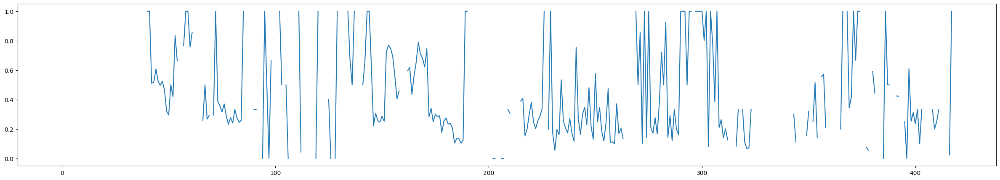

In [18]:
# show difficulty per question

success_by_attemp_df = success_by_attemp_df.sort_values(by='problem_id')
import matplotlib.pyplot as plt
import seaborn as sns

# plt.hist(success_by_attemp_df['percent']*100, bins=100)
plt.figure(figsize=(30,5))
success_by_attemp_df['percent'].plot(kind='line')
plt.show()

In [19]:
# Average student's correct rate
# correct:0/1

total_attemps = success_by_attemp_df['attempt_total'].sum()
correct_attemps = success_by_attemp_df['attempt_correct'].sum()
correct_attemps / total_attemps

0.2832284296609391

In [20]:
[] Average student success score per difficulty of the assignment
[] Average student success score per knowledge component
[] All above, per major

SyntaxError: invalid syntax (859997394.py, line 1)

# Data Source: Last submission 

In [ ]:
runs_df

In [18]:
sorted_runs_df = runs_df.sort_values(by='timestamp')

In [ ]:
sorted_runs_df

In [19]:
last_submission = sorted_runs_df.drop_duplicates(subset=['student_id', 'problem_id'], keep='last', inplace=False)
#last_submission = last_submission[['student_id','problem_id','score']]
last_submission

,id,student_id,course_id,problem_id,timestamp,score,code_hash
994992,994993,9d37a5e4-074f-4dc0-aef8-d52db1a75b07,2,lsn1_helloworld,2021-01-07 03:14:24,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48
994995,994996,03be3fc9-5d83-455a-9f80-8cc7b863e584,2,lsn1_helloworld,2021-01-07 10:25:37,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48
994999,995000,51a0f7f3-9299-436d-9761-ce93a51a4d82,2,lsn1_helloworld,2021-01-07 23:24:56,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48
995000,995001,56701cf8-353d-46d0-ad4b-6f6e9c0ffbc1,2,lsn1_helloworld,2021-01-08 01:38:47,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48
995004,995005,f4d0a556-ae0d-41be-afce-76e7e7b9644d,2,lsn1_helloworld,2021-01-08 03:03:26,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48
...,...,...,...,...,...,...,...
994978,994979,8a9837cb-a545-4eaa-90b0-d7e37caeadb2,5,IPO_listrange,2022-07-14 19:14:49,100,19367284d73d4d23bbc17a41d2a701bfa9e4ad0e
994980,994981,8a9837cb-a545-4eaa-90b0-d7e37caeadb2,5,conditional_uod,2022-07-14 20:13:59,100,a92fcfd0e57306f4074b635b8dcc510d6055c9f0
994982,994983,82ce4452-6d57-4329-9dd2-5a3246de3b94,5,lsn1_helloworld,2022-08-10 04:37:08,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48
994986,994987,0f45519b-550f-4ccc-9983-8e9d32e7dd9b,5,lsn1_helloworld,2022-08-11 18:09:27,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48


In [21]:
last_submission_with_max_score = pd.merge(last_submission, max_scores_df, on='problem_id', how='left')
last_submission_with_max_score

,id,student_id,course_id,problem_id,timestamp,score,code_hash,max_score,type
0,994993,9d37a5e4-074f-4dc0-aef8-d52db1a75b07,2,lsn1_helloworld,2021-01-07 03:14:24,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
1,994996,03be3fc9-5d83-455a-9f80-8cc7b863e584,2,lsn1_helloworld,2021-01-07 10:25:37,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
2,995000,51a0f7f3-9299-436d-9761-ce93a51a4d82,2,lsn1_helloworld,2021-01-07 23:24:56,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
3,995001,56701cf8-353d-46d0-ad4b-6f6e9c0ffbc1,2,lsn1_helloworld,2021-01-08 01:38:47,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
4,995005,f4d0a556-ae0d-41be-afce-76e7e7b9644d,2,lsn1_helloworld,2021-01-08 03:03:26,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
...,...,...,...,...,...,...,...,...,...
173269,994979,8a9837cb-a545-4eaa-90b0-d7e37caeadb2,5,IPO_listrange,2022-07-14 19:14:49,100,19367284d73d4d23bbc17a41d2a701bfa9e4ad0e,NaN,NaN
173270,994981,8a9837cb-a545-4eaa-90b0-d7e37caeadb2,5,conditional_uod,2022-07-14 20:13:59,100,a92fcfd0e57306f4074b635b8dcc510d6055c9f0,NaN,NaN
173271,994983,82ce4452-6d57-4329-9dd2-5a3246de3b94,5,lsn1_helloworld,2022-08-10 04:37:08,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
173272,994987,0f45519b-550f-4ccc-9983-8e9d32e7dd9b,5,lsn1_helloworld,2022-08-11 18:09:27,100,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab


In [22]:
# uniform the score
last_submission_with_max_score['score'] = 100 * last_submission_with_max_score['score']/last_submission_with_max_score['max_score']
last_submission_with_max_score

,id,student_id,course_id,problem_id,timestamp,score,code_hash,max_score,type
0,994993,9d37a5e4-074f-4dc0-aef8-d52db1a75b07,2,lsn1_helloworld,2021-01-07 03:14:24,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
1,994996,03be3fc9-5d83-455a-9f80-8cc7b863e584,2,lsn1_helloworld,2021-01-07 10:25:37,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
2,995000,51a0f7f3-9299-436d-9761-ce93a51a4d82,2,lsn1_helloworld,2021-01-07 23:24:56,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
3,995001,56701cf8-353d-46d0-ad4b-6f6e9c0ffbc1,2,lsn1_helloworld,2021-01-08 01:38:47,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
4,995005,f4d0a556-ae0d-41be-afce-76e7e7b9644d,2,lsn1_helloworld,2021-01-08 03:03:26,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
...,...,...,...,...,...,...,...,...,...
173269,994979,8a9837cb-a545-4eaa-90b0-d7e37caeadb2,5,IPO_listrange,2022-07-14 19:14:49,NaN,19367284d73d4d23bbc17a41d2a701bfa9e4ad0e,NaN,NaN
173270,994981,8a9837cb-a545-4eaa-90b0-d7e37caeadb2,5,conditional_uod,2022-07-14 20:13:59,NaN,a92fcfd0e57306f4074b635b8dcc510d6055c9f0,NaN,NaN
173271,994983,82ce4452-6d57-4329-9dd2-5a3246de3b94,5,lsn1_helloworld,2022-08-10 04:37:08,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
173272,994987,0f45519b-550f-4ccc-9983-8e9d32e7dd9b,5,lsn1_helloworld,2022-08-11 18:09:27,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab


In [23]:
# calculate the average student success score 

total_attempts = len(last_submission_with_max_score[last_submission_with_max_score['type']=='lab'])
success_attemps = len(last_submission_with_max_score[(last_submission_with_max_score['type']=='lab')&(last_submission_with_max_score['score']==100.0)])
total_success_rate = success_attemps / total_attempts
total_success_rate

0.8987637042220668

In [24]:
# calculate the average student success score 

total_attempts = len(last_submission_with_max_score[last_submission_with_max_score['type']=='skill'])
success_attemps = len(last_submission_with_max_score[(last_submission_with_max_score['type']=='skill')&(last_submission_with_max_score['score']==100.0)])
total_success_rate = success_attemps / total_attempts
total_success_rate

0.9109464139327121

In [25]:
last_submission_with_max_score['score'].sum() / total_attempts

244.8660097368377

# Success Rate by Type

In [26]:
# total (last) attemps by type 

lab_total = len(last_submission_with_max_score[last_submission_with_max_score['type']=='lab'])
project_total = len(last_submission_with_max_score[last_submission_with_max_score['type']=='project'])
skill_total = len(last_submission_with_max_score[last_submission_with_max_score['type']=='skill'])

lab_total, project_total, skill_total

(98601, 3190, 59773)

In [27]:
full_score_last_submission = last_submission_with_max_score[last_submission_with_max_score['score']==100.0]

lab_total_full_score = len(full_score_last_submission[full_score_last_submission['type']=='lab'])
project_total_full_score = len(full_score_last_submission[full_score_last_submission['type']=='project'])
skill_total_full_score = len(full_score_last_submission[full_score_last_submission['type']=='skill'])

lab_total_full_score, project_total_full_score, skill_total_full_score

(88619, 1280, 54450)

In [28]:
lab_last_attemp_sucess_rate = lab_total_full_score / lab_total
project_last_attemp_sucess_rate = project_total_full_score / project_total
skill_last_attemp_sucess_rate = skill_total_full_score / skill_total

project_last_attemp_sucess_rate, lab_last_attemp_sucess_rate, skill_last_attemp_sucess_rate

(0.4012539184952978, 0.8987637042220668, 0.9109464139327121)

# Average Score by Type

In [29]:
project_avg_score = last_submission_with_max_score[last_submission_with_max_score['type']=='project']['score'].sum()
project_avg_score /= project_total
project_avg_score

41.73354231974922

In [30]:
lab_avg_score = last_submission_with_max_score[last_submission_with_max_score['type']=='lab']['score'].sum()
lab_avg_score /= lab_total
lab_avg_score

91.0913682417014

In [31]:
skill_avg_score = last_submission_with_max_score[last_submission_with_max_score['type']=='skill']['score'].sum()
skill_avg_score /= skill_total
skill_avg_score

92.37525304067054

# Average Score by Person

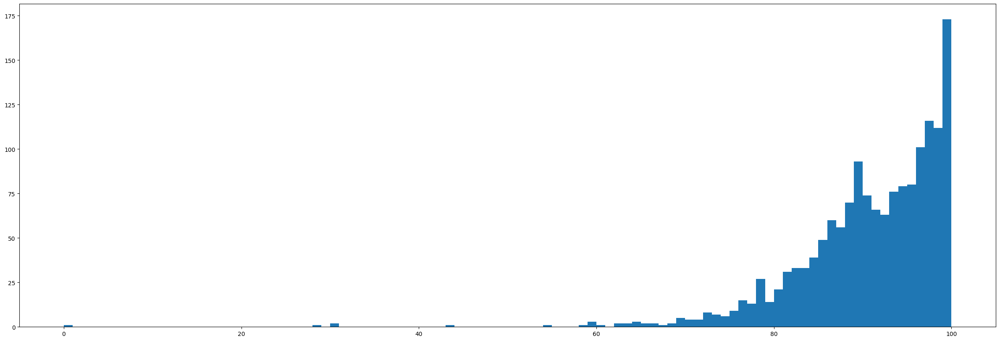

In [34]:
import matplotlib.pyplot as plt
avg_by_student = last_submission_with_max_score[['student_id','score']].groupby('student_id').mean().reset_index()[['student_id', 'score']].sort_values(by="score",ascending=True).reset_index()
plt.figure(figsize=(30,10))
plt.hist(avg_by_student['score'], bins=100)
plt.show()

# Success Rate by Person

In [35]:
success_attemp_by_student = last_submission_with_max_score[last_submission_with_max_score['score']==100.0][['student_id','score']].groupby('student_id').count().reset_index()
total_attemp_by_student = last_submission_with_max_score[['student_id','score']].groupby('student_id').count().reset_index()

In [36]:
success_attemp_by_student = pd.merge(success_attemp_by_student, total_attemp_by_student, on="student_id")
success_attemp_by_student['success_rate'] = success_attemp_by_student['score_x'] / success_attemp_by_student['score_y']

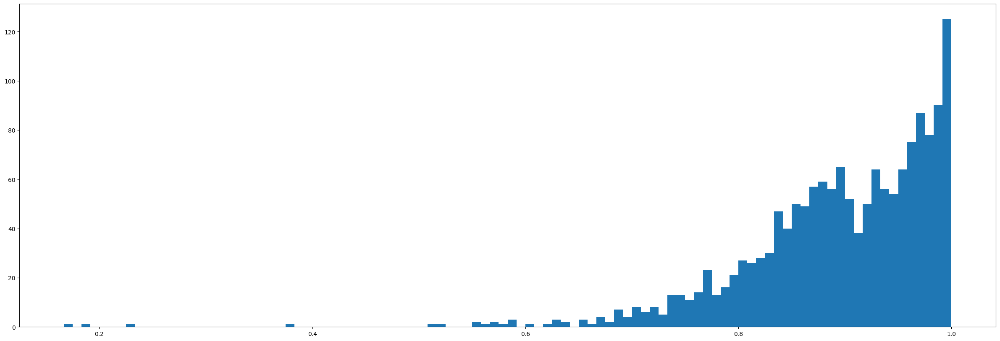

In [37]:
success_attemp_by_student
plt.figure(figsize=(30,10))
plt.hist(success_attemp_by_student['success_rate'], bins=100)
plt.show()

# Success Rate by Problem

In [38]:
# problem_id, problem_type, agent, agent_type, score/success-rate


In [39]:
success_rate_success_last_attemp = last_submission_with_max_score[(last_submission_with_max_score['score']==100.0) | (last_submission_with_max_score['max_score']==0)].groupby('problem_id')['score'].count()
success_rate_all_last_attemp = last_submission_with_max_score.groupby('problem_id')['score'].count()
success_rate_success_last_attemp = success_rate_success_last_attemp.reset_index().sort_values(by="problem_id")
success_rate_all_last_attemp = success_rate_all_last_attemp.reset_index().sort_values(by="problem_id")

success_rate_last_attemp = pd.merge(success_rate_all_last_attemp, success_rate_success_last_attemp, on="problem_id", how='left')
success_rate_last_attemp.rename(columns={'score_x': 'total_count'}, inplace=True)
success_rate_last_attemp.rename(columns={'score_y': 'full_score_count'}, inplace=True)
success_rate_last_attemp['success_rate'] = success_rate_last_attemp['full_score_count'] / success_rate_last_attemp['total_count']
success_rate_last_attemp = pd.merge(success_rate_last_attemp, max_scores_df, on="problem_id")
success_rate_last_attemp = success_rate_last_attemp[['problem_id','success_rate','type']]
success_rate_last_attemp

,problem_id,success_rate,type
0,Airstrike,NaN,project
1,FileIO_echo,0.957921,lab
2,FileIO_runways,0.943152,lab
3,FileIO_survivors_by_gender,0.866834,lab
4,FileIO_titanicfares,0.600000,lab
...,...,...,...
413,lsn9_skill2,0.992424,skill
414,lsn9_skill3,0.982323,skill
415,lsn9_triangle,0.972637,lab
416,pex1,0.911579,project


# Average Score by Problem

In [40]:
last_submission_with_max_score.fillna(value=0, inplace=True)
average_scores_last_attemp = last_submission_with_max_score.groupby('problem_id')['score'].mean()
average_scores_last_attemp = average_scores_last_attemp.reset_index().sort_values(by="problem_id")
average_scores_last_attemp = pd.merge(average_scores_last_attemp, max_scores_df, on="problem_id")
average_scores_last_attemp.rename(columns={'score': 'student_avg_score'}, inplace=True)
average_scores_last_attemp = average_scores_last_attemp[['problem_id','student_avg_score','type']]
average_scores_last_attemp.sort_values(by="problem_id")

,problem_id,student_avg_score,type
0,Airstrike,0.000000,project
1,FileIO_echo,95.792079,lab
2,FileIO_runways,94.315245,lab
3,FileIO_survivors_by_gender,87.060302,lab
4,FileIO_titanicfares,61.363636,lab
...,...,...,...
413,lsn9_skill2,99.242424,skill
414,lsn9_skill3,98.737374,skill
415,lsn9_triangle,98.383085,lab
416,pex1,96.869474,project


# Concept

In [41]:
def getConcepts(problem_id, df):
    """ 
        return a list of concepts that required for solving this problem 
    """
    concept_list = ['input_str', 'input_cast', 'output', 'assignment', 'conditional',
       'function_call', 'function_def', 'function_return', 'loop_counting',
       'loop_until', 'loop_elements', 'loop_nested', 'stat_calculate',
       'file_read', 'file_write', 'list', 'list_2d', 'dictionary', 'item_set',
       'tuple']
    return [concept for concept in concept_list if (df[df['problem_id']==problem_id][concept].iloc[0]==1)]

In [ ]:
getConcepts('a3_3_animals', problems_df)

In [ ]:
new_problems_df = problems_df.drop(['Unnamed: 0', 'course_id', 'exam', 'prompt', 'testcase'], axis=1)
new_problems_df

In [ ]:
# concept, total_problems, passed_problems
# hypothesis: result is related to the concept
# hypothesis: result is related to the prompt complexity, decompositions needed, num of sections
# hypothesis: result is related to whether the questions are already online

concept_df = 

# Export Data

In [ ]:
output_dir = "/Users/xrw/Desktop/learnlab2023-main/outputs/"

In [ ]:
# scatterplot data

average_scores_last_attemp.to_csv(output_dir+"scatterplot_avg_score_student_data.csv")
success_rate_last_attemp.to_csv(output_dir+"scatterplot_success_rate_student_data.csv")

In [ ]:
# bar chart by problem type data

avg_by_type_df = pd.DataFrame(data={'project_avg_score':[project_avg_score], 'lab_avg_score':[lab_avg_score], 'skill_avg_score':[skill_avg_score]})
avg_by_type_df.to_csv(output_dir+"barchart_avg_by_type_student_data.csv")

success_rate_by_type_df = pd.DataFrame(data={'project_avg_score':[project_last_attemp_sucess_rate], 'lab_avg_score':[lab_last_attemp_sucess_rate], 'skill_avg_score':[skill_last_attemp_sucess_rate]})
success_rate_by_type_df.to_csv(output_dir+"barchart_success_rate_by_type_student_data.csv")


In [ ]:
# success_attemp_by_student = success_attemp_by_student[['student_id','success_rate']]
success_attemp_by_student.to_csv(output_dir+'curveplot_success_rate_by_type_student_data.csv')

In [ ]:
# avg_by_student = avg_by_student[['student_id','score']]
avg_by_student.to_csv(output_dir+'curveplot_avg_by_type_student_data.csv')

In [ ]:
gpt3_result = pd.read_csv(output_dir+'gpt-3.5-turbo_v1_result_new.csv')
gpt4_result = pd.read_csv(output_dir+'gpt-4_v1_result_new.csv')

In [ ]:
gpt3_result.group

In [ ]:
skill_list = ['input_str', 'input_cast', 'output', 'assignment', 'conditional',
       'function_call', 'function_def', 'function_return', 'loop_counting',
       'loop_until', 'loop_elements', 'loop_nested', 'stat_calculate',
       'file_read', 'file_write', 'list', 'list_2d', 'dictionary', 'item_set',
       'tuple']

gpt3_success_rate_data = {}
gpt3_avg_data = {}
for skill in skill_list:
    
#     success rate

    full_score_count = len(gpt3_result[(gpt3_result[skill]==1) & (gpt3_result['score']==100)])
    total_count = len(gpt3_result[gpt3_result[skill]==1])
    success_rate = full_score_count / total_count
    gpt3_success_rate_data[skill] = [success_rate]
    
#     avg score
    mean_score = gpt3_result[gpt3_result[skill]==1]['score'].sum() / total_count
    gpt3_avg_data[skill] = [mean_score]
    

In [ ]:
gpt3_success_rate_df = pd.DataFrame(data=gpt3_success_rate_data)
gpt3_avg_df = pd.DataFrame(data=gpt3_avg_data)

In [ ]:
gpt3_success_rate_df

In [ ]:
gpt3_avg_df

In [51]:
gpt4_success_rate_data = {}
gpt4_avg_data = {}

for skill in skill_list:
    
#     success rate
    full_score_count = len(gpt4_result[(gpt4_result[skill]==1) & (gpt4_result['score']==100)])
    total_count = len(gpt4_result[gpt4_result[skill]==1])
    success_rate = full_score_count / total_count
    gpt4_success_rate_data[skill] = [success_rate]
    
#     avg score
    mean_score = gpt4_result[gpt4_result[skill]==1]['score'].sum() / total_count
    gpt4_avg_data[skill] = [mean_score]

gpt4_success_rate_df = pd.DataFrame(data=gpt4_success_rate_data)
gpt4_avg_df = pd.DataFrame(data=gpt4_avg_data)

NameError: name 'gpt4_result' is not defined

In [ ]:
gpt4_success_rate_df
# gpt4_success_rate_df.plot(kind='bar')

In [ ]:
gpt4_avg_df

In [ ]:
runs_df

In [43]:
last_submission_with_max_score

,id,student_id,course_id,problem_id,timestamp,score,code_hash,max_score,type
0,994993,9d37a5e4-074f-4dc0-aef8-d52db1a75b07,2,lsn1_helloworld,2021-01-07 03:14:24,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
1,994996,03be3fc9-5d83-455a-9f80-8cc7b863e584,2,lsn1_helloworld,2021-01-07 10:25:37,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
2,995000,51a0f7f3-9299-436d-9761-ce93a51a4d82,2,lsn1_helloworld,2021-01-07 23:24:56,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
3,995001,56701cf8-353d-46d0-ad4b-6f6e9c0ffbc1,2,lsn1_helloworld,2021-01-08 01:38:47,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
4,995005,f4d0a556-ae0d-41be-afce-76e7e7b9644d,2,lsn1_helloworld,2021-01-08 03:03:26,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
...,...,...,...,...,...,...,...,...,...
173269,994979,8a9837cb-a545-4eaa-90b0-d7e37caeadb2,5,IPO_listrange,2022-07-14 19:14:49,0.0,19367284d73d4d23bbc17a41d2a701bfa9e4ad0e,0.0,0
173270,994981,8a9837cb-a545-4eaa-90b0-d7e37caeadb2,5,conditional_uod,2022-07-14 20:13:59,0.0,a92fcfd0e57306f4074b635b8dcc510d6055c9f0,0.0,0
173271,994983,82ce4452-6d57-4329-9dd2-5a3246de3b94,5,lsn1_helloworld,2022-08-10 04:37:08,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab
173272,994987,0f45519b-550f-4ccc-9983-8e9d32e7dd9b,5,lsn1_helloworld,2022-08-11 18:09:27,100.0,fd33bd9d99b831ef98d0688e50a35ba6045b3d48,100.0,lab


In [47]:
problems_df = problems_df.rename(columns={"id": "problem_id"})
problems_df

,Unnamed: 0,problem_id,course_id,type,exam,prompt,testcase,max_score,input_str,input_cast,...,loop_nested,stat_calculate,file_read,file_write,list,list_2d,dictionary,item_set,tuple,skeleton
0,0,a3_3_animals,2,skill,1,<div>\n<p>&nbsp;</p>\n<p><strong>PROBLEM STATE...,"from cs110 import autograder\r\nimport random,...",100,0,0,...,0,0,0,0,1,0,0,0,0,# AUTOGRADER IMPORT REMOVED\n\n# -------------...
1,1,a3_1_cargo,2,skill,1,<div>\n<p>&nbsp;</p>\n<p><strong>PROBLEM STATE...,"from cs110 import autograder\nimport random, m...",100,0,1,...,0,0,0,0,1,0,0,0,0,NaN
2,2,a3_3_games,2,skill,1,<div>\n<p>&nbsp;</p>\n<p><strong>PROBLEM STATE...,"from cs110 import autograder\r\nimport random,...",100,0,0,...,0,0,0,0,0,0,0,0,0,# AUTOGRADER IMPORT REMOVED\n\n# -------------...
3,3,a3_4_heights,2,skill,1,<div>\n<p>&nbsp;</p>\n<p><strong>PROBLEM STATE...,"from cs110 import autograder\r\nimport random,...",100,0,0,...,0,0,0,0,0,0,0,0,0,NaN
4,4,pex3,2,project,0,"<div>\n <h2 style=""text-align: center;"">Com...","from cs110 import autograder\r\nimport random,...",0,0,0,...,1,0,0,0,1,1,0,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
656,656,a1_1_icbm,4,skill,1,<div>\n<p>&nbsp;</p>\n<p><strong>PROBLEM STATE...,"#import cs110,\r\nimport random, math\r\nfrom ...",100,1,1,...,0,0,0,0,0,0,0,0,0,NaN
657,657,a1_1_dorms,4,skill,1,<div>\n<p>&nbsp;</p>\n<p><strong>PROBLEM STATE...,"from cs110 import autograder\nimport random, m...",100,1,1,...,0,0,0,0,0,0,0,0,0,NaN
658,658,a1_1_cadet,4,skill,1,<div><strong>PROBLEM STATEMENT:<br></strong></...,"#import cs110,\r\nimport random, math\r\nfrom ...",100,1,1,...,0,0,0,0,0,0,0,0,0,NaN
659,659,a1_1_bases,4,skill,1,<div>\n<p>&nbsp;</p>\n<p><strong>PROBLEM STATE...,"from cs110 import autograder\r\nimport random,...",100,1,1,...,0,0,0,0,0,0,0,0,0,NaN


In [48]:
last_submission_with_max_score = pd.merge(last_submission_with_max_score, problems_df, on="problem_id")

In [52]:
skill_list = ['input_str', 'input_cast', 'output', 'assignment', 'conditional',
       'function_call', 'function_def', 'function_return', 'loop_counting',
       'loop_until', 'loop_elements', 'loop_nested', 'stat_calculate',
       'file_read', 'file_write', 'list', 'list_2d', 'dictionary', 'item_set',
       'tuple']

student_success_rate_data = {}
student_avg_data = {}

for skill in skill_list:
    
#     success rate
    full_score_count = len(last_submission_with_max_score[(last_submission_with_max_score[skill]==1) & (last_submission_with_max_score['score']==100)])
    total_count = len(last_submission_with_max_score[last_submission_with_max_score[skill]==1])
    success_rate = full_score_count / total_count
    student_success_rate_data[skill] = [success_rate]
    
#     avg score
    mean_score = last_submission_with_max_score[last_submission_with_max_score[skill]==1]['score'].sum() / total_count
    student_avg_data[skill] = [mean_score]

student_success_rate_df = pd.DataFrame(data=student_success_rate_data)
student_avg_df = pd.DataFrame(data=student_avg_data)

In [53]:
student_success_rate_df

,input_str,input_cast,output,assignment,conditional,function_call,function_def,function_return,loop_counting,loop_until,loop_elements,loop_nested,stat_calculate,file_read,file_write,list,list_2d,dictionary,item_set,tuple
0,0.812491,0.882863,0.865179,0.869756,0.83767,0.874158,0.888322,0.854004,0.885405,0.832815,0.757226,0.388033,0.79352,0.793083,0.891376,0.782841,0.835248,0.841383,0.914242,0.951075


In [55]:
student_avg_df

,input_str,input_cast,output,assignment,conditional,function_call,function_def,function_return,loop_counting,loop_until,loop_elements,loop_nested,stat_calculate,file_read,file_write,list,list_2d,dictionary,item_set,tuple
0,82.194094,89.772898,88.161736,88.147252,85.772944,88.583359,89.476906,86.155172,90.057146,84.137347,77.440471,39.143699,81.428954,80.575401,89.383188,80.508858,84.711065,84.982008,92.055896,95.902995
